# Udacity Self-Driving Car Nanodegree

## P4 Advanced Lane Finding

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project. Check out the writeup template for this project and use it as a starting point for creating your own writeup.

## Creating a great writeup:
___
A great writeup should include the rubric points as well as your description of how you addressed each point. You should include a detailed description of the code used in each step (with line-number references and code snippets where necessary), and links to other supporting documents or external references. You should include images in your writeup to demonstrate how your code works with examples.

All that said, please be concise! We're not looking for you to write a book here, just a brief description of how you passed each rubric point, and references to the relevant code :).

You're not required to use markdown for your writeup. If you use another method please just submit a pdf of your writeup.
## The Project
___
The goal of this project is to write a software pipeline to identify the lane boundaries in a video.

Proposed steps of this project are the following:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a threshold binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boudnaries and numerical estimation of lane curvature and vehicle position.

The images for camera calibration are stored in the folder called `camera_cal`. The images in `test_images` are for testing your pipeline on single frames. If you want to extract more test images from the videos, you can simply use an image writing method like `cv2.imwrite()`, i.e., you can read the video in frame by frame as usual, and for frames you want to save for later you can write to an image file.

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called `ouput_images`, and include a description in your writeup for the project of what each image shows. The video called `project_video.mp4` is the video your pipeline should work well on.

The `challenge_video.mp4` video is an extra (and optional) challenge for you if you want to test your pipeline under somewhat trickier conditions. The `harder_challenge.mp4` video is another optional challenge and is brutal!

If you're feeling ambitious (again, totally optional though), don't stop there! We encourage you to go out and take video of your own, calibrate your camera and show us how you would implement this project from scratch!

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

Apply a distortion correction to raw images.

Use color transforms, gradients, etc., to create a threshold binary image.

Apply a perspective transform to rectify binary image ("birds-eye view").

Detect lane pixels and fit to find the lane boundary.

Determine the curvature of the lane and vehicle position with respect to center.

Warp the detected lane boundaries back onto the original image.

Output visual display of the lane boudnaries and numerical estimation of lane curvature and vehicle position.

# Imports

In [1]:
import numpy as np
import cv2
import pickle
import glob

import scipy
import PIL

import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

print('...')

...


# Display Available Test Images
Comprised of 8 images; 2 among them with straight lane sepments; 6 with curved lane segments, we're informed are of a 1km radius.

...
Test Images


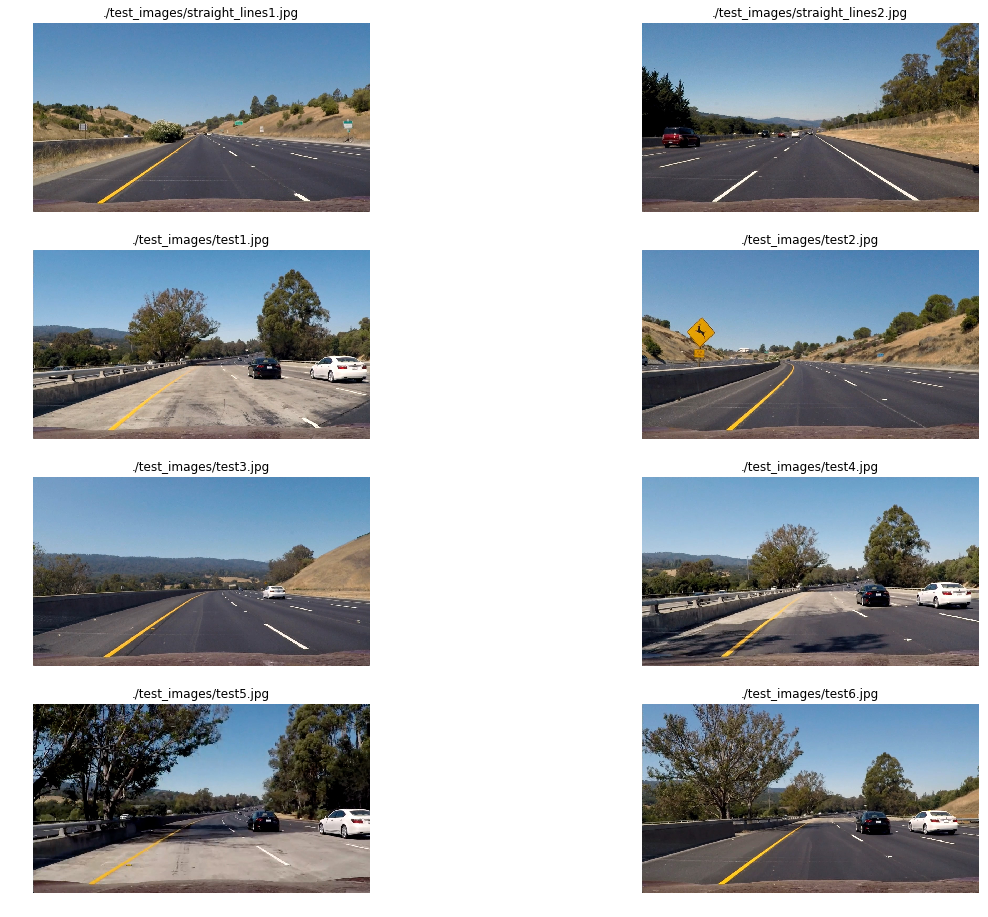

In [2]:
images = glob.glob('./test_images/*.jpg')

# Prepare display.
fig, axs = plt.subplots(4,2, figsize=(20, 16))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw and display the test images.
    axs[i].axis('off')
    axs[i].set_title(fname)
    axs[i].imshow(img)

print('...')
print('Test Images')

# Step 1 of 6: Camera Calibration
## Finding Corners

...
Successfully found the expected number of corners in 17 of the 20 images.
...could not find the expected corners for 3 of the images
...where the expected number of corners is 9x6 or 54


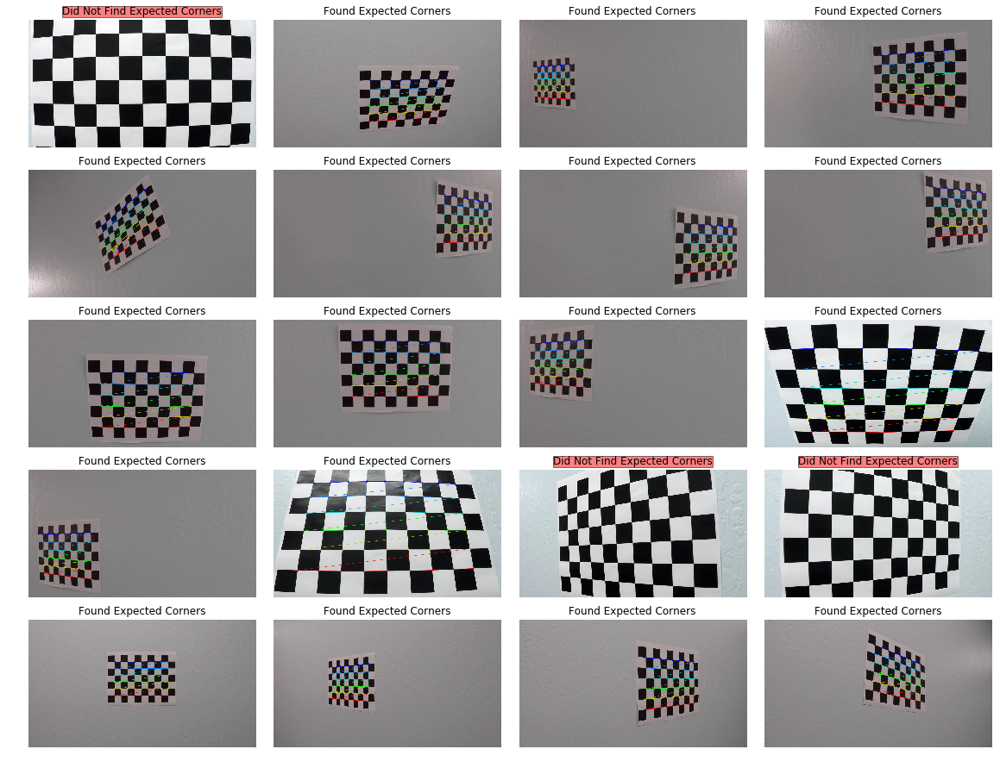

In [3]:
# Prepare object points.
nx = 9 # The number of inside corners in x.
ny = 6 # The number of inside corners in y.

# Make a list of calibration images.
images = glob.glob('./camera_cal/calibration*.jpg')

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane.

# Prepare display.
fig, axs = plt.subplots(5,4, figsize=(20, 16))
fig.subplots_adjust(hspace = .001, wspace=.08)
axs = axs.ravel()

# Step through the list and search for chessboard corners
nimages = len(images)
nuseful_images = 0 # Where a useful_image is one where the expected number of corners could be found.
nbroken_images = 0 # Where a broken_image is one where the expected number of corners could not be found.
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners.
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points.
    # If found, draw corners.
    if ret == True:
        nuseful_images += 1
        objpoints.append(objp)

        # this step to refine image points was taken from:
        # http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)
    
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        axs[i].set_title('Found Expected Corners')
        axs[i].axis('off')
        axs[i].imshow(img)
    else:
        nbroken_images += 1
        axs[i].set_title('Did Not Find Expected Corners', bbox={'facecolor':'red', 'alpha':0.5, 'pad':0})
        
        axs[i].axis('off')
        axs[i].imshow(img)

print('...')

# Print results.
if nuseful_images > 0:
    print('Successfully found the expected number of corners in %01d of the %01d images.' % (nuseful_images, nimages))

if nbroken_images > 0:
    print('...could not find the expected corners for %01d of the images' % (nbroken_images))
    
print('...where the expected number of corners is %01dx%01d or %01d' % (nx, ny, nx*ny))

# Step 2 of 6: Correcting for Distortion (on calibration image)

...
mtx: [[  1.15693581e+03   0.00000000e+00   6.65950782e+02]
 [  0.00000000e+00   1.15213336e+03   3.88784060e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
dist: [[ -2.37640816e-01  -8.53716910e-02  -7.90993821e-04  -1.15659394e-04
    1.05673882e-01]]


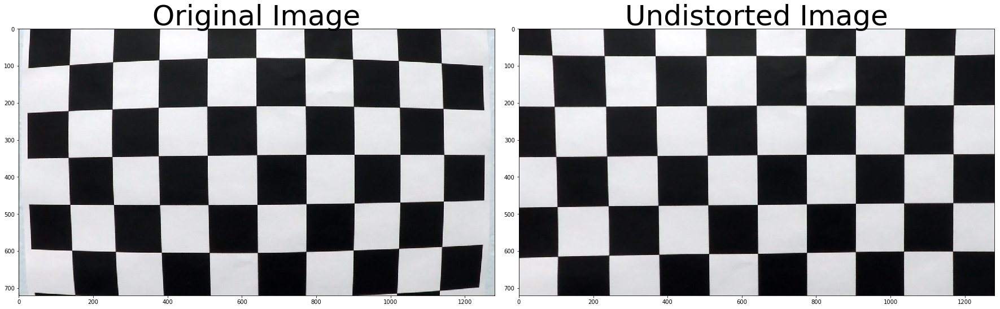

In [4]:
# Read in an image
# img: Sample image read from among the camera calibration images.
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Camera calibration.
# ret:
# mtx: camera calibration matrix
# dst:
# rvecs:
# tvecs:

# objpoints and imgpoints are needed to calibrate the camera.
# mtx and dist are needed by the cv.undistort() function to undistort an image.
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Distortion correction.
# undist_img: undistorted image
undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    
# Display
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Save images.
distort_input = PIL.Image.fromarray(img)
distort_input.save('./output_images/a_distorted_input.jpg', 'JPEG')

undistort_output = PIL.Image.fromarray(undist_img)
undistort_output.save('./output_images/ab_undistorted_output.jpg', 'JPEG')

print('...')
print('mtx:',mtx)
print('dist:',dist)

The first two steps (1 and 2 of 6) only have to be done once and apply for steps 3 - 6 of the six steps.

# Pipeline (steps 2 - 6 of the six steps)
Once completed, there is no need to repeat step 1.

## Choose an Image to Use
We can change the selected image to test the pipeline on various road and environmental conditions.
A straight lane image with a yellow line may be best, at first, for desigining the pipeline. The straight lines will afford an easy benchmark for creating the polygon used in the perspective transform. It also provides a yellow lane line in the first image, which offers color variation. The curved-lane images will provide an opportunity to fit polygons (for the lane lines) to curves and the curved-lane images look to offer shaded and marred road surface conditions, which will challenge the algorithm.

...


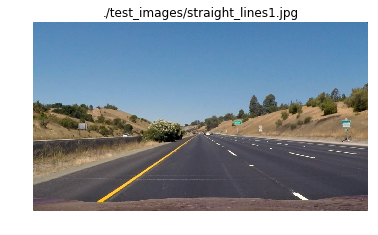

In [5]:
test_image_path = './test_images/straight_lines1.jpg'
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.title(test_image_path)
plt.imshow(test_image)

print('...')

# Step 2 of 6: Correction for Distortion
Undistort the image using the camera calibration matrix from the initial step (step 1, above) in the process.

In [6]:
def undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

print('...')

...


### Plot the Original and Correction for Distortion Images
It is important to correct for distortion to provide an accurate source for finding and fitting lane lines.

...


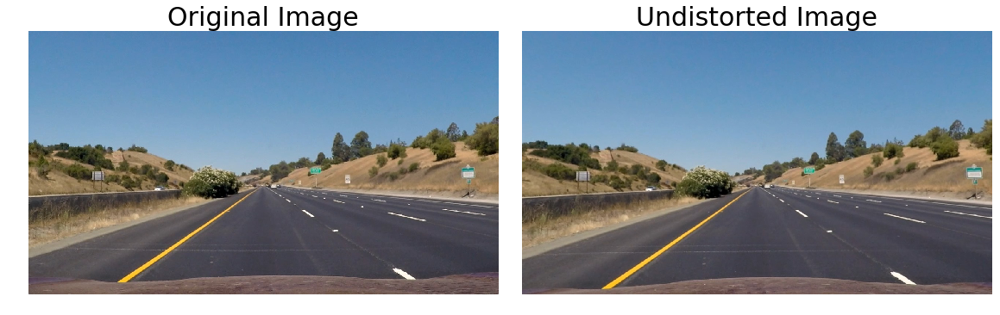

In [7]:
undistorted_image = undistort(test_image)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.axis('off')
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=30)
ax2.axis('off')
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=30)

# Save image.
distortion_corrected = PIL.Image.fromarray(undistorted_image)
distortion_corrected.save('./output_images/b_distortion_corrected.jpg', 'JPEG')

print('...')

# Step 3 of 6: Gradient/Color Thresholding
Implement gradient and color thresholding to detect steep edges that are more likely to be lane lines. This step will present several gradient thresholding segments and color spaces and thresholding segments. This step is used for experimentation (along with those performed in the course) to determine the optimal combination of gradient, color space and thresholding choices leading into step 4.

**Once an optimal combination of gradient thresholding, color space and color space thresholding is determined, the resultant combination of choices is the one that will be included as part of the final image processing implementation rather than each of the segments shown in this step 3.**
### Gradient Thresholds
#### Directional Gradient (Sobel)
Take the gradient of an image in x or y and identify pixels where the gradient of the image falls within a specified range.

In [8]:
#image = np.copy(undistorted_image)

# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', abs_sobel_thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_image = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_image[(scaled_sobel >= abs_sobel_thresh[0]) & (scaled_sobel <= abs_sobel_thresh[1])] = 1

    # Return the result
    return binary_image

print('...')

...


#### Run and Display Directional Gradient (Sobel)

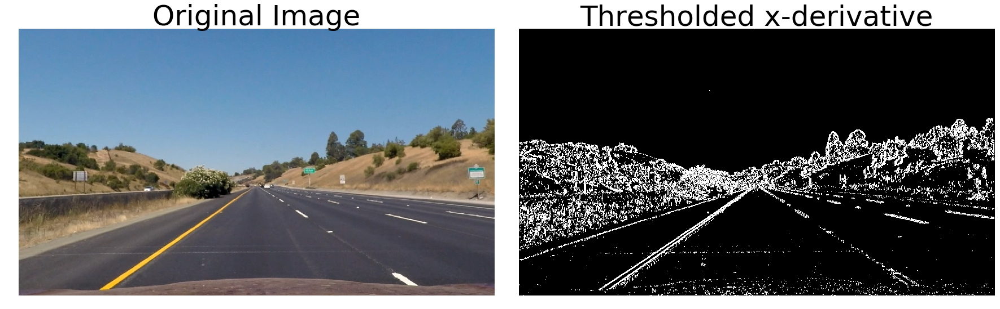

In [9]:
# Run the function
grad_binary = abs_sobel_thresh(undistorted_image, orient='x', abs_sobel_thresh=(9,100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.axis('off')
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=50)
ax2.axis('off')
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded x-derivative', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Gradient Magnitude
Apply a threshold to the overall magnitude of the gradient of the image, in both x and y.

In [10]:
#image = np.copy(undistorted_image)

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_image = np.zeros_like(gradmag)
    binary_image[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_image

print('...')

...


#### Run and Display Gradient Magnitude

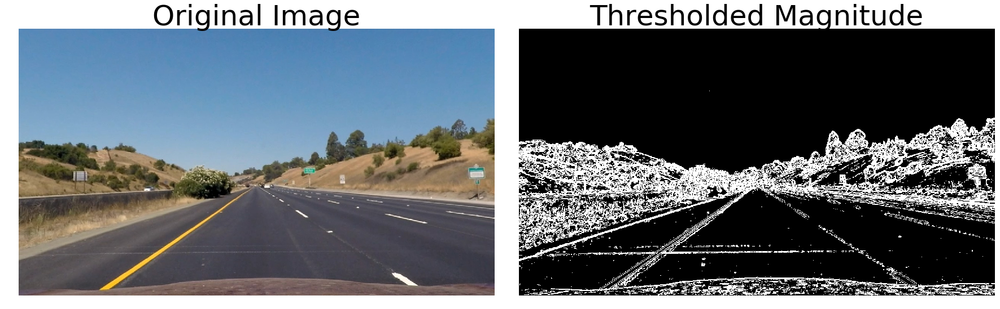

In [11]:
# Run the function
# mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
mag_binary = mag_thresh(undistorted_image, sobel_kernel=3, mag_thresh=(10, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.axis('off')
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=50)
ax2.axis('off')
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Gradient Direction
Explore the direction, or orientation, of the gradient. Compute the direction of the gradient and apply a threshold. The direction of the gradient is much noisier than the gradient magnitude, but particular features can be isolated by orientation.

In [12]:
#image = np.copy(undistorted_image)

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_image =  np.zeros_like(absgraddir)
    binary_image[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_image

print('...')

...


#### Run and Display Gradient Direction

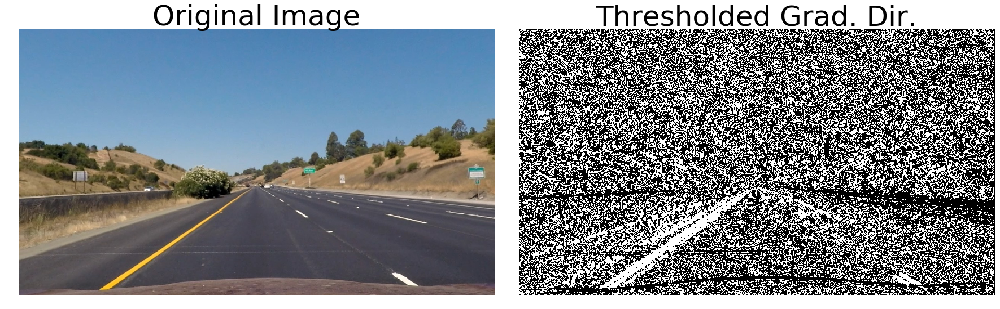

In [13]:
# Run the function
dir_binary = dir_threshold(undistorted_image, sobel_kernel=15, thresh=(0.7, 1.3))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.axis('off')
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=50)
ax2.axis('off')
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Combining Gradient Thresholds
Use thresholds of the x and y gradients, the overall gradient magnitdue, and the gradient direction to focus on pixels that are likely to be part of the lane lines.

...


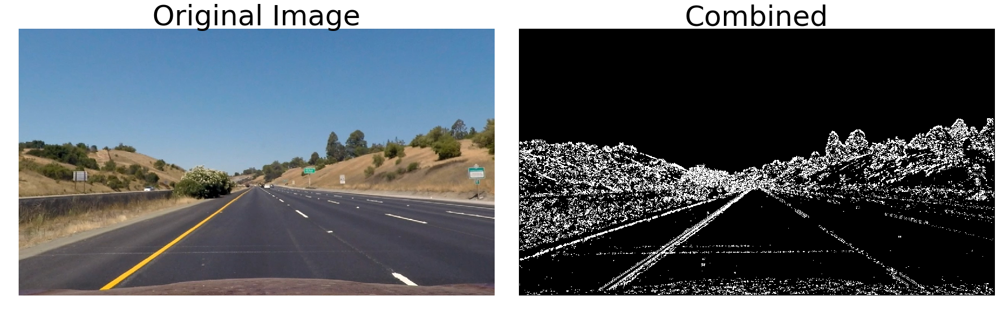

In [14]:
#image = np.copy(undistorted_image)

# Choose a Sobel kernel size
#ksize = 15 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(undistorted_image, orient='x', abs_sobel_thresh=(9, 100))
grady = abs_sobel_thresh(undistorted_image, orient='y', abs_sobel_thresh=(9, 100))
mag_binary_image = mag_thresh(undistorted_image, sobel_kernel=3, mag_thresh=(10, 100))
dir_binary_image = dir_threshold(undistorted_image, sobel_kernel=15, thresh=(0.7, 1.3))

# Test combinations.
combined_threshold_image = np.zeros_like(dir_binary_image)
combined_threshold_image[((gradx == 1) & (grady == 1)) | ((mag_binary_image == 1) & (dir_binary_image == 1))] = 1
# combined[(dir_binary_image == 1)] = 1
#combined[((mag_binary_image == 1) & (dir_binary_image ==1))] = 1

# Plot the result.
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.axis('off')
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=50)
ax2.axis('off')
ax2.imshow(combined_threshold_image, cmap='gray')
ax2.set_title('Combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

print('...')

#### Color Spaces and Thresholds
The S-channel does a robust job of picking up the lines under very different color and constrast conditions.
The S-channel is preferable because it is more robust to changing conditions.

In [15]:
#image = np.copy(undistorted_image)

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    binary_image = np.zeros_like(hls[:,:,2])
    binary_image[(hls[:,:,2] > thresh[0]) & (hls[:,:,2] <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    
    return binary_image

print('...')

...


#### Run and Display Color Spaces and Thresholds

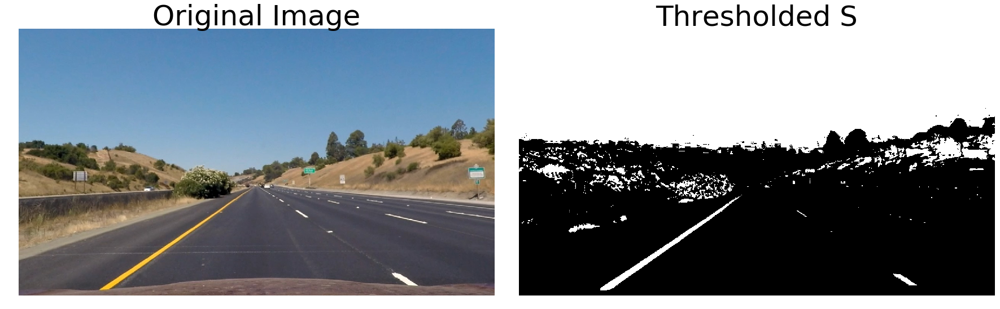

In [16]:
hls_binary = hls_select(undistorted_image, thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.axis('off')
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=50)
ax2.axis('off')
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Combined Gradient Thresholds and Color Space Thresholds
Taking into account knowledge gained from the preceding gradient and color space investigations, the threshold function will be used in the final processing of an image.

**This implementation is the one to be used in the image processing.**

In [17]:
#image = np.copy(undistorted_image)

def threshold(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    # img: an image to process; a video frame image
    # s_thresh: color channel threshold bounds
    # sx_thresh: gradient threshold bounds
    
    img = np.copy(img)
    
    # Undistort the test image.
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert to HLS color space and separate the L and S channels.
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1] # To use in the Sobel calcualation, rather than grayscale.
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sx_binary = np.zeros_like(scaled_sobel)
    sx_binary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sx_binary), sx_binary, s_binary))
    
    combined_binary = np.zeros_like(sx_binary)
    combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
    
    # combined_binary: resultant image of combined S-channel and gradient thresholds application
    return combined_binary

print('...')

...


## Run and Display Combined Gradient Thresholds and Color Space Thresholds

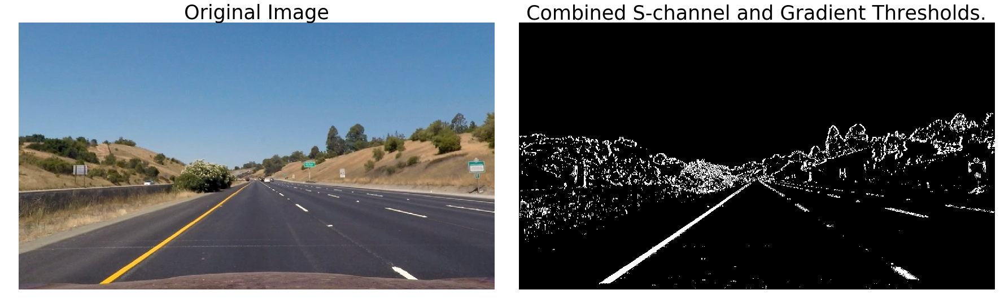

In [18]:
# Resultant image.
# result = pipeline(image)
# thresholded_image = threshold(test_image, s_thresh=(170, 255), sx_thresh=(20, 100))
thresholded_image = threshold(test_image)

# Plot the original and resultant image.
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_image)
ax1.set_title('Original Image', fontsize=35)
ax1.axis('off')
ax2.imshow(thresholded_image, cmap='gray')
ax2.axis('off')
ax2.set_title('Combined S-channel and Gradient Thresholds.', fontsize=35)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Save image.
plt.imsave('./output_images/thresholded_image.png', np.array(thresholded_image).reshape(720,1280), cmap='gray')

### Display All Test and Corresponding Thresholded Images
This segment provides an opportunity to investigate the incomplete pipeline on all the test images. Verify that lane lines (yellow and white) are discernible and there isn't too much noise (anything other than lane lines) that could interfere with the algorithm finding the lane lines.

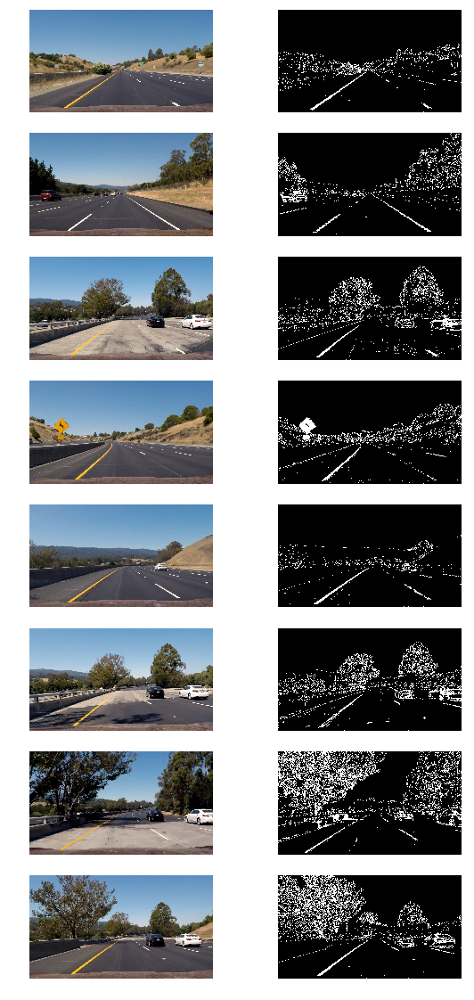

In [19]:
# Compile test image.
test_images = glob.glob('./test_images/*.jpg')
                                          
# Set up the plot.
fig, axs = plt.subplots(len(test_images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in test_images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    thresholded_image = threshold(img)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(thresholded_image, cmap='gray')
    axs[i].axis('off')
    i += 1

# Step 4 of 6: Perspective Transform
Employing a bird's-eye-view perspective will make it easier to overlay roads on maps and detect lane curvature.
A perspective transform allows us to more easily fit a polynomial to lane lines.

In the first segments, an investigation into buidling a function to warp an image will be conducted. Once a solution is gleaned, a function will be implemented to perform a top-down or bird's-eye-view transform on an image. This function will be used in the final image processing.

**The warp_thresholded_image() function is used for investigation; it will not be part of any final function to produce a result.**

In [20]:
def warp_thresholded_image(img, src, dst):
    # img: thresholded image
    # src corners of source polygon for the transformation
    # dst: corners of destination polygon for the transformation
    
    h,w = img.shape[:2]
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse transformation matrix.
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view.
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    
    # warped: transformed image
    # M: perspective transform matrix
    # Minv: inverse perspective transform matrix
    return warped, M, Minv

print('...')

...


#### Define src and dst Points for the Perspective Transform

In [21]:
# Define the source and destination points for the perspective transform.
# These points define polygons used in the perspective transform.
# The src polygon define the lane on a straight line image.
# The dst polygon deine the shape we'd like the src polygon to be in the transformed image.
src_top_left = (575,464) # 464 is the y-value for the top of the lane polygon.
src_top_right = (707,464)
src_bottom_left = (201,720) # 720 is the y-value for the bottom of the image/ bottom of the lane polygon.
src_bottom_right = (1104,720)
# From this, the equations for the left and right lane lines are:
# left lane line: y = -0.68x + 857.58
# right lane line: y = 0.64x + 8.10
# solving for x:
# -0.68x + 857.58 = 0.64x + 8.10
# The left and right lane lines intersect at:
# (x, y): (643.55, 419.97)
# The center of the image is:
# (x, y): (640, 360)
# The base of the source polygon is: 903 pixels wide.
# We know, from the U.S. government specifications for highway curvature, require a minimum lane width
# of 12 feet or 3.7 meters and dashed lane lines that of 10 feet or 3 meters length.


# h is the height of the image and is 720 for the test images.
# w is the width of the image and is 1280 for the test images.
h,w = thresholded_image.shape[:2]

# Source polygon.
# The width at the top of this polygon is 132 pixels.
# The width at the bottom of this polybon is 903 pixels.
# The height of this polygon is 256 pixels.
src = np.float32([src_top_left,
                  src_top_right,
                  src_bottom_left,
                  src_bottom_right])

# Destination (post-tranformation image) polygon.
# The width at the top of this polygon is 380 pixels.
# The width at the bottom of this polybon is 380 pixels.
# The height of this polygon is 720 pixels.

# Choosing adj for dst polygon:
# A samller adj results in a wide dst polygon, which may cut-off lane lines.
# A larger adj results in a narrow dst polygon, which, also, may cut-off lane lines.
# Choose an adj such that optimal points for lane lines are produced.
adj = 450
dst = np.float32([(adj,0),
                  (w-adj,0),
                  (adj,h),
                  (w-adj,h)])

# Logs
# print('Logs:')
# print('image height and width:',h,w)
# print('src:',src)
# print('dst:',dst)
# print('center x-vlaue of the image is:', w/2)
# print('center x-value of the src polygon:', ((src_bottom_right[0]-src_bottom_left[0])/2)+src_bottom_left[0])
# print('center x-value of the dst polygon:', ((w-2*adj)/2)+adj)
# print('src polygon base width in pixels:', src_bottom_right[0]-src_bottom_left[0])

print('...')

...


#### Run and Display Results of warp_thresholded()

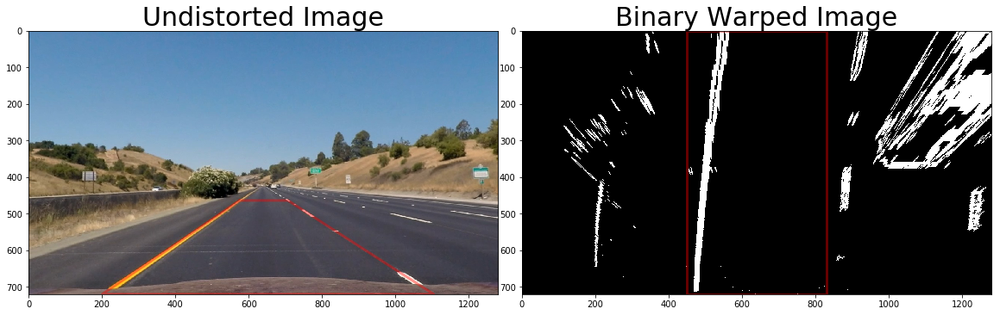

In [22]:
# Use the thresholded image produced in step 3 to advance the pipeline, producing a binary warped image in this, step 4.
binary_warped_image, M, Minv = warp_thresholded_image(thresholded_image, src, dst)

h,w = binary_warped_image.shape[:2]

# Visualize warp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)

#ax1.axis('off')
src_x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
src_y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(src_x, src_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image', fontsize=30)
ax1.imshow(undistorted_image)

#ax2.axis('off')
dst_x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
dst_y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
ax2.plot(dst_x, dst_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.set_ylim([h,0])
ax2.set_xlim([0,w])
ax2.set_title('Binary Warped Image', fontsize=30)
ax2.imshow(binary_warped_image, cmap='gray')

## warp() Function
This pipeline performs steps 2-4 of the eventual 6-step pipeline. Given an image, it produces a binary warped image, which can then be used to find lane lines to which to fit the 2nd-order polynomials representing the lane lines. The work done above is incorporated into this pipeline function. An image that has had a perspective transform applied to it, is often referred to as a warped image. The warp function applies a top-down or bird's-eye-view perspective transform to an image.

In [23]:
def warp(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    # img: an image to process; a video frame image
    # s_thresh: color channel threshold bounds
    # sx_thresh: gradient threshold bounds
    
    img = np.copy(img)
    
    #####
    # Undistort the test image.
#     img = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted_image = undistort(img)
    
    # Combined gradient, color space, thresholds.
    # Convert to HLS color space and separate the L and S channels.
    hls = cv2.cvtColor(undistorted_image, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1] # To use in the Sobel calcualation, rather than grayscale.
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sx_binary = np.zeros_like(scaled_sobel)
    sx_binary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sx_binary), sx_binary, s_binary))
    
    combined_binary = np.zeros_like(sx_binary)
    combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
    #####
    
    # Define the source and destination points for the perspective transform.
    # These points define polygons used in the perspective transform.
    # The src polygon define the lane on a straight line image.
    # The dst polygon deine the shape we'd like the src polygon to be in the transformed image.
    src_top_left = (575,464) # 464 is the y-value for the top of the lane polygon.
    src_top_right = (707,464)
    src_bottom_left = (201,720) # 720 is the y-value for the bottom of the image/ bottom of the lane polygon.
    src_bottom_right = (1104,720)
    # From this, the equations for the left and right lane lines are:
    # left lane line: y = -0.68x + 857.58
    # right lane line: y = 0.64x + 8.10
    # solving for x:
    # -0.68x + 857.58 = 0.64x + 8.10
    # The left and right lane lines intersect at:
    # (x, y): (643.55, 419.97)
    # The center of the image is:
    # (x, y): (640, 360)
    # The base of the source polygon is: 903 pixels wide.
    # We know, from the U.S. government specifications for highway curvature, require a minimum lane width
    # of 12 feet or 3.7 meters and dashed lane lines that of 10 feet or 3 meters length.

    # h is the height of the image and is 720 for the test images.
    # w is the width of the image and is 1280 for the test images.
    h,w = undistorted_image.shape[:2]

    # Source polygon.
    # The width at the top of this polygon is 132 pixels.
    # The width at the bottom of this polybon is 903 pixels.
    # The height of this polygon is 256 pixels.
    src = np.float32([src_top_left,
                      src_top_right,
                      src_bottom_left,
                      src_bottom_right])

    # Destination (post-tranformation image) polygon.
    # The width at the top of this polygon is 380 pixels.
    # The width at the bottom of this polybon is 380 pixels.
    # The height of this polygon is 720 pixels.

    # Choosing adj for dst polygon:
    # A samller adj results in a wide dst polygon, which may cut-off lane lines.
    # A larger adj results in a narrow dst polygon, which, also, may cut-off lane lines.
    # Choose an adj such that optimal points for lane lines are produced.
    adj = 450
    dst = np.float32([(adj,0),
                      (w-adj,0),
                      (adj,h),
                      (w-adj,h)])
    
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse transformation matrix.
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # use cv2.warpPerspective() to warp your image to a top-down view.
    warped_image = cv2.warpPerspective(combined_binary, M, (w,h), flags=cv2.INTER_LINEAR)
    
    # warped: transformed image
    # M: perspective transform matrix
    # Minv: inverse perspective transform matrix
    return warped_image, M, Minv

print('...')

...


## Display Undistorted Test Images with Polygon and warp() Output Images

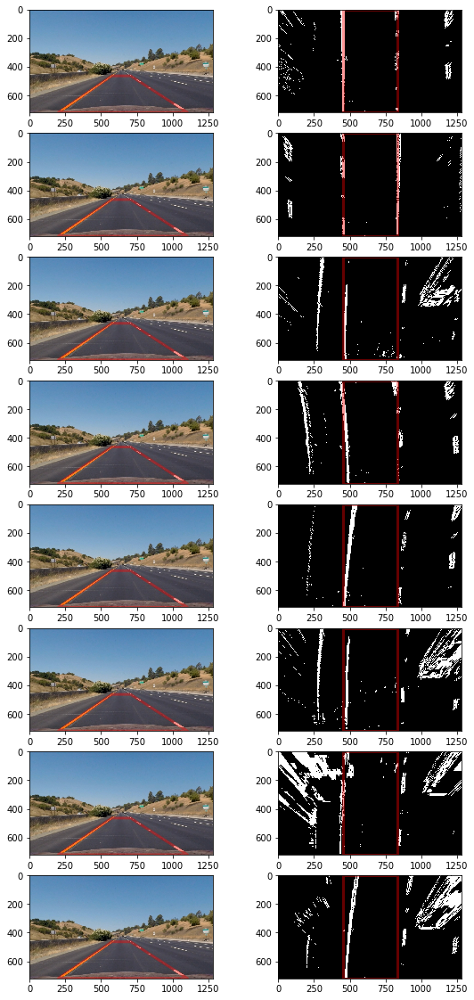

In [24]:
# Compile test image.
test_images = glob.glob('./test_images/*.jpg')
                                          
# Set up the plot.
fig, axs = plt.subplots(len(test_images),2, figsize=(10, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in test_images:
    # Images
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     undistorted_image = undistort(img,)
    binary_warped_image, M, Minv = warp(img)
    
    h,w = binary_warped_image.shape[:2]
    
    # src and dst polygons
    src_top_left = (575,464) # 464 is the y-value for the top of the lane polygon.
    src_top_right = (707,464)
    src_bottom_left = (201,720) # 720 is the y-value for the bottom of the image/ bottom of the lane polygon.
    src_bottom_right = (1104,720)
    
    src = np.float32([src_top_left,
                      src_top_right,
                      src_bottom_left,
                      src_bottom_right])
    
    adj = 450
    dst = np.float32([(adj,0),
                      (w-adj,0),
                      (adj,h),
                      (w-adj,h)])
    
    src_x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    src_y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    dst_x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
    dst_y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
    
    axs[i].plot(src_x, src_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    axs[i].set_ylim([h,0])
    axs[i].set_xlim([0,w])
    axs[i].imshow(undistorted_image)
    i += 1
    axs[i].plot(dst_x, dst_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    axs[i].set_ylim([h,0])
    axs[i].set_xlim([0,w])
    axs[i].imshow(binary_warped_image, cmap='gray')
    i += 1

#### Output for Project Document

**This is not used in image processing.**

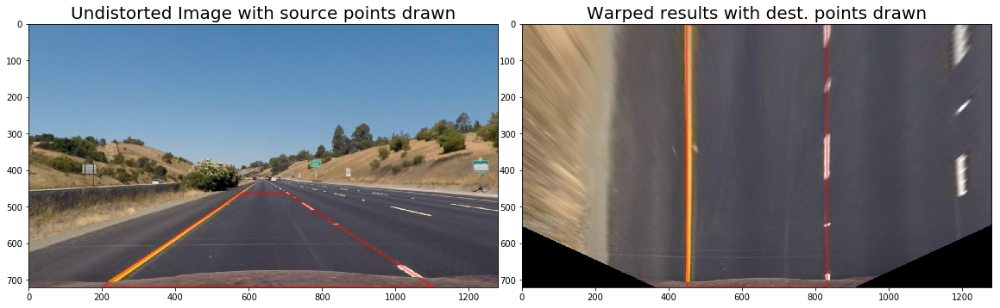

In [25]:
binary_warped_image, M, Minv = warp(test_image)
# h is the height of the image and is 720 for the test images.
# w is the width of the image and is 1280 for the test images.
h,w = test_image.shape[:2]
# use cv2.warpPerspective() to warp your image to a top-down view.
color_warped_image = cv2.warpPerspective(test_image, M, (w,h), flags=cv2.INTER_LINEAR)

# Visualize warp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)

#ax1.axis('off')
src_x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
src_y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(src_x, src_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image with source points drawn', fontsize=20)
ax1.imshow(undistorted_image)

#ax2.axis('off')
dst_x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
dst_y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
ax2.plot(dst_x, dst_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.set_ylim([h,0])
ax2.set_xlim([0,w])
ax2.set_title('Warped results with dest. points drawn', fontsize=20)
ax2.imshow(color_warped_image)

# Step 5 of 6: Detect Lane Lines and Fit Polynomials

Histogram of the bottom half of the binary warped image.

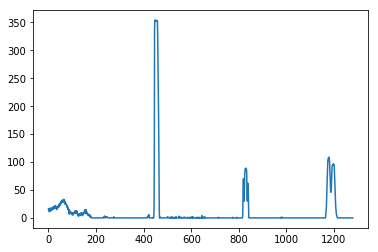

In [26]:
histogram = np.sum(binary_warped_image[binary_warped_image.shape[0]/2:,:], axis=0)
plt.plot(histogram)

## Display Binary Warped Image and Corresponding Histogram
The histogram show the x-values where near vertical lines (lane lines) are located. Looking through histograms for the corresponding binary warped transform representations of all of the test images, we see that the lane lines are located between 400-600 pixels for the left lane line and 800-1000 for the right lane line. Histogram peaks outside of these regions could be for barrier edges, another lane, or noise.

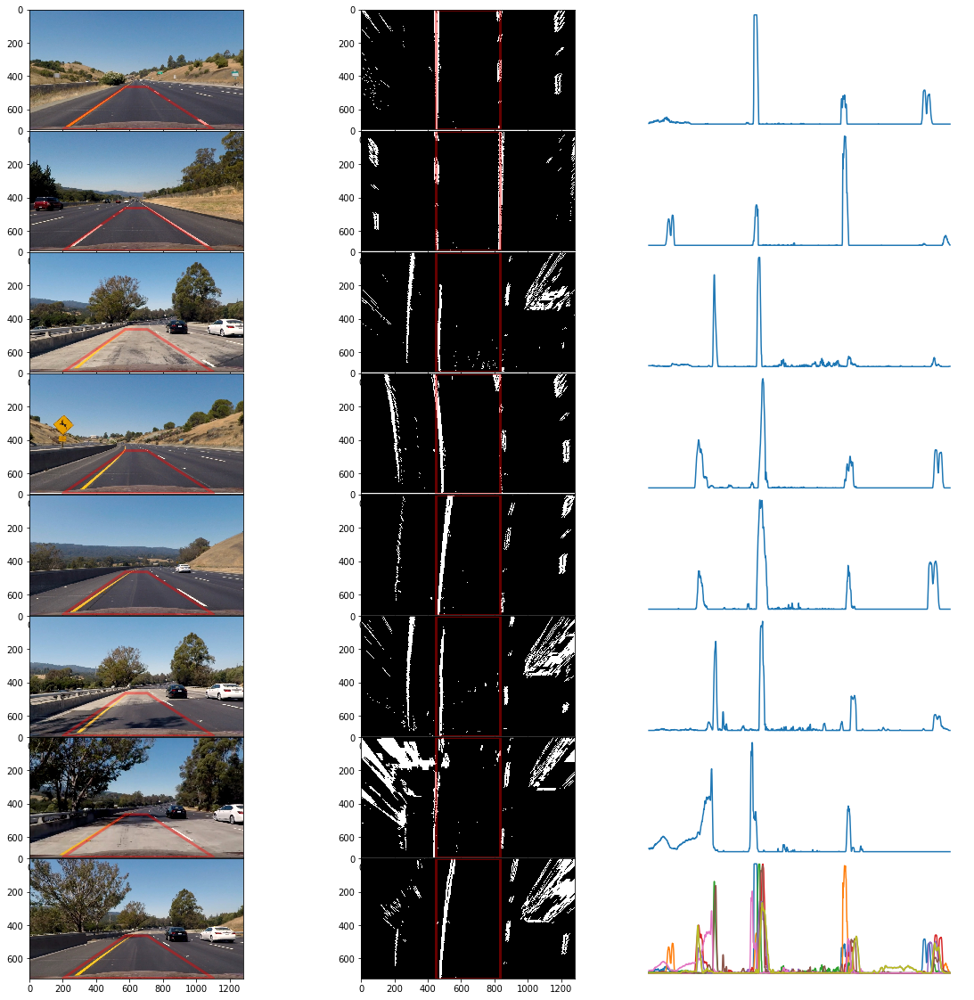

In [27]:
# Compile test image.
test_images = glob.glob('./test_images/*.jpg')
                                          
# Set up the plot.
fig, axs = plt.subplots(len(test_images),3, figsize=(20, 20))
fig.subplots_adjust(hspace = .01, wspace=.001)
axs = axs.ravel()
                  
i = 0
for image in test_images:
    # Images
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = undistort(img)
    binary_warped_image, M, Minv = warp(img)
    
    h,w = img.shape[:2]
    
    # src and dst polygons
    src_top_left = (575,464) # 464 is the y-value for the top of the lane polygon.
    src_top_right = (707,464)
    src_bottom_left = (201,720) # 720 is the y-value for the bottom of the image/ bottom of the lane polygon.
    src_bottom_right = (1104,720)
    
    src = np.float32([src_top_left,
                      src_top_right,
                      src_bottom_left,
                      src_bottom_right])
    
    adj = 450
    dst = np.float32([(adj,0),
                      (w-adj,0),
                      (adj,h),
                      (w-adj,h)])
    
    src_x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    src_y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    dst_x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
    dst_y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
    
    axs[i].plot(src_x, src_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    axs[i].set_ylim([h,0])
    axs[i].set_xlim([0,w])
    axs[i].imshow(img)
    i += 1
    axs[i].plot(dst_x, dst_y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    axs[i].set_ylim([h,0])
    axs[i].set_xlim([0,w])
    axs[i].imshow(binary_warped_image, cmap='gray')
    i += 1
    axs[i].axis('off')
    histogram = np.sum(binary_warped_image[binary_warped_image.shape[0]/2:,:], axis=0)
    plt.plot(histogram)
    plt.savefig('histogram_image')

    # TODO: Fix this up, but leave for now.
    axs[i].plot(histogram)
    i += 1

## Locate the Lane Lines and Fit Polynomials to the Lane Lines (sliding windows)
The function that locates lane lines and produces poly fit lines takes in a binary warped image as input, which was produced in step 4.

In [28]:
def sliding_window_polyfit(bin_img):
    # img: the output image from warp()
    
    img = np.copy(bin_img)

    # Create an output image to draw on and visualize the result.
    out_img = np.dstack((img, img, img))*255

    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)

    # Choose the number of sliding windows.
    nwindows = 9 # The number of search windows per lane line.

    # Set height of each window.
    window_height = np.int(img.shape[0]/nwindows) # 720/9 = 80

    # Identify the x and y positions of all nonzero pixels in the image.
    nonzero = img.nonzero() # Indices of non-zero pixel values of the binary warped image.
    nonzeroy = np.array(nonzero[0]) # y-values of non-zero pixel values.
    nonzerox = np.array(nonzero[1]) # x-values of non-zero pixel values.

    # On the x-axis, lane lines are most likely to be found (y-value = 720 pixels) between
    # 400 and 600 pixels for the left lane line and
    # 800 and 1000 pixels for the right lane line.
    left_lane_line_histo_bounds = (400, 600) # TODO: accommodate different-sized image
    right_lane_line_histo_bounds = (800, 1000) # TODO: accommodate different-sized image

    # Current window positions to be updated for each window.
    # Referencing the center of each window.
    # Start with the x-values for the left and right histogram peaks.
    left_window_center_x = np.argmax(histogram[left_lane_line_histo_bounds[0]:left_lane_line_histo_bounds[1]]) + left_lane_line_histo_bounds[0]
    right_window_center_x = np.argmax(histogram[right_lane_line_histo_bounds[0]:right_lane_line_histo_bounds[1]]) + right_lane_line_histo_bounds[0]

    # Set the +/- margin of a window; window width = 2*margin.
    margin = 50 #100 # Half the width of the proposed window.

    # Set minimum number of pixels found to re-center window.
    minpx = 175#50

    # Create empty lists to receive left and right lane line non-zero pixel indices.
    left_lane_line_inds = []
    right_lane_line_inds = []

    # Collect widow corners.
    all_window_corners = []

    # Step through the windows one by one.
    for i in range(nwindows):
        # Top (y) of current window (y increases downward).
        win_y_low = img.shape[0] - (i+1)*window_height
        # Bottom (y) of the current window (y increases downward).
        win_y_high = img.shape[0] - i*window_height

        # Identify window boundaries.
        left_window_left_x = left_window_center_x - margin # Left end of left window.
        left_window_right_x = left_window_center_x + margin # Right end of left window.
        right_window_left_x = right_window_center_x - margin # Left end of right window.
        right_window_right_x = right_window_center_x + margin # Right end of right window.

        # Draw the windows on the visualization image.
        left_window_bltr_corners = ((left_window_left_x, win_y_low), (left_window_right_x, win_y_high))
        right_window_bltr_corners = ((right_window_left_x, win_y_low), (right_window_right_x, win_y_high))
        cv2.rectangle(out_img,(left_window_bltr_corners[0]), (left_window_bltr_corners[1]),(0,255,0), 3)
        cv2.rectangle(out_img,(right_window_bltr_corners[0]), (right_window_bltr_corners[1]),(0,255,0), 3)

        # Save window corners.
        all_window_corners.append((left_window_bltr_corners, right_window_bltr_corners))

        # Identify the non-zero pixels in x and y within the window.
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= left_window_left_x) & (nonzerox < left_window_right_x)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= right_window_left_x) & (nonzerox < right_window_right_x)).nonzero()[0]

        # Append these indices to the lists
        left_lane_line_inds.append(good_left_inds)
        right_lane_line_inds.append(good_right_inds)

        # If you found > minpx pixels, recenter next window on their mean position
        if len(good_left_inds) > minpx:
            left_window_center_x = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpx:        
            right_window_center_x = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices.
    left_lane_line_inds = np.concatenate(left_lane_line_inds)
    right_lane_line_inds = np.concatenate(right_lane_line_inds)

    # Extract left and right line pixel positions.
    left_lane_line_x_cloud = nonzerox[left_lane_line_inds]
    left_lane_line_y_cloud = nonzeroy[left_lane_line_inds] 
    right_lane_line_x_cloud = nonzerox[right_lane_line_inds]
    right_lane_line_y_cloud = nonzeroy[right_lane_line_inds]

    # Fit a second order polynomial to each set of lane line cloud points.
    # Transpose x and y.
    # We're fitting for f(y), rather than f(x), because the lane lines in the warped image
    # are near vertical and may have the same x value for more than one y value. x = f(y)
    # Returns polynomial coefficients, highest power first.
    left_fit, right_fit = (None, None)
    if len(left_lane_line_x_cloud) != 0:
        left_fit = np.polyfit(left_lane_line_y_cloud, left_lane_line_x_cloud, 2)
    if len(right_lane_line_x_cloud) != 0:
        right_fit = np.polyfit(right_lane_line_y_cloud, right_lane_line_x_cloud, 2)

    # Generate x and y values for plotting/
    # Evenly spaced numbers over a specified interval (window height).
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    
    # x-values given y-values.
    # The _fitx variables are the equations of the lane lines.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    window_corners_and_frame_histogram = (all_window_corners, histogram)

    #####
    
    # Debug logs
    # Plot lines representing the left and right lane lines.
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)
#     print('all_window_corners:',all_window_corners)
#     print('all_window_corners[0]:',all_window_corners[0])
#     print('all_window_corners[0][0]:',all_window_corners[0][0])
#     print('all_window_corners[0][0][0]:',all_window_corners[0][0][0])
#     print('all_window_corners[0][0][1]:',all_window_corners[0][0][1])
    # Add lane cloud points to the output image.
#     out_img[left_lane_line_y_cloud, left_lane_line_x_cloud] = [255, 0, 0]
#     out_img[right_lane_line_y_cloud, right_lane_line_x_cloud] = [0, 0, 255]
#     plt.imshow(out_img)
#     print('The green windows show the search areas for lane line points on the initial video frame.')

    return left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, window_corners_and_frame_histogram

print('...')

...


### Visualize Binary Warped Image, Windows, Cloud Points, Left and Right Lane Lines (sliding windows)

...


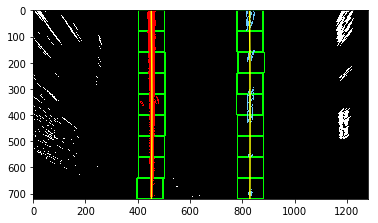

In [29]:
# test_image = cv2.imread('./test_images/test2.jpg')
# test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
binary_warped_image, M, Minv = warp(test_image)
    
left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, window_corners_and_frame_histogram = sliding_window_polyfit(binary_warped_image)

h = binary_warped_image.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

all_window_corners = window_corners_and_frame_histogram[0]

histogram = window_corners_and_frame_histogram[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((binary_warped_image, binary_warped_image, binary_warped_image))*255)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped_image.shape[0]-1, binary_warped_image.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Add windows to image.
for left_right_window_corners in all_window_corners:
    left_window_bltr_corners = left_right_window_corners[0]
    right_window_bltr_corners = left_right_window_corners[1]
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(left_window_bltr_corners[0]), (left_window_bltr_corners[1]),(0,255,0), 3)
    cv2.rectangle(out_img,(right_window_bltr_corners[0]), (right_window_bltr_corners[1]),(0,255,0), 3)
    
# Identify the x and y positions of all nonzero pixels in the image.
nonzero = binary_warped_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_line_inds], nonzerox[left_lane_line_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_line_inds], nonzerox[right_lane_line_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print('...')

### Visualize Binary Warped Image Histogram

...


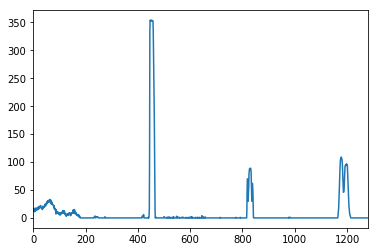

In [30]:
# Print histogram from sliding window polyfit for example image.
plt.plot(histogram)
plt.xlim(0, 1280)
print('...')

** Not Implemented ** Alternative Sliding Window Search (adopting convolution)

## Locate the Lane Lines and Fit Polynomials (previous search area)
Skip the sliding windows step once you know where the lines are.

In [31]:
# Assuming that video frames do not change significantly from one frame to the next, we can speed-up
# finding the locations of lane lines and fitting polynomials, by using results found in the previous
# frame. After all, we don't expect the lane lines to shift or disiappear under normal circumstances.
# But, this could happen in the video frames. If, for a number of frames, it does, we can revert to the
# sliding window search to locate the lane lines.
def subsequent_frames_polyfit(binary_warped_image, left_fit_prev, right_fit_prev):
    
    # Identify the x and y positions of all nonzero pixels in the image.
    nonzero = binary_warped_image.nonzero() # Nonzero pixel values of the binary warped image.
    nonzeroy = np.array(nonzero[0]) # y-values of nonzero pixel values.
    nonzerox = np.array(nonzero[1]) # x-values of nonzero pixel values.
    
    margin = 50 #80
    
    left_lane_line_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_line_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Extract left and right line pixel positions.
    left_lane_line_x_cloud = nonzerox[left_lane_line_inds]
    left_lane_line_y_cloud = nonzeroy[left_lane_line_inds] 
    right_lane_line_x_cloud = nonzerox[right_lane_line_inds]
    right_lane_line_y_cloud = nonzeroy[right_lane_line_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(left_lane_line_x_cloud) != 0:
        # Fit a second order polynomial to the left lane line.
        left_fit_new = np.polyfit(left_lane_line_y_cloud, left_lane_line_x_cloud, 2)
    if len(right_lane_line_x_cloud) != 0:
        # Fit a second order polynomial to the right lane line.
        right_fit_new = np.polyfit(right_lane_line_y_cloud, right_lane_line_x_cloud, 2)
        
    return left_fit_new, right_fit_new, left_lane_line_inds, right_lane_line_inds

print('...')

...


### Visualize Binary Warped Image, Windows, Cloud Points, Left and Right Lane Lines (previous search area)

...


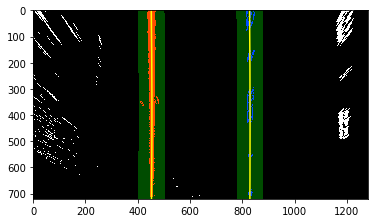

In [32]:
# visualize the result on example image
# test_image = cv2.imread('./test_images/test1.jpg')
# test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
binary_warped_image, M, Minv = warp(test_image) 

img = binary_warped_image

margin = 50 #80

left_fit_new, right_fit_new, left_lane_inds_new, right_lane_inds_new = subsequent_frames_polyfit(img, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx_new = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
right_fitx_new = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((img, img, img))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds_new], nonzerox[left_lane_inds_new]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds_new], nonzerox[right_lane_inds_new]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx_new, ploty, color='yellow')
plt.plot(right_fitx_new, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print('...')

# Step 6 of 6: Determine the Lane Curvatures and Vehicle Offset

## Real World Space

In [33]:
def calc_curv_rad_and_car_offset(binary_warped_image, l_fit, r_fit, l_lane_line_inds, r_lane_line_inds):
    # The lane is about 30 meters long and 3.7 meters wide.
    # U.S. regulations require a minimum lane width of 12 feet or 3.7 meters,
    # and the dashed lane lines are 10 feet or 3.048 meters long each.
    # Define conversions in x and y from pixels space to world space.
    # Not using the factors, below, from lecture:
    #ym_per_pix = 30/720 # meters per pixel in y dimension
    #xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Instead, using factors calculated from straight_lines2.jpg test image, where the
    # dashed lane line = 157.76 pixels
    # 3.048m/157.76pixels in y-direction
    # lane width = 380.23 pixels
    # 3.7m/380.23pixels in x-direction
    ym_per_pix = 3.048/157.76 # meters per pixel in y dimension
    xm_per_pix = 3.7/380.23 # meters per pixel in x dimension

    left_curve_rad, right_curve_rad, center_dist = (0, 0, 0)

    # Define y-value where we want radius of curvature.
    # Choose the maximum y-value, corresponding to the bottom of the image
    h = binary_warped_image.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Extract left and right line pixel positions.
    left_lane_line_x_cloud = nonzerox[l_lane_line_inds]
    left_lane_line_y_cloud = nonzeroy[l_lane_line_inds] 
    right_lane_line_x_cloud = nonzerox[r_lane_line_inds]
    right_lane_line_y_cloud = nonzeroy[r_lane_line_inds]

    if len(left_lane_line_x_cloud) != 0 and len(right_lane_line_x_cloud) != 0:
        # Fit new polynomials to x,y in world space.
        left_fit_cr = np.polyfit(left_lane_line_y_cloud*ym_per_pix, left_lane_line_x_cloud*xm_per_pix, 2)
        right_fit_cr = np.polyfit(right_lane_line_y_cloud*ym_per_pix, right_lane_line_x_cloud*xm_per_pix, 2)
        # Calculate the radii.
        left_curve_rad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curve_rad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts.
    if right_fit is not None and left_fit is not None:
        # Consider the car to be in the center of the image frame.
        car_position = binary_warped_image.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (l_fit_x_int + r_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
        
    return left_curve_rad, right_curve_rad, center_dist
    
print('...')

...


In [34]:
rad_l, rad_r, d_center = calc_curv_rad_and_car_offset(binary_warped_image, left_fit, right_fit, left_lane_line_inds, right_lane_line_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 1145.4097691 m, 2049.0600993 m
Distance from lane center for example: -0.00683706242453 m


# Sanity Check
This section is to investigate various sanity check implementations.
## Lane Width
Determine if the measured lane width is within +/- 1 meter of the expected 3.7 meter lane width.

In [35]:
img = np.copy(test_image)


binary_warped_image, M, Minv = warp(img)

l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(binary_warped_image)


h = img.shape[0] # image height a.k.a. y-value for the bottom of the image
# Left line x-intercept at the bottom of the image.
l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
# Right line x-intercept at the bottom of the image.
r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
# Calculate the width of the lane at the bottom of the image.
# A lane should be about 700 pixels/3.7m wide.
lane_width_at_image_base = abs(r_fit_x_int - l_fit_x_int)

# The lane is about 30 meters long and 3.7 meters wide.
# U.S. regulations require a minimum lane width of 12 feet or 3.7 meters,
# and the dashed lane lines are 10 feet or 3.048 meters long each.
# Define conversions in x and y from pixels space to world space.
# Not using the factors, below, from lecture:
#ym_per_pix = 30/720 # meters per pixel in y dimension
#xm_per_pix = 3.7/700 # meters per pixel in x dimension
# Instead, using factors calculated from straight_lines2.jpg test image, where the
# dashed lane line = 157.76 pixels
# 3.048m/157.76pixels in y-direction
# lane width = 380.23 pixels
# 3.7m/380.23pixels in x-direction
ym_per_pix = 3.048/157.76 # meters per pixel in y dimension
xm_per_pix = 3.7/380.23 # meters per pixel in x dimension
# TODO: share ym... and xm... from a common spot as another function uses it, as well.
lane_width_at_image_base_m = lane_width_at_image_base * xm_per_pix
    
# Logs
#     print('l_fit_x_int:',l_fit_x_int)
#     print('r_fit_x_int:',r_fit_x_int)
#     print('lane_width_at_image_base:',lane_width_at_image_base)
print('lane_width_at_image_base_m:', lane_width_at_image_base_m)

lane_width_at_image_base_m: 3.66230397478


## Parallel Lane Lines
Determine if the discovered lane lines are parallel by checking the slope of their difference, which should be 0.

slope = 0.000686632227751


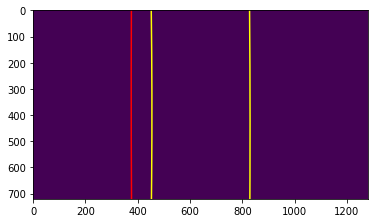

In [36]:
# Create an output image to draw on and visualize the result.
para_lines_img = np.zeros_like(binary_warped_image)

h = binary_warped_image.shape[0]
ploty = np.linspace(0, h-1, h)
left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
balancex = right_fitx - left_fitx
slope, intercept, r_value, p_value, slope_std_error = scipy.stats.linregress(ploty, balancex)


window = [-1, 0, 1]

# Plot the collection of non-zero points.
plt.imshow(para_lines_img)
# Plot lines representing the left and right lane lines.
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.plot(balancex, ploty, color='red')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Logs
print("slope = "+ str(slope))
# print("r_value = "+ str(r_value)) 
# print("r_squared = " + str(r_value**2)) 
# print("p_value = "+str(p_value))

# Draw Lane Lines, Lane, Data (lane curvature and car offset from center)

In [37]:
def draw_lane_and_data(new_img, bin_img, left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, Minv):
    img = np.copy(new_img)
    binary_warped_image = bin_img
    
    if left_fit is None or right_fit is None:
        return new_img
    
    # Create an image on which to draw the polyfit lines.
    warp_zero_image = np.zeros_like(binary_warped_image).astype(np.uint8)
    color_warp_image = np.dstack((warp_zero_image, warp_zero_image, warp_zero_image))
    
    # Get left and right lane polyfit lines.
    h,w = binary_warped_image.shape
    ploty = np.linspace(0, h-1, num=h) # y-range
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2] # left lane line polyfit x
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2] # right lane line polyfit x

    # Recast the x and y points into usable format for cv2.fillPoly().
    left_lane_pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_lane_pts = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    # Stack arrays in sequence horizontally (column wise).
    filled_lane_poly = np.hstack((left_lane_pts, right_lane_pts))

    # Draw the poly and lane lines onto the warped, blank image.
    # RBG...
    cv2.fillPoly(color_warp_image, np.int_([filled_lane_poly]), (0,255,0)) # lane poly
    cv2.polylines(color_warp_image, np.int32([left_lane_pts]), isClosed=False, color=(255,0,0), thickness=15) # left lane line
    cv2.polylines(color_warp_image, np.int32([right_lane_pts]), isClosed=False, color=(0,0,255), thickness=15) # right lane line

    # Use the inverse perspective matrix (Minv) to warp the blank,
    # bird's-eye view, transformed image back to original image space.
    inv_color_warp_image = cv2.warpPerspective(color_warp_image, Minv, (w, h))
    
    # Combine the result with the original image.
    output_image = cv2.addWeighted(img, 1, inv_color_warp_image, 0.75, 0)
    
    #####
    
    # Data
    left_lane_line_rad, right_lane_line_rad, car_offset = calc_curv_rad_and_car_offset(binary_warped_image, left_fit, right_fit, left_lane_line_inds, right_lane_line_inds)
    curv_avg_rad = (left_lane_line_rad+right_lane_line_rad)/2
    center_dist = car_offset 
    h = img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature = ' + '{:04.0f}'.format(curv_avg_rad) + '(m)'
    cv2.putText(output_image, text, (40,70), font, 2.0, (255,255,255), 2, cv2.LINE_AA)
   
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
        
    abs_center_dist = abs(center_dist)
    text = 'Vehicle is {:04.2f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(output_image, text, (40,150), font, 2.0, (255,255,555), 2, cv2.LINE_AA)
    
    return output_image

print('...')

...


# draw_lane_and_data() for a Test Images
Expecting a very high radius of curvature for straight lane line segments and a radius of curvature within an order of magnitude of 1 km for curved lane line segments as that is the radius of the road the test images were taken on.

...


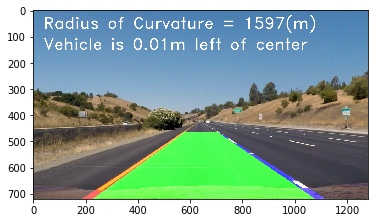

In [38]:
output_image = draw_lane_and_data(test_image, binary_warped_image, left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, Minv)
plt.imshow(output_image)

print('...')

# draw_lane_and_data() for All Test Images
Expecting a very high radius of curvature for straight lane line segments and a radius of curvature within an order of magnitude of 1 km for curved lane line segments as that is the radius of the road the test images were taken on.

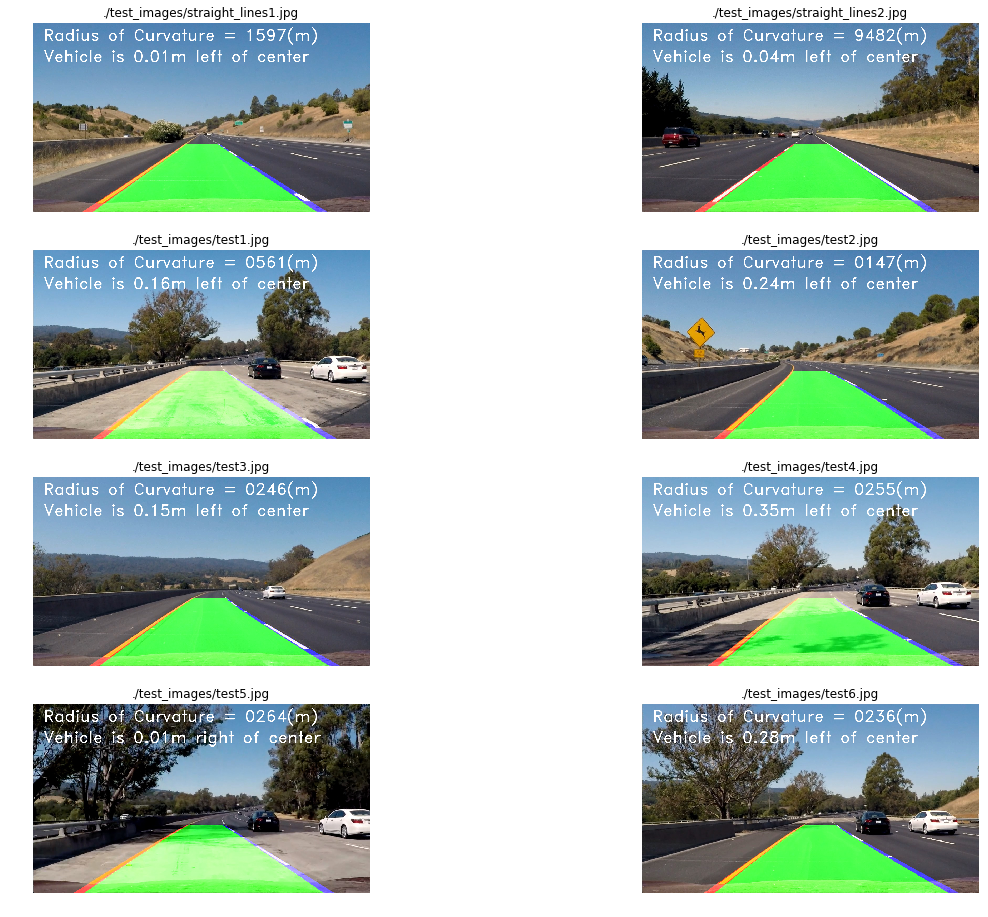

In [39]:
images = glob.glob('./test_images/*.jpg')

# Prepare display.
fig, axs = plt.subplots(4,2, figsize=(20, 16))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    binary_warped_image, M, Minv = warp(img)
    left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, window_corners_and_frame_histogram = sliding_window_polyfit(binary_warped_image)
    
    output_image = draw_lane_and_data(img, binary_warped_image, left_fit, right_fit, left_lane_line_inds, right_lane_line_inds, Minv)
    
    # Draw and display the test images.
    axs[i].axis('off')
    axs[i].set_title(fname)
    axs[i].imshow(output_image)

# Line Class
Create an instance of this class for the left and right lane lines to keep track of recent detections and to perform sanity checks.

In [40]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # Was the line detected in the last iteration?
        self.detected = False  
        # x-values of the last n fits of the line.
        #self.recent_xfitted = [] 
        # Average x values of the fitted line over the last n iterations.
        #self.bestx = None     
        # Polynomial coefficients averaged over the last n iterations.
        self.best_fit = None  
        # Polynomial coefficients for the most recent fit.
        self.current_fit = []  
        # Radius of curvature of the line in some units.
        #self.radius_of_curvature = None 
        # Distance in meters of vehicle center from the line.
        #self.line_base_pos = None 
        # Difference in fit coefficients between last and new fits.
        self.diffs = np.array([0,0,0], dtype='float') 
        # x values for detected line pixels.
        #self.allx = None  
        # y values for detected line pixels.
        #self.ally = None
   
    # TODO: add radius of curvature as a consideration
    def add_properties(self, fit):
        nfits = 5 # number of fits to keep
        #print('fit:',fit)
        # Add a fit to the line, up to 
        if fit is not None:
            #print('fit is not None')
            if self.best_fit is not None:
                #print('self.best_fit is not None')
                # if there is a best fit, see how this new fit compares by taking the absolute value of the difference.
                self.diffs = abs(fit-self.best_fit)
                #print('self.diffs[0]:',self.diffs[0])
                #print('self.diffs[1]:',self.diffs[1])
                #print('self.diffs[2]:',self.diffs[2])
            # These values have an effect on the output.
            # Check that the fits coefficients are acceptable compared to the best fit and that there is a current fit.
            if (self.diffs[0] > 0.001 or \
                self.diffs[1] > 1.0 or \
                self.diffs[2] > 100.0) and \
                len(self.current_fit) > 0:
                # There must be at least one fit in the collection.
                # if the current fit is not close to the best fit, consider the current fit to be anamolous.
                # The line was not detected in the last iteration.
                self.detected = False
            else:
                #print('self.best_fit is None')
                # The line was detected in the last iteration.
                self.detected = True
                self.current_fit.append(fit)
                if len(self.current_fit) > nfits:
                    # if there are more than nfits; prune the collection.
                    # Delete old fits; keep newest nfits fits.
                    self.current_fit = self.current_fit[len(self.current_fit)-nfits:]
                # The best fit comprises the average of the collection of fits.
                self.best_fit = np.average(self.current_fit, axis=0)
        # else remove one
        else:
            #print('fit is None')
            # The line was not detected in the last iteration.
            self.detected = False
            if len(self.current_fit) > 0:
                # Delete the oldest fit in the collection.
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the collection, best_fit comprises their average.
                self.best_fit = np.average(self.current_fit, axis=0)

print('...')

...


# Function to Process Car Camera Images

In [41]:
def process_car_camera(image):
    # A video frame image.
    img = np.copy(image)
    
    # Get the thresholded image.
    binary_warped_image, M, Minv = warp(img)
    
    # if both left and right lines were detected last frame, use subsequent_frames_polyfit().
    # else use sliding_window_polyfit()
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_line_inds, r_lane_line_inds, _ = sliding_window_polyfit(binary_warped_image)
    else:
        l_fit, r_fit, l_lane_line_inds, r_lane_line_inds = subsequent_frames_polyfit(binary_warped_image, l_line.best_fit, r_line.best_fit)
   
    # Sanity check for lane width...
    # Check lane width and invalidate the fit (set the fit to None) if the lane width is not within
    # an acceptable range < 4.7m and > 2.7m. A lane should be 3.7m wide.
    if l_fit is not None and r_fit is not None:
        # image height a.k.a. y-value for the bottom of the image
        h = img.shape[0] 
        # Left line x-intercept at the bottom of the image.
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        # Right line x-intercept at the bottom of the image.
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        # Calculate the width of the lane at the bottom of the image.
        # A lane should be about 700 pixels wide.
        lane_width_at_image_base = abs(r_fit_x_int - l_fit_x_int)

        # The lane is about 30 meters long and 3.7 meters wide.
        # U.S. regulations require a minimum lane width of 12 feet or 3.7 meters,
        # and the dashed lane lines are 10 feet or 3.048 meters long each.
        # Define conversions in x and y from pixels space to world space.
        # Not using the factors, below, from lecture:
        #ym_per_pix = 30/720 # meters per pixel in y dimension
        #xm_per_pix = 3.7/700 # meters per pixel in x dimension
        # Instead, using factors calculated from straight_lines2.jpg test image, where the
        # dashed lane line = 157.76 pixels
        # 3.048m/157.76pixels in y-direction
        # lane width = 380.23 pixels
        # 3.7m/380.23pixels in x-direction
        ym_per_pix = 3.048/157.76 # meters per pixel in y dimension
        xm_per_pix = 3.7/380.23 # meters per pixel in x dimension
        # TODO: share ym... and xm... from a common spot as another function uses it, as well.
        lane_width_at_image_base_m = lane_width_at_image_base * xm_per_pix
        if lane_width_at_image_base_m > 4.7 or lane_width_at_image_base_m < 2.7:
            l_fit = None
            r_fit = None
    
    # Sanity check for lines being roughly parallel...
    if l_fit is not None and r_fit is not None:
        h = binary_warped_image.shape[0]
        ploty = np.linspace(0, h-1, h)
        left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
        right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
        # Difference in measure of parallel; if parallel, fitx
        balancex = right_fitx - left_fitx
        slope, intercept, r_value, p_value, slope_std_error = scipy.stats.linregress(ploty, balancex)
        
        if abs(slope) > 10:
            l_fit = None
            r_fit = None
            
    # Sanity check for lines having roughly the same radius...
    #The radii for the lane lines should roughly be within 4m or each other, but they are not, 
    #therefore, not implementing this sanity check for now.
    #if l_fit is not None and r_fit is not None:
        #left_lane_line_rad, right_lane_line_rad, car_offset = calc_curv_rad_and_car_offset(binary_warped_image, l_fit, r_fit, l_lane_line_inds, r_lane_line_inds)
           
    l_line.add_properties(l_fit)
    r_line.add_properties(r_fit)
    print('l_fit:',l_fit)
    print('r_fit:',r_fit)
    
    if l_line.best_fit is not None and r_line.best_fit is not None:
        # if it exists; draw the current best fit.
        img_out = draw_lane_and_data(img, binary_warped_image, l_line.best_fit, r_line.best_fit, l_lane_line_inds, r_lane_line_inds, Minv)
    else:
        # else; output the unadorned image.
        img_out = img
        
    return img_out

print('...')

...


# Investigate fits for Similar and Dissimilar Lane Lines
## processCarCamera() for a Test Image
The idea is to test the same image one after the other, two similar images one after the other, and two vastly differnt images one after the other and analyze the difference in the fits for the lines. This will provide a range of differences between fits to allow tuning the Line class for good fits.

Obviously, testing the same image in succession would produce among the lowest possible fit differences and testing two vastly dissimilar images, such as one where the road curves left and another where the road curves right, would produce among the highest possible fit differences.

For the identical images test, straight_lines2.jpg will be compared to itself, straight_lines2.jpg

For the similar images test, test1.jpg will be compared to test4.jpg

For the dissimilar images test, test1.jpg, which curves right, will be comapred to test2.jpg, which curves left.
### Results of Investigation
#### Identical Images (straight_lines2.jpg)
diffs[0]: 3.7481207916e-19
diffs[1]: 4.3107878378e-15
diffs[2]: 1.13686837733e-13
#### Similar Images (test1.jpg, test4.jpg)
diffs[0]: 0.000137314532589
diffs[1]: 0.0722061154488
diffs[2]: 9.46808742363
#### Dissimilar Images (test1.jpg, test2.jpg)
diffs[0]: 0.000324299636364
diffs[1]: 0.336903171553
diffs[2]: 95.3172692311

The assumption seems to be supported by evidence as the diffs get progressively worse, the more dissimilar the tandem images are.
### Magnitude of typical fit coefficients.
l_fit: [  2.43639088e-04  -2.31671250e-01   4.92270904e+02]
r_fit: [  8.71659747e-05  -1.25215157e-01   8.91709967e+02]

0.0001, 0.1, 100

In [42]:
#test_image_path = './test_images/test1.jpg'
test_image_path = './test_images/straight_lines1.jpg'
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

l_line = Line() # left line
r_line = Line() # right line
output_image = process_car_camera(test_image)

print('...')

l_fit: [ -1.67459681e-05   1.29831376e-02   4.51857774e+02]
r_fit: [ -9.36052900e-06   8.35963916e-03   8.27714254e+02]
...


## Display process_car_camera() Output for a Test Image

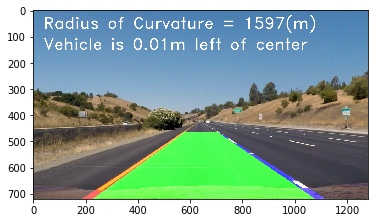

In [43]:
plt.imshow(output_image)

# Save image.
video_frame = PIL.Image.fromarray(output_image)
video_frame.save('./output_images/video_frame.jpg', 'JPEG')

## processCarCamera() for a Second Test Image
test4.jpg and test6.jpg are similar images

test2.jpg and test6.jpg are dissimilar images (curve left and right)

In [44]:
test_image_path = './test_images/test2.jpg'
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# l_line = Line() # left line
# r_line = Line() # right line
output_image = process_car_camera(test_image)

print('...')

l_fit: [ -9.44778201e-05   1.39297804e-01   4.36537232e+02]
r_fit: [ -2.20185213e-04   2.01293974e-01   8.08607214e+02]
...


## Display process_car_camera() Output for a Second Test Image

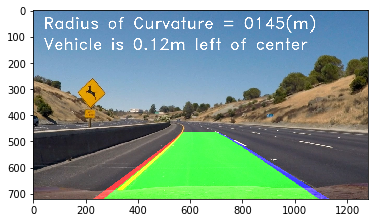

In [45]:
plt.imshow(output_image)

# Display process_car_camera() Output for all Test Images

l_fit: [ -1.67459681e-05   1.29831376e-02   4.51857774e+02]
r_fit: [ -9.36052900e-06   8.35963916e-03   8.27714254e+02]
l_fit: [  5.62747337e-06   6.73363170e-03   4.49798050e+02]
r_fit: [ -1.23320460e-06  -1.51409111e-02   8.42410560e+02]
l_fit: [  1.03211277e-04  -1.17543223e-01   5.00003703e+02]
r_fit: [  2.05188525e-05  -9.34438543e-02   9.00539275e+02]
l_fit: [ -9.45283501e-05   1.40418556e-01   4.36243892e+02]
r_fit: [ -2.12325203e-04   1.97849152e-01   8.08749062e+02]
l_fit: [  5.66368208e-05  -1.42821418e-01   5.36770772e+02]
r_fit: [  1.25314794e-04  -1.88144061e-01   9.18587147e+02]
l_fit: [  5.04092348e-05  -6.05426951e-02   4.96436849e+02]
r_fit: [  1.47753509e-04  -1.58701152e-01   9.09753844e+02]
l_fit: [  1.02284782e-04  -1.31906672e-01   4.80345265e+02]
r_fit: [ -5.65190475e-05  -1.35675269e-02   8.78426572e+02]
l_fit: [  8.01964718e-05  -1.67525363e-01   5.51873018e+02]
r_fit: [  8.26798317e-05  -1.47163514e-01   9.27958320e+02]


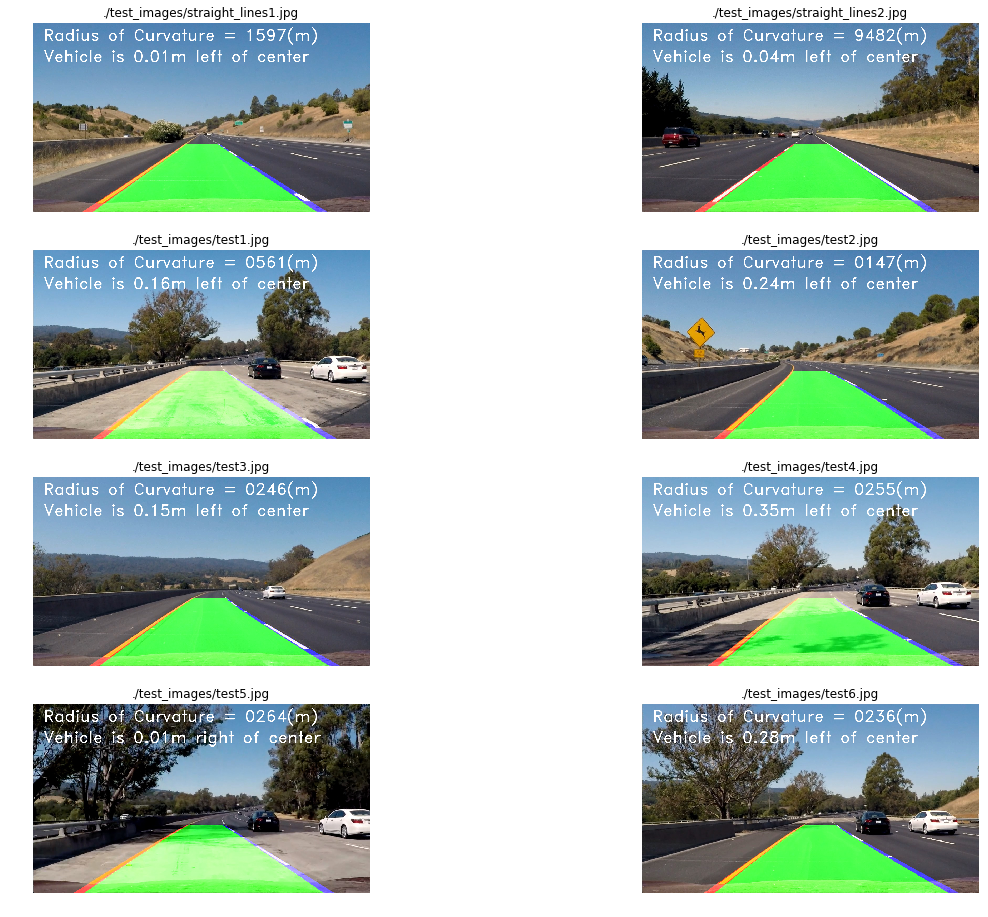

In [46]:
images = glob.glob('./test_images/*.jpg')

# Prepare display.
fig, axs = plt.subplots(4,2, figsize=(20, 16))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    l_line = Line() # left line
    r_line = Line() # right line
    output_image = process_car_camera(img)
    
    # Draw and display the test images.
    axs[i].axis('off')
    axs[i].set_title(fname)
    axs[i].imshow(output_image)

# Process Project Video

In [47]:
l_line = Line() # left line
r_line = Line() # right line
video_output = 'project_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(process_car_camera)
%time processed_video.write_videofile(video_output, audio=False)

print('...')

l_fit: [ -1.19713765e-04   1.52154757e-01   4.34256247e+02]
r_fit: [  1.18086758e-05   6.38526406e-02   8.27135585e+02]
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

l_fit: [ -1.15789251e-04   1.50066633e-01   4.34043103e+02]
r_fit: [  1.49725613e-05   6.18205625e-02   8.27357348e+02]


  0%|          | 2/1261 [00:00<04:31,  4.63it/s]

l_fit: [ -1.16407051e-04   1.52869575e-01   4.33349445e+02]
r_fit: [ -1.17944402e-04   1.64341957e-01   8.10221792e+02]
l_fit: [ -1.20160724e-04   1.56134943e-01   4.33180135e+02]
r_fit: [ -7.42367537e-05   1.36705747e-01   8.10808020e+02]


  0%|          | 4/1261 [00:00<04:05,  5.11it/s]

l_fit: [ -1.27532293e-04   1.63738044e-01   4.31912587e+02]
r_fit: [ -8.14019251e-05   1.45778982e-01   8.07469387e+02]
l_fit: [ -1.21791808e-04   1.63567090e-01   4.31271928e+02]
r_fit: [ -1.14595447e-04   1.75172243e-01   8.02097465e+02]


  1%|          | 7/1261 [00:01<03:44,  5.60it/s]

l_fit: [ -9.70453302e-05   1.43751233e-01   4.35061692e+02]
r_fit: [ -1.45927305e-04   2.11045158e-01   7.91784686e+02]
l_fit: [ -9.94638182e-05   1.50489110e-01   4.31682855e+02]
r_fit: [ -1.30646958e-04   1.95147851e-01   7.95796142e+02]


  1%|          | 8/1261 [00:01<03:44,  5.58it/s]

l_fit: [ -1.04191257e-04   1.55634695e-01   4.31351825e+02]
r_fit: [ -7.67398381e-05   1.60528157e-01   7.97722424e+02]
l_fit: [ -1.00308412e-04   1.57103760e-01   4.28153637e+02]
r_fit: [ -6.84575973e-05   1.56249844e-01   7.98949910e+02]


  1%|          | 10/1261 [00:01<03:44,  5.56it/s]

l_fit: [ -1.08222951e-04   1.66214524e-01   4.25307218e+02]
r_fit: [ -2.33628753e-05   1.25521533e-01   8.02978210e+02]
l_fit: [ -1.12758413e-04   1.71265645e-01   4.23738934e+02]
r_fit: [  3.67766322e-06   1.08989436e-01   8.02512457e+02]


  1%|          | 13/1261 [00:02<03:39,  5.67it/s]

l_fit: [ -1.05081573e-04   1.70092363e-01   4.20325817e+02]
r_fit: [  2.67642650e-05   7.68130398e-02   8.14752834e+02]
l_fit: [ -9.94359858e-05   1.68391259e-01   4.19486943e+02]
r_fit: [  9.20843322e-05   3.46480680e-02   8.17162328e+02]


  1%|          | 15/1261 [00:02<03:32,  5.87it/s]

l_fit: [ -8.94117214e-05   1.61390901e-01   4.19712557e+02]
r_fit: [ -1.98248884e-05   1.08164576e-01   8.08129589e+02]
l_fit: [ -8.92070434e-05   1.58870110e-01   4.21254560e+02]
r_fit: [ -3.80108105e-05   1.31727873e-01   7.97303958e+02]


  1%|▏         | 16/1261 [00:02<03:34,  5.79it/s]

l_fit: [ -8.39034100e-05   1.54835741e-01   4.22160669e+02]
r_fit: [ -3.97095884e-05   1.36347779e-01   7.91612082e+02]
l_fit: [ -7.57276412e-05   1.48437491e-01   4.22760686e+02]
r_fit: [ -8.02023003e-05   1.72743044e-01   7.83506866e+02]


  2%|▏         | 19/1261 [00:03<03:25,  6.06it/s]

l_fit: [ -5.32152978e-05   1.30836704e-01   4.25399450e+02]
r_fit: [ -1.13442626e-04   2.05001745e-01   7.75408531e+02]
l_fit: [ -4.42236408e-05   1.25544100e-01   4.24372639e+02]
r_fit: [ -1.02453051e-04   1.88540920e-01   7.81871577e+02]


  2%|▏         | 20/1261 [00:03<03:25,  6.05it/s]

l_fit: [ -4.64676282e-05   1.28222321e-01   4.22387033e+02]
r_fit: [ -1.06964887e-04   1.82985444e-01   7.85698366e+02]
l_fit: [ -4.44667191e-05   1.28033871e-01   4.20701938e+02]
r_fit: [ -1.35970228e-04   1.87683763e-01   7.90256205e+02]


  2%|▏         | 23/1261 [00:04<03:20,  6.19it/s]

l_fit: [ -4.26005686e-05   1.27510787e-01   4.18672287e+02]
r_fit: [ -9.01741081e-05   1.56817318e-01   7.97890439e+02]
l_fit: [ -3.99250694e-05   1.23502386e-01   4.18282793e+02]
r_fit: [ -7.31871859e-05   1.38851944e-01   8.03601596e+02]


  2%|▏         | 25/1261 [00:04<03:21,  6.14it/s]

l_fit: [ -5.71159993e-05   1.33606006e-01   4.17735758e+02]
r_fit: [ -1.33463373e-05   1.01508945e-01   8.06024886e+02]
l_fit: [ -6.67485598e-05   1.35170341e-01   4.19316863e+02]
r_fit: [ -5.25833046e-05   1.30834573e-01   8.00265594e+02]


  2%|▏         | 27/1261 [00:04<03:22,  6.08it/s]

l_fit: [ -6.51673907e-05   1.36384926e-01   4.16891040e+02]
r_fit: [  1.00149467e-05   7.63677576e-02   8.13181423e+02]
l_fit: [ -7.66550539e-05   1.41945279e-01   4.16623991e+02]
r_fit: [ -9.04302257e-05   1.46373850e-01   8.05595562e+02]


  2%|▏         | 29/1261 [00:05<03:23,  6.06it/s]

l_fit: [ -7.69110595e-05   1.41448163e-01   4.15463351e+02]
r_fit: [ -7.19869598e-05   1.22887815e-01   8.15257506e+02]
l_fit: [ -7.31877289e-05   1.35886604e-01   4.18155678e+02]
r_fit: [ -8.87775727e-05   1.42260361e-01   8.09235431e+02]


  2%|▏         | 30/1261 [00:05<03:25,  5.98it/s]

l_fit: [ -7.82717271e-05   1.37179296e-01   4.19816016e+02]
r_fit: [ -5.65759122e-05   1.20530594e-01   8.08995248e+02]
l_fit: [ -8.10779626e-05   1.36931985e-01   4.21847227e+02]
r_fit: [ -9.82988650e-05   1.63567270e-01   7.98077731e+02]


  3%|▎         | 33/1261 [00:05<03:22,  6.07it/s]

l_fit: [ -8.14028792e-05   1.32128293e-01   4.25976698e+02]
r_fit: [ -1.39612900e-04   2.08934037e-01   7.84582435e+02]
l_fit: [ -8.12582353e-05   1.32470293e-01   4.25027656e+02]
r_fit: [ -1.29115741e-04   1.90831415e-01   7.91415485e+02]


  3%|▎         | 34/1261 [00:05<03:25,  5.96it/s]

l_fit: [ -8.92469117e-05   1.37904301e-01   4.25737184e+02]
r_fit: [ -1.14860158e-04   1.84371911e-01   7.90378339e+02]
l_fit: [ -9.58860549e-05   1.43371245e-01   4.25455639e+02]
r_fit: [ -7.48744224e-05   1.62259567e-01   7.91457992e+02]


  3%|▎         | 37/1261 [00:06<03:22,  6.05it/s]

l_fit: [ -1.15111031e-04   1.58914135e-01   4.24130862e+02]
r_fit: [ -2.83605724e-05   1.33987279e-01   7.92523355e+02]
l_fit: [ -1.24211251e-04   1.67174984e-01   4.22921673e+02]
r_fit: [ -4.64663114e-05   1.42833258e-01   7.91431176e+02]


  3%|▎         | 38/1261 [00:06<03:22,  6.03it/s]

l_fit: [ -1.32062665e-04   1.73341159e-01   4.22963558e+02]
r_fit: [ -8.32696300e-05   1.72584967e-01   7.85158143e+02]
l_fit: [ -1.35747668e-04   1.76233362e-01   4.23195560e+02]
r_fit: [ -8.36478616e-05   1.77934955e-01   7.80190573e+02]


  3%|▎         | 41/1261 [00:07<03:25,  5.93it/s]

l_fit: [ -1.40081253e-04   1.83103249e-01   4.20868425e+02]
r_fit: [ -6.27526751e-05   1.56572082e-01   7.85926483e+02]
l_fit: [ -1.44766505e-04   1.89615879e-01   4.19010456e+02]
r_fit: [ -5.80557424e-05   1.52241689e-01   7.86235167e+02]


  3%|▎         | 42/1261 [00:07<03:27,  5.88it/s]

l_fit: [ -1.44713697e-04   1.92437106e-01   4.17616252e+02]
r_fit: [ -9.63426202e-05   1.81664291e-01   7.83044387e+02]
l_fit: [ -1.36208596e-04   1.90557003e-01   4.16365629e+02]
r_fit: [ -1.14496294e-04   1.96002615e-01   7.82207197e+02]


  4%|▎         | 45/1261 [00:07<03:26,  5.87it/s]

l_fit: [ -1.30129350e-04   1.87517789e-01   4.15618209e+02]
r_fit: [ -1.51206079e-04   2.22244796e-01   7.80992136e+02]
l_fit: [ -1.28136566e-04   1.88584295e-01   4.14088190e+02]
r_fit: [ -1.53257499e-04   2.20861386e-01   7.82926509e+02]


  4%|▎         | 46/1261 [00:07<03:28,  5.82it/s]

l_fit: [ -1.30403719e-04   1.93188733e-01   4.12022857e+02]
r_fit: [ -1.50975943e-04   2.08229922e-01   7.86076109e+02]
l_fit: [ -1.22193501e-04   1.88210328e-01   4.11487202e+02]
r_fit: [ -1.34147836e-04   1.97614767e-01   7.88541392e+02]


  4%|▍         | 48/1261 [00:08<03:37,  5.58it/s]

l_fit: [ -1.29344952e-04   1.95169548e-01   4.09942872e+02]
r_fit: [ -8.13678242e-05   1.71025891e-01   7.88502382e+02]
l_fit: [ -1.19584578e-04   1.90505356e-01   4.08416223e+02]
r_fit: [ -3.82441101e-05   1.36295347e-01   7.96229551e+02]


  4%|▍         | 50/1261 [00:08<03:42,  5.44it/s]

l_fit: [ -1.21487152e-04   1.93652992e-01   4.07092500e+02]
r_fit: [ -1.87596885e-05   1.22556990e-01   7.97206866e+02]
l_fit: [ -1.12512412e-04   1.88269974e-01   4.06964584e+02]
r_fit: [ -1.70540586e-05   1.19448701e-01   7.97490616e+02]


  4%|▍         | 53/1261 [00:09<03:37,  5.56it/s]

l_fit: [ -1.11047732e-04   1.87119371e-01   4.07415929e+02]
r_fit: [ -1.31604572e-04   2.07226173e-01   7.81823555e+02]
l_fit: [ -9.80090865e-05   1.76992295e-01   4.08750775e+02]
r_fit: [ -8.49688184e-05   1.73046363e-01   7.84917573e+02]


  4%|▍         | 55/1261 [00:09<03:28,  5.79it/s]

l_fit: [ -8.84173403e-05   1.69227887e-01   4.09637467e+02]
r_fit: [ -7.17944656e-05   1.64047899e-01   7.84390673e+02]
l_fit: [ -7.28109086e-05   1.58864902e-01   4.09969482e+02]
r_fit: [ -1.06492239e-04   1.91837084e-01   7.80723503e+02]


  4%|▍         | 56/1261 [00:09<03:29,  5.75it/s]

l_fit: [ -5.92691366e-05   1.48980596e-01   4.10263498e+02]
r_fit: [ -1.29499215e-04   2.10619415e-01   7.78571363e+02]
l_fit: [ -5.02041981e-05   1.40010221e-01   4.12162403e+02]
r_fit: [ -1.41812386e-04   2.24073609e-01   7.74661825e+02]


  5%|▍         | 58/1261 [00:10<03:38,  5.51it/s]

l_fit: [ -4.98844760e-05   1.37631057e-01   4.12620779e+02]
r_fit: [ -1.50378977e-04   2.24627371e-01   7.75071341e+02]
l_fit: [ -5.36192544e-05   1.35256505e-01   4.15647540e+02]
r_fit: [ -1.18651831e-04   2.10039719e-01   7.71286844e+02]


  5%|▍         | 61/1261 [00:10<03:26,  5.81it/s]

l_fit: [ -5.82676160e-05   1.34811956e-01   4.17674927e+02]
r_fit: [ -2.57281987e-05   1.59852784e-01   7.71292616e+02]
l_fit: [ -6.61139674e-05   1.37844941e-01   4.18204683e+02]
r_fit: [ -4.15476563e-05   1.68289109e-01   7.69067034e+02]


  5%|▍         | 63/1261 [00:10<03:22,  5.92it/s]

l_fit: [ -8.05131714e-05   1.45442294e-01   4.18536884e+02]
r_fit: [ -1.06610686e-04   2.14846653e-01   7.60214324e+02]
l_fit: [ -8.69873435e-05   1.48931044e-01   4.17751570e+02]
r_fit: [ -7.61409510e-05   1.85664268e-01   7.67538684e+02]


  5%|▌         | 65/1261 [00:11<03:20,  5.97it/s]

l_fit: [ -9.29437908e-05   1.49998343e-01   4.19060018e+02]
r_fit: [ -3.36500872e-05   1.53697336e-01   7.70808439e+02]
l_fit: [ -9.91146282e-05   1.54996893e-01   4.17180609e+02]
r_fit: [ -2.45412698e-05   1.36404731e-01   7.77002170e+02]


  5%|▌         | 67/1261 [00:11<03:18,  6.01it/s]

l_fit: [ -9.90328083e-05   1.52199440e-01   4.18683959e+02]
r_fit: [ -5.36445707e-05   1.61512729e-01   7.71068025e+02]
l_fit: [ -1.05059340e-04   1.56211386e-01   4.17899830e+02]
r_fit: [ -9.13110651e-05   1.89146888e-01   7.67513720e+02]


  5%|▌         | 68/1261 [00:11<03:22,  5.89it/s]

l_fit: [ -1.02817855e-04   1.56533677e-01   4.16177895e+02]
r_fit: [ -1.08089483e-04   2.00716803e-01   7.67056244e+02]
l_fit: [ -1.00169639e-04   1.52584924e-01   4.17905162e+02]
r_fit: [ -8.72615810e-05   1.85358138e-01   7.66847776e+02]


  6%|▌         | 71/1261 [00:12<03:27,  5.74it/s]

l_fit: [ -1.05079730e-04   1.58167128e-01   4.15339520e+02]
r_fit: [ -8.50151080e-05   1.74062925e-01   7.73063390e+02]
l_fit: [ -9.53593237e-05   1.50461813e-01   4.16613386e+02]
r_fit: [ -8.29273336e-05   1.71271358e-01   7.72447070e+02]


  6%|▌         | 73/1261 [00:12<03:24,  5.82it/s]

l_fit: [ -8.89855909e-05   1.46418400e-01   4.15907374e+02]
r_fit: [ -3.88726887e-05   1.40125040e-01   7.78021936e+02]
l_fit: [ -8.78120862e-05   1.46326067e-01   4.15034814e+02]
r_fit: [ -3.22355437e-05   1.29786054e-01   7.81347933e+02]


  6%|▌         | 75/1261 [00:12<03:20,  5.93it/s]

l_fit: [ -7.83230085e-05   1.39576993e-01   4.15245153e+02]
r_fit: [ -4.03561638e-05   1.31543606e-01   7.81410280e+02]
l_fit: [ -7.66758802e-05   1.40519570e-01   4.13150420e+02]
r_fit: [ -1.80532725e-05   1.10320817e-01   7.87299928e+02]


  6%|▌         | 76/1261 [00:13<03:22,  5.85it/s]

l_fit: [ -6.50158020e-05   1.30723009e-01   4.14773608e+02]
r_fit: [ -1.11764349e-04   1.76803844e-01   7.77969053e+02]
l_fit: [ -5.68499041e-05   1.27825983e-01   4.11708145e+02]
r_fit: [ -1.10435665e-04   1.66390776e-01   7.85978252e+02]


  6%|▋         | 79/1261 [00:13<03:28,  5.68it/s]

l_fit: [ -5.55027114e-05   1.27001149e-01   4.10708001e+02]
r_fit: [ -8.41269765e-05   1.43044263e-01   7.91758079e+02]
l_fit: [ -4.42918742e-05   1.17483989e-01   4.10904667e+02]
r_fit: [ -6.73795610e-05   1.25165534e-01   7.96766128e+02]


  6%|▋         | 80/1261 [00:13<03:30,  5.62it/s]

l_fit: [ -3.29819293e-05   1.06878066e-01   4.12276013e+02]
r_fit: [ -6.97214931e-05   1.26075868e-01   7.96421263e+02]


  6%|▋         | 81/1261 [00:14<03:45,  5.24it/s]

l_fit: [ -2.16315392e-05   9.60849032e-02   4.14816019e+02]
r_fit: [ -1.29456823e-04   1.84876598e-01   7.82742325e+02]


  7%|▋         | 82/1261 [00:14<04:02,  4.87it/s]

l_fit: [ -1.53279131e-05   8.86365791e-02   4.15563233e+02]
r_fit: [ -1.44973048e-04   1.95578120e-01   7.81680782e+02]


  7%|▋         | 83/1261 [00:14<03:58,  4.94it/s]

l_fit: [ -1.63205187e-05   8.67918333e-02   4.16009188e+02]
r_fit: [ -1.26701187e-04   1.78354276e-01   7.84546460e+02]
l_fit: [ -2.14296755e-05   9.25778718e-02   4.12155166e+02]
r_fit: [ -1.52268700e-04   1.79010901e-01   7.92489121e+02]


  7%|▋         | 86/1261 [00:14<03:27,  5.66it/s]

l_fit: [ -2.11023521e-05   8.78034434e-02   4.14308843e+02]
r_fit: [ -1.18629705e-04   1.62250645e-01   7.93977637e+02]
l_fit: [ -4.03187329e-05   9.98152909e-02   4.13780115e+02]
r_fit: [ -7.98459728e-05   1.39905784e-01   7.95736498e+02]


  7%|▋         | 88/1261 [00:15<03:18,  5.90it/s]

l_fit: [ -5.96876078e-05   1.06450988e-01   4.18165751e+02]
r_fit: [ -8.25321019e-06   1.00519953e-01   7.94012647e+02]
l_fit: [ -7.45800098e-05   1.11700867e-01   4.21241067e+02]
r_fit: [  2.64006472e-05   8.19782444e-02   7.91539595e+02]


  7%|▋         | 89/1261 [00:15<03:18,  5.92it/s]

l_fit: [ -8.77822837e-05   1.18982084e-01   4.22665019e+02]
r_fit: [ -5.86852065e-05   1.43084419e-01   7.81346580e+02]


  7%|▋         | 90/1261 [00:15<03:40,  5.30it/s]

l_fit: [ -9.54227676e-05   1.22007060e-01   4.25779533e+02]
r_fit: [ -4.04713340e-05   1.34080049e-01   7.78073700e+02]
l_fit: [ -9.59005582e-05   1.23202771e-01   4.24853304e+02]
r_fit: [ -3.45372282e-05   1.19614227e-01   7.84897739e+02]


  7%|▋         | 93/1261 [00:16<03:33,  5.48it/s]

l_fit: [ -8.65591695e-05   1.18022464e-01   4.25013567e+02]
r_fit: [ -7.56982643e-05   1.50535911e-01   7.81348413e+02]
l_fit: [ -9.49737216e-05   1.25471055e-01   4.25492707e+02]
r_fit: [ -1.14236025e-04   1.87368870e-01   7.72564115e+02]


  7%|▋         | 94/1261 [00:16<03:35,  5.41it/s]

l_fit: [ -8.85020360e-05   1.20153117e-01   4.27499485e+02]
r_fit: [ -1.05708047e-04   1.81515555e-01   7.72508788e+02]
l_fit: [ -9.23660445e-05   1.25804465e-01   4.25539896e+02]
r_fit: [ -1.05838391e-04   1.74042399e-01   7.76596147e+02]


  8%|▊         | 97/1261 [00:16<03:29,  5.56it/s]

l_fit: [ -9.57973365e-05   1.29253438e-01   4.24469434e+02]
r_fit: [ -1.24141425e-04   1.76055908e-01   7.78112251e+02]
l_fit: [ -9.54417766e-05   1.30406460e-01   4.24397956e+02]
r_fit: [ -6.62177846e-05   1.44967697e-01   7.80890588e+02]


  8%|▊         | 98/1261 [00:17<03:29,  5.55it/s]

l_fit: [ -9.13679810e-05   1.28406476e-01   4.23338012e+02]
r_fit: [ -3.85934262e-05   1.19881138e-01   7.88087937e+02]
l_fit: [ -9.40544088e-05   1.29806964e-01   4.24181951e+02]
r_fit: [ -2.87632473e-05   1.14227326e-01   7.87073218e+02]


  8%|▊         | 100/1261 [00:17<03:30,  5.52it/s]

l_fit: [ -9.21787438e-05   1.28891309e-01   4.23807427e+02]
r_fit: [ -4.41833064e-05   1.17226098e-01   7.89915353e+02]
l_fit:

  8%|▊         | 101/1261 [00:17<03:34,  5.40it/s]

 [ -9.69202357e-05   1.32657832e-01   4.23886618e+02]
r_fit: [ -6.86549302e-05   1.34462188e-01   7.87634576e+02]
l_fit: [ -9.83257863e-05   1.32701709e-01   4.24978730e+02]
r_fit: [ -9.65502942e-05   1.55158464e-01   7.83842985e+02]


  8%|▊         | 103/1261 [00:18<03:37,  5.33it/s]

l_fit: [ -9.80389888e-05   1.33297876e-01   4.24948586e+02]
r_fit: [ -7.83168232e-05   1.39915640e-01   7.87574083e+02]
l_fit: [ -9.08300129e-05   1.28660618e-01   4.25842032e+02]
r_fit: [ -6.39005406e-05   1.26270630e-01   7.90781170e+02]


  8%|▊         | 106/1261 [00:18<03:21,  5.73it/s]

l_fit: [ -8.44904189e-05   1.25885329e-01   4.24453601e+02]
r_fit: [ -6.00394869e-05   1.14856546e-01   7.98374318e+02]
l_fit: [ -7.68351954e-05   1.22482702e-01   4.24292209e+02]
r_fit: [ -5.57560097e-05   1.07989096e-01   8.02522685e+02]


  8%|▊         | 107/1261 [00:18<03:26,  5.60it/s]

l_fit: [ -8.04623159e-05   1.26350093e-01   4.23234913e+02]
r_fit: [ -1.01370905e-04   1.43639320e-01   8.00249800e+02]
l_fit: [ -8.69876279e-05   1.29154407e-01   4.25435432e+02]
r_fit: [ -1.22895661e-04   1.67340302e-01   7.92996394e+02]


  9%|▊         | 110/1261 [00:19<03:23,  5.66it/s]

l_fit: [ -8.67720307e-05   1.28721371e-01   4.25916349e+02]
r_fit: [ -1.01132349e-04   1.50368874e-01   7.96155827e+02]
l_fit: [ -8.47629052e-05   1.26461493e-01   4.26699832e+02]
r_fit: [ -1.01745216e-04   1.49063906e-01   7.97787820e+02]


  9%|▉         | 111/1261 [00:19<03:25,  5.59it/s]

l_fit: [ -9.26694951e-05   1.31975639e-01   4.26895480e+02]
r_fit: [ -4.39327453e-05   1.17391200e-01   7.99504472e+02]
l_fit: [ -9.14402003e-05   1.33943270e-01   4.24396437e+02]
r_fit: [ -4.00919167e-05   1.03951887e-01   8.07986027e+02]


  9%|▉         | 114/1261 [00:20<03:23,  5.63it/s]

l_fit: [ -9.93709065e-05   1.37453375e-01   4.26103316e+02]
r_fit: [ -4.02315237e-05   1.07049675e-01   8.04619197e+02]
l_fit: [ -1.03227053e-04   1.40614817e-01   4.26267460e+02]
r_fit: [ -6.66062885e-05   1.24507337e-01   8.03074990e+02]


  9%|▉         | 116/1261 [00:20<03:20,  5.72it/s]

l_fit: [ -1.09192901e-04   1.43600536e-01   4.27886896e+02]
r_fit: [ -1.18667262e-04   1.71701471e-01   7.91982459e+02]
l_fit: [ -1.14384468e-04   1.48470322e-01   4.27461003e+02]
r_fit: [ -7.54637787e-05   1.39735631e-01   7.95305028e+02]


  9%|▉         | 118/1261 [00:20<03:13,  5.91it/s]

l_fit: [ -1.11434352e-04   1.46810661e-01   4.27363552e+02]
r_fit: [ -8.85931513e-05   1.48623587e-01   7.95204383e+02]
l_fit: [ -9.63236537e-05   1.37811434e-01   4.28437392e+02]
r_fit: [ -1.40273573e-04   1.95418096e-01   7.86421474e+02]


  9%|▉         | 119/1261 [00:20<03:19,  5.73it/s]

l_fit: [ -1.02683792e-04   1.43422483e-01   4.27823135e+02]
r_fit: [ -1.65060428e-04   2.20883130e-01   7.80909558e+02]
l_fit: [ -1.09000169e-04   1.47793612e-01   4.28832829e+02]
r_fit: [ -1.45345748e-04   2.09728280e-01   7.79552918e+02]


 10%|▉         | 122/1261 [00:21<03:19,  5.71it/s]

l_fit: [ -1.09322341e-04   1.50304245e-01   4.27564309e+02]
r_fit: [ -1.43281617e-04   2.02760171e-01   7.83426527e+02]
l_fit: [ -1.13192872e-04   1.53222180e-01   4.27782695e+02]
r_fit: [ -1.26174670e-04   1.94504492e-01   7.83231712e+02]


 10%|▉         | 123/1261 [00:21<03:22,  5.62it/s]

l_fit: [ -1.21537570e-04   1.59968932e-01   4.27917718e+02]
r_fit: [ -7.83342280e-05   1.70110627e-01   7.82380619e+02]
l_fit: [ -1.22995755e-04   1.61818599e-01   4.27736123e+02]
r_fit: [ -7.46594850e-05   1.69438021e-01   7.81334519e+02]


 10%|▉         | 126/1261 [00:22<03:21,  5.63it/s]

l_fit: [ -1.29174475e-04   1.66568199e-01   4.27700632e+02]
r_fit: [ -1.20243102e-04   2.00262459e-01   7.77129557e+02]
l_fit: [ -1.18930310e-04   1.62146320e-01   4.26085289e+02]
r_fit: [ -8.18339410e-05   1.64082587e-01   7.87852166e+02]


 10%|█         | 127/1261 [00:22<03:27,  5.46it/s]

l_fit: [ -1.21960384e-04   1.64174121e-01   4.26462352e+02]
r_fit: [ -1.01026784e-04   1.83065774e-01   7.82919745e+02]
l_fit: [ -1.16461159e-04   1.63142046e-01   4.25253525e+02]
r_fit: [ -7.50749352e-05   1.57605586e-01   7.89490113e+02]


 10%|█         | 130/1261 [00:22<03:22,  5.60it/s]

l_fit: [ -1.21497498e-04   1.67842715e-01   4.25846847e+02]
r_fit: [ -1.15448056e-04   1.98957136e-01   7.77389745e+02]
l_fit: [ -1.16662667e-04   1.64900258e-01   4.25343166e+02]
r_fit: [ -1.31868973e-04   2.10590260e-01   7.76443405e+02]


 10%|█         | 131/1261 [00:23<03:27,  5.44it/s]

l_fit: [ -1.06391163e-04   1.59480238e-01   4.25907320e+02]
r_fit: [ -1.55459738e-04   2.35819259e-01   7.70268282e+02]
l_fit: [ -1.14414191e-04   1.65760899e-01   4.26057257e+02]
r_fit: [ -1.41142171e-04   2.24728906e-01   7.70544041e+02]


 11%|█         | 133/1261 [00:23<03:30,  5.35it/s]

l_fit: [ -1.03998611e-04   1.57448545e-01   4.27432877e+02]
r_fit: [ -1.37837193e-04   2.16961785e-01   7.74622732e+02]
l_fit: [ -1.03125233e-04   1.57547293e-01   4.27767779e+02]
r_fit: [ -9.71900530e-05   1.92961682e-01   7.76454562e+02]


 11%|█         | 135/1261 [00:23<03:35,  5.23it/s]

l_fit: [ -9.88567704e-05   1.54676097e-01   4.28205287e+02]
r_fit: [ -9.46312458e-05   1.84708185e-01   7.80446874e+02]
l_fit: [ -9.23185120e-05   1.50006770e-01   4.28546949e+02]
r_fit: [ -5.37233440e-05   1.53768480e-01   7.86971980e+02]


 11%|█         | 138/1261 [00:24<03:21,  5.58it/s]

l_fit: [ -9.94882969e-05   1.55768818e-01   4.27123519e+02]
r_fit: [ -4.63903483e-05   1.42407514e-01   7.91973150e+02]
l_fit: [ -9.62500388e-05   1.53387379e-01   4.26296222e+02]
r_fit: [ -4.64857565e-05   1.36742353e-01   7.96766997e+02]


 11%|█         | 139/1261 [00:24<03:18,  5.64it/s]

l_fit: [ -9.11548099e-05   1.49268922e-01   4.26231473e+02]
r_fit: [ -1.00531448e-04   1.72635313e-01   7.93474513e+02]
l_fit: [ -9.14303572e-05   1.50450491e-01   4.24226563e+02]
r_fit: [ -1.04994298e-04   1.70771659e-01   7.97575490e+02]


 11%|█         | 141/1261 [00:24<03:16,  5.70it/s]

l_fit: [ -9.31156952e-05   1.50557190e-01   4.24619685e+02]
r_fit: [ -6.56881998e-05   1.40976811e-01   8.01008493e+02]
l_fit: [ -8.18288598e-05   1.41235153e-01   4.25818133e+02]
r_fit: 

 11%|█▏        | 142/1261 [00:25<03:27,  5.39it/s]

[ -5.60864459e-05   1.30802073e-01   8.02895501e+02]


 11%|█▏        | 143/1261 [00:25<03:46,  4.93it/s]

l_fit: [ -8.33328734e-05   1.40927304e-01   4.27387995e+02]
r_fit: [ -9.41903226e-05   1.70803722e-01   7.91262803e+02]


 11%|█▏        | 144/1261 [00:25<03:52,  4.81it/s]

l_fit: [ -8.38299412e-05   1.40179444e-01   4.27500782e+02]
r_fit: [ -1.09006025e-04   1.84512469e-01   7.87571319e+02]


 11%|█▏        | 145/1261 [00:25<03:57,  4.69it/s]

l_fit: [ -8.05276921e-05   1.37108145e-01   4.27776124e+02]
r_fit: [ -9.70050746e-05   1.71382578e-01   7.91095402e+02]


 12%|█▏        | 146/1261 [00:26<03:58,  4.67it/s]

l_fit: [ -7.32444444e-05   1.27917361e-01   4.31153332e+02]
r_fit: [ -8.37842726e-05   1.60936703e-01   7.91331073e+02]
l_fit: [ -7.84505540e-05   1.33186967e-01   4.29708784e+02]
r_fit: [ -7.26288497e-05   1.50074860e-01   7.95215720e+02]


 12%|█▏        | 148/1261 [00:26<03:46,  4.91it/s]

l_fit: [ -8.48099504e-05   1.32974777e-01   4.33713044e+02]
r_fit: [ -2.12998184e-05   1.28492952e-01   7.90516493e+02]


 12%|█▏        | 149/1261 [00:26<03:54,  4.75it/s]

l_fit: [ -7.96217596e-05   1.26957420e-01   4.35577877e+02]
r_fit: [ -2.44078822e-05   1.27947464e-01   7.91385193e+02]


 12%|█▏        | 150/1261 [00:26<03:59,  4.64it/s]

l_fit: [ -8.10942194e-05   1.29964341e-01   4.33635399e+02]
r_fit: [ -5.59095610e-05   1.40372516e-01   7.94033022e+02]
l_fit: [ -6.96117262e-05   1.22784372e-01   4.33125301e+02]
r_fit: [ -1.10346749e-04   1.73513289e-01   7.92010750e+02]


 12%|█▏        | 152/1261 [00:27<03:42,  4.97it/s]

l_fit: [ -6.96083953e-05   1.23291560e-01   4.31789881e+02]
r_fit: [ -1.13188506e-04   1.72859102e-01   7.93940669e+02]
l_fit: [ -6.94788644e-05   1.21950987e-01   4.32835393e+02]
r_fit: [ -7.74264276e-05   1.53291786e-01   7.92397448e+02]


 12%|█▏        | 154/1261 [00:27<03:38,  5.07it/s]

l_fit: [ -7.33318107e-05   1.26368429e-01   4.30308315e+02]
r_fit: [ -7.18057514e-05   1.40635521e-01   7.99545545e+02]
l_fit: [ -5.81080200e-05   1.17553579e-01   4.29540784e+02]
r_fit: [ -8.35676713e-05   1.48732901e-01   7.99762087e+02]


 12%|█▏        | 157/1261 [00:28<03:16,  5.61it/s]

l_fit: [ -6.85631783e-05   1.26036996e-01   4.27524360e+02]
r_fit: [ -1.45861727e-04   2.06469896e-01   7.87836010e+02]
l_fit: [ -7.12063403e-05   1.28526843e-01   4.26317900e+02]
r_fit: [ -1.40881283e-04   2.02723709e-01   7.87594030e+02]


 13%|█▎        | 158/1261 [00:28<03:17,  5.58it/s]

l_fit: [ -7.62805291e-05   1.29251140e-01   4.27685482e+02]
r_fit: [ -1.19337786e-04   1.92363538e-01   7.83086651e+02]
l_fit: [ -8.15157311e-05   1.34115857e-01   4.25325231e+02]
r_fit: [ -8.16694955e-05   1.67719655e-01   7.87180460e+02]


 13%|█▎        | 160/1261 [00:28<03:25,  5.36it/s]

l_fit: [ -8.91713666e-05   1.39465684e-01   4.24443615e+02]
r_fit: [ -6.51748942e-06   1.26375365e-01   7.88583312e+02]
l_fit: [ -9.36075070e-05   1.45828516e-01   4.21010480e+02]
r_fit: [  2.04222946e-06   1.12621827e-01   7.94155871e+02]


 13%|█▎        | 163/1261 [00:29<03:07,  5.86it/s]

l_fit: [ -9.80105392e-05   1.50900314e-01   4.18671667e+02]
r_fit: [  1.44948137e-05   9.89740386e-02   7.96903008e+02]
l_fit: [ -1.02698084e-04   1.54823134e-01   4.16937649e+02]
r_fit: [  1.14754413e-05   9.23371374e-02   8.01246487e+02]


 13%|█▎        | 164/1261 [00:29<03:08,  5.81it/s]

l_fit: [ -1.04072669e-04   1.56584412e-01   4.16820559e+02]
r_fit: [ -3.04679849e-05   1.28909884e-01   7.91690593e+02]
l_fit: [ -1.00926537e-04   1.53040815e-01   4.18499631e+02]
r_fit: [ -2.64999134e-05   1.28499292e-01   7.87204197e+02]


 13%|█▎        | 167/1261 [00:29<03:13,  5.65it/s]

l_fit: [ -9.93159304e-05   1.54627722e-01   4.16415870e+02]
r_fit: [ -1.26106967e-05   1.11972927e-01   7.91075814e+02]
l_fit: [ -1.04212399e-04   1.57579164e-01   4.16791602e+02]
r_fit: [ -8.45099733e-05   1.76717961e-01   7.76966725e+02]


 13%|█▎        | 168/1261 [00:30<03:16,  5.57it/s]

l_fit: [ -9.99164792e-05   1.60052043e-01   4.13362138e+02]
r_fit: [ -8.19036673e-05   1.65458096e-01   7.83931477e+02]
l_fit: [ -9.77771189e-05   1.60693493e-01   4.11293989e+02]
r_fit: [ -1.04715048e-04   1.80599346e-01   7.83611629e+02]


 14%|█▎        | 171/1261 [00:30<03:13,  5.65it/s]

l_fit: [ -8.18490542e-05   1.49956371e-01   4.10554604e+02]
r_fit: [ -1.02332910e-04   1.71960099e-01   7.88048572e+02]
l_fit: [ -7.78127453e-05   1.47814830e-01   4.09678245e+02]
r_fit: [ -1.25514391e-04   1.76013615e-01   7.89722096e+02]


 14%|█▎        | 172/1261 [00:30<03:16,  5.54it/s]

l_fit: [ -7.53846810e-05   1.45897138e-01   4.09317102e+02]
r_fit: [ -1.34462798e-04   1.78532474e-01   7.89272986e+02]
l_fit: [ -6.92912288e-05   1.38178378e-01   4.11205296e+02]
r_fit: [ -1.02510412e-04   1.66621768e-01   7.86878530e+02]


 14%|█▍        | 175/1261 [00:31<03:14,  5.58it/s]

l_fit: [ -7.26319362e-05   1.37888877e-01   4.12824387e+02]
r_fit: [ -8.99333363e-05   1.67934493e-01   7.80349165e+02]
l_fit: [ -7.31546821e-05   1.37119361e-01   4.13510533e+02]
r_fit: [ -1.97789886e-04   2.47712397e-01   7.67345388e+02]


 14%|█▍        | 176/1261 [00:31<03:18,  5.48it/s]

l_fit: [ -7.40835480e-05   1.36416943e-01   4.13650119e+02]
r_fit: [ -1.80491949e-04   2.40582532e-01   7.66867838e+02]
l_fit: [ -6.78367013e-05   1.33292575e-01   4.11690350e+02]
r_fit: [ -1.64591086e-04   2.20445923e-01   7.75571894e+02]


 14%|█▍        | 179/1261 [00:32<03:11,  5.65it/s]

l_fit: [ -6.91961544e-05   1.34193245e-01   4.11216450e+02]
r_fit: [ -1.46008342e-04   2.07569349e-01   7.78816998e+02]
l_fit: [ -6.44755122e-05   1.29248927e-01   4.12236371e+02]
r_fit: [ -1.53379922e-04   2.14750905e-01   7.79185888e+02]


 14%|█▍        | 180/1261 [00:32<03:10,  5.67it/s]

l_fit: [ -5.46465186e-05   1.20674525e-01   4.13638983e+02]
r_fit: [ -1.93308971e-04   2.48118324e-01   7.76557619e+02]
l_fit: [ -7.83895323e-05   1.35577871e-01   4.13609995e+02]
r_fit: [ -2.07169275e-04   2.71139421e-01   7.67945048e+02]


 15%|█▍        | 183/1261 [00:32<03:11,  5.62it/s]

l_fit: [ -8.17556933e-05   1.36949935e-01   4.12966737e+02]
r_fit: [ -1.88270152e-04   2.50592574e-01   7.74736680e+02]
l_fit: [ -9.84687194e-05   1.44185489e-01   4.15133762e+02]
r_fit: [ -1.77406956e-04   2.51015696e-01   7.70254231e+02]


 15%|█▍        | 184/1261 [00:32<03:13,  5.57it/s]

l_fit: [ -1.18184001e-04   1.56618605e-01   4.15380643e+02]
r_fit: [ -6.24454100e-05   1.95899786e-01   7.70220172e+02]
l_fit: [ -1.34345414e-04   1.66536607e-01   4.15743945e+02]
r_fit: [ -5.71740667e-05   1.92057434e-01   7.68126396e+02]


 15%|█▍        | 187/1261 [00:33<03:05,  5.81it/s]

l_fit: [ -1.56500080e-04   1.79372593e-01   4.18247249e+02]
r_fit: [ -1.48599096e-04   2.60719301e-01   7.51013057e+02]
l_fit: [ -1.57431544e-04   1.81700401e-01   4.17849598e+02]
r_fit: [ -1.21927791e-04   2.41374772e-01   7.53486305e+02]


 15%|█▍        | 188/1261 [00:33<03:04,  5.81it/s]

l_fit: [ -1.60255703e-04   1.84992501e-01   4.18551233e+02]
r_fit: [ -8.46549735e-05   2.19113293e-01   7.53264487e+02]
l_fit: [ -1.61371046e-04   1.87837647e-01   4.18163146e+02]
r_fit: [ -1.34762624e-04   2.53389181e-01   7.49283161e+02]


 15%|█▌        | 191/1261 [00:34<03:05,  5.76it/s]

l_fit: [ -1.58510086e-04   1.88463153e-01   4.18061400e+02]
r_fit: [ -1.72537949e-04   2.83456333e-01   7.44129770e+02]
l_fit: [ -1.55455622e-04   1.88381990e-01   4.18805741e+02]
r_fit: [ -1.73776131e-04   2.89720973e-01   7.39926116e+02]


 15%|█▌        | 193/1261 [00:34<03:05,  5.77it/s]

l_fit: [ -1.39294973e-04   1.80875332e-01   4.18593926e+02]
r_fit: [ -1.54727546e-04   2.69879865e-01   7.46074866e+02]
l_fit: [ -1.42713126e-04   1.84839894e-01   4.19097448e+02]
r_fit: [ -1.33087940e-04   2.55699362e-01   7.45950889e+02]


 15%|█▌        | 195/1261 [00:34<02:59,  5.93it/s]

l_fit: [ -1.32862104e-04   1.79052274e-01   4.19680989e+02]
r_fit: [ -1.27610277e-04   2.45416371e-01   7.49856546e+02]
l_fit: [ -1.28117031e-04   1.76645541e-01   4.19393370e+02]
r_fit: [ -1.02474184e-04   2.23803022e-01   7.54253171e+02]


 16%|█▌        | 197/1261 [00:35<02:56,  6.02it/s]

l_fit: [ -1.16773634e-04   1.72690063e-01   4.15398759e+02]
r_fit: [ -7.51010302e-05   1.89435777e-01   7.70206760e+02]
l_fit: [ -1.07978632e-04   1.69837837e-01   4.11472002e+02]
r_fit: [ -8.24467599e-05   1.76222461e-01   7.82529550e+02]


 16%|█▌        | 199/1261 [00:35<02:56,  6.01it/s]

l_fit: [ -1.02324590e-04   1.70449735e-01   4.06557067e+02]
r_fit: [ -1.01578032e-04   1.70009144e-01   7.93914559e+02]
l_fit: [ -9.66478735e-05   1.70686714e-01   4.02073652e+02]
r_fit: [ -1.05420816e-04   1.58733715e-01   8.04079892e+02]


 16%|█▌        | 200/1261 [00:35<02:56,  6.02it/s]

l_fit: [ -9.41773227e-05   1.67942328e-01   4.02309899e+02]
r_fit: [ -3.21049203e-05   1.12858374e-01   8.06720360e+02]
l_fit: [ -8.60561150e-05   1.61734368e-01   4.01673522e+02]
r_fit: [  2.12537527e-06   8.52746318e-02   8.11809517e+02]


 16%|█▌        | 202/1261 [00:36<03:08,  5.61it/s]

l_fit: [ -8.67594213e-05   1.58859895e-01   4.03387477e+02]
r_fit: [  2.04423263e-06   8.88768986e-02   8.06275996e+02]
l_fit: [ -8.15067038e-05   1.51315956e-01   4.05899582e+02]
r_fit: [ -1.10304649e-04   1.79941825e-01   7.89416199e+02]


 16%|█▌        | 204/1261 [00:36<03:10,  5.54it/s]

l_fit: [ -8.36952622e-05   1.52858948e-01   4.05251132e+02]
r_fit: [ -7.67303684e-05   1.52705790e-01   7.93163273e+02]
l_fit: [ -7.81870805e-05   1.46016339e-01   4.08486638e+02]
r_fit: [ -9.26230424e-05   1.73015778e-01   7.84834924e+02]


 16%|█▋        | 206/1261 [00:36<03:05,  5.69it/s]

l_fit: [ -7.66535941e-05   1.43179461e-01   4.10004816e+02]
r_fit: [ -1.41216404e-04   2.20220085e-01   7.74090699e+02]
l_fit: [ -9.15229330e-05   1.50458084e-01   4.12765230e+02]
r_fit: [ -1.41050011e-04   2.33836907e-01   7.63546233e+02]


 16%|█▋        | 208/1261 [00:37<03:13,  5.44it/s]

l_fit: [ -1.00940204e-04   1.56176220e-01   4.13677733e+02]
r_fit: [ -1.07423968e-04   2.13611236e-01   7.62905844e+02]
l_fit: [ -1.03620433e-04   1.59853366e-01   4.11756518e+02]
r_fit: [ -1.08831689e-04   2.07181133e-01   7.68223198e+02]


 17%|█▋        | 210/1261 [00:37<03:06,  5.62it/s]

l_fit: [ -1.02364815e-04   1.59572199e-01   4.10825394e+02]
r_fit: [ -8.12023581e-05   1.83580875e-01   7.74724374e+02]
l_fit: [ -1.04508589e-04   1.64379293e-01   4.07280480e+02]
r_fit: [ -7.80075627e-05   1.65909720e-01   7.85211928e+02]


 17%|█▋        | 212/1261 [00:37<03:03,  5.72it/s]

l_fit: [ -1.13795715e-04   1.70750324e-01   4.07198226e+02]
r_fit: [ -7.32575991e-05   1.65771654e-01   7.82869486e+02]
l_fit: [ -1.14147967e-04   1.72238610e-01   4.06129313e+02]
r_fit: [ -3.99528875e-05   1.43941894e-01   7.85029047e+02]


 17%|█▋        | 215/1261 [00:38<03:03,  5.71it/s]

l_fit: [ -1.22686841e-04   1.78820594e-01   4.05386137e+02]
r_fit: [ -1.17026812e-04   2.02302806e-01   7.74669633e+02]
l_fit: [ -1.27405627e-04   1.82240891e-01   4.04527264e+02]
r_fit: [ -7.42741874e-05   1.71241910e-01   7.76666307e+02]


 17%|█▋        | 216/1261 [00:38<03:04,  5.65it/s]

l_fit: [ -1.29107293e-04   1.84971553e-01   4.03278945e+02]
r_fit: [ -7.12895207e-05   1.68049787e-01   7.75986911e+02]
l_fit: [ -1.28052951e-04   1.86369358e-01   4.02387794e+02]
r_fit: [ -1.09253463e-04   2.03281474e-01   7.67225289e+02]


 17%|█▋        | 218/1261 [00:38<03:13,  5.39it/s]

l_fit: [ -1.25258796e-04   1.87955568e-01   3.99392667e+02]
r_fit: [ -1.06655436e-04   1.93598384e-01   7.72081045e+02]
l_fit: [ -1.20002426e-04   1.83354684e-01   4.00929051e+02]
r_fit: [ -1.18389885e-04   2.13846470e-01   7.61923244e+02]


 18%|█▊        | 221/1261 [00:39<02:56,  5.89it/s]

l_fit: [ -1.15300972e-04   1.84191352e-01   3.97657495e+02]
r_fit: [ -1.07455609e-04   1.94197774e-01   7.69454702e+02]
l_fit: [ -1.05559596e-04   1.78333764e-01   3.97610976e+02]
r_fit: [ -9.69022965e-05   1.84623925e-01   7.71360181e+02]


 18%|█▊        | 223/1261 [00:39<02:53,  5.97it/s]

l_fit: [ -1.02261273e-04   1.76974680e-01   3.97205913e+02]
r_fit: [ -6.93541259e-05   1.64367811e-01   7.74082124e+02]
l_fit: [ -9.66833732e-05   1.73320943e-01   3.96949980e+02]
r_fit: [ -5.45908185e-05   1.51393617e-01   7.76696564e+02]


 18%|█▊        | 225/1261 [00:40<02:51,  6.05it/s]

l_fit: [ -1.03729082e-04   1.75230337e-01   3.99035045e+02]
r_fit: [ -2.04666151e-05   1.37381693e-01   7.71955768e+02]
l_fit: [ -9.66097716e-05   1.69977215e-01   3.98801964e+02]
r_fit: [ -2.75160262e-05   1.35986730e-01   7.74849011e+02]


 18%|█▊        | 226/1261 [00:40<02:55,  5.90it/s]

l_fit: [ -1.04182384e-04   1.73485096e-01   3.99603463e+02]
r_fit: [ -6.16149583e-05   1.64425536e-01   7.67134430e+02]
l_fit: [ -9.63666229e-05   1.69099133e-01   3.98686141e+02]
r_fit: [ -3.00718887e-05   1.34997821e-01   7.73085310e+02]


 18%|█▊        | 229/1261 [00:40<03:00,  5.71it/s]

l_fit: [ -9.12579958e-05   1.67105993e-01   3.97080275e+02]
r_fit: [ -2.43762888e-05   1.22109963e-01   7.78090747e+02]
l_fit: [ -8.93126695e-05   1.65731673e-01   3.96841160e+02]
r_fit: [ -3.09579149e-05   1.23759573e-01   7.77941221e+02]


 18%|█▊        | 230/1261 [00:40<03:00,  5.72it/s]

l_fit: [ -8.89970471e-05   1.68109581e-01   3.93679577e+02]
r_fit: [ -7.43247041e-05   1.54045927e-01   7.76131662e+02]
l_fit: [ -8.09830008e-05   1.60714404e-01   3.94928690e+02]
r_fit: [ -1.12345284e-04   1.90783536e-01   7.66941093e+02]


 18%|█▊        | 232/1261 [00:41<03:07,  5.50it/s]

l_fit: [ -6.98924329e-05   1.53409336e-01   3.93509279e+02]
r_fit: [ -1.16632474e-04   1.83959405e-01   7.71051987e+02]
l_fit: [ -6.70666558e-05   1.50685621e-01   3.93158703e+02]
r_fit: [ -1.31277295e-04   1.89000548e-01   7.70041973e+02]


 19%|█▊        | 235/1261 [00:41<03:00,  5.68it/s]

l_fit: [ -6.61890294e-05   1.48843479e-01   3.92930058e+02]
r_fit: [ -1.03651048e-04   1.73093048e-01   7.71043662e+02]
l_fit: [ -6.54841085e-05   1.46287562e-01   3.93030453e+02]
r_fit: [ -9.37275829e-05   1.66893421e-01   7.71479151e+02]


 19%|█▊        | 236/1261 [00:42<03:03,  5.58it/s]

l_fit: [ -7.09239059e-05   1.45945661e-01   3.95504288e+02]
r_fit: [ -8.70663278e-05   1.75822992e-01   7.62813940e+02]
l_fit: [ -7.44293792e-05   1.47621875e-01   3.94875944e+02]
r_fit: [ -1.23769627e-04   2.00142615e-01   7.60275229e+02]


 19%|█▉        | 238/1261 [00:42<03:07,  5.47it/s]

l_fit: [ -7.74005608e-05   1.47590552e-01   3.95919569e+02]
r_fit: [ -9.73989141e-05   1.86939606e-01   7.59119291e+02]
l_fit: [ -8.58476919e-05   1.51645841e-01   3.96116517e+02]
r_fit: [ -9.21714885e-05   1.82698080e-01   7.58862090e+02]


 19%|█▉        | 241/1261 [00:42<02:57,  5.75it/s]

l_fit: [ -8.22517678e-05   1.48395780e-01   3.96009797e+02]
r_fit: [ -1.08563052e-04   1.95878694e-01   7.57454252e+02]
l_fit: [ -7.69980791e-05   1.44790563e-01   3.96228388e+02]
r_fit: [ -1.52008961e-04   2.32646418e-01   7.51266766e+02]


 19%|█▉        | 242/1261 [00:43<03:00,  5.64it/s]

l_fit: [ -7.25888623e-05   1.42895468e-01   3.94128457e+02]
r_fit: [ -1.48442176e-04   2.22862056e-01   7.57483626e+02]
l_fit: [ -7.66055776e-05   1.41817154e-01   3.96827850e+02]
r_fit: [ -1.55450293e-04   2.39634937e-01   7.48879733e+02]


 19%|█▉        | 245/1261 [00:43<03:00,  5.62it/s]

l_fit: [ -8.13015932e-05   1.44861107e-01   3.96028341e+02]
r_fit: [ -1.46199428e-04   2.26173924e-01   7.53038092e+02]
l_fit: [ -8.85872155e-05   1.46380271e-01   3.97731222e+02]
r_fit: [ -1.37662113e-04   2.25007372e-01   7.48922182e+02]


 20%|█▉        | 246/1261 [00:43<03:00,  5.62it/s]

l_fit: [ -9.12116634e-05   1.47216932e-01   3.98130844e+02]
r_fit: [ -9.71015193e-05   2.00845691e-01   7.50205004e+02]
l_fit: [ -9.25618932e-05   1.48690180e-01   3.96963732e+02]
r_fit: [ -1.11143299e-04   2.04678197e-01   7.51637378e+02]


 20%|█▉        | 249/1261 [00:44<02:59,  5.64it/s]

l_fit: [ -1.04677165e-04   1.55374928e-01   3.98444720e+02]
r_fit: [ -1.29084536e-04   2.25123768e-01   7.43764816e+02]
l_fit: [ -9.88419649e-05   1.52272888e-01   3.97270596e+02]
r_fit: [ -1.08973204e-04   2.02821896e-01   7.51542800e+02]


 20%|█▉        | 250/1261 [00:44<02:59,  5.64it/s]

l_fit: [ -1.04086720e-04   1.54791246e-01   3.97942655e+02]
r_fit: [ -9.19003803e-05   1.89966269e-01   7.52577449e+02]
l_fit: [ -9.48888830e-05   1.48831555e-01   3.97434894e+02]
r_fit: [ -9.40569540e-05   1.85285737e-01   7.56440381e+02]


 20%|██        | 253/1261 [00:45<02:56,  5.72it/s]

l_fit: [ -9.63763252e-05   1.50337302e-01   3.96797158e+02]
r_fit: [ -9.36077321e-05   1.80812991e-01   7.59203111e+02]
l_fit: [ -8.80218372e-05   1.43115907e-01   3.98659473e+02]
r_fit: [ -1.37753534e-04   2.18176909e-01   7.52733565e+02]


 20%|██        | 254/1261 [00:45<02:56,  5.72it/s]

l_fit: [ -8.97773041e-05   1.46255393e-01   3.96851517e+02]
r_fit: [ -1.36597193e-04   2.10360564e-01   7.58137364e+02]
l_fit: [ -8.62274282e-05   1.40271193e-01   4.00342859e+02]
r_fit: [ -1.21895425e-04   2.02737121e-01   7.56493511e+02]


 20%|██        | 256/1261 [00:45<02:54,  5.75it/s]

l_fit: [ -8.54890311e-05   1.38194809e-01   4.01181027e+02]
r_fit: [ -1.22318063e-04   1.96865534e-01   7.59172932e+02]
l_fit: [ -8.48293756e-05   1.33845523e-01   4.04038916e+02]
r_fit: [ -1.49362762e-04   2.05352148e-01   7.58911313e+02]


 21%|██        | 259/1261 [00:46<02:48,  5.95it/s]

l_fit: [ -8.68532427e-05   1.32976409e-01   4.05879234e+02]
r_fit: [ -1.23431073e-04   1.91697499e-01   7.60035879e+02]
l_fit: [ -8.00349751e-05   1.25911364e-01   4.07699571e+02]
r_fit: [ -1.19027119e-04   1.82024545e-01   7.65044614e+02]


 21%|██        | 260/1261 [00:46<02:48,  5.96it/s]

l_fit: [ -7.44538717e-05   1.19393857e-01   4.10827563e+02]
r_fit: [ -1.55325541e-04   2.10912354e-01   7.59675607e+02]
l_fit: [ -7.96399060e-05   1.25452539e-01   4.08574052e+02]
r_fit: [ -1.32150387e-04   1.86050660e-01   7.69993104e+02]


 21%|██        | 262/1261 [00:46<02:55,  5.68it/s]

l_fit: [ -7.76220979e-05   1.20665554e-01   4.11350749e+02]
r_fit: [ -1.36291040e-04   1.90417936e-01   7.70012442e+02]
l_fit: [ -7.47952239e-05   1.18245066e-01   4.12037185e+02]
r_fit: [ -1.05724574e-04   1.67222691e-01   7.75189199e+02]


 21%|██        | 265/1261 [00:47<02:49,  5.89it/s]

l_fit: [ -7.31139603e-05   1.14500623e-01   4.13424839e+02]
r_fit: [ -8.87259704e-05   1.51177564e-01   7.79842657e+02]
l_fit: [ -7.25043618e-05   1.14001266e-01   4.13633341e+02]
r_fit: [ -1.31573505e-04   1.85929627e-01   7.75071506e+02]


 21%|██        | 266/1261 [00:47<02:53,  5.73it/s]

l_fit: [ -6.99124978e-05   1.14076534e-01   4.11469725e+02]
r_fit: [ -1.46484342e-04   1.94019253e-01   7.78053126e+02]
l_fit: [ -7.63335545e-05   1.15142693e-01   4.13919344e+02]
r_fit: [ -1.43320015e-04   1.96105228e-01   7.75458903e+02]


 21%|██▏       | 269/1261 [00:47<02:54,  5.67it/s]

l_fit: [ -7.18978497e-05   1.10751872e-01   4.14558166e+02]
r_fit: [ -1.27139253e-04   1.78257649e-01   7.80896682e+02]
l_fit: [ -7.52294103e-05   1.14698390e-01   4.12328346e+02]
r_fit: [ -1.19958099e-04   1.65392725e-01   7.87193314e+02]


 21%|██▏       | 270/1261 [00:48<02:53,  5.71it/s]

l_fit: [ -7.83022451e-05   1.13531204e-01   4.14167852e+02]
r_fit: [ -8.87220258e-05   1.46665661e-01   7.88616155e+02]
l_fit: [ -8.05427907e-05   1.12783415e-01   4.16162460e+02]
r_fit: [ -5.12504303e-05   1.25475302e-01   7.88746732e+02]


 22%|██▏       | 273/1261 [00:48<02:54,  5.67it/s]

l_fit: [ -8.98355498e-05   1.16397914e-01   4.19408962e+02]
r_fit: [ -6.90255557e-05   1.46192563e-01   7.80592908e+02]
l_fit: [ -8.81416612e-05   1.15003923e-01   4.20345412e+02]
r_fit: [ -1.13066564e-04   1.75356166e-01   7.76967231e+02]


 22%|██▏       | 274/1261 [00:48<02:55,  5.63it/s]

l_fit: [ -9.01296313e-05   1.12240468e-01   4.24396003e+02]
r_fit: [ -7.80892646e-05   1.57379078e-01   7.75463309e+02]
l_fit: [ -8.76249778e-05   1.11183096e-01   4.24366608e+02]
r_fit: [ -8.08603931e-05   1.51692879e-01   7.80231548e+02]


 22%|██▏       | 276/1261 [00:49<03:00,  5.46it/s]

l_fit: [ -8.01583778e-05   1.08767931e-01   4.22871108e+02]
r_fit: [ -7.91002015e-05   1.44908178e-01   7.85283535e+02]
l_fit: [ -7.89698205e-05   1.09130167e-01   4.22834123e+02]
r_fit: [ -8.93993731e-05   1.50211090e-01   7.85962144e+02]


 22%|██▏       | 279/1261 [00:49<02:54,  5.63it/s]

l_fit: [ -7.47467322e-05   1.07120424e-01   4.22366750e+02]
r_fit: [ -1.08170195e-04   1.60890845e-01   7.87672129e+02]
l_fit: [ -7.53168351e-05   1.03999381e-01   4.25805711e+02]
r_fit: [ -1.02524106e-04   1.59796246e-01   7.85133097e+02]


 22%|██▏       | 281/1261 [00:49<02:50,  5.73it/s]

l_fit: [ -7.66422354e-05   1.03745544e-01   4.26944502e+02]
r_fit: [ -1.01298599e-04   1.55002527e-01   7.86990173e+02]
l_fit: [ -7.34172641e-05   1.00043304e-01   4.28470381e+02]
r_fit: [ -9.07062029e-05   1.42225380e-01   7.90842452e+02]


 22%|██▏       | 282/1261 [00:50<02:49,  5.79it/s]

l_fit: [ -7.17518593e-05   9.62307260e-02   4.31376743e+02]
r_fit: [ -5.53553810e-05   1.23468871e-01   7.91560704e+02]
l_fit: [ -6.69529914e-05   9.34907299e-02   4.31329878e+02]
r_fit: [ -2.32306984e-05   9.75110751e-02   7.98586600e+02]


 23%|██▎       | 285/1261 [00:50<02:50,  5.73it/s]

l_fit: [ -6.44601576e-05   8.99211418e-02   4.33806249e+02]
r_fit: [ -3.69456267e-05   1.03843762e-01   7.99381267e+02]
l_fit: [ -6.47617971e-05   9.10451198e-02   4.33437674e+02]
r_fit: [ -1.62885975e-05   8.01786423e-02   8.07361813e+02]


 23%|██▎       | 286/1261 [00:50<02:53,  5.63it/s]

l_fit: [ -6.45246058e-05   9.19264466e-02   4.32570487e+02]
r_fit: [ -6.24880211e-05   1.08034799e-01   8.08207525e+02]
l_fit: [ -5.19995023e-05   8.04482732e-02   4.35468007e+02]
r_fit: [ -5.69109114e-05   1.00069026e-01   8.11195634e+02]


 23%|██▎       | 289/1261 [00:51<02:52,  5.63it/s]

l_fit: [ -5.07195174e-05   7.94636935e-02   4.35358029e+02]
r_fit: [ -3.87896556e-05   8.07190395e-02   8.17985393e+02]
l_fit: [ -4.76478186e-05   7.29023783e-02   4.40666740e+02]
r_fit: [ -2.74575973e-05   7.24614227e-02   8.16866492e+02]


 23%|██▎       | 290/1261 [00:51<02:52,  5.63it/s]

l_fit: [ -4.54613807e-05   7.13281125e-02   4.40827257e+02]
r_fit: [ -7.71929270e-05   1.14464691e-01   8.11745044e+02]
l_fit: [ -3.98287599e-05   6.14599668e-02   4.46333455e+02]
r_fit: [ -8.98320063e-05   1.33137669e-01   8.04369295e+02]


 23%|██▎       | 292/1261 [00:51<02:55,  5.52it/s]

l_fit: [ -3.78622192e-05   5.76702293e-02   4.48839968e+02]
r_fit: [ -8.65676546e-05   1.30193477e-01   8.04033971e+02]
l_fit: [ -3.65945084e-05   5.64786716e-02   4.48900761e+02]
r_fit: [ -9.11611307e-05   1.25837047e-01   8.07309662e+02]


 23%|██▎       | 294/1261 [00:52<02:53,  5.59it/s]

l_fit: [ -4.32214554e-05   6.04283323e-02   4.49966566e+02]
r_fit: [ -4.51409359e-05   9.93483039e-02   8.09220925e+02]
l_fit: [ -4.25734195e-05   6.09504288e-02   4.49105884e+02]
r_fit: [ -1.12931945e-05   7.40816824e-02   8.14476485e+02]


 24%|██▎       | 297/1261 [00:52<02:46,  5.80it/s]

l_fit: [ -4.77417427e-05   6.29494795e-02   4.50300377e+02]
r_fit: [ -1.80206556e-05   8.08042350e-02   8.12074008e+02]
l_fit: [ -4.70655204e-05   6.43953771e-02   4.48749836e+02]
r_fit: [ -5.31411763e-05   1.01235196e-01   8.11115992e+02]


 24%|██▎       | 298/1261 [00:53<02:49,  5.69it/s]

l_fit: [ -4.11970496e-05   6.15475114e-02   4.47849357e+02]
r_fit: [ -8.11143809e-05   1.22254431e-01   8.08769472e+02]
l_fit: [ -4.56693003e-05   6.60046098e-02   4.46518939e+02]
r_fit: [ -4.09515182e-05   8.94340738e-02   8.14324649e+02]


 24%|██▍       | 301/1261 [00:53<02:48,  5.69it/s]

l_fit: [ -4.26889666e-05   6.59285346e-02   4.44806486e+02]
r_fit: [ -3.27453900e-05   7.79092099e-02   8.19298767e+02]
l_fit: [ -4.38682840e-05   6.73475554e-02   4.44793325e+02]
r_fit: [ -5.27171822e-05   9.75520680e-02   8.14179072e+02]


 24%|██▍       | 303/1261 [00:53<02:45,  5.79it/s]

l_fit: [ -3.43200297e-05   6.50130753e-02   4.41641832e+02]
r_fit: [ -7.19686355e-05   1.08808121e-01   8.16102923e+02]
l_fit: [ -3.84052217e-05   6.66700329e-02   4.41766217e+02]
r_fit: [ -8.92222880e-05   1.28053813e-01   8.10761874e+02]


 24%|██▍       | 304/1261 [00:54<02:44,  5.80it/s]

l_fit: [ -3.12216036e-05   6.00520015e-02   4.43150608e+02]
r_fit: [ -8.64531387e-05   1.27110161e-01   8.09735042e+02]
l_fit: [ -3.35022780e-05   6.40004474e-02   4.40986080e+02]
r_fit: [ -6.28801505e-05   1.07185072e-01   8.15051237e+02]


 24%|██▍       | 307/1261 [00:54<02:41,  5.91it/s]

l_fit: [ -2.92243731e-05   5.39902077e-02   4.46556577e+02]
r_fit: [  1.42401399e-05   6.78558823e-02   8.13766241e+02]
l_fit: [ -2.87509878e-05   5.66018160e-02   4.44246192e+02]
r_fit: [  2.81856110e-05   4.93235801e-02   8.21248128e+02]


 25%|██▍       | 309/1261 [00:54<02:42,  5.86it/s]

l_fit: [ -3.26742730e-05   5.02136874e-02   4.51707648e+02]
r_fit: [  4.47549891e-05   4.39103086e-02   8.16447092e+02]
l_fit: [ -3.31039177e-05   5.00830507e-02   4.52285174e+02]
r_fit: [  7.53636498e-06   6.01495709e-02   8.17788988e+02]


 25%|██▍       | 311/1261 [00:55<02:40,  5.92it/s]

l_fit: [ -3.42915124e-05   4.72363128e-02   4.55151353e+02]
r_fit: [  2.50740138e-05   4.68747879e-02   8.19245932e+02]
l_fit: [ -2.93232164e-05   3.97913414e-02   4.59298650e+02]
r_fit: [  3.24846539e-05   3.81331677e-02   8.19138870e+02]


 25%|██▍       | 313/1261 [00:55<02:40,  5.92it/s]

l_fit: [ -2.56800033e-05   3.56822761e-02   4.60676525e+02]
r_fit: [  6.68326803e-06   5.33635928e-02   8.18432226e+02]
l_fit: [ -2.17435699e-05   2.54772393e-02   4.67474027e+02]
r_fit: [ -3.01928797e-05   8.93745286e-02   8.07862069e+02]


 25%|██▍       | 315/1261 [00:55<02:39,  5.94it/s]

l_fit: [ -1.12579442e-05   1.99025544e-02   4.67456526e+02]
r_fit: [ -2.71840385e-05   8.14335717e-02   8.12072174e+02]
l_fit: [ -6.16401929e-06   1.43781878e-02   4.69103239e+02]
r_fit: [ -2.56996281e-05   7.57973804e-02   8.15026461e+02]


 25%|██▌       | 317/1261 [00:56<02:37,  5.98it/s]

l_fit: [ -6.99529140e-06   1.65979087e-02   4.67657030e+02]
r_fit: [ -1.90996668e-05   6.16617898e-02   8.21374251e+02]
l_fit: [ -5.08662591e-06   1.51001602e-02   4.67813838e+02]
r_fit: [ -4.42826658e-05   6.23772827e-02   8.26735651e+02]


 25%|██▌       | 319/1261 [00:56<02:36,  6.01it/s]

l_fit: [  3.97696925e-06   1.06572120e-03   4.74407950e+02]
r_fit: [ -1.60223143e-05   4.91469545e-02   8.24192800e+02]
l_fit: [ -1.91840839e-07   4.87092632e-03   4.73390012e+02]
r_fit: [ -2.24156549e-05   4.73635507e-02   8.28151953e+02]


 25%|██▌       | 320/1261 [00:56<02:38,  5.94it/s]

l_fit: [  1.37887508e-07  -3.51926811e-04   4.77203101e+02]
r_fit: [ -5.02351163e-05   7.35612273e-02   8.21825030e+02]
l_fit: [  7.93788290e-07   1.21731354e-03   4.75986583e+02]
r_fit: [ -2.97015039e-05   5.48915445e-02   8.27923205e+02]


 26%|██▌       | 323/1261 [00:57<02:43,  5.75it/s]

l_fit: [  5.43904817e-06  -2.56763456e-03   4.76507143e+02]
r_fit: [ -1.95032995e-05   4.80314711e-02   8.29522202e+02]
l_fit: [  7.13890777e-06  -5.30192400e-03   4.77864852e+02]
r_fit: [  8.08641995e-06   2.29689025e-02   8.34518112e+02]


 26%|██▌       | 324/1261 [00:57<02:46,  5.63it/s]

l_fit: [  1.03456575e-05  -4.20065343e-03   4.74799129e+02]
r_fit: [ -1.21795652e-05   2.92378669e-02   8.39757294e+02]
l_fit: [  1.28657460e-05  -7.92117509e-03   4.76484413e+02]
r_fit: [ -5.93004519e-05   7.36860052e-02   8.30564853e+02]


 26%|██▌       | 327/1261 [00:58<02:43,  5.70it/s]

l_fit: [  2.43811134e-05  -1.78462618e-02   4.78476094e+02]
r_fit: [ -7.43815124e-05   8.86165304e-02   8.27697919e+02]
l_fit: [  2.28867708e-05  -1.55196951e-02   4.76450994e+02]
r_fit: [ -6.79887151e-05   7.89055284e-02   8.32393475e+02]


 26%|██▌       | 329/1261 [00:58<02:39,  5.84it/s]

l_fit: [  2.08918504e-05  -1.43899648e-02   4.76067070e+02]
r_fit: [ -4.96162921e-05   6.33799800e-02   8.35056472e+02]
l_fit: [  1.65825009e-05  -6.76709055e-03   4.71222522e+02]
r_fit: [ -7.21248214e-05   6.43242136e-02   8.42514727e+02]


 26%|██▌       | 330/1261 [00:58<02:41,  5.77it/s]

l_fit: [  1.87557814e-05  -1.35360734e-02   4.75308547e+02]
r_fit: [ -3.40363680e-05   4.75484550e-02   8.40284184e+02]
l_fit: [  1.24658737e-05  -1.34109917e-02   4.77629041e+02]
r_fit: [  2.83279004e-06   2.90369361e-02   8.39782146e+02]


 26%|██▋       | 332/1261 [00:58<02:49,  5.49it/s]

l_fit: [  2.58675099e-06  -1.31327670e-02   4.82619173e+02]
r_fit: [ -3.61868777e-05   6.41507108e-02   8.28418178e+02]
l_fit: [ -2.48252887e-06  -1.33365688e-02   4.84846947e+02]
r_fit: [  5.25695663e-06   3.56563872e-02   8.30147630e+02]


 27%|██▋       | 335/1261 [00:59<02:40,  5.77it/s]

l_fit: [ -9.28514941e-06  -6.49795862e-03   4.83089752e+02]
r_fit: [  2.94065706e-05   1.63406786e-02   8.34146440e+02]
l_fit: [ -8.61792925e-06  -5.73859315e-03   4.82816826e+02]
r_fit: [  1.74968410e-05   2.28233547e-02   8.34023695e+02]


 27%|██▋       | 336/1261 [00:59<02:39,  5.79it/s]

l_fit: [ -7.10705444e-06   9.91341886e-04   4.76960362e+02]
r_fit: [  9.79988048e-06   1.62177214e-02   8.43322210e+02]
l_fit: [ -4.26720555e-06  -1.67352042e-03   4.77463206e+02]
r_fit: [ -7.79777435e-06   3.00070985e-02   8.41879895e+02]


 27%|██▋       | 338/1261 [00:59<02:41,  5.73it/s]

l_fit: [ -2.62501929e-06  -1.93439358e-04   4.76613993e+02]
r_fit: [ -3.82037131e-05   5.46286830e-02   8.38557902e+02]
l_fit: [ -1.34293600e-06  -2.27922748e-03   4.77590577e+02]
r_fit: [ -2.96399807e-05   4.82367524e-02   8.39072528e+02]


 27%|██▋       | 341/1261 [01:00<02:36,  5.87it/s]

l_fit: [  3.97663525e-06  -1.05961193e-02   4.81825971e+02]
r_fit: [ -1.35841021e-05   4.00716322e-02   8.36703953e+02]
l_fit: [  6.72143418e-06  -1.28332338e-02   4.82510769e+02]
r_fit: [  9.67159200e-06   2.15748528e-02   8.40293608e+02]


 27%|██▋       | 343/1261 [01:00<02:36,  5.88it/s]

l_fit: [  7.70679956e-06  -1.99197917e-02   4.88012260e+02]
r_fit: [  5.61210326e-05   2.72114930e-03   8.36612183e+02]
l_fit: [  1.26104327e-05  -2.00603988e-02   4.85672851e+02]
r_fit: [  6.02245759e-05  -7.68577673e-03   8.41521257e+02]


 27%|██▋       | 345/1261 [01:01<02:33,  5.97it/s]

l_fit: [  2.24560285e-05  -2.49570617e-02   4.84357753e+02]
r_fit: [  5.90896723e-05  -1.47801665e-02   8.45708088e+02]
l_fit: [  2.25126030e-05  -2.23082315e-02   4.82735289e+02]
r_fit: [  1.63940579e-05   8.82059516e-03   8.44592067e+02]


 27%|██▋       | 346/1261 [01:01<02:36,  5.86it/s]

l_fit: [  2.73466352e-05  -2.33053103e-02   4.80701182e+02]
r_fit: [ -2.09957204e-05   3.03244087e-02   8.45265091e+02]
l_fit: [  2.58369883e-05  -2.55741567e-02   4.83415717e+02]
r_fit: [  1.14717941e-05   1.02588532e-02   8.45649736e+02]


 28%|██▊       | 349/1261 [01:01<02:39,  5.71it/s]

l_fit: [  2.43576429e-05  -2.07935620e-02   4.80443067e+02]
r_fit: [  2.22096695e-05  -5.23679158e-03   8.52319026e+02]
l_fit: [  2.02142742e-05  -2.12830520e-02   4.82215874e+02]
r_fit: [ -2.23233563e-06   1.75359806e-02   8.46524522e+02]


 28%|██▊       | 350/1261 [01:01<02:40,  5.68it/s]

l_fit: [  2.80673016e-05  -2.35790200e-02   4.80508450e+02]
r_fit: [ -6.73278953e-06   1.64739037e-02   8.49680357e+02]
l_fit: [  1.63727583e-05  -1.71262553e-02   4.80600839e+02]
r_fit: [ -3.86175356e-05   4.57220216e-02   8.43877449e+02]


 28%|██▊       | 353/1261 [01:02<02:40,  5.66it/s]

l_fit: [  1.31768549e-05  -1.53273542e-02   4.80406562e+02]
r_fit: [ -2.84162024e-05   3.64722060e-02   8.45263225e+02]
l_fit: [  1.71981080e-06  -3.88344808e-03   4.76435959e+02]
r_fit: [ -2.96173278e-05   2.57669226e-02   8.51891875e+02]


 28%|██▊       | 355/1261 [01:02<02:33,  5.89it/s]

l_fit: [ -1.20762668e-05   5.01457292e-03   4.76458790e+02]
r_fit: [ -2.29530692e-05   2.44127060e-02   8.50264557e+02]
l_fit: [ -2.07065207e-05   1.29828312e-02   4.74150194e+02]
r_fit: [  1.46650330e-05  -8.56574901e-04   8.54599233e+02]


 28%|██▊       | 356/1261 [01:03<02:36,  5.78it/s]

l_fit: [ -2.90703188e-05   1.85932847e-02   4.74031435e+02]
r_fit: [  3.91063862e-05  -1.87821082e-02   8.57055829e+02]
l_fit: [ -3.60714386e-05   2.12652355e-02   4.76266235e+02]
r_fit: [ -6.03958184e-06   1.53380244e-02   8.49467452e+02]


 28%|██▊       | 358/1261 [01:03<02:35,  5.79it/s]

l_fit: [ -4.20630791e-05   2.95177548e-02   4.73449903e+02]
r_fit: [ -1.42980176e-05   1.91965377e-02   8.50587878e+02]
l_fit: [ -3.41401236e-05   2.17803864e-02   4.77013365e+02]
r_fit: [ -1.02191925e-05   2.19123183e-02   8.46908524e+02]


 29%|██▊       | 360/1261 [01:03<02:34,  5.82it/s]

l_fit: [ -3.31219398e-05   2.40994891e-02   4.75057446e+02]
r_fit: [  7.85530762e-06   3.24112435e-03   8.52368788e+02]
l_fit: [ -2.30263900e-05   1.84423689e-02   4.75052960e+02]
r_fit: [ -3.68664350e-05   4.10644112e-02   8.46059453e+02]


 29%|██▉       | 363/1261 [01:04<02:31,  5.92it/s]

l_fit: [ -4.78217625e-06   4.01387130e-03   4.78721974e+02]
r_fit: [ -4.43270508e-05   5.18159919e-02   8.41354553e+02]
l_fit: [  8.53216818e-06  -4.18717376e-03   4.79183182e+02]
r_fit: [ -4.29406954e-05   4.91155767e-02   8.43200947e+02]


 29%|██▉       | 364/1261 [01:04<02:32,  5.88it/s]

l_fit: [  3.09141313e-05  -2.77562778e-02   4.86956656e+02]
r_fit: [ -1.99115577e-05   3.81508109e-02   8.39408270e+02]
l_fit: [  3.92333291e-05  -3.18624270e-02   4.86027004e+02]
r_fit: [ -2.06363823e-06   2.38767516e-02   8.43623047e+02]


 29%|██▉       | 367/1261 [01:04<02:34,  5.80it/s]

l_fit: [  4.66174263e-05  -3.89242316e-02   4.87682614e+02]
r_fit: [  3.33261902e-05   3.46865534e-03   8.45921353e+02]
l_fit: [  5.38951442e-05  -4.31832926e-02   4.86822211e+02]
r_fit: [  2.25623168e-05   3.95538901e-03   8.48406338e+02]


 29%|██▉       | 369/1261 [01:05<02:30,  5.92it/s]

l_fit: [  6.50514299e-05  -5.13032854e-02   4.86492851e+02]
r_fit: [  1.53351659e-05   5.75731885e-03   8.50140045e+02]
l_fit: [  7.45052965e-05  -6.58236918e-02   4.92153956e+02]
r_fit: [ -5.98112499e-06   2.51326140e-02   8.43447739e+02]


 29%|██▉       | 371/1261 [01:05<02:29,  5.97it/s]

l_fit: [  6.95273036e-05  -6.15214892e-02   4.89643908e+02]
r_fit: [  1.18941364e-05   8.42166662e-03   8.48358813e+02]
l_fit: [  7.24313298e-05  -6.68330108e-02   4.91099661e+02]
r_fit: [  2.73512716e-05  -3.71508114e-03   8.49965161e+02]


 30%|██▉       | 372/1261 [01:05<02:29,  5.94it/s]

l_fit: [  6.75417017e-05  -6.09734666e-02   4.87767445e+02]
r_fit: [  9.04861929e-06   4.46677254e-03   8.51385546e+02]
l_fit: [  6.42484009e-05  -5.99809852e-02   4.86973548e+02]
r_fit: [ -9.96487512e-06   1.82149012e-02   8.50135394e+02]


 30%|██▉       | 375/1261 [01:06<02:28,  5.98it/s]

l_fit: [  5.97738411e-05  -6.15376495e-02   4.89470895e+02]
r_fit: [ -2.50643304e-05   3.66694989e-02   8.43011619e+02]
l_fit: [  5.11771798e-05  -5.93748453e-02   4.90781308e+02]
r_fit: [ -1.80297464e-05   3.28798332e-02   8.42055562e+02]


 30%|██▉       | 376/1261 [01:06<02:31,  5.84it/s]

l_fit: [  3.28705778e-05  -5.36932448e-02   4.94833249e+02]
r_fit: [  5.59095728e-06   1.89499449e-02   8.39254077e+02]
l_fit: [  2.63781141e-05  -4.91343770e-02   4.93796847e+02]
r_fit: [  2.86628017e-05   5.30948426e-03   8.41274852e+02]


 30%|██▉       | 378/1261 [01:06<02:39,  5.55it/s]

l_fit: [  4.87737937e-06  -3.45378167e-02   4.92916163e+02]
r_fit: [  5.00030992e-05  -7.65145981e-03   8.42046566e+02]
l_fit: [  2.52251464e-06  -3.12445456e-02   4.91269451e+02]
r_fit: [  3.40048667e-05  -5.98378734e-03   8.45935231e+02]


 30%|███       | 381/1261 [01:07<02:36,  5.64it/s]

l_fit: [ -9.48668247e-06  -1.90996490e-02   4.88194617e+02]
r_fit: [  3.93926810e-05  -1.31532774e-02   8.49469238e+02]
l_fit: [ -1.73194050e-05  -1.03065922e-02   4.85752177e+02]
r_fit: [  1.79745947e-05  -3.83773248e-03   8.51171021e+02]


 30%|███       | 382/1261 [01:07<02:36,  5.60it/s]

l_fit: [ -2.15597250e-05  -5.43333596e-03   4.84341495e+02]
r_fit: [ -1.20573061e-05   1.51842723e-02   8.49601953e+02]
l_fit: [ -2.11508403e-05  -6.49963687e-03   4.85740873e+02]
r_fit: [  1.36528993e-05   1.73015278e-04   8.49543222e+02]


 31%|███       | 385/1261 [01:08<02:35,  5.64it/s]

l_fit: [ -2.46214493e-05  -3.47388213e-03   4.85488824e+02]
r_fit: [  3.20678408e-05  -1.58921648e-02   8.52175143e+02]
l_fit: [ -1.76948920e-05  -4.89562213e-03   4.84446438e+02]
r_fit: [ -1.20294190e-06   1.25215712e-02   8.47685359e+02]


 31%|███       | 386/1261 [01:08<02:38,  5.53it/s]

l_fit: [ -1.41164159e-05  -3.55364662e-03   4.82140753e+02]
r_fit: [ -2.49762452e-05   3.13417424e-02   8.45753612e+02]
l_fit: [ -5.51121957e-06  -5.09293304e-03   4.79279929e+02]
r_fit: [ -2.00773889e-05   2.22682588e-02   8.50513986e+02]


 31%|███       | 389/1261 [01:08<02:35,  5.59it/s]

l_fit: [  1.70673140e-07  -9.18141429e-03   4.80469263e+02]
r_fit: [ -2.02579368e-05   2.74299086e-02   8.46774315e+02]
l_fit: [  2.14608572e-06  -6.93339280e-03   4.77838790e+02]
r_fit: [ -3.69659108e-05   3.38757683e-02   8.47729115e+02]


 31%|███       | 391/1261 [01:09<02:31,  5.75it/s]

l_fit: [  1.16926209e-06  -1.92440458e-03   4.74659230e+02]
r_fit: [ -2.72949167e-05   2.02556726e-02   8.51739536e+02]
l_fit: [ -3.42980721e-07   6.10269908e-04   4.73265595e+02]
r_fit: [  3.94433231e-06   4.32409283e-03   8.52015727e+02]


 31%|███       | 392/1261 [01:09<02:31,  5.73it/s]

l_fit: [ -7.24180194e-07   3.62547782e-03   4.70818596e+02]
r_fit: [  3.19091403e-05  -1.53281495e-02   8.55279705e+02]
l_fit: [  5.48109942e-06  -3.21293638e-03   4.73593711e+02]
r_fit: [  4.48674194e-05  -1.92011352e-02   8.51193831e+02]


 31%|███▏      | 395/1261 [01:09<02:33,  5.63it/s]

l_fit: [ -3.40393822e-06   7.38888208e-03   4.69470282e+02]
r_fit: [  7.54981147e-05  -4.29967041e-02   8.55449786e+02]
l_fit: [  3.59006846e-06   1.82156955e-03   4.70104245e+02]
r_fit: [ -2.05924258e-05   2.68811514e-02   8.44650311e+02]


 31%|███▏      | 397/1261 [01:10<02:31,  5.69it/s]

l_fit: [ -9.44765797e-06   1.28628616e-02   4.67593345e+02]
r_fit: [  2.18404542e-05  -6.48331588e-03   8.49046984e+02]
l_fit: [ -1.08303224e-05   1.67871226e-02   4.64785644e+02]
r_fit: [  2.50278700e-05  -1.26606145e-02   8.51950598e+02]


 32%|███▏      | 399/1261 [01:10<02:29,  5.78it/s]

l_fit: [ -1.26451438e-05   1.91598455e-02   4.63814604e+02]
r_fit: [  1.20583313e-05  -1.20869743e-03   8.49591786e+02]
l_fit: [ -2.09498217e-05   2.78707595e-02   4.60764820e+02]
r_fit: [  2.34390083e-05  -1.48417081e-02   8.53759600e+02]


 32%|███▏      | 400/1261 [01:10<02:28,  5.78it/s]

l_fit: [ -1.82189451e-05   2.41538778e-02   4.61937722e+02]
r_fit: [ -1.29408578e-05   1.98777873e-02   8.46011794e+02]
l_fit: [ -1.72481254e-05   2.50125297e-02   4.60482183e+02]
r_fit: [ -1.61076327e-05   1.80645404e-02   8.47838804e+02]


 32%|███▏      | 403/1261 [01:11<02:30,  5.68it/s]

l_fit: [ -1.80061951e-05   2.66486805e-02   4.59353562e+02]
r_fit: [ -1.33339249e-05   1.25221478e-02   8.49077110e+02]
l_fit: [ -1.64513529e-05   2.47375830e-02   4.60497383e+02]
r_fit: [  2.32502039e-05  -8.80247239e-03   8.48964074e+02]


 32%|███▏      | 404/1261 [01:11<02:30,  5.70it/s]

l_fit: [ -1.72308212e-05   2.84472158e-02   4.57522659e+02]
r_fit: [  3.49965488e-05  -1.99335336e-02   8.52494190e+02]
l_fit: [ -8.22809107e-06   1.94055259e-02   4.60041074e+02]
r_fit: [  7.07319306e-05  -4.34043228e-02   8.53331615e+02]


 32%|███▏      | 406/1261 [01:11<02:37,  5.44it/s]

l_fit: [ -4.74686881e-06   1.94357952e-02   4.57857842e+02]
r_fit: [  8.81394612e-05  -5.94372067e-02   8.57142364e+02]
l_fit: [ -1.73937656e-06   1.84176838e-02   4.56520081e+02]
r_fit: [  7.39016673e-05  -5.46075030e-02   8.57825878e+02]


 32%|███▏      | 408/1261 [01:12<02:39,  5.36it/s]

l_fit: [  8.15018596e-06   1.01574933e-02   4.57430971e+02]
r_fit: [ -1.03952667e-05   9.63235930e-03   8.47905782e+02]
l_fit: [  1.53134359e-05   5.65670046e-03   4.57181969e+02]
r_fit: [  1.89566587e-05  -1.49645315e-02   8.51620726e+02]


 33%|███▎      | 410/1261 [01:12<02:45,  5.14it/s]

l_fit: [  2.45354889e-05  -3.22726021e-03   4.59613965e+02]
r_fit: [  2.40836345e-05  -1.72009418e-02   8.49773493e+02]
l_fit: [  2.48504895e-05  -4.20673474e-03   4.59014341e+02]
r_fit: [  1.47112518e-05  -1.11139073e-02   8.49475559e+02]


 33%|███▎      | 412/1261 [01:12<02:47,  5.06it/s]

l_fit: [  1.63991969e-05   7.00951244e-04   4.58914560e+02]
r_fit: [ -2.85566119e-05   3.09007524e-02   8.40245858e+02]
l_fit: [  1.34523755e-05   1.43071815e-03   4.58671911e+02]
r_fit: [ -4.39043094e-05   3.39533662e-02   8.40245374e+02]


 33%|███▎      | 414/1261 [01:13<02:52,  4.92it/s]

l_fit: [  1.05465202e-05   1.92742041e-03   4.59040578e+02]
r_fit: [ -2.78437708e-05   2.48244083e-02   8.41195086e+02]
l_fit: [  8.41652608e-06  -3.63016839e-03   4.63516198e+02]
r_fit: [  1.22285640e-05   4.87799254e-03   8.39249090e+02]


 33%|███▎      | 416/1261 [01:13<02:51,  4.94it/s]

l_fit: [ -3.46908603e-06   9.66112745e-03   4.58108086e+02]
r_fit: [  2.94417844e-05  -1.45051973e-02   8.46023585e+02]
l_fit: [ -8.52908491e-06   1.09544814e-02   4.59193312e+02]
r_fit: [  5.20315687e-05  -2.64541807e-02   8.44492736e+02]


 33%|███▎      | 418/1261 [01:14<02:42,  5.20it/s]

l_fit: [ -1.56201849e-05   1.69127798e-02   4.57456933e+02]
r_fit: [  8.15128970e-05  -4.89365665e-02   8.48469655e+02]
l_fit: [ -2.00012702e-05   2.32026641e-02   4.55031037e+02]
r_fit: [  8.02431453e-05  -5.23652773e-02   8.50070149e+02]


 33%|███▎      | 421/1261 [01:14<02:28,  5.67it/s]

l_fit: [ -2.20904970e-05   2.18359721e-02   4.57619498e+02]
r_fit: [  3.29254537e-06   6.04078295e-03   8.40194833e+02]
l_fit: [ -1.76764633e-05   1.96290750e-02   4.57040174e+02]
r_fit: [  3.79930788e-05  -2.33097540e-02   8.44623445e+02]


 33%|███▎      | 422/1261 [01:14<02:30,  5.58it/s]

l_fit: [ -1.72810913e-05   1.69434296e-02   4.59889264e+02]
r_fit: [  2.95450676e-05  -1.14932584e-02   8.38935552e+02]


 34%|███▎      | 423/1261 [01:15<02:36,  5.35it/s]

l_fit: [ -1.17785228e-05   1.52584905e-02   4.57730733e+02]
r_fit: [ -5.15650203e-06   1.44881757e-02   8.36377318e+02]
l_fit: [ -1.63155610e-05   2.00683836e-02   4.55620780e+02]
r_fit: [ -2.33812748e-05   3.06359405e-02   8.33129306e+02]


 34%|███▎      | 425/1261 [01:15<02:42,  5.13it/s]

l_fit: [ -1.64471431e-05   2.11526327e-02   4.54717264e+02]
r_fit: [ -3.02795825e-05   3.01692113e-02   8.33331888e+02]
l_fit: [ -1.13751023e-05   2.26232683e-02   4.50261998e+02]
r_fit: [ -3.09691947e-05   2.16312380e-02   8.39233916e+02]


 34%|███▍      | 427/1261 [01:15<02:37,  5.30it/s]

l_fit: [ -1.17960752e-05   2.25538846e-02   4.50744118e+02]
r_fit: [  8.01581166e-07   4.36389129e-03   8.38890678e+02]
l_fit: [ -1.13952636e-05   2.25297375e-02   4.50199229e+02]
r_fit: [  2.51926894e-05  -1.17930796e-02   8.40294694e+02]


 34%|███▍      | 430/1261 [01:16<02:32,  5.44it/s]

l_fit: [ -1.48615183e-05   2.35703081e-02   4.50793585e+02]
r_fit: [  4.37647614e-05  -2.33706001e-02   8.39705622e+02]
l_fit: [ -1.12187760e-05   2.11146626e-02   4.50331912e+02]
r_fit: [  6.34314139e-05  -4.08330176e-02   8.42676323e+02]


 34%|███▍      | 431/1261 [01:16<02:33,  5.42it/s]

l_fit: [ -1.62873826e-05   3.04622038e-02   4.45018310e+02]
r_fit: [  4.98615318e-05  -3.77454495e-02   8.45724966e+02]
l_fit: [ -1.39829632e-05   2.75385675e-02   4.45770132e+02]
r_fit: [ -4.17039252e-06   5.97379369e-03   8.38033394e+02]


 34%|███▍      | 434/1261 [01:17<02:20,  5.89it/s]

l_fit: [ -6.82039990e-06   2.77417802e-02   4.41422201e+02]
r_fit: [  1.63367805e-05  -1.81272135e-02   8.46194872e+02]
l_fit: [  3.25365050e-06   1.83390100e-02   4.43840279e+02]
r_fit: [  1.73991655e-05  -1.76074273e-02   8.44877513e+02]


 34%|███▍      | 435/1261 [01:17<02:23,  5.76it/s]

l_fit: [  2.94937263e-06   1.83850314e-02   4.43603149e+02]
r_fit: [  2.11879131e-05  -2.17960184e-02   8.45786518e+02]
l_fit: [  3.26636341e-06   1.43265383e-02   4.45952893e+02]
r_fit: [ -3.12597289e-05   2.78706711e-02   8.34911396e+02]


 35%|███▍      | 437/1261 [01:17<02:33,  5.36it/s]

l_fit: [  1.37739141e-05  -4.11911453e-04   4.52018695e+02]
r_fit: [ -5.30515768e-05   4.46996482e-02   8.28418735e+02]
l_fit: [  1.55951025e-05   1.80914962e-03   4.48506572e+02]
r_fit: [ -4.37815454e-05   2.88678310e-02   8.34680921e+02]


 35%|███▍      | 439/1261 [01:18<02:35,  5.29it/s]

l_fit: [  1.74556636e-05  -7.23688888e-03   4.54229481e+02]
r_fit: [  4.71527663e-06   5.91055281e-03   8.32742237e+02]
l_fit: [  2.10935675e-05  -1.69574518e-02   4.59677577e+02]
r_fit: [  2.98795094e-05  -4.26049380e-03   8.29650603e+02]


 35%|███▍      | 441/1261 [01:18<02:48,  4.87it/s]

l_fit: [  2.67694102e-05  -1.94289738e-02   4.58376950e+02]
r_fit: [  1.74454406e-05  -5.31818491e-04   8.31832364e+02]
l_fit: [  3.01715568e-05  -2.25304109e-02   4.58363225e+02]
r_fit: [ -2.88519155e-07   1.08844061e-02   8.30864778e+02]


 35%|███▌      | 444/1261 [01:18<02:29,  5.47it/s]

l_fit: [  3.37199614e-05  -1.61150572e-02   4.50525390e+02]
r_fit: [ -6.80870253e-06   3.89833322e-03   8.39180378e+02]
l_fit: [  3.66474695e-05  -2.24640570e-02   4.52724236e+02]
r_fit: [ -1.52092552e-05   1.28701908e-02   8.36596788e+02]


 35%|███▌      | 446/1261 [01:19<02:23,  5.67it/s]

l_fit: [  3.19986377e-05  -1.66761871e-02   4.49500911e+02]
r_fit: [  3.19863810e-06  -3.91592610e-03   8.40380451e+02]
l_fit: [  3.97930890e-05  -2.60382927e-02   4.52650294e+02]
r_fit: [  6.23873378e-06  -4.50055867e-03   8.38876147e+02]


 35%|███▌      | 447/1261 [01:19<02:23,  5.68it/s]

l_fit: [  3.27418142e-05  -2.73601689e-02   4.56683579e+02]
r_fit: [ -3.71119724e-05   3.98043918e-02   8.26714206e+02]
l_fit: [  3.88184342e-05  -3.31960486e-02   4.57120314e+02]
r_fit: [ -4.90735871e-05   4.74224155e-02   8.26326963e+02]


 36%|███▌      | 449/1261 [01:19<02:58,  4.56it/s]

l_fit: [  3.15693585e-05  -3.31983467e-02   4.59975516e+02]
r_fit: [ -6.70385932e-05   5.24161659e-02   8.24908682e+02]
l_fit: [  2.68323199e-05  -3.06462745e-02   4.59548601e+02]
r_fit: [ -7.42163912e-05   5.39879757e-02   8.26348875e+02]


 36%|███▌      | 451/1261 [01:20<02:56,  4.60it/s]

l_fit: [  2.33046435e-05  -3.03274826e-02   4.60307878e+02]
r_fit: [ -4.98464478e-05   4.01106241e-02   8.27558127e+02]
l_fit: [  1.73896889e-05  -2.69416631e-02   4.60244486e+02]
r_fit: [ -2.06820153e-06   1.03742598e-02   8.31666816e+02]


 36%|███▌      | 453/1261 [01:20<02:45,  4.89it/s]

l_fit: [  1.82302377e-05  -2.73219975e-02   4.59372934e+02]
r_fit: [  1.22598720e-05  -2.37054834e-03   8.36201239e+02]
l_fit: [  1.33873094e-05  -2.97760320e-02   4.64276940e+02]
r_fit: [ -3.66596837e-05   3.91245019e-02   8.27358566e+02]


 36%|███▌      | 455/1261 [01:21<02:40,  5.01it/s]

l_fit: [  7.08881835e-06  -2.68334545e-02   4.65179871e+02]
r_fit: [ -5.95656803e-06   1.50692931e-02   8.31513817e+02]
l_fit: [  5.85283891e-06  -2.70409724e-02   4.66155717e+02]
r_fit: [ -1.25152521e-05   1.89260940e-02   8.32001175e+02]


 36%|███▌      | 457/1261 [01:21<02:36,  5.12it/s]

l_fit: [  1.06008429e-05  -3.07801874e-02   4.67860144e+02]
r_fit: [  1.59303246e-06   6.94371568e-03   8.33788954e+02]
l_fit: [  9.82737050e-06  -2.92746674e-02   4.68033456e+02]
r_fit: [ -2.70845773e-05   3.00323760e-02   8.31159730e+02]


 36%|███▋      | 459/1261 [01:21<02:33,  5.22it/s]

l_fit: [  1.30419364e-05  -3.83841960e-02   4.74015458e+02]
r_fit: [ -3.95107933e-05   4.68227620e-02   8.24382779e+02]
l_fit: [  8.47352512e-06  -3.23194704e-02   4.71661392e+02]
r_fit: [ -2.77326426e-05   3.17537668e-02   8.29111319e+02]


 37%|███▋      | 461/1261 [01:22<02:29,  5.34it/s]

l_fit: [  3.19156006e-06  -2.70587059e-02   4.70760613e+02]
r_fit: [ -1.92890306e-05   2.36526756e-02   8.31262761e+02]
l_fit: [ -9.39677295e-07  -2.17508716e-02   4.68011328e+02]
r_fit: [ -2.00852516e-05   1.83165261e-02   8.35571429e+02]


 37%|███▋      | 463/1261 [01:22<02:26,  5.43it/s]

l_fit: [ -4.02366423e-06  -1.55816834e-02   4.64550219e+02]
r_fit: [ -1.26044943e-05   7.55097722e-03   8.40865730e+02]
l_fit: [ -1.27743975e-05  -1.27331077e-02   4.67815982e+02]
r_fit: [  2.45194394e-05  -1.31468745e-02   8.39697163e+02]


 37%|███▋      | 465/1261 [01:23<02:28,  5.35it/s]

l_fit: [ -2.44509134e-05  -3.21803770e-03   4.66238558e+02]
r_fit: [  4.04372086e-05  -2.51912088e-02   8.41677185e+02]
l_fit: [ -2.76070708e-05  -3.72617228e-03   4.68776385e+02]
r_fit: [  1.99381489e-06   6.67612947e-03   8.34750844e+02]


 37%|███▋      | 467/1261 [01:23<02:30,  5.27it/s]

l_fit: [ -3.43643471e-05   4.15238705e-03   4.66431339e+02]
r_fit: [  3.41992316e-06   2.56381716e-03   8.36455551e+02]
l_fit: [ -3.77618526e-05   8.93159753e-03   4.65388672e+02]
r_fit: [  4.44140350e-05  -3.04452567e-02   8.41294718e+02]


 37%|███▋      | 469/1261 [01:23<02:29,  5.29it/s]

l_fit: [ -3.22562862e-05   7.52625410e-03   4.65213712e+02]
r_fit: [  2.44373901e-05  -1.62144087e-02   8.39208489e+02]
l_fit: [ -3.70783872e-05   1.94109909e-02   4.58794308e+02]
r_fit: [  4.77102232e-05  -4.56092076e-02   8.49069068e+02]


 37%|███▋      | 471/1261 [01:24<02:28,  5.34it/s]

l_fit: [ -3.20968863e-05   1.31809312e-02   4.61804346e+02]
r_fit: [  1.09330063e-05  -6.68666046e-03   8.38228029e+02]
l_fit: [ -2.61905992e-05   1.15658303e-02   4.60511273e+02]
r_fit: [  7.02565142e-06  -6.42116037e-03   8.39323634e+02]


 38%|███▊      | 473/1261 [01:24<02:22,  5.53it/s]

l_fit: [ -2.48622850e-05   1.26961560e-02   4.59953868e+02]
r_fit: [ -2.39797712e-06  -1.17411652e-02   8.43143753e+02]
l_fit: [ -1.99754712e-05   8.60626529e-03   4.61536035e+02]
r_fit: [  1.55010448e-05  -1.80398756e-02   8.41529920e+02]


 38%|███▊      | 475/1261 [01:24<02:25,  5.41it/s]

l_fit: [ -1.13125003e-05   8.55096822e-03   4.57104493e+02]
r_fit: [  2.28213971e-05  -3.14884169e-02   8.49062323e+02]
l_fit: [ -9.64736170e-06   6.12451097e-03   4.58593356e+02]
r_fit: [  4.09143994e-05  -4.24518919e-02   8.49880907e+02]


 38%|███▊      | 477/1261 [01:25<02:28,  5.28it/s]

l_fit: [ -8.14307750e-07   4.09917528e-03   4.55773151e+02]
r_fit: [  6.25848842e-05  -6.47943226e-02   8.57245829e+02]
l_fit: [  1.19108113e-06   5.26387547e-03   4.54054351e+02]
r_fit: [  6.48568101e-05  -6.88146005e-02   8.59759947e+02]


 38%|███▊      | 479/1261 [01:25<02:29,  5.24it/s]

l_fit: [  1.75811967e-05  -5.43791527e-03   4.54431732e+02]
r_fit: [  4.42731079e-05  -5.87512492e-02   8.60765560e+02]
l_fit: [  1.62778342e-05  -2.05846455e-03   4.51750949e+02]
r_fit: [  1.80771521e-06  -3.00256032e-02   8.60098539e+02]


 38%|███▊      | 482/1261 [01:26<02:17,  5.67it/s]

l_fit: [  1.07426294e-05  -2.01532782e-03   4.54083092e+02]
r_fit: [  6.23497164e-06  -3.13296613e-02   8.59136855e+02]
l_fit: [  2.26715115e-05  -6.67734425e-03   4.51583513e+02]
r_fit: [  1.30534099e-05  -4.30002257e-02   8.64797453e+02]


 38%|███▊      | 483/1261 [01:26<02:19,  5.56it/s]

l_fit: [  1.82326068e-05  -2.97041676e-03   4.50003507e+02]
r_fit: [  3.68622459e-06  -3.59658512e-02   8.64681900e+02]
l_fit: [  1.91865627e-05  -8.55509460e-03   4.53429431e+02]
r_fit: [ -3.80495518e-05   4.76783934e-03   8.54743526e+02]


 39%|███▊      | 486/1261 [01:26<02:19,  5.56it/s]

l_fit: [  1.84825061e-05  -1.04963668e-02   4.54224310e+02]
r_fit: [ -6.57073060e-05   1.64177652e-02   8.54300596e+02]
l_fit: [  1.92238729e-05  -1.81180132e-02   4.59585477e+02]
r_fit: [ -1.23885775e-05  -1.03712412e-02   8.53680546e+02]


 39%|███▊      | 487/1261 [01:27<02:20,  5.52it/s]

l_fit: [  1.12817546e-05  -1.38147506e-02   4.60177871e+02]
r_fit: [  2.66368481e-05  -3.15740985e-02   8.55431534e+02]
l_fit: [  1.97016676e-06  -1.25439516e-02   4.63839221e+02]
r_fit: [  3.66085430e-05  -3.62173050e-02   8.53251408e+02]


 39%|███▉      | 490/1261 [01:27<02:12,  5.84it/s]

l_fit: [ -3.10009751e-06  -1.11976948e-02   4.65868649e+02]
r_fit: [  5.37727363e-05  -4.41775209e-02   8.51794608e+02]
l_fit: [  2.62534457e-06  -1.49307941e-02   4.65992643e+02]
r_fit: [  4.44593661e-07  -9.35482722e-03   8.48258998e+02]


 39%|███▉      | 492/1261 [01:27<02:11,  5.86it/s]

l_fit: [  5.06519690e-06  -1.71813367e-02   4.67250769e+02]
r_fit: [  1.36332934e-06  -9.91127667e-03   8.47975417e+02]
l_fit: [ -2.38787922e-06  -7.24020231e-03   4.63281543e+02]
r_fit: [  1.96675934e-05  -2.95178006e-02   8.54275202e+02]


 39%|███▉      | 493/1261 [01:28<02:11,  5.85it/s]

l_fit: [ -6.10642355e-06  -4.63692429e-03   4.63286368e+02]
r_fit: [  3.54364182e-05  -4.20438993e-02   8.56024738e+02]
l_fit: [  5.11098124e-06  -6.99559047e-03   4.59911509e+02]
r_fit: [  4.25385793e-05  -5.55609914e-02   8.62311725e+02]


 39%|███▉      | 496/1261 [01:28<02:14,  5.70it/s]

l_fit: [  7.08708227e-06  -6.55125425e-03   4.58508747e+02]
r_fit: [  6.00992026e-06  -2.53747863e-02   8.57977356e+02]
l_fit: [  1.72705474e-05  -1.63135205e-02   4.60792577e+02]
r_fit: [ -5.44326002e-05   2.84762947e-02   8.46671382e+02]


 39%|███▉      | 497/1261 [01:28<02:16,  5.60it/s]

l_fit: [  5.38749405e-06  -6.55126803e-03   4.59055547e+02]
r_fit: [ -6.86077827e-05   3.12518838e-02   8.46887464e+02]
l_fit: [  1.00408803e-05  -1.34582134e-02   4.62083486e+02]
r_fit: [ -5.44794782e-05   2.88017178e-02   8.43937012e+02]


 40%|███▉      | 499/1261 [01:29<02:20,  5.42it/s]

l_fit: [  1.09179582e-05  -1.19353917e-02   4.59571224e+02]
r_fit: [ -2.66281209e-05   8.14117160e-03   8.48845667e+02]
l_fit: [  4.27431647e-07   2.01964064e-04   4.54677370e+02]
r_fit: [ -8.77054725e-06  -7.50457290e-03   8.54539962e+02]


 40%|███▉      | 502/1261 [01:29<02:09,  5.86it/s]

l_fit: [ -1.31595396e-06   5.81386079e-03   4.51259062e+02]
r_fit: [  2.55883671e-05  -3.23229016e-02   8.60226406e+02]
l_fit: [  1.45790330e-06   9.67012910e-03   4.47317583e+02]
r_fit: [  3.61798407e-05  -4.43638865e-02   8.66003944e+02]


 40%|███▉      | 503/1261 [01:29<02:10,  5.79it/s]

l_fit: [ -2.04494325e-06   6.31207415e-03   4.52134714e+02]
r_fit: [  3.37342585e-05  -3.84455931e-02   8.61848341e+02]
l_fit: [  2.00166437e-07   5.19334172e-03   4.51944706e+02]
r_fit: [ -1.14801618e-06  -1.60698493e-02   8.60658334e+02]


 40%|████      | 505/1261 [01:30<02:17,  5.51it/s]

l_fit: [  3.00836529e-06   3.98043373e-03   4.51834968e+02]
r_fit: [  5.15316870e-06  -1.94531007e-02   8.60550843e+02]
l_fit: [  3.94026234e-06   4.40449299e-03   4.51865097e+02]
r_fit: [  2.87634098e-05  -3.86541260e-02   8.62584163e+02]


 40%|████      | 508/1261 [01:30<02:14,  5.60it/s]

l_fit: [ -5.43298032e-06   1.43616125e-02   4.48392966e+02]
r_fit: [  3.04200051e-05  -4.35487195e-02   8.65354785e+02]
l_fit: [ -8.31869701e-06   1.58211640e-02   4.48744892e+02]
r_fit: [  9.43106718e-06  -2.41737909e-02   8.60362694e+02]


 40%|████      | 509/1261 [01:30<02:16,  5.50it/s]

l_fit: [ -9.18856913e-06   1.89491992e-02   4.46172244e+02]
r_fit: [ -6.36367402e-05   2.08044747e-02   8.55212626e+02]
l_fit: [ -5.86095837e-07   9.93241778e-03   4.48608390e+02]
r_fit: [ -4.75217959e-05   1.57858439e-02   8.53093819e+02]


 41%|████      | 512/1261 [01:31<02:15,  5.53it/s]

l_fit: [ -8.75682841e-06   1.80702959e-02   4.46447063e+02]
r_fit: [ -2.62592288e-05   5.99200454e-03   8.52198896e+02]
l_fit: [ -1.07781757e-05   1.84923634e-02   4.47322102e+02]
r_fit: [ -1.20887821e-06  -7.82769473e-03   8.52186917e+02]


 41%|████      | 513/1261 [01:31<02:16,  5.47it/s]

l_fit: [ -2.38023569e-06   7.37119332e-03   4.52383326e+02]
r_fit: [  3.32932094e-05  -2.75035360e-02   8.50208487e+02]
l_fit: [  3.70073397e-06   5.09412526e-03   4.51114406e+02]
r_fit: [  1.73661031e-05  -1.93714965e-02   8.50845148e+02]


 41%|████      | 516/1261 [01:32<02:14,  5.55it/s]

l_fit: [ -2.50745514e-06   9.49241203e-03   4.51041267e+02]
r_fit: [  5.48685602e-06  -7.97059131e-03   8.47643046e+02]
l_fit: [ -1.95305349e-06   1.35276028e-02   4.47872195e+02]
r_fit: [ -9.18115752e-06  -1.85277456e-03   8.49814000e+02]


 41%|████      | 517/1261 [01:32<02:14,  5.52it/s]

l_fit: [  3.41085208e-06   1.23563087e-02   4.46201026e+02]
r_fit: [ -1.97690777e-05   4.91991374e-03   8.50735417e+02]
l_fit: [  2.53358862e-06   1.31260824e-02   4.46713884e+02]
r_fit: [  1.48886904e-05  -2.58295854e-02   8.55398915e+02]


 41%|████      | 519/1261 [01:32<02:15,  5.46it/s]

l_fit: [  1.63106360e-05   4.29148388e-03   4.46671272e+02]
r_fit: [  1.29920223e-05  -3.04255274e-02   8.59932915e+02]
l_fit: [  2.27096356e-05  -7.50356166e-03   4.52416700e+02]
r_fit: [ -2.01872715e-05   6.64509450e-04   8.52680833e+02]


 41%|████▏     | 522/1261 [01:33<02:08,  5.75it/s]

l_fit: [  2.25047730e-05  -8.70585456e-03   4.53492634e+02]
r_fit: [ -8.03564394e-05   3.44072787e-02   8.48955521e+02]
l_fit: [  2.54546048e-05  -1.40348680e-02   4.55705856e+02]
r_fit: [ -5.92308230e-05   2.67117682e-02   8.49789685e+02]


 42%|████▏     | 524/1261 [01:33<02:05,  5.85it/s]

l_fit: [  2.32722866e-05  -1.65405332e-02   4.58627962e+02]
r_fit: [ -2.68697853e-05   9.37387933e-03   8.50989411e+02]
l_fit: [  5.89308798e-06  -7.98607875e-03   4.60092559e+02]
r_fit: [ -1.05626912e-05  -3.59258158e-03   8.52260849e+02]


 42%|████▏     | 526/1261 [01:33<02:04,  5.91it/s]

l_fit: [  3.43910719e-06  -1.01165557e-02   4.62887412e+02]
r_fit: [ -3.69238751e-06  -5.68281074e-03   8.50139817e+02]
l_fit: [ -8.48151501e-07  -7.01580785e-04   4.57013925e+02]
r_fit: [  4.80106338e-05  -4.62234255e-02   8.59779708e+02]


 42%|████▏     | 527/1261 [01:34<02:06,  5.81it/s]

l_fit: [  9.54878888e-07  -2.85150213e-04   4.55274919e+02]
r_fit: [  4.28237184e-05  -4.76883560e-02   8.62199118e+02]
l_fit: [ -8.77577569e-06   1.21449581e-02   4.50025943e+02]
r_fit: [  3.00222933e-05  -4.86340970e-02   8.67926435e+02]


 42%|████▏     | 529/1261 [01:34<02:12,  5.53it/s]

l_fit: [ -8.82213040e-06   9.37364707e-03   4.52493279e+02]
r_fit: [  2.82480107e-05  -4.45849169e-02   8.65103318e+02]
l_fit: [  1.25571730e-06  -4.22039481e-03   4.59847183e+02]
r_fit: [ -2.77759484e-05   1.08339580e-02   8.50645387e+02]


 42%|████▏     | 531/1261 [01:34<02:07,  5.71it/s]

l_fit: [  1.79862050e-06  -8.34274541e-03   4.63395913e+02]
r_fit: [  4.32326078e-06  -1.35475834e-02   8.52064913e+02]
l_fit: [ -3.95943425e-06  -1.25697685e-02   4.70143766e+02]
r_fit: [  1.04375112e-05  -7.49861747e-03   8.43724419e+02]


 42%|████▏     | 533/1261 [01:35<02:07,  5.73it/s]

l_fit: [ -2.02675905e-05   8.04691072e-04   4.68215313e+02]
r_fit: [  2.59429832e-05  -2.06698700e-02   8.46792892e+02]
l_fit: [ -3.23179175e-05   1.24883193e-02   4.65926993e+02]
r_fit: [  1.43581304e-05  -1.21052498e-02   8.45914839e+02]


 42%|████▏     | 535/1261 [01:35<02:06,  5.76it/s]

l_fit: [ -4.62229149e-05   2.79384200e-02   4.60714646e+02]
r_fit: [  2.45846641e-05  -2.35925986e-02   8.51232172e+02]
l_fit: [ -1.12393083e-05   4.91174917e-03   4.61546048e+02]
r_fit: [ -8.63648629e-05   4.08011498e-02   8.49341880e+02]


 43%|████▎     | 537/1261 [01:35<02:04,  5.80it/s]

l_fit: [  6.50472417e-05  -6.67831798e-02   4.76660613e+02]
r_fit: [ -1.91712291e-04   1.18869224e-01   8.37777859e+02]
l_fit: [  1.56323800e-04  -1.40288858e-01   4.87945335e+02]
r_fit: [ -2.98885692e-04   1.93644541e-01   8.31023337e+02]


 43%|████▎     | 540/1261 [01:36<02:04,  5.81it/s]

l_fit: [  1.62408399e-04  -1.48194826e-01   4.91718430e+02]
r_fit: [ -1.79920735e-04   1.23596598e-01   8.35966218e+02]
l_fit: [  1.86602435e-04  -1.82151628e-01   5.01751975e+02]
r_fit: [ -1.03477117e-04   6.40755365e-02   8.46752958e+02]


 43%|████▎     | 542/1261 [01:36<02:01,  5.93it/s]

l_fit: [  1.33258090e-04  -1.35337059e-01   4.94119069e+02]
r_fit: [ -6.74614224e-05   3.98326509e-02   8.49054739e+02]
l_fit: [  1.11656268e-04  -1.18691862e-01   4.92447589e+02]
r_fit: [ -2.78850628e-05   5.94304535e-03   8.54061127e+02]


 43%|████▎     | 544/1261 [01:37<01:59,  6.02it/s]

l_fit: [  1.49515763e-04  -1.55946196e-01   5.02421477e+02]
r_fit: [ -1.82958996e-05  -3.47183570e-03   8.56545262e+02]
l_fit: [  1.41857996e-04  -1.58023129e-01   5.05963979e+02]
r_fit: [ -1.61227878e-05  -3.64630642e-04   8.53038694e+02]


 43%|████▎     | 546/1261 [01:37<01:58,  6.02it/s]

l_fit: [  6.53032220e-05  -8.53112238e-02   4.89532413e+02]
r_fit: [ -1.04354806e-05  -5.63835946e-03   8.56423828e+02]
l_fit: [  6.90360759e-05  -9.00477254e-02   4.91311645e+02]
r_fit: [ -3.31958097e-05   1.26556436e-02   8.53115216e+02]


 43%|████▎     | 548/1261 [01:37<01:58,  6.03it/s]

l_fit: [ -6.89587406e-05   4.67977147e-02   4.59325348e+02]
r_fit: [  8.69827223e-06  -2.09580472e-02   8.59066980e+02]
l_fit: [ -5.68602144e-05   4.48718231e-02   4.56150395e+02]
r_fit: [  9.13696968e-06  -2.32893733e-02   8.59887820e+02]


 44%|████▎     | 549/1261 [01:37<01:58,  6.00it/s]

l_fit: [ -8.77975975e-05   7.81316232e-02   4.48428842e+02]
r_fit: [  4.89501208e-05  -5.45384009e-02   8.65361382e+02]
l_fit: [ -9.75587975e-05   9.34287245e-02   4.39615799e+02]
r_fit: [  8.05076114e-05  -9.44007259e-02   8.80253553e+02]


 44%|████▍     | 552/1261 [01:38<02:01,  5.84it/s]

l_fit: [ -1.25144130e-04   1.09380683e-01   4.39007583e+02]
r_fit: [  1.06102063e-04  -1.19626524e-01   8.85909992e+02]
l_fit: [ -1.04851843e-04   1.01858497e-01   4.36220565e+02]
r_fit: [  1.03968454e-04  -1.25575282e-01   8.90585008e+02]


 44%|████▍     | 554/1261 [01:38<01:58,  5.94it/s]

l_fit: [ -8.19019530e-05   8.26245206e-02   4.39484381e+02]
r_fit: [  1.06462886e-04  -1.33758864e-01   8.93799488e+02]
l_fit: [ -7.68860017e-05   8.77496292e-02   4.34331554e+02]
r_fit: [  4.63791026e-06  -4.95985904e-02   8.79065709e+02]


 44%|████▍     | 556/1261 [01:39<02:00,  5.83it/s]

l_fit: [ -1.18585309e-04   1.29035464e-01   4.25238845e+02]
r_fit: [  6.74296737e-06  -4.97934543e-02   8.77463392e+02]
l_fit: [ -1.34410910e-04   1.49151200e-01   4.20344160e+02]
r_fit: [ -2.50872133e-05  -2.50289355e-02   8.72088433e+02]


 44%|████▍     | 558/1261 [01:39<01:59,  5.91it/s]

l_fit: [ -1.03698425e-04   1.22471551e-01   4.25684055e+02]
r_fit: [ -1.67128162e-05  -3.31433081e-02   8.71979839e+02]
l_fit: [  2.02959225e-05  -3.66170811e-03   4.54567493e+02]
r_fit: [ -3.60256403e-05  -2.71749772e-02   8.74720583e+02]


 44%|████▍     | 560/1261 [01:39<01:58,  5.90it/s]

l_fit: [  5.63871171e-05  -2.71641782e-02   4.50756155e+02]
r_fit: [ -7.35125314e-05  -1.74587107e-02   8.87270187e+02]
l_fit: [  6.38045494e-05  -4.58048190e-03   4.28471043e+02]
r_fit: [ -1.03505165e-04  -2.03422904e-02   9.11425385e+02]


 45%|████▍     | 562/1261 [01:40<01:57,  5.95it/s]

l_fit: [  4.99708375e-05   1.15383747e-02   4.20070914e+02]
r_fit: [ -4.38617354e-05  -6.83206189e-02   9.21622797e+02]
l_fit: [  1.59725344e-05   4.88964100e-02   4.07090334e+02]
r_fit: [ -9.27961161e-06  -1.01611312e-01   9.33088148e+02]


 45%|████▍     | 564/1261 [01:40<01:58,  5.91it/s]

l_fit: [  5.35507363e-06   2.61389694e-02   4.27807890e+02]
r_fit: [  8.32304338e-05  -1.47112366e-01   9.22772384e+02]
l_fit: [ -1.49102091e-06   1.21856419e-02   4.42799844e+02]
r_fit: [  1.10233579e-04  -1.31499817e-01   9.02866282e+02]


 45%|████▍     | 566/1261 [01:40<01:56,  5.94it/s]

l_fit: [ -1.53172929e-05   1.71961652e-02   4.47771442e+02]
r_fit: [  1.69179017e-04  -1.56515316e-01   8.97282630e+02]
l_fit: [ -1.27762813e-04   1.32614918e-01   4.22765019e+02]
r_fit: [  6.65729266e-05  -7.11851016e-02   8.75420560e+02]


 45%|████▌     | 568/1261 [01:41<01:56,  5.95it/s]

l_fit: [ -3.47713752e-05   2.85978413e-02   4.53323097e+02]
r_fit: [  2.44570863e-05  -3.23829365e-02   8.60798271e+02]
l_fit: [ -2.75607358e-05   2.54698646e-02   4.53666938e+02]
r_fit: [ -3.60096281e-05   1.51845394e-02   8.53000103e+02]


 45%|████▌     | 570/1261 [01:41<01:56,  5.92it/s]

l_fit: [ -1.52010229e-05   2.06566994e-02   4.50752493e+02]
r_fit: [ -8.14467280e-05   3.55043415e-02   8.59256966e+02]
l_fit: [  3.28433938e-05  -3.17617079e-02   4.64236513e+02]
r_fit: [ -1.38414473e-04   7.32860314e-02   8.59009953e+02]


 45%|████▌     | 572/1261 [01:41<01:53,  6.08it/s]

l_fit: [  3.88878945e-05  -3.11860967e-02   4.60180261e+02]
r_fit: [ -5.56982398e-05   4.61893383e-03   8.74643151e+02]
l_fit: [  3.16569725e-05  -2.97647597e-02   4.62093930e+02]
r_fit: [ -4.76534603e-05   3.09436274e-03   8.73465584e+02]


 46%|████▌     | 574/1261 [01:42<01:52,  6.11it/s]

l_fit: [  1.70441269e-06   5.63450049e-03   4.50323282e+02]
r_fit: [ -4.14105082e-05  -5.90095177e-03   8.78276568e+02]
l_fit: [ -5.92587915e-05   7.46607133e-02   4.32799871e+02]
r_fit: [ -5.27406622e-05   9.14349740e-03   8.74824716e+02]


 46%|████▌     | 576/1261 [01:42<01:53,  6.05it/s]

l_fit: [ -9.77238793e-05   1.20762739e-01   4.20046742e+02]
r_fit: [ -7.41320975e-05   3.25412766e-02   8.69425741e+02]
l_fit: [ -4.03560903e-05   5.15869901e-02   4.41277825e+02]
r_fit: [ -9.25095694e-05   6.38674763e-02   8.58649648e+02]


 46%|████▌     | 578/1261 [01:42<01:52,  6.06it/s]

l_fit: [  1.72378549e-05  -1.32852174e-02   4.60227871e+02]
r_fit: [ -5.51710828e-05   4.09587876e-02   8.57522390e+02]
l_fit: [  8.88566116e-05  -9.71919823e-02   4.85356433e+02]
r_fit: [ -2.16694796e-05   2.52415418e-02   8.54119619e+02]


 46%|████▌     | 580/1261 [01:43<01:52,  6.04it/s]

l_fit: [  7.08436816e-05  -8.84080898e-02   4.86869848e+02]
r_fit: [ -3.38978403e-05   3.74111944e-02   8.48676724e+02]
l_fit: [  6.90879784e-05  -8.47840252e-02   4.85628032e+02]
r_fit: [ -2.67438379e-05   3.56716356e-02   8.48727334e+02]


 46%|████▌     | 582/1261 [01:43<01:52,  6.02it/s]

l_fit: [ -7.57621482e-06   6.08170704e-03   4.58974498e+02]
r_fit: [  7.39460628e-06   1.86037687e-02   8.50767949e+02]
l_fit: [  2.21474059e-06  -4.55279047e-03   4.61223898e+02]
r_fit: [ -7.08574320e-06   2.47065594e-02   8.49816638e+02]


 46%|████▋     | 584/1261 [01:43<01:51,  6.08it/s]

l_fit: [  3.24063429e-05  -4.47542118e-02   4.74148648e+02]
r_fit: [  2.01746776e-05   3.44850550e-03   8.49713973e+02]
l_fit: [ -1.00494451e-04   1.08486328e-01   4.31849556e+02]
r_fit: [ -7.82277164e-06   3.85263568e-02   8.37558777e+02]


 46%|████▋     | 586/1261 [01:44<01:51,  6.06it/s]

l_fit: [ -7.08695028e-07  -1.66787114e-04   4.58305125e+02]
r_fit: [ -5.15909806e-05   6.88871175e-02   8.34987781e+02]
l_fit: [  3.62180248e-06  -4.91326392e-03   4.61497295e+02]
r_fit: [  1.79461768e-05   1.86246730e-02   8.40613378e+02]


 47%|████▋     | 588/1261 [01:44<01:51,  6.03it/s]

l_fit: [ -9.16669247e-06   1.44871220e-03   4.61739215e+02]
r_fit: [  5.78626497e-05  -1.94579016e-02   8.49540110e+02]
l_fit: [ -8.15019277e-05   9.90041586e-02   4.29998419e+02]
r_fit: [  1.33978667e-04  -6.63806521e-02   8.53606924e+02]


 47%|████▋     | 590/1261 [01:44<01:50,  6.06it/s]

l_fit: [  4.18132310e-05  -4.87175381e-02   4.73775315e+02]
r_fit: [  1.98995695e-04  -1.00772346e-01   8.56639034e+02]
l_fit: [  9.82138051e-05  -1.03397403e-01   4.82997047e+02]
r_fit: [  1.31338573e-04  -8.15735603e-02   8.63734181e+02]


 47%|████▋     | 592/1261 [01:45<01:51,  5.99it/s]

l_fit: [ -3.26416702e-05   5.08062502e-02   4.35692817e+02]
r_fit: [  1.22135601e-04  -8.63243997e-02   8.68126195e+02]
l_fit: [  6.36021663e-06  -3.30194782e-03   4.53966178e+02]
r_fit: [  1.25862852e-04  -9.74189410e-02   8.70426471e+02]


 47%|████▋     | 594/1261 [01:45<01:52,  5.93it/s]

l_fit: [ -9.37050009e-05   1.25136989e-01   4.12139944e+02]
r_fit: [  1.50807932e-04  -1.16902657e-01   8.73282259e+02]
l_fit: [ -6.85951101e-05   9.28027718e-02   4.20773467e+02]
r_fit: [  1.46102841e-04  -1.26434559e-01   8.77665701e+02]


 47%|████▋     | 596/1261 [01:45<01:48,  6.11it/s]

l_fit: [ -2.01518846e-05   3.01851033e-02   4.41276191e+02]
r_fit: [  1.52578276e-04  -1.39173244e-01   8.79637772e+02]
l_fit: [ -1.64785619e-04   2.26517170e-01   3.74340544e+02]
r_fit: [  1.38275989e-04  -1.37090520e-01   8.84713240e+02]


 47%|████▋     | 598/1261 [01:46<01:50,  5.99it/s]

l_fit: [ -4.76050176e-05   8.44346148e-02   4.16470658e+02]
r_fit: [  8.23163461e-05  -9.68635989e-02   8.81531800e+02]
l_fit: [  1.60807869e-05   1.16429536e-02   4.35217745e+02]
r_fit: [  9.12677297e-05  -1.07306477e-01   8.84916825e+02]


 48%|████▊     | 600/1261 [01:46<01:51,  5.92it/s]

l_fit: [  2.31328363e-05   1.64311437e-03   4.37163169e+02]
r_fit: [  1.22505775e-04  -1.41656647e-01   8.93620403e+02]
l_fit: [  1.16078465e-04  -1.10368147e-01   4.70088070e+02]
r_fit: [  1.42118398e-04  -1.54148029e-01   8.96269219e+02]


 48%|████▊     | 602/1261 [01:46<01:50,  5.99it/s]

l_fit: [ -1.09622804e-04   1.56066121e-01   3.90807920e+02]
r_fit: [  1.20299870e-04  -1.55218353e-01   9.05307853e+02]
l_fit: [  7.09921139e-05  -4.27569493e-02   4.42591476e+02]
r_fit: [ -1.67963113e-05  -4.97073206e-02   8.90394221e+02]


 48%|████▊     | 603/1261 [01:46<01:51,  5.88it/s]

l_fit: [  2.04464843e-05  -1.10906915e-02   4.41354963e+02]
r_fit: [ -4.72241924e-06  -5.26473439e-02   8.90101795e+02]
l_fit: [  2.90036941e-06   1.36211336e-02   4.32958460e+02]
r_fit: [  1.55048231e-05  -6.00902582e-02   8.88816387e+02]


 48%|████▊     | 606/1261 [01:47<01:52,  5.80it/s]

l_fit: [  6.05804051e-05  -3.06732683e-02   4.38621715e+02]
r_fit: [ -4.76129190e-05  -5.79323494e-03   8.74405928e+02]
l_fit: [  2.25727670e-04  -1.64587544e-01   4.57188141e+02]
r_fit: [  2.19258777e-05  -3.77886955e-02   8.68122329e+02]


 48%|████▊     | 607/1261 [01:47<01:51,  5.86it/s]

l_fit: [  2.57393380e-04  -2.09415573e-01   4.71940736e+02]
r_fit: [  8.56117148e-05  -7.79366661e-02   8.67798951e+02]
l_fit: [  2.30202012e-04  -1.91301220e-01   4.68445862e+02]
r_fit: [  1.05547475e-04  -1.01395657e-01   8.73496484e+02]


 48%|████▊     | 610/1261 [01:48<01:50,  5.91it/s]

l_fit: [  1.98599039e-04  -1.68128249e-01   4.64798841e+02]
r_fit: [  1.24335332e-04  -1.18685537e-01   8.76262913e+02]
l_fit: [  1.82432843e-04  -1.55795791e-01   4.62262312e+02]
r_fit: [  1.09819367e-04  -1.15464095e-01   8.77896349e+02]


 49%|████▊     | 612/1261 [01:48<01:49,  5.90it/s]

l_fit: [  1.58241984e-04  -1.37952852e-01   4.59487297e+02]
r_fit: [  1.45621101e-04  -1.45633487e-01   8.82077947e+02]
l_fit: [  1.33598722e-04  -1.27888923e-01   4.64340597e+02]
r_fit: [  1.60561998e-04  -1.49083239e-01   8.79259736e+02]


 49%|████▊     | 614/1261 [01:48<01:48,  5.97it/s]

l_fit: [  1.34497204e-04  -1.35564714e-01   4.67766539e+02]
r_fit: [  1.92201958e-04  -1.73084815e-01   8.82379493e+02]
l_fit: [  1.13121558e-04  -1.29388032e-01   4.70585043e+02]
r_fit: [  2.01167902e-04  -1.80107812e-01   8.83295388e+02]


 49%|████▉     | 615/1261 [01:49<01:48,  5.98it/s]

l_fit: [  1.04516128e-04  -1.22265480e-01   4.69082541e+02]
r_fit: [  1.64503725e-04  -1.54634360e-01   8.80897921e+02]
l_fit: [  1.07697145e-04  -1.39577934e-01   4.78180131e+02]
r_fit: [  1.26490821e-04  -1.41844663e-01   8.78630919e+02]


 49%|████▉     | 618/1261 [01:49<01:45,  6.08it/s]

l_fit: [  1.11150004e-04  -1.55881594e-01   4.86915602e+02]
r_fit: [  4.88647948e-05  -1.08453575e-01   8.75232790e+02]
l_fit: [  1.06432230e-04  -1.54070256e-01   4.88381446e+02]
r_fit: [  9.64542133e-05  -1.41213582e-01   8.81589464e+02]


 49%|████▉     | 620/1261 [01:49<01:47,  5.96it/s]

l_fit: [  1.30342791e-04  -1.93076308e-01   5.05247020e+02]
r_fit: [  9.79417728e-05  -1.44409374e-01   8.80165222e+02]
l_fit: [  1.17678044e-04  -1.86218244e-01   5.04817586e+02]
r_fit: [  6.60230899e-05  -1.25882809e-01   8.81460394e+02]


 49%|████▉     | 622/1261 [01:50<01:45,  6.08it/s]

l_fit: [  1.15348785e-04  -1.92858753e-01   5.11260817e+02]
r_fit: [  3.74352093e-05  -1.06928647e-01   8.79880754e+02]
l_fit: [  1.27410489e-04  -1.92688220e-01   5.08410419e+02]
r_fit: [  5.31741758e-05  -1.25111675e-01   8.89076035e+02]


 49%|████▉     | 624/1261 [01:50<01:42,  6.20it/s]

l_fit: [  1.32935021e-04  -1.98432323e-01   5.12454978e+02]
r_fit: [  4.09255227e-05  -1.19440705e-01   8.92450141e+02]
l_fit: [  1.38402089e-04  -2.06197116e-01   5.16774690e+02]
r_fit: [  6.83845759e-05  -1.43715473e-01   8.98882026e+02]


 50%|████▉     | 626/1261 [01:50<01:41,  6.26it/s]

l_fit: [  1.46049214e-04  -2.40894644e-01   5.41228400e+02]
r_fit: [  3.75500751e-05  -1.05862442e-01   8.84953716e+02]
l_fit: [  1.41995093e-04  -2.41955453e-01   5.45910697e+02]
r_fit: [  4.83947801e-05  -1.17762421e-01   8.89622261e+02]


 50%|████▉     | 628/1261 [01:51<01:44,  6.07it/s]

l_fit: [  1.43471704e-04  -2.45330682e-01   5.48495889e+02]
r_fit: [  6.32601477e-05  -1.32938488e-01   8.94697847e+02]
l_fit: [  1.42157305e-04  -2.61147867e-01   5.62319513e+02]
r_fit: [  8.23215481e-05  -1.42635504e-01   8.93416973e+02]


 50%|████▉     | 630/1261 [01:51<01:44,  6.04it/s]

l_fit: [  1.36675092e-04  -2.51735177e-01   5.58205205e+02]
r_fit: [  1.11252810e-04  -1.63029497e-01   9.01129590e+02]
l_fit: [  1.11617619e-04  -2.06977893e-01   5.36675056e+02]
r_fit: [  8.40003660e-05  -1.55599253e-01   9.11741158e+02]


 50%|█████     | 631/1261 [01:51<01:44,  6.01it/s]

l_fit: [  9.23789365e-05  -1.75596450e-01   5.20914348e+02]
r_fit: [  5.81509531e-05  -1.44130879e-01   9.17701342e+02]
l_fit: [  8.46792821e-05  -1.57297433e-01   5.10594099e+02]
r_fit: [  4.97802423e-05  -1.45453752e-01   9.22630929e+02]


 50%|█████     | 634/1261 [01:52<01:49,  5.73it/s]

l_fit: [  1.00525013e-04  -1.69065815e-01   5.11574965e+02]
r_fit: [  6.72543779e-05  -1.55477396e-01   9.22826761e+02]
l_fit: [  1.00717007e-04  -1.80234351e-01   5.20221329e+02]
r_fit: [  1.26617998e-04  -1.88339642e-01   9.20382537e+02]


 50%|█████     | 636/1261 [01:52<01:48,  5.77it/s]

l_fit: [  9.54364890e-05  -1.96569944e-01   5.35632381e+02]
r_fit: [  8.74999312e-05  -1.51694582e-01   9.06207686e+02]
l_fit: [  9.72083615e-05  -2.18086369e-01   5.52621790e+02]
r_fit: [  7.92838584e-05  -1.36343680e-01   8.96099344e+02]


 51%|█████     | 637/1261 [01:52<01:45,  5.90it/s]

l_fit: [  6.96939892e-05  -2.12431260e-01   5.65093017e+02]
r_fit: [  1.07112067e-04  -1.45382052e-01   8.88677474e+02]
l_fit: [  8.86287374e-05  -2.29550052e-01   5.70634789e+02]
r_fit: [  1.12834077e-04  -1.53582129e-01   8.91663408e+02]


 51%|█████     | 640/1261 [01:53<01:42,  6.03it/s]

l_fit: [  8.49723385e-05  -2.14601639e-01   5.62835789e+02]
r_fit: [  1.05681661e-04  -1.53777313e-01   8.97416582e+02]
l_fit: [  7.69315160e-05  -1.87314520e-01   5.47405499e+02]
r_fit: [  7.87339827e-05  -1.45828143e-01   9.06500532e+02]


 51%|█████     | 642/1261 [01:53<01:43,  5.99it/s]

l_fit: [  7.49235380e-05  -1.60995838e-01   5.30941656e+02]
r_fit: [  4.84833639e-05  -1.37085665e-01   9.15326480e+02]
l_fit: [  6.95054219e-05  -1.50586724e-01   5.26650788e+02]
r_fit: [  5.73999273e-05  -1.44064303e-01   9.18992234e+02]


 51%|█████     | 644/1261 [01:53<01:42,  6.00it/s]

l_fit: [  6.30223105e-05  -1.51022581e-01   5.30935122e+02]
r_fit: [  9.24574611e-05  -1.65372764e-01   9.20164470e+02]
l_fit: [  6.81524152e-05  -1.62856024e-01   5.38839573e+02]
r_fit: [  1.23915253e-04  -1.80337907e-01   9.18404670e+02]


 51%|█████     | 646/1261 [01:54<01:41,  6.03it/s]

l_fit: [  6.01241776e-05  -1.57088004e-01   5.40023158e+02]
r_fit: [  1.24752586e-04  -1.81785860e-01   9.17487004e+02]
l_fit: [  5.79463885e-05  -1.59003430e-01   5.44736832e+02]
r_fit: [  1.07816104e-04  -1.64690118e-01   9.10993105e+02]


 51%|█████▏    | 647/1261 [01:54<01:45,  5.83it/s]

l_fit: [  6.08491320e-05  -1.58329929e-01   5.43867867e+02]
r_fit: [  1.07036824e-04  -1.67243209e-01   9.12915979e+02]
l_fit: [  5.71012108e-05  -1.51997052e-01   5.41983924e+02]
r_fit: [  1.28680207e-04  -1.83750170e-01   9.15496136e+02]


 52%|█████▏    | 650/1261 [01:54<01:46,  5.73it/s]

l_fit: [  5.41748325e-05  -1.48424674e-01   5.41471284e+02]
r_fit: [  1.17127535e-04  -1.78570925e-01   9.15263343e+02]
l_fit: [  5.07141104e-05  -1.39112258e-01   5.36376689e+02]
r_fit: [  1.19940309e-04  -1.84382837e-01   9.18335730e+02]


 52%|█████▏    | 651/1261 [01:55<01:47,  5.68it/s]

l_fit: [  4.86699635e-05  -1.34449815e-01   5.35121111e+02]
r_fit: [  7.87907310e-05  -1.46212825e-01   9.10669231e+02]
l_fit: [  5.53230124e-05  -1.37588736e-01   5.34758068e+02]
r_fit: [  7.07340386e-05  -1.37874990e-01   9.08545574e+02]


 52%|█████▏    | 654/1261 [01:55<01:47,  5.67it/s]

l_fit: [  6.48443906e-05  -1.45450216e-01   5.37286126e+02]
r_fit: [  9.22338291e-05  -1.53781672e-01   9.09346417e+02]
l_fit: [  7.48173729e-05  -1.49371274e-01   5.37513525e+02]
r_fit: [  8.45526558e-05  -1.44027991e-01   9.07761417e+02]


 52%|█████▏    | 655/1261 [01:55<01:47,  5.62it/s]

l_fit: [  8.74612611e-05  -1.58600451e-01   5.39575772e+02]
r_fit: [  1.13859745e-04  -1.62849428e-01   9.09441120e+02]
l_fit: [  9.77331219e-05  -1.64613797e-01   5.39721778e+02]
r_fit: [  1.11138101e-04  -1.63340605e-01   9.11198436e+02]


 52%|█████▏    | 658/1261 [01:56<01:45,  5.69it/s]

l_fit: [  1.04334677e-04  -1.69157809e-01   5.40742554e+02]
r_fit: [  1.15570433e-04  -1.67392501e-01   9.11978114e+02]
l_fit: [  1.09074280e-04  -1.76900031e-01   5.44593678e+02]
r_fit: [  7.06580239e-05  -1.35805860e-01   9.06622154e+02]


 52%|█████▏    | 660/1261 [01:56<01:43,  5.82it/s]

l_fit: [  1.13652433e-04  -1.77142653e-01   5.42207376e+02]
r_fit: [  8.48862791e-05  -1.44500260e-01   9.08584645e+02]
l_fit: [  1.15970148e-04  -1.81835529e-01   5.44018631e+02]
r_fit: [  8.77568831e-05  -1.46553057e-01   9.07686839e+02]


 52%|█████▏    | 661/1261 [01:56<01:46,  5.64it/s]

l_fit: [  1.15856052e-04  -1.76913165e-01   5.40333631e+02]
r_fit: [  8.54317792e-05  -1.49694717e-01   9.10867635e+02]
l_fit: [  1.06285286e-04  -1.67248196e-01   5.36982115e+02]
r_fit: [  7.52395058e-05  -1.43251304e-01   9.11330545e+02]


 53%|█████▎    | 663/1261 [01:57<01:51,  5.38it/s]

l_fit: [  1.01889044e-04  -1.64168023e-01   5.36215705e+02]
r_fit: [  7.07066887e-05  -1.38653928e-01   9.10415230e+02]
l_fit: [  1.02588145e-04  -1.65614410e-01   5.36480986e+02]
r_fit: [  5.10866790e-05  -1.19166872e-01   9.06880480e+02]


 53%|█████▎    | 666/1261 [01:57<01:43,  5.73it/s]

l_fit: [  1.03097453e-04  -1.68341635e-01   5.38548173e+02]
r_fit: [  5.26180043e-05  -1.16241802e-01   9.04358989e+02]
l_fit: [  1.03409222e-04  -1.72456977e-01   5.41806034e+02]
r_fit: [  7.33946234e-05  -1.30248849e-01   9.04549192e+02]


 53%|█████▎    | 667/1261 [01:57<01:45,  5.65it/s]

l_fit: [  1.14427017e-04  -1.83262807e-01   5.44854254e+02]
r_fit: [  7.75807295e-05  -1.27568063e-01   9.03410280e+02]
l_fit: [  1.09246319e-04  -1.76266656e-01   5.41919341e+02]
r_fit: [  7.67277938e-05  -1.29955335e-01   9.06105214e+02]


 53%|█████▎    | 670/1261 [01:58<01:45,  5.62it/s]

l_fit: [  1.02495874e-04  -1.70089679e-01   5.40189271e+02]
r_fit: [  1.05243287e-04  -1.48898725e-01   9.09997041e+02]
l_fit: [  9.93157995e-05  -1.66077879e-01   5.39059331e+02]
r_fit: [  1.17098452e-04  -1.58187822e-01   9.11591423e+02]


 53%|█████▎    | 671/1261 [01:58<01:45,  5.61it/s]

l_fit: [  8.97099232e-05  -1.58508517e-01   5.37636045e+02]
r_fit: [  1.06101831e-04  -1.53482428e-01   9.12931032e+02]
l_fit: [  8.77604810e-05  -1.62051061e-01   5.41333170e+02]
r_fit: [  6.48381994e-05  -1.20417053e-01   9.05303394e+02]


 53%|█████▎    | 674/1261 [01:59<01:45,  5.57it/s]

l_fit: [  7.40882761e-05  -1.51281321e-01   5.39320738e+02]
r_fit: [  8.28141311e-05  -1.35293512e-01   9.08329455e+02]
l_fit: [  7.47323041e-05  -1.52899447e-01   5.40569590e+02]
r_fit: [  8.66487637e-05  -1.37705315e-01   9.08150877e+02]


 54%|█████▎    | 675/1261 [01:59<01:43,  5.66it/s]

l_fit: [  7.44950302e-05  -1.53580249e-01   5.41467976e+02]
r_fit: [  7.75864707e-05  -1.29757939e-01   9.06072030e+02]
l_fit: [  6.82096178e-05  -1.49470534e-01   5.42088295e+02]
r_fit: [  4.64974273e-05  -1.00457856e-01   8.99705953e+02]


 54%|█████▍    | 678/1261 [01:59<01:41,  5.72it/s]

l_fit: [  6.20455740e-05  -1.44315727e-01   5.41798375e+02]
r_fit: [  4.84621928e-05  -1.00368907e-01   8.99061218e+02]
l_fit: [  6.02773205e-05  -1.39560320e-01   5.39891316e+02]
r_fit: [  6.63480099e-05  -1.15307702e-01   9.02205544e+02]


 54%|█████▍    | 679/1261 [02:00<01:42,  5.68it/s]

l_fit: [  6.04882221e-05  -1.38368706e-01   5.40047474e+02]
r_fit: [  7.66791119e-05  -1.21149763e-01   9.01721230e+02]
l_fit: [  7.17434938e-05  -1.46035231e-01   5.40720033e+02]
r_fit: [  1.03828670e-04  -1.37556554e-01   9.03564915e+02]


 54%|█████▍    | 682/1261 [02:00<01:41,  5.72it/s]

l_fit: [  7.71181705e-05  -1.50367457e-01   5.41674995e+02]
r_fit: [  1.12338340e-04  -1.45637233e-01   9.04879327e+02]
l_fit: [  7.29390591e-05  -1.45570341e-01   5.40281317e+02]
r_fit: [  1.15194555e-04  -1.49777023e-01   9.05967304e+02]


 54%|█████▍    | 684/1261 [02:01<01:38,  5.85it/s]

l_fit: [  6.67754041e-05  -1.38233761e-01   5.38157426e+02]
r_fit: [  1.18257552e-04  -1.53321457e-01   9.06682082e+02]
l_fit: [  6.49635840e-05  -1.33837155e-01   5.35700976e+02]
r_fit: [  9.61845068e-05  -1.40522299e-01   9.06545444e+02]


 54%|█████▍    | 686/1261 [02:01<01:37,  5.92it/s]

l_fit: [  5.92964321e-05  -1.28274415e-01   5.34779762e+02]
r_fit: [  9.17792522e-05  -1.36222814e-01   9.05166020e+02]
l_fit: [  5.75713408e-05  -1.29527684e-01   5.36835756e+02]
r_fit: [  9.91878812e-05  -1.39323184e-01   9.03358266e+02]


 54%|█████▍    | 687/1261 [02:01<01:35,  5.99it/s]

l_fit: [  5.13793581e-05  -1.23708343e-01   5.35409503e+02]
r_fit: [  7.94292060e-05  -1.24707501e-01   9.01124428e+02]
l_fit: [  5.76622251e-05  -1.24382750e-01   5.33424130e+02]
r_fit: [  4.97712513e-05  -1.01157717e-01   8.98542162e+02]


 55%|█████▍    | 690/1261 [02:01<01:33,  6.08it/s]

l_fit: [  5.75642188e-05  -1.17164730e-01   5.27966312e+02]
r_fit: [  6.10891461e-05  -1.14415497e-01   9.03687657e+02]
l_fit: [  6.20092242e-05  -1.20450877e-01   5.28915580e+02]
r_fit: [  6.44436161e-05  -1.17649516e-01   9.02947081e+02]


 55%|█████▍    | 691/1261 [02:02<01:34,  6.02it/s]

l_fit: [  6.91045939e-05  -1.23175805e-01   5.28731179e+02]
r_fit: [  6.29865020e-05  -1.16358406e-01   9.01615408e+02]
l_fit: [  9.50066896e-05  -1.46912604e-01   5.34167309e+02]
r_fit: [  7.23295329e-05  -1.25546986e-01   9.01941042e+02]


 55%|█████▌    | 694/1261 [02:02<01:37,  5.81it/s]

l_fit: [  1.03010657e-04  -1.51940884e-01   5.34546465e+02]
r_fit: [  8.18249759e-05  -1.27160732e-01   9.01178298e+02]
l_fit: [  1.03678094e-04  -1.53758726e-01   5.34470198e+02]
r_fit: [  8.31622957e-05  -1.30868805e-01   9.02628960e+02]


 55%|█████▌    | 695/1261 [02:02<01:39,  5.69it/s]

l_fit: [  1.11992841e-04  -1.61158412e-01   5.35801649e+02]
r_fit: [  9.81465111e-05  -1.38314364e-01   9.02695145e+02]
l_fit: [  1.08550578e-04  -1.59399626e-01   5.34977444e+02]
r_fit: [  6.00515420e-05  -1.12605530e-01   8.99781343e+02]


 55%|█████▌    | 698/1261 [02:03<01:39,  5.68it/s]

l_fit: [  1.15290329e-04  -1.69068350e-01   5.38371172e+02]
r_fit: [  7.28033927e-05  -1.20616936e-01   8.99462070e+02]
l_fit: [  1.15411831e-04  -1.73685625e-01   5.41052456e+02]
r_fit: [  8.83751666e-05  -1.30571447e-01   8.99558724e+02]


 55%|█████▌    | 699/1261 [02:03<01:40,  5.61it/s]

l_fit: [  1.08759126e-04  -1.70008612e-01   5.41550497e+02]
r_fit: [  6.83125132e-05  -1.13356798e-01   8.96152589e+02]
l_fit: [  1.06721990e-04  -1.74479449e-01   5.45199656e+02]
r_fit: [  4.55182621e-05  -8.78950757e-02   8.88861305e+02]


 56%|█████▌    | 702/1261 [02:04<01:37,  5.71it/s]

l_fit: [  1.03253674e-04  -1.74180298e-01   5.46452751e+02]
r_fit: [  7.52159743e-05  -1.12882866e-01   8.92467629e+02]
l_fit: [  9.83325848e-05  -1.68147147e-01   5.43784634e+02]
r_fit: [  6.04243831e-05  -1.01795188e-01   8.91866930e+02]


 56%|█████▌    | 704/1261 [02:04<01:36,  5.76it/s]

l_fit: [  1.07573909e-04  -1.74238252e-01   5.44486558e+02]
r_fit: [  8.01560144e-05  -1.17181584e-01   8.94257522e+02]
l_fit: [  1.07462399e-04  -1.75786834e-01   5.45150812e+02]
r_fit: [  9.98680705e-05  -1.28162226e-01   8.95226436e+02]


 56%|█████▌    | 705/1261 [02:04<01:35,  5.83it/s]

l_fit: [  1.04906285e-04  -1.77321421e-01   5.46833477e+02]
r_fit: [  9.96804114e-05  -1.33851629e-01   8.96594551e+02]
l_fit: [  9.80532586e-05  -1.71073614e-01   5.44887619e+02]
r_fit: [  1.12952353e-04  -1.40288753e-01   8.97281057e+02]


 56%|█████▌    | 708/1261 [02:05<01:34,  5.83it/s]

l_fit: [  9.64866552e-05  -1.69449856e-01   5.43768348e+02]
r_fit: [  8.81234024e-05  -1.26983173e-01   8.96936132e+02]
l_fit: [  9.51259836e-05  -1.68703141e-01   5.43497498e+02]
r_fit: [  1.11855941e-04  -1.42889840e-01   8.98215792e+02]


 56%|█████▋    | 710/1261 [02:05<01:33,  5.87it/s]

l_fit: [  8.93971558e-05  -1.65944227e-01   5.44110524e+02]
r_fit: [  1.00020692e-04  -1.33519423e-01   8.95335108e+02]
l_fit: [  8.73532575e-05  -1.66498930e-01   5.45076332e+02]
r_fit: [  1.23093210e-04  -1.52971328e-01   8.98321337e+02]


 56%|█████▋    | 712/1261 [02:05<01:32,  5.91it/s]

l_fit: [  8.82640613e-05  -1.66361887e-01   5.44770297e+02]
r_fit: [  8.82452489e-05  -1.27112220e-01   8.95200435e+02]
l_fit: [  8.77920073e-05  -1.62967489e-01   5.42331131e+02]
r_fit: [  8.38137782e-05  -1.24969353e-01   8.95720037e+02]


 57%|█████▋    | 713/1261 [02:06<01:35,  5.74it/s]

l_fit: [  8.76250960e-05  -1.60809178e-01   5.40828373e+02]
r_fit: [  7.49196651e-05  -1.20059432e-01   8.96100324e+02]
l_fit: [  8.57678559e-05  -1.62238558e-01   5.43428804e+02]
r_fit: [  8.35629979e-05  -1.26337616e-01   8.95378850e+02]


 57%|█████▋    | 716/1261 [02:06<01:29,  6.10it/s]

l_fit: [  8.67053676e-05  -1.65169951e-01   5.46315829e+02]
r_fit: [  8.73102166e-05  -1.28395935e-01   8.94495040e+02]
l_fit: [  9.74286659e-05  -1.72690992e-01   5.47362353e+02]
r_fit: [  1.06741047e-04  -1.40697622e-01   8.97237540e+02]


 57%|█████▋    | 718/1261 [02:06<01:30,  6.02it/s]

l_fit: [  8.89873944e-05  -1.62030273e-01   5.43542110e+02]
r_fit: [  1.29840958e-04  -1.60154245e-01   9.02615562e+02]
l_fit: [  9.64012042e-05  -1.67303276e-01   5.43674109e+02]
r_fit: [  1.41247077e-04  -1.72225130e-01   9.07560565e+02]


 57%|█████▋    | 720/1261 [02:07<01:30,  5.96it/s]

l_fit: [  7.93093792e-05  -1.54644699e-01   5.42615838e+02]
r_fit: [  1.36904048e-04  -1.74580590e-01   9.09791086e+02]
l_fit: [  7.76960515e-05  -1.51617204e-01   5.41367484e+02]
r_fit: [  1.31949349e-04  -1.76611744e-01   9.12603680e+02]


 57%|█████▋    | 721/1261 [02:07<01:30,  5.98it/s]

l_fit: [  7.55865200e-05  -1.49379032e-01   5.41001258e+02]
r_fit: [  8.18377694e-05  -1.42609494e-01   9.10044493e+02]
l_fit: [  7.52089159e-05  -1.48680364e-01   5.40904007e+02]
r_fit: [  1.03029177e-04  -1.61728342e-01   9.14542706e+02]


 57%|█████▋    | 724/1261 [02:07<01:29,  6.02it/s]

l_fit: [  7.58324056e-05  -1.49667632e-01   5.41521369e+02]
r_fit: [  1.03466180e-04  -1.65115702e-01   9.17399560e+02]
l_fit: [  7.07904897e-05  -1.46827334e-01   5.41509169e+02]
r_fit: [  1.03041804e-04  -1.66427819e-01   9.18399019e+02]


 58%|█████▊    | 726/1261 [02:08<01:29,  5.98it/s]

l_fit: [  7.50145648e-05  -1.47631470e-01   5.40086497e+02]
r_fit: [  1.11439728e-04  -1.80945017e-01   9.25623400e+02]
l_fit: [  7.91752090e-05  -1.51821579e-01   5.42265548e+02]
r_fit: [  7.27306578e-05  -1.44306417e-01   9.18030581e+02]


 58%|█████▊    | 728/1261 [02:08<01:28,  6.01it/s]

l_fit: [  8.89727096e-05  -1.62028241e-01   5.45579345e+02]
r_fit: [  7.12541400e-05  -1.42296531e-01   9.18167366e+02]
l_fit: [  1.02775848e-04  -1.72918734e-01   5.48447173e+02]
r_fit: [  6.25273973e-05  -1.37242485e-01   9.17747103e+02]


 58%|█████▊    | 730/1261 [02:08<01:26,  6.14it/s]

l_fit: [  1.07621931e-04  -1.79206609e-01   5.50996026e+02]
r_fit: [  7.95142443e-05  -1.52214454e-01   9.21268615e+02]
l_fit: [  1.16215859e-04  -1.86770669e-01   5.53119321e+02]
r_fit: [  1.08787088e-04  -1.69187226e-01   9.24159517e+02]


 58%|█████▊    | 732/1261 [02:09<01:27,  6.03it/s]

l_fit: [  1.17428448e-04  -1.91682715e-01   5.56597664e+02]
r_fit: [  1.20818347e-04  -1.79506265e-01   9.25522655e+02]
l_fit: [  1.18103121e-04  -1.98389321e-01   5.61511873e+02]
r_fit: [  1.00095641e-04  -1.65122064e-01   9.22022629e+02]


 58%|█████▊    | 733/1261 [02:09<01:27,  6.03it/s]

l_fit: [  1.11966529e-04  -1.99120388e-01   5.65290860e+02]
r_fit: [  7.51910242e-05  -1.41912663e-01   9.16478295e+02]
l_fit: [  1.07027865e-04  -1.95612323e-01   5.65059096e+02]
r_fit: [  9.55562398e-05  -1.58765314e-01   9.19659730e+02]


 58%|█████▊    | 736/1261 [02:09<01:30,  5.77it/s]

l_fit: [  1.02544450e-04  -1.90365724e-01   5.64068524e+02]
r_fit: [  8.59307429e-05  -1.51495982e-01   9.19539355e+02]
l_fit: [  1.04382082e-04  -1.92137582e-01   5.65137743e+02]
r_fit: [  8.28690884e-05  -1.49621371e-01   9.19691555e+02]


 58%|█████▊    | 737/1261 [02:10<01:32,  5.66it/s]

l_fit: [  1.01393750e-04  -1.88505201e-01   5.64555442e+02]
r_fit: [  6.90564942e-05  -1.38978602e-01   9.19088157e+02]
l_fit: [  9.85603363e-05  -1.88854700e-01   5.66602225e+02]
r_fit: [  6.62807104e-05  -1.33131906e-01   9.16710474e+02]


 59%|█████▊    | 740/1261 [02:10<01:29,  5.83it/s]

l_fit: [  1.02763580e-04  -1.89345971e-01   5.65567666e+02]
r_fit: [  7.33325948e-05  -1.43436961e-01   9.21131435e+02]
l_fit: [  1.06808403e-04  -1.95050780e-01   5.69279096e+02]
r_fit: [  1.11468781e-04  -1.65206808e-01   9.21912143e+02]


 59%|█████▉    | 741/1261 [02:10<01:28,  5.88it/s]

l_fit: [  1.14818130e-04  -2.03005927e-01   5.71265324e+02]
r_fit: [  1.22300559e-04  -1.72283994e-01   9.22837422e+02]
l_fit: [  1.11560311e-04  -2.03373363e-01   5.73543675e+02]
r_fit: [  1.28360480e-04  -1.77003001e-01   9.22843523e+02]


 59%|█████▉    | 744/1261 [02:11<01:23,  6.17it/s]

l_fit: [  1.12793591e-04  -2.03201240e-01   5.73940717e+02]
r_fit: [  1.43440964e-04  -1.89779163e-01   9.24996613e+02]
l_fit: [  1.03699705e-04  -1.96999160e-01   5.73876462e+02]
r_fit: [  1.13702483e-04  -1.69784051e-01   9.22082004e+02]


 59%|█████▉    | 746/1261 [02:11<01:24,  6.07it/s]

l_fit: [  9.41983587e-05  -1.88536692e-01   5.72348400e+02]
r_fit: [  1.27115209e-04  -1.82264244e-01   9.25660308e+02]
l_fit: [  8.84179783e-05  -1.82534346e-01   5.70689845e+02]
r_fit: [  1.24166268e-04  -1.83999081e-01   9.28414087e+02]


 59%|█████▉    | 748/1261 [02:11<01:24,  6.05it/s]

l_fit: [  8.51368237e-05  -1.78672683e-01   5.70303350e+02]
r_fit: [  1.21714769e-04  -1.83916146e-01   9.30224363e+02]
l_fit: [  7.61361260e-05  -1.69521203e-01   5.68047766e+02]
r_fit: [  1.30711461e-04  -1.95618935e-01   9.34950162e+02]


 59%|█████▉    | 750/1261 [02:12<01:22,  6.23it/s]

l_fit: [  6.95588511e-05  -1.62872199e-01   5.66680868e+02]
r_fit: [  9.16919414e-05  -1.66612674e-01   9.32806582e+02]
l_fit: [  7.05170959e-05  -1.65369255e-01   5.68936282e+02]
r_fit: [  7.76358965e-05  -1.52522835e-01   9.30472135e+02]


 60%|█████▉    | 752/1261 [02:12<01:23,  6.11it/s]

l_fit: [  7.33908595e-05  -1.66961709e-01   5.69798953e+02]
r_fit: [  8.29959927e-05  -1.62696550e-01   9.34676278e+02]
l_fit: [  7.37267201e-05  -1.64838179e-01   5.69304672e+02]
r_fit: [  8.44263336e-05  -1.70107148e-01   9.38997606e+02]


 60%|█████▉    | 753/1261 [02:12<01:24,  6.03it/s]

l_fit: [  7.51079813e-05  -1.67758773e-01   5.71702316e+02]
r_fit: [  9.38078884e-05  -1.76245280e-01   9.40756606e+02]
l_fit: [  7.21490314e-05  -1.69541785e-01   5.75804549e+02]
r_fit: [  1.39217511e-04  -2.04607483e-01   9.43583874e+02]


 60%|█████▉    | 756/1261 [02:13<01:23,  6.08it/s]

l_fit: [  7.51158133e-05  -1.72869919e-01   5.77970896e+02]
r_fit: [  1.47785278e-04  -2.09759242e-01   9.44715878e+02]
l_fit: [  7.38766157e-05  -1.67920896e-01   5.75815845e+02]
r_fit: [  1.45621698e-04  -2.18310946e-01   9.51304226e+02]


 60%|██████    | 757/1261 [02:13<01:24,  5.95it/s]

l_fit: [  7.08063748e-05  -1.63533373e-01   5.74676896e+02]
r_fit: [  9.78482364e-05  -1.85520055e-01   9.49001621e+02]
l_fit: [  7.04429821e-05  -1.60081875e-01   5.72872845e+02]
r_fit: [  9.61744325e-05  -1.85544076e-01   9.50378884e+02]


 60%|██████    | 759/1261 [02:13<01:29,  5.58it/s]

l_fit: [  6.57100142e-05  -1.53314811e-01   5.71095688e+02]
r_fit: [  1.05147710e-04  -1.92653913e-01   9.52269262e+02]


 60%|██████    | 760/1261 [02:13<01:34,  5.29it/s]

l_fit: [  6.08134071e-05  -1.48466807e-01   5.70452525e+02]
r_fit: [  1.08104945e-04  -1.95329014e-01   9.53239367e+02]
l_fit: [  6.45606479e-05  -1.50466631e-01   5.70514883e+02]
r_fit: [  8.25112494e-05  -1.72829792e-01   9.49458021e+02]


 60%|██████    | 762/1261 [02:14<02:03,  4.05it/s]

l_fit: [  6.58442933e-05  -1.46097153e-01   5.67149975e+02]
r_fit: [  5.72947368e-05  -1.50700148e-01   9.47075980e+02]


 61%|██████    | 763/1261 [02:14<02:07,  3.92it/s]

l_fit: [  7.01123551e-05  -1.48122828e-01   5.66897370e+02]
r_fit: [  6.59541712e-05  -1.56519036e-01   9.47585370e+02]


 61%|██████    | 764/1261 [02:15<01:59,  4.17it/s]

l_fit: [  8.08280100e-05  -1.51393940e-01   5.65625803e+02]
r_fit: [  5.80056487e-05  -1.55163081e-01   9.49045769e+02]


 61%|██████    | 765/1261 [02:15<01:57,  4.23it/s]

l_fit: [  8.94575871e-05  -1.56623210e-01   5.65678885e+02]
r_fit: [  7.28367515e-05  -1.60904475e-01   9.49366865e+02]
l_fit: [  1.12759208e-04  -1.77678973e-01   5.70516561e+02]
r_fit: [  9.17483953e-05  -1.68300942e-01   9.47837095e+02]


 61%|██████    | 767/1261 [02:15<01:42,  4.81it/s]

l_fit: [  1.16365846e-04  -1.78426382e-01   5.69407345e+02]
r_fit: [  9.64941700e-05  -1.72863125e-01   9.49114240e+02]
l_fit: [  1.13519049e-04  -1.77558714e-01   5.70206414e+02]
r_fit: [  9.28993046e-05  -1.69356453e-01   9.47649622e+02]


 61%|██████    | 770/1261 [02:16<01:26,  5.65it/s]

l_fit: [  1.20617185e-04  -1.87445971e-01   5.74436967e+02]
r_fit: [  5.87860388e-05  -1.39556773e-01   9.41124156e+02]
l_fit: [  1.25214694e-04  -1.93188545e-01   5.76450674e+02]
r_fit: [  7.68581390e-05  -1.50983350e-01   9.42023558e+02]


 61%|██████    | 771/1261 [02:16<01:26,  5.64it/s]

l_fit: [  1.21666127e-04  -1.90555641e-01   5.76095653e+02]
r_fit: [  8.03998330e-05  -1.53797937e-01   9.43889079e+02]


 61%|██████    | 772/1261 [02:16<01:32,  5.27it/s]

l_fit: [  1.15997493e-04  -1.81689749e-01   5.71994142e+02]
r_fit: [  9.02939433e-05  -1.65928355e-01   9.49020421e+02]
l_fit: [  1.05377992e-04  -1.74125552e-01   5.70278058e+02]
r_fit: [  6.59503944e-05  -1.45622448e-01   9.46376091e+02]


 61%|██████▏   | 775/1261 [02:17<01:29,  5.45it/s]

l_fit: [  1.08117617e-04  -1.75291334e-01   5.70242773e+02]
r_fit: [  4.16205634e-05  -1.18284495e-01   9.39875606e+02]
l_fit: [  1.10201472e-04  -1.77542176e-01   5.70534949e+02]
r_fit: [  5.22088319e-05  -1.25677186e-01   9.40764991e+02]


 62%|██████▏   | 777/1261 [02:17<01:26,  5.62it/s]

l_fit: [  1.02479853e-04  -1.74615525e-01   5.72261852e+02]
r_fit: [  7.26014479e-05  -1.34107898e-01   9.38925186e+02]
l_fit: [  1.15439940e-04  -1.86802077e-01   5.75184222e+02]
r_fit: [  1.11432176e-04  -1.55197170e-01   9.39566800e+02]


 62%|██████▏   | 778/1261 [02:17<01:27,  5.52it/s]

l_fit: [  1.10497121e-04  -1.87787918e-01   5.77879718e+02]
r_fit: [  1.14839771e-04  -1.53202429e-01   9.35883305e+02]
l_fit: [  1.03293874e-04  -1.81424677e-01   5.76713680e+02]
r_fit: [  1.24529845e-04  -1.59493591e-01   9.35943995e+02]


 62%|██████▏   | 780/1261 [02:17<01:29,  5.39it/s]

l_fit: [  9.49164238e-05  -1.73401534e-01   5.74668122e+02]
r_fit: [  8.92824969e-05  -1.35834342e-01   9.32943045e+02]
l_fit: [  8.22443024e-05  -1.60812936e-01   5.71229678e+02]
r_fit: [  8.07811877e-05  -1.28497170e-01   9.32355635e+02]


 62%|██████▏   | 782/1261 [02:18<01:29,  5.34it/s]

l_fit: [  7.48387429e-05  -1.48533597e-01   5.65082764e+02]
r_fit: [  8.41891430e-05  -1.36548876e-01   9.36651175e+02]
l_fit: [  7.30287638e-05  -1.46506695e-01   5.64734758e+02]
r_fit: [  9.02209346e-05  -1.39172639e-01   9.34696911e+02]


 62%|██████▏   | 785/1261 [02:18<01:26,  5.47it/s]

l_fit: [  7.54959452e-05  -1.44418904e-01   5.62274684e+02]
r_fit: [  9.99509442e-05  -1.47808657e-01   9.36173945e+02]
l_fit: [  6.94040428e-05  -1.35332268e-01   5.58421691e+02]
r_fit: [  8.77122891e-05  -1.39406232e-01   9.35813779e+02]


 62%|██████▏   | 787/1261 [02:19<01:24,  5.63it/s]

l_fit: [  5.95514613e-05  -1.29787522e-01   5.59212819e+02]
r_fit: [  6.51065533e-05  -1.14096566e-01   9.28707324e+02]
l_fit: [  6.21443184e-05  -1.29720536e-01   5.58144307e+02]
r_fit: [  6.68004207e-05  -1.15907058e-01   9.28996679e+02]


 62%|██████▏   | 788/1261 [02:19<01:24,  5.61it/s]

l_fit: [  6.90136909e-05  -1.35434089e-01   5.60270664e+02]
r_fit: [  7.99731079e-05  -1.24551213e-01   9.28529382e+02]
l_fit: [  9.35423661e-05  -1.57059357e-01   5.65087947e+02]
r_fit: [  1.21427057e-04  -1.45530855e-01   9.27514983e+02]


 63%|██████▎   | 791/1261 [02:19<01:22,  5.71it/s]

l_fit: [  9.29468409e-05  -1.57079094e-01   5.65885293e+02]
r_fit: [  1.47884516e-04  -1.65115598e-01   9.29152756e+02]
l_fit: [  8.96637092e-05  -1.52625540e-01   5.64527032e+02]
r_fit: [  1.42907770e-04  -1.63053371e-01   9.29553407e+02]


 63%|██████▎   | 792/1261 [02:20<01:23,  5.63it/s]

l_fit: [  8.10500440e-05  -1.43100934e-01   5.61398259e+02]
r_fit: [  1.62910935e-04  -1.83254112e-01   9.34563274e+02]
l_fit: [  7.46680929e-05  -1.41591524e-01   5.63052202e+02]
r_fit: [  7.06810437e-05  -1.17227640e-01   9.23817563e+02]


 63%|██████▎   | 795/1261 [02:20<01:22,  5.62it/s]

l_fit: [  6.75722567e-05  -1.35456653e-01   5.61785497e+02]
r_fit: [  1.02314570e-04  -1.40279877e-01   9.25878919e+02]
l_fit: [  5.72619735e-05  -1.28038851e-01   5.61366685e+02]
r_fit: [  9.92077720e-05  -1.36703182e-01   9.23067718e+02]


 63%|██████▎   | 796/1261 [02:20<01:24,  5.54it/s]

l_fit: [  5.31365972e-05  -1.25215334e-01   5.61800408e+02]
r_fit: [  5.65487137e-05  -9.56643619e-02   9.13204347e+02]
l_fit: [  3.96169755e-05  -1.10603073e-01   5.57656942e+02]
r_fit: [  5.14142838e-05  -9.12269952e-02   9.12580730e+02]


 63%|██████▎   | 799/1261 [02:21<01:22,  5.63it/s]

l_fit: [  3.52475755e-05  -1.04986846e-01   5.55735190e+02]
r_fit: [  5.52775988e-05  -9.33077282e-02   9.12153411e+02]
l_fit: [  4.36172283e-05  -1.03324752e-01   5.51082877e+02]
r_fit: [  5.77522035e-05  -9.78156793e-02   9.15017106e+02]


 64%|██████▎   | 801/1261 [02:21<01:18,  5.84it/s]

l_fit: [  4.09266041e-05  -9.55723431e-02   5.46897215e+02]
r_fit: [  6.93615802e-05  -1.07682434e-01   9.17512457e+02]
l_fit: [  4.27472962e-05  -9.30228930e-02   5.44078731e+02]
r_fit: [  7.32009676e-05  -1.09616894e-01   9.18102520e+02]


 64%|██████▎   | 803/1261 [02:22<01:17,  5.88it/s]

l_fit: [  4.93135444e-05  -9.47742306e-02   5.41905738e+02]
r_fit: [  8.48311294e-05  -1.17326069e-01   9.19393947e+02]
l_fit: [  4.67780394e-05  -9.12912703e-02   5.40351973e+02]
r_fit: [  8.66735477e-05  -1.20729890e-01   9.20055599e+02]


 64%|██████▍   | 804/1261 [02:22<01:17,  5.88it/s]

l_fit: [  4.07297267e-05  -8.92707517e-02   5.42176988e+02]
r_fit: [  4.40027608e-05  -8.23549009e-02   9.08888992e+02]
l_fit: [  4.74726751e-05  -9.77539473e-02   5.45524444e+02]
r_fit: [  2.71175046e-05  -6.16826964e-02   9.00572913e+02]


 64%|██████▍   | 807/1261 [02:22<01:16,  5.94it/s]

l_fit: [  4.46915390e-05  -9.30858546e-02   5.43415362e+02]
r_fit: [  3.70146302e-05  -6.51581813e-02   8.98720834e+02]
l_fit: [  4.95903201e-05  -9.42355846e-02   5.41739874e+02]
r_fit: [  2.11779593e-05  -5.07206793e-02   8.96241571e+02]


 64%|██████▍   | 808/1261 [02:22<01:16,  5.89it/s]

l_fit: [  5.92426466e-05  -1.01435913e-01   5.42711570e+02]
r_fit: [ -3.75938810e-07  -2.57828483e-02   8.89093903e+02]
l_fit: [  6.42466368e-05  -9.78332642e-02   5.37721068e+02]
r_fit: [  2.46750376e-07  -2.89167202e-02   8.91899208e+02]


 64%|██████▍   | 810/1261 [02:23<01:21,  5.53it/s]

l_fit: [  7.46653956e-05  -1.01125126e-01   5.34745678e+02]
r_fit: [  4.25928547e-06  -3.53536780e-02   8.94650876e+02]
l_fit: [  8.47003732e-05  -1.04153620e-01   5.32314211e+02]
r_fit: [  2.09756770e-05  -4.76689850e-02   8.96438579e+02]


 64%|██████▍   | 812/1261 [02:23<01:18,  5.73it/s]

l_fit: [  8.15080982e-05  -9.58332781e-02   5.26421206e+02]
r_fit: [  3.51779913e-05  -6.06046965e-02   9.01680044e+02]
l_fit: [  8.68724070e-05  -9.87322696e-02   5.24748706e+02]
r_fit: [  6.78041190e-05  -7.95245511e-02   9.03442153e+02]


 65%|██████▍   | 815/1261 [02:24<01:18,  5.69it/s]

l_fit: [  9.78293125e-05  -1.07614786e-01   5.24371633e+02]
r_fit: [  9.68125560e-05  -9.88329742e-02   9.05088896e+02]
l_fit: [  9.97472721e-05  -1.11958195e-01   5.24581927e+02]
r_fit: [  1.27301536e-04  -1.21436052e-01   9.06044249e+02]


 65%|██████▍   | 817/1261 [02:24<01:16,  5.83it/s]

l_fit: [  9.85220569e-05  -1.19134683e-01   5.29188458e+02]
r_fit: [  1.49890924e-04  -1.31275383e-01   9.00996010e+02]
l_fit: [  1.03365518e-04  -1.33027162e-01   5.35683602e+02]
r_fit: [  1.19429366e-04  -1.08788081e-01   8.93032200e+02]


 65%|██████▍   | 819/1261 [02:24<01:14,  5.95it/s]

l_fit: [  1.03053586e-04  -1.35175355e-01   5.36586035e+02]
r_fit: [  1.38392327e-04  -1.24774965e-01   8.94148328e+02]
l_fit: [  9.79227749e-05  -1.28418931e-01   5.33216120e+02]
r_fit: [  1.24880205e-04  -1.19063800e-01   8.94974366e+02]


 65%|██████▌   | 820/1261 [02:25<01:14,  5.92it/s]

l_fit: [  8.24040931e-05  -1.17115100e-01   5.30802753e+02]
r_fit: [  1.07123667e-04  -1.10536763e-01   8.95256398e+02]
l_fit: [  8.14979627e-05  -1.14080788e-01   5.27751469e+02]
r_fit: [  9.66769022e-05  -1.03995870e-01   8.95088632e+02]


 65%|██████▌   | 823/1261 [02:25<01:10,  6.24it/s]

l_fit: [  6.78402031e-05  -9.86470484e-02   5.21409776e+02]
r_fit: [  8.20237700e-05  -9.89939134e-02   8.97783757e+02]
l_fit: [  6.50189362e-05  -9.55336094e-02   5.20002130e+02]
r_fit: [  6.93164473e-05  -9.95993612e-02   8.99316541e+02]


 65%|██████▌   | 824/1261 [02:25<01:11,  6.14it/s]

l_fit: [  6.07473980e-05  -9.41178707e-02   5.19552934e+02]
r_fit: [  7.97819075e-05  -1.09165488e-01   9.00385260e+02]
l_fit: [  5.94001612e-05  -9.61180814e-02   5.20611395e+02]
r_fit: [  1.02355022e-04  -1.24024418e-01   9.00810740e+02]


 66%|██████▌   | 827/1261 [02:26<01:15,  5.75it/s]

l_fit: [  5.99263949e-05  -9.98933364e-02   5.22748754e+02]
r_fit: [  1.27585932e-04  -1.40867646e-01   9.00771922e+02]
l_fit: [  5.75746891e-05  -9.88738045e-02   5.22653130e+02]
r_fit: [  1.26540481e-04  -1.42329877e-01   9.00205845e+02]


 66%|██████▌   | 828/1261 [02:26<01:16,  5.65it/s]

l_fit: [  5.91937809e-05  -1.00546123e-01   5.22569616e+02]
r_fit: [  1.11773179e-04  -1.33795434e-01   8.99041982e+02]
l_fit: [  5.84002277e-05  -1.01066346e-01   5.23093463e+02]
r_fit: [  1.02415132e-04  -1.28368066e-01   8.97793592e+02]


 66%|██████▌   | 830/1261 [02:26<01:19,  5.44it/s]

l_fit: [  6.18806383e-05  -1.01658582e-01   5.21658768e+02]
r_fit: [  1.11246292e-04  -1.39687685e-01   9.00716859e+02]
l_fit: [  6.40904959e-05  -1.00431892e-01   5.19799958e+02]
r_fit: [  1.17564282e-04  -1.46420516e-01   9.02049294e+02]


 66%|██████▌   | 832/1261 [02:27<01:15,  5.66it/s]

l_fit: [  6.60037517e-05  -1.00046994e-01   5.18122355e+02]
r_fit: [  1.14847298e-04  -1.48422688e-01   9.03628337e+02]
l_fit: [  6.82709204e-05  -1.00659053e-01   5.17238135e+02]
r_fit: [  8.02210305e-05  -1.19763748e-01   8.98570533e+02]


 66%|██████▌   | 835/1261 [02:27<01:09,  6.17it/s]

l_fit: [  6.99272430e-05  -9.61154468e-02   5.12192666e+02]
r_fit: [  7.92505764e-05  -1.23591119e-01   9.01445329e+02]
l_fit: [  7.54613122e-05  -9.73203625e-02   5.09953140e+02]
r_fit: [  7.28879570e-05  -1.25132445e-01   9.02608078e+02]


 66%|██████▋   | 836/1261 [02:27<01:11,  5.93it/s]

l_fit: [  7.43387454e-05  -9.18335263e-02   5.05184744e+02]
r_fit: [  7.91004464e-05  -1.34091766e-01   9.06577703e+02]
l_fit: [  7.45081835e-05  -8.84112645e-02   5.00913592e+02]
r_fit: [  9.74557181e-05  -1.46416072e-01   9.09247435e+02]


 66%|██████▋   | 838/1261 [02:28<01:15,  5.62it/s]

l_fit: [  8.63658982e-05  -1.00775693e-01   5.03281142e+02]
r_fit: [  1.03253096e-04  -1.49911224e-01   9.08069035e+02]
l_fit: [  1.04818781e-04  -1.17912622e-01   5.06054818e+02]
r_fit: [  1.20348548e-04  -1.60990679e-01   9.07616309e+02]


 67%|██████▋   | 840/1261 [02:28<01:13,  5.72it/s]

l_fit: [  1.03408546e-04  -1.21608989e-01   5.07405888e+02]
r_fit: [  1.37562197e-04  -1.72251737e-01   9.06950703e+02]
l_fit: [  1.00629647e-04  -1.17969725e-01   5.04674232e+02]
r_fit: [  1.11778785e-04  -1.58672701e-01   9.07013191e+02]


 67%|██████▋   | 843/1261 [02:29<01:12,  5.74it/s]

l_fit: [  1.01837464e-04  -1.12353931e-01   4.98465583e+02]
r_fit: [  7.76247519e-05  -1.36889758e-01   9.07044450e+02]
l_fit: [  9.90879497e-05  -1.11698210e-01   4.97498506e+02]
r_fit: [  9.92689497e-05  -1.56305418e-01   9.09782119e+02]


 67%|██████▋   | 844/1261 [02:29<01:14,  5.62it/s]

l_fit: [  9.77452247e-05  -1.09048795e-01   4.94400348e+02]
r_fit: [  9.93962456e-05  -1.58888085e-01   9.11494150e+02]
l_fit: [  9.56995731e-05  -1.10497786e-01   4.94717534e+02]
r_fit: [  1.07157911e-04  -1.68651277e-01   9.13668467e+02]


 67%|██████▋   | 847/1261 [02:29<01:13,  5.63it/s]

l_fit: [  9.99406078e-05  -1.21684769e-01   4.99891818e+02]
r_fit: [  7.13718129e-05  -1.33688092e-01   9.04691301e+02]
l_fit: [  1.11389398e-04  -1.32050410e-01   5.01105815e+02]
r_fit: [  3.80488504e-05  -1.21270808e-01   9.05102781e+02]


 67%|██████▋   | 848/1261 [02:29<01:15,  5.46it/s]

l_fit: [  1.04940903e-04  -1.24558783e-01   4.97152866e+02]
r_fit: [  3.67210412e-05  -1.22258869e-01   9.08423121e+02]
l_fit: [  1.05610819e-04  -1.27886616e-01   4.98312383e+02]
r_fit: [  3.72068496e-05  -1.18733684e-01   9.07872990e+02]


 67%|██████▋   | 850/1261 [02:30<01:16,  5.37it/s]

l_fit: [  1.07640445e-04  -1.35497956e-01   5.01577271e+02]
r_fit: [  7.01481447e-05  -1.43269199e-01   9.12142803e+02]
l_fit: [  1.01201609e-04  -1.35648846e-01   5.04416903e+02]
r_fit: [  8.81038562e-05  -1.56005149e-01   9.14147040e+02]


 68%|██████▊   | 852/1261 [02:30<01:13,  5.56it/s]

l_fit: [  1.00914696e-04  -1.38901974e-01   5.05535500e+02]
r_fit: [  8.69089003e-05  -1.59210934e-01   9.17477656e+02]
l_fit: [  8.31837708e-05  -1.30819884e-01   5.07503647e+02]
r_fit: [  9.56833908e-05  -1.65484661e-01   9.17582553e+02]


 68%|██████▊   | 854/1261 [02:31<01:14,  5.48it/s]

l_fit: [  6.88760602e-05  -1.16626436e-01   5.03624330e+02]
r_fit: [  6.07639993e-05  -1.41253697e-01   9.16881059e+02]
l_fit: [  6.30909013e-05  -1.11537796e-01   5.02198895e+02]
r_fit: [  4.98246575e-05  -1.32966531e-01   9.16878705e+02]


 68%|██████▊   | 857/1261 [02:31<01:10,  5.74it/s]

l_fit: [  5.19895263e-05  -1.05042990e-01   5.02933074e+02]
r_fit: [  7.07155025e-05  -1.50049290e-01   9.19105188e+02]
l_fit: [  4.43144357e-05  -9.95499283e-02   5.02349679e+02]
r_fit: [  6.84178589e-05  -1.47336522e-01   9.18415338e+02]


 68%|██████▊   | 858/1261 [02:31<01:09,  5.77it/s]

l_fit: [  4.80442368e-05  -1.02396722e-01   5.03552474e+02]
r_fit: [  5.42216191e-05  -1.32863614e-01   9.13762327e+02]
l_fit: [  5.29392655e-05  -1.07455592e-01   5.05854106e+02]
r_fit: [  4.23501729e-05  -1.24969742e-01   9.10903632e+02]


 68%|██████▊   | 861/1261 [02:32<01:08,  5.86it/s]

l_fit: [  6.17379270e-05  -1.12205257e-01   5.05320630e+02]
r_fit: [  4.54018734e-05  -1.28404777e-01   9.11617876e+02]
l_fit: [  6.57117439e-05  -1.16712462e-01   5.07490946e+02]
r_fit: [  7.62420793e-05  -1.44819166e-01   9.11727645e+02]


 68%|██████▊   | 862/1261 [02:32<01:10,  5.69it/s]

l_fit: [  7.25562325e-05  -1.16756663e-01   5.04900716e+02]
r_fit: [  8.80659916e-05  -1.52676589e-01   9.13155540e+02]
l_fit: [  6.89472765e-05  -1.12358839e-01   5.03321870e+02]
r_fit: [  1.03706650e-04  -1.66815378e-01   9.16316281e+02]


 69%|██████▊   | 864/1261 [02:32<01:10,  5.67it/s]

l_fit: [  7.03511683e-05  -1.08426313e-01   4.99759561e+02]
r_fit: [  1.29146464e-04  -1.87117412e-01   9.20342879e+02]
l_fit: [  7.37994618e-05  -1.06634913e-01   4.96283540e+02]
r_fit: [  1.14848378e-04  -1.82991148e-01   9.23253425e+02]


 69%|██████▉   | 867/1261 [02:33<01:09,  5.70it/s]

l_fit: [  6.58630467e-05  -1.02456568e-01   4.97658038e+02]
r_fit: [  9.04995730e-05  -1.63496741e-01   9.19167364e+02]
l_fit: [  5.61399416e-05  -8.97251420e-02   4.92231655e+02]
r_fit: [  8.54858849e-05  -1.64062640e-01   9.22468509e+02]


 69%|██████▉   | 868/1261 [02:33<01:09,  5.64it/s]

l_fit: [  5.34050956e-05  -9.03065641e-02   4.93816014e+02]
r_fit: [  1.03919594e-04  -1.82214967e-01   9.25781969e+02]
l_fit: [  4.74793181e-05  -8.88154180e-02   4.95934253e+02]
r_fit: [  1.13714394e-04  -1.89867610e-01   9.25933769e+02]


 69%|██████▉   | 870/1261 [02:33<01:10,  5.53it/s]

l_fit: [  5.05750880e-05  -8.88728491e-02   4.94922750e+02]
r_fit: [  1.06393254e-04  -1.89537647e-01   9.28396590e+02]
l_fit: [  6.06003226e-05  -9.73367086e-02   4.97078050e+02]
r_fit: [  2.65515470e-05  -1.33918141e-01   9.19395368e+02]


 69%|██████▉   | 872/1261 [02:34<01:10,  5.54it/s]

l_fit: [  5.48581150e-05  -8.82818375e-02   4.92410950e+02]
r_fit: [  5.89916509e-05  -1.56761838e-01   9.25907329e+02]
l_fit: [  6.37099661e-05  -9.62066066e-02   4.93748161e+02]
r_fit: [  6.70196825e-05  -1.64333483e-01   9.27881597e+02]


 69%|██████▉   | 874/1261 [02:34<01:07,  5.70it/s]

l_fit: [  5.98998726e-05  -8.83053405e-02   4.89721899e+02]
r_fit: [  6.86708882e-05  -1.64106055e-01   9.29016592e+02]
l_fit: [  6.54932753e-05  -9.42748583e-02   4.91247996e+02]
r_fit: [  8.60298781e-05  -1.77456628e-01   9.31271649e+02]


 70%|██████▉   | 877/1261 [02:35<01:05,  5.85it/s]

l_fit: [  7.11969037e-05  -1.04417674e-01   4.96397055e+02]
r_fit: [  1.13673868e-04  -1.94670407e-01   9.31560289e+02]
l_fit: [  7.41800924e-05  -1.02426241e-01   4.93809958e+02]
r_fit: [  1.30189243e-04  -2.11920749e-01   9.36448521e+02]


 70%|██████▉   | 878/1261 [02:35<01:06,  5.77it/s]

l_fit: [  7.31068826e-05  -1.03243392e-01   4.94069703e+02]
r_fit: [  1.00166665e-04  -1.92730066e-01   9.36182480e+02]
l_fit: [  7.54321560e-05  -1.08054002e-01   4.96912799e+02]
r_fit: [  6.16736941e-05  -1.58135633e-01   9.29664069e+02]


 70%|██████▉   | 881/1261 [02:35<01:04,  5.88it/s]

l_fit: [  7.66807528e-05  -1.08823101e-01   4.96787072e+02]
r_fit: [  8.55333444e-05  -1.77214790e-01   9.32426568e+02]
l_fit: [  8.11711900e-05  -1.16194079e-01   4.99667776e+02]
r_fit: [  8.28197066e-05  -1.76273351e-01   9.32688609e+02]


 70%|██████▉   | 882/1261 [02:35<01:04,  5.88it/s]

l_fit: [  8.55192188e-05  -1.14150023e-01   4.95679035e+02]
r_fit: [  7.53019772e-05  -1.76883268e-01   9.36364470e+02]
l_fit: [  8.99561726e-05  -1.22519393e-01   4.99064689e+02]
r_fit: [ -1.82817351e-05  -1.05577245e-01   9.22445148e+02]


 70%|███████   | 885/1261 [02:36<01:03,  5.94it/s]

l_fit: [  8.91736521e-05  -1.27017385e-01   5.02675566e+02]
r_fit: [  1.84536366e-05  -1.21769130e-01   9.21649362e+02]
l_fit: [  8.16042254e-05  -1.25420429e-01   5.04614499e+02]
r_fit: [  5.01996385e-05  -1.36425176e-01   9.20912071e+02]


 70%|███████   | 886/1261 [02:36<01:04,  5.78it/s]

l_fit: [  9.15907969e-05  -1.41981853e-01   5.12795173e+02]
r_fit: [  8.87151330e-05  -1.55426159e-01   9.18014561e+02]
l_fit: [  7.85065707e-05  -1.31423595e-01   5.10879467e+02]
r_fit: [  1.00407007e-04  -1.64519648e-01   9.20102323e+02]


 70%|███████   | 888/1261 [02:36<01:07,  5.56it/s]

l_fit: [  6.92198957e-05  -1.28868427e-01   5.13262562e+02]
r_fit: [  1.22825059e-04  -1.80072614e-01   9.19772560e+02]
l_fit: [  5.95075358e-05  -1.22046316e-01   5.13479217e+02]
r_fit: [  7.53542880e-05  -1.43198065e-01   9.13763200e+02]


 71%|███████   | 891/1261 [02:37<01:03,  5.81it/s]

l_fit: [  4.94547747e-05  -1.08480607e-01   5.08216351e+02]
r_fit: [  7.60111029e-05  -1.46488603e-01   9.16498947e+02]
l_fit: [  4.28196687e-05  -1.01686079e-01   5.06562474e+02]
r_fit: [  9.38374536e-05  -1.63960694e-01   9.20842280e+02]


 71%|███████   | 893/1261 [02:37<01:02,  5.89it/s]

l_fit: [  3.54087722e-05  -9.10780923e-02   5.02883119e+02]
r_fit: [  9.73370996e-05  -1.71209415e-01   9.24865231e+02]
l_fit: [  2.97681626e-05  -8.68857120e-02   5.03381677e+02]
r_fit: [  9.64370242e-05  -1.70730901e-01   9.24630662e+02]


 71%|███████   | 895/1261 [02:38<01:01,  5.91it/s]

l_fit: [  3.58694847e-05  -9.02071758e-02   5.04573681e+02]
r_fit: [ -1.59731338e-05  -9.52246760e-02   9.13181494e+02]
l_fit: [  3.76834584e-05  -9.53638980e-02   5.08662941e+02]
r_fit: [  6.91352459e-06  -1.03301658e-01   9.12351023e+02]


 71%|███████   | 896/1261 [02:38<01:02,  5.81it/s]

l_fit: [  3.30340025e-05  -9.23517681e-02   5.10198830e+02]
r_fit: [  3.12326566e-05  -1.13313243e-01   9.12577502e+02]
l_fit: [  4.91156941e-05  -1.00260437e-01   5.09427377e+02]
r_fit: [  2.42570080e-05  -1.11172103e-01   9.15021948e+02]


 71%|███████   | 898/1261 [02:38<01:05,  5.52it/s]

l_fit: [  4.09175262e-05  -9.26737109e-02   5.08632719e+02]
r_fit: [  4.46549992e-05  -1.27716805e-01   9.18237185e+02]
l_fit: [  5.10868160e-05  -9.90547640e-02   5.09055648e+02]
r_fit: [  5.42595979e-05  -1.32794685e-01   9.18793168e+02]


 71%|███████▏  | 900/1261 [02:39<01:03,  5.67it/s]

l_fit: [  4.49655406e-05  -9.64768705e-02   5.10690434e+02]
r_fit: [  6.78199505e-05  -1.39111585e-01   9.16939861e+02]
l_fit: [  3.93523518e-05  -9.42816520e-02   5.12862397e+02]
r_fit: [  3.88322694e-05  -1.12545256e-01   9.10453244e+02]


 72%|███████▏  | 903/1261 [02:39<01:03,  5.65it/s]

l_fit: [  4.04205674e-05  -8.99263287e-02   5.09135428e+02]
r_fit: [  5.75390278e-05  -1.27883692e-01   9.13977931e+02]
l_fit: [  3.51399483e-05  -8.37699271e-02   5.07442833e+02]
r_fit: [  6.36097255e-05  -1.34937366e-01   9.16108401e+02]


 72%|███████▏  | 904/1261 [02:39<01:02,  5.67it/s]

l_fit: [  4.08255268e-05  -8.22101126e-02   5.04086957e+02]
r_fit: [  6.80153491e-05  -1.38289898e-01   9.17797969e+02]
l_fit: [  3.98453023e-05  -7.61807815e-02   5.00356572e+02]
r_fit: [  7.16794565e-05  -1.42983378e-01   9.19855771e+02]


 72%|███████▏  | 907/1261 [02:40<01:01,  5.76it/s]

l_fit: [  4.67315397e-05  -7.98907670e-02   5.00688968e+02]
r_fit: [  4.02906673e-05  -1.20277738e-01   9.14996505e+02]
l_fit: [  4.46039177e-05  -7.41568534e-02   4.96982987e+02]
r_fit: [  8.46935179e-05  -1.47273716e-01   9.18919296e+02]


 72%|███████▏  | 908/1261 [02:40<01:01,  5.71it/s]

l_fit: [  5.09849827e-05  -8.27633712e-02   5.00299492e+02]
r_fit: [  8.90275736e-05  -1.48695923e-01   9.16105913e+02]
l_fit: [  5.08063390e-05  -8.16805965e-02   4.99633829e+02]
r_fit: [  9.53354393e-05  -1.54515203e-01   9.16116127e+02]


 72%|███████▏  | 911/1261 [02:40<01:01,  5.66it/s]

l_fit: [  7.25239536e-05  -1.03596194e-01   5.05002223e+02]
r_fit: [  1.51262899e-04  -1.90799838e-01   9.18200531e+02]
l_fit: [  7.64282147e-05  -1.05956783e-01   5.05148607e+02]
r_fit: [  1.46810221e-04  -1.92650137e-01   9.19330760e+02]


 72%|███████▏  | 912/1261 [02:41<01:02,  5.55it/s]

l_fit: [  7.85532506e-05  -1.04201546e-01   5.01899879e+02]
r_fit: [  1.48866299e-04  -2.00195192e-01   9.23105489e+02]
l_fit: [  8.29947799e-05  -1.11898444e-01   5.05341505e+02]
r_fit: [  9.12023203e-05  -1.54907592e-01   9.14234644e+02]


 72%|███████▏  | 914/1261 [02:41<01:04,  5.40it/s]

l_fit: [  7.98154209e-05  -1.09763114e-01   5.04608624e+02]
r_fit: [  1.11727345e-04  -1.74595137e-01   9.18022320e+02]
l_fit: [  7.73774061e-05  -1.05447089e-01   5.02100865e+02]
r_fit: [  1.15487007e-04  -1.82223540e-01   9.21645148e+02]


 73%|███████▎  | 916/1261 [02:41<01:01,  5.59it/s]

l_fit: [  8.37317819e-05  -1.11493879e-01   5.03743410e+02]
r_fit: [  1.25157593e-04  -1.91203631e-01   9.23078019e+02]
l_fit: [  8.56465684e-05  -1.09521201e-01   5.00691458e+02]
r_fit: [  8.41556233e-05  -1.60285758e-01   9.19950751e+02]


 73%|███████▎  | 919/1261 [02:42<00:58,  5.81it/s]

l_fit: [  9.05707425e-05  -1.16607998e-01   5.03230202e+02]
r_fit: [  3.63687345e-05  -1.36992163e-01   9.17531319e+02]
l_fit: [  9.72777542e-05  -1.21067192e-01   5.02182694e+02]
r_fit: [  3.99952522e-05  -1.36170112e-01   9.17900214e+02]


 73%|███████▎  | 920/1261 [02:42<00:59,  5.71it/s]

l_fit: [  1.06901842e-04  -1.35530506e-01   5.07093906e+02]
r_fit: [  5.62166419e-05  -1.41744630e-01   9.16123735e+02]
l_fit: [  1.14043075e-04  -1.45902026e-01   5.10863661e+02]
r_fit: [  8.04140421e-05  -1.56301483e-01   9.16801845e+02]


 73%|███████▎  | 923/1261 [02:43<00:59,  5.68it/s]

l_fit: [  1.07575294e-04  -1.42514287e-01   5.09844034e+02]
r_fit: [  1.21667403e-04  -1.83697263e-01   9.20339830e+02]
l_fit: [  1.09502009e-04  -1.48964577e-01   5.12266134e+02]
r_fit: [  1.02521517e-04  -1.71926261e-01   9.18951776e+02]


 73%|███████▎  | 924/1261 [02:43<01:00,  5.56it/s]

l_fit: [  9.51223024e-05  -1.38057995e-01   5.10270968e+02]
r_fit: [  9.30337592e-05  -1.66825210e-01   9.19067612e+02]
l_fit: [  8.57682980e-05  -1.37882838e-01   5.14334854e+02]
r_fit: [  7.90375651e-05  -1.49906032e-01   9.12687360e+02]


 74%|███████▎  | 927/1261 [02:43<00:57,  5.76it/s]

l_fit: [  8.48015175e-05  -1.42406191e-01   5.17396007e+02]
r_fit: [  8.49198585e-05  -1.52601788e-01   9.11940946e+02]
l_fit: [  8.04341808e-05  -1.35704190e-01   5.14058747e+02]
r_fit: [  7.90976894e-05  -1.50685624e-01   9.13927661e+02]


 74%|███████▎  | 928/1261 [02:44<00:57,  5.75it/s]

l_fit: [  7.34651231e-05  -1.30006816e-01   5.13000942e+02]
r_fit: [  6.47369797e-05  -1.37264072e-01   9.11566447e+02]
l_fit: [  7.31679185e-05  -1.26678890e-01   5.10958734e+02]
r_fit: [  2.80647646e-05  -1.10535607e-01   9.08551727e+02]


 74%|███████▍  | 931/1261 [02:44<00:58,  5.66it/s]

l_fit: [  7.33763360e-05  -1.29483858e-01   5.12904216e+02]
r_fit: [  3.70947967e-05  -1.20772314e-01   9.10098182e+02]
l_fit: [  6.35497732e-05  -1.23723688e-01   5.13599066e+02]
r_fit: [  5.15127517e-05  -1.23128401e-01   9.08461852e+02]


 74%|███████▍  | 932/1261 [02:44<00:58,  5.62it/s]

l_fit: [  5.60106025e-05  -1.18377277e-01   5.13335612e+02]
r_fit: [  8.47865509e-05  -1.45492440e-01   9.12114914e+02]
l_fit: [  5.18414711e-05  -1.17917861e-01   5.15944836e+02]
r_fit: [  1.04762417e-04  -1.58373175e-01   9.13125518e+02]


 74%|███████▍  | 935/1261 [02:45<00:57,  5.63it/s]

l_fit: [  4.88847571e-05  -1.12194714e-01   5.13831732e+02]
r_fit: [  1.29064889e-04  -1.76808398e-01   9.16960839e+02]
l_fit: [  4.00676398e-05  -1.09112079e-01   5.16088065e+02]
r_fit: [  1.31393491e-04  -1.80614293e-01   9.16972355e+02]


 74%|███████▍  | 936/1261 [02:45<00:58,  5.55it/s]

l_fit: [  3.91246327e-05  -1.06362123e-01   5.16565978e+02]
r_fit: [  9.50105865e-05  -1.53818879e-01   9.13299190e+02]
l_fit: [  4.01476580e-05  -1.05231356e-01   5.15781467e+02]
r_fit: [  1.20726737e-04  -1.78848406e-01   9.19055648e+02]


 74%|███████▍  | 939/1261 [02:45<00:57,  5.63it/s]

l_fit: [  4.49026977e-05  -1.09950282e-01   5.17864143e+02]
r_fit: [  1.26878605e-04  -1.86664511e-01   9.20966547e+02]
l_fit: [  4.87021455e-05  -1.10257520e-01   5.16795186e+02]
r_fit: [  1.31066141e-04  -1.93244841e-01   9.22998153e+02]


 75%|███████▍  | 940/1261 [02:46<00:57,  5.57it/s]

l_fit: [  5.58760638e-05  -1.15925389e-01   5.18001302e+02]
r_fit: [  9.86967325e-05  -1.65666317e-01   9.17799440e+02]
l_fit: [  7.90616975e-05  -1.30750467e-01   5.19556454e+02]
r_fit: [  6.22172969e-05  -1.45647919e-01   9.15918424e+02]


 75%|███████▍  | 943/1261 [02:46<00:55,  5.78it/s]

l_fit: [  8.86465865e-05  -1.36525065e-01   5.18872904e+02]
r_fit: [  8.87042287e-05  -1.64198826e-01   9.19484529e+02]
l_fit: [  8.98223404e-05  -1.39450563e-01   5.20858656e+02]
r_fit: [  1.07470605e-04  -1.75947575e-01   9.20186704e+02]


 75%|███████▍  | 944/1261 [02:46<00:54,  5.82it/s]

l_fit: [  9.32453624e-05  -1.36076138e-01   5.15704204e+02]
r_fit: [  1.19955624e-04  -1.90579272e-01   9.26255372e+02]
l_fit: [  1.12492771e-04  -1.57888200e-01   5.22361728e+02]
r_fit: [  1.37900657e-04  -2.03355150e-01   9.26624816e+02]


 75%|███████▌  | 946/1261 [02:47<00:57,  5.48it/s]

l_fit: [  1.06457770e-04  -1.53625027e-01   5.21961612e+02]
r_fit: [  1.53861876e-04  -2.16510635e-01   9.29339432e+02]
l_fit: [  1.01890452e-04  -1.47747064e-01   5.18943460e+02]
r_fit: [  1.49687453e-04  -2.19697353e-01   9.33225866e+02]


 75%|███████▌  | 949/1261 [02:47<00:54,  5.75it/s]

l_fit: [  9.58244154e-05  -1.49955137e-01   5.23244001e+02]
r_fit: [  6.95443027e-05  -1.57702862e-01   9.23361485e+02]
l_fit: [  8.73642794e-05  -1.41550719e-01   5.20355671e+02]
r_fit: [  9.67139883e-05  -1.81355501e-01   9.29279368e+02]


 75%|███████▌  | 950/1261 [02:47<00:55,  5.60it/s]

l_fit: [  7.53653297e-05  -1.34597849e-01   5.20278690e+02]
r_fit: [  1.06479508e-04  -1.91999785e-01   9.31764834e+02]
l_fit: [  7.22896869e-05  -1.30020348e-01   5.18171009e+02]
r_fit: [  9.85440418e-05  -1.87070771e-01   9.32590999e+02]


 76%|███████▌  | 953/1261 [02:48<00:54,  5.61it/s]

l_fit: [  6.31743656e-05  -1.17004320e-01   5.11975639e+02]
r_fit: [  9.86730954e-05  -1.94408975e-01   9.39096243e+02]
l_fit: [  7.86109270e-05  -1.34984201e-01   5.19043612e+02]
r_fit: [  3.82017725e-05  -1.43310559e-01   9.27731899e+02]


 76%|███████▌  | 954/1261 [02:48<00:55,  5.53it/s]

l_fit: [  7.36286755e-05  -1.26202493e-01   5.15076600e+02]
r_fit: [  4.15697009e-05  -1.49222791e-01   9.32316671e+02]
l_fit: [  7.54084100e-05  -1.33627568e-01   5.19092743e+02]
r_fit: [  5.53767893e-05  -1.54057894e-01   9.31287293e+02]


 76%|███████▌  | 956/1261 [02:49<00:58,  5.21it/s]

l_fit: [  8.31957209e-05  -1.45631950e-01   5.24903420e+02]
r_fit: [  8.03957684e-05  -1.67027844e-01   9.30892566e+02]
l_fit: [  7.10753043e-05  -1.33685188e-01   5.21937537e+02]
r_fit: [  9.38551598e-05  -1.79016762e-01   9.35274861e+02]


 76%|███████▌  | 958/1261 [02:49<00:57,  5.23it/s]

l_fit: [  6.70740235e-05  -1.35734088e-01   5.26357171e+02]
r_fit: [  1.13643269e-04  -1.90920649e-01   9.35335070e+02]
l_fit: [  7.11302403e-05  -1.35360943e-01   5.24704814e+02]
r_fit: [  7.75622886e-05  -1.69096786e-01   9.36673728e+02]


 76%|███████▌  | 960/1261 [02:49<00:57,  5.26it/s]

l_fit: [  6.89059790e-05  -1.42496241e-01   5.31690676e+02]
r_fit: [  6.11731712e-05  -1.50525996e-01   9.30676682e+02]
l_fit: [  8.25023412e-05  -1.52709682e-01   5.34338693e+02]
r_fit: [  7.60998488e-05  -1.63439765e-01   9.34167635e+02]


 76%|███████▋  | 962/1261 [02:50<00:55,  5.39it/s]

l_fit: [  7.27205613e-05  -1.45008961e-01   5.33821384e+02]
r_fit: [  7.25411571e-05  -1.61475282e-01   9.36058164e+02]
l_fit: [  7.39846992e-05  -1.49719604e-01   5.38011790e+02]
r_fit: [  2.40627798e-05  -1.12607509e-01   9.25637772e+02]


 77%|███████▋  | 965/1261 [02:50<00:52,  5.67it/s]

l_fit: [  5.57767252e-05  -1.32861468e-01   5.35057902e+02]
r_fit: [  2.03182108e-05  -1.15527771e-01   9.29779464e+02]
l_fit: [  8.13664102e-05  -1.55908125e-01   5.41235999e+02]
r_fit: [  1.72833652e-05  -1.12662669e-01   9.27411360e+02]


 77%|███████▋  | 966/1261 [02:50<00:51,  5.68it/s]

l_fit: [  7.94442543e-05  -1.57617769e-01   5.44553631e+02]
r_fit: [  5.35003196e-05  -1.29996422e-01   9.26960717e+02]
l_fit: [  7.76355492e-05  -1.54112119e-01   5.43208907e+02]
r_fit: [  6.88668303e-05  -1.36850382e-01   9.27445884e+02]


 77%|███████▋  | 969/1261 [02:51<00:48,  5.99it/s]

l_fit: [  6.71914430e-05  -1.48038135e-01   5.44580968e+02]
r_fit: [  8.34289554e-05  -1.44887185e-01   9.27091435e+02]
l_fit: [  6.29379004e-05  -1.40002093e-01   5.41690018e+02]
r_fit: [  1.25736684e-04  -1.73701478e-01   9.30886414e+02]


 77%|███████▋  | 970/1261 [02:51<00:49,  5.93it/s]

l_fit: [  5.67026779e-05  -1.28370741e-01   5.36441575e+02]
r_fit: [  1.20840553e-04  -1.74708406e-01   9.33498927e+02]
l_fit: [  4.23293656e-05  -1.16939840e-01   5.35224931e+02]
r_fit: [  1.27709192e-04  -1.81583380e-01   9.34544667e+02]


 77%|███████▋  | 973/1261 [02:52<00:50,  5.72it/s]

l_fit: [  2.86818422e-05  -1.02716367e-01   5.31624424e+02]
r_fit: [  5.84758026e-05  -1.27311556e-01   9.27026455e+02]
l_fit: [  2.05668766e-05  -9.72306013e-02   5.32283180e+02]
r_fit: [  6.88511573e-05  -1.32784496e-01   9.25296865e+02]


 77%|███████▋  | 974/1261 [02:52<00:50,  5.74it/s]

l_fit: [  1.71373764e-05  -8.72521315e-02   5.27768827e+02]
r_fit: [  7.35859993e-05  -1.40231257e-01   9.28879479e+02]
l_fit: [  1.66639211e-05  -8.50729201e-02   5.27112544e+02]
r_fit: [  7.61545247e-05  -1.41391533e-01   9.27970920e+02]


 77%|███████▋  | 977/1261 [02:52<00:49,  5.76it/s]

l_fit: [  2.00943684e-05  -8.55364960e-02   5.27467810e+02]
r_fit: [  1.86421667e-05  -8.84405223e-02   9.15478717e+02]
l_fit: [  8.30417687e-06  -6.82094886e-02   5.22228339e+02]
r_fit: [ -8.47185717e-06  -7.44058711e-02   9.14183935e+02]


 78%|███████▊  | 978/1261 [02:52<00:49,  5.69it/s]

l_fit: [  1.25038126e-05  -7.19070797e-02   5.24548587e+02]
r_fit: [  3.89165451e-05  -9.45672896e-02   9.11871029e+02]
l_fit: [  9.12718768e-06  -6.50505615e-02   5.22252878e+02]
r_fit: [  7.85742786e-05  -1.17494484e-01   9.12942748e+02]


 78%|███████▊  | 981/1261 [02:53<00:48,  5.78it/s]

l_fit: [  3.66833990e-05  -8.47680528e-02   5.24289271e+02]
r_fit: [  1.22174313e-04  -1.48778847e-01   9.16974705e+02]
l_fit: [  4.35719069e-05  -8.87981484e-02   5.24641512e+02]
r_fit: [  6.14408816e-05  -1.05781530e-01   9.10573555e+02]


 78%|███████▊  | 983/1261 [02:53<00:47,  5.88it/s]

l_fit: [  5.85605310e-05  -9.81607700e-02   5.24560490e+02]
r_fit: [  7.44713757e-05  -1.17309381e-01   9.13003328e+02]
l_fit: [  7.78687388e-05  -1.12362501e-01   5.26193875e+02]
r_fit: [  1.10670979e-04  -1.46670996e-01   9.17186291e+02]


 78%|███████▊  | 985/1261 [02:54<00:46,  5.97it/s]

l_fit: [  7.24815965e-05  -9.79539981e-02   5.18418240e+02]
r_fit: [ -1.38817479e-05  -4.36474485e-02   9.02101061e+02]
l_fit: [  5.66471779e-05  -8.78883092e-02   5.16560021e+02]
r_fit: [  9.70909821e-05  -1.39972948e-01   9.18064728e+02]


 78%|███████▊  | 986/1261 [02:54<00:47,  5.85it/s]

l_fit: [  3.71227703e-05  -6.60826066e-02   5.10767411e+02]
r_fit: [  1.41031301e-04  -1.79092146e-01   9.24273050e+02]
l_fit: [  2.97058094e-05  -5.43296731e-02   5.06167179e+02]
r_fit: [  1.42073604e-04  -1.80755353e-01   9.24982680e+02]


 78%|███████▊  | 989/1261 [02:54<00:44,  6.10it/s]

l_fit: [  4.11478444e-05  -6.13601298e-02   5.07222113e+02]
r_fit: [  1.72111070e-04  -2.00477512e-01   9.25974276e+02]
l_fit: [  4.47783095e-06  -2.63357454e-02   4.96331229e+02]
r_fit: [  2.21440726e-04  -2.33404036e-01   9.32699051e+02]


 79%|███████▊  | 991/1261 [02:55<00:44,  6.02it/s]

l_fit: [ -3.91986247e-05   6.37689059e-03   4.88214512e+02]
r_fit: [  4.43774628e-05  -1.27176327e-01   9.19691958e+02]
l_fit: [  1.54242045e-05  -3.89045741e-02   4.95687859e+02]
r_fit: [  8.58181256e-05  -1.26219819e-01   9.11432260e+02]


 79%|███████▊  | 993/1261 [02:55<00:44,  5.97it/s]

l_fit: [  3.43899356e-05  -4.31875313e-02   4.91041982e+02]
r_fit: [  7.07929369e-05  -1.20887859e-01   9.12989060e+02]
l_fit: [  1.87341517e-05  -2.90541100e-02   4.88464924e+02]
r_fit: [  5.87105317e-05  -1.08814125e-01   9.07714729e+02]


 79%|███████▉  | 995/1261 [02:55<00:45,  5.91it/s]

l_fit: [  2.30328998e-05  -3.07441819e-02   4.87267726e+02]
r_fit: [  7.29044549e-05  -1.13169240e-01   9.04459835e+02]
l_fit: [  7.93479697e-05  -8.36867808e-02   4.98433597e+02]
r_fit: [  6.30615827e-05  -1.04400132e-01   9.00156834e+02]


 79%|███████▉  | 996/1261 [02:56<00:45,  5.79it/s]

l_fit: [  1.17357929e-04  -1.15475955e-01   5.03186992e+02]
r_fit: [  9.55709051e-05  -1.26187022e-01   9.00262916e+02]
l_fit: [  1.87853586e-04  -1.73678939e-01   5.10391396e+02]
r_fit: [  9.57454740e-05  -1.33244528e-01   9.05083613e+02]


 79%|███████▉  | 999/1261 [02:56<00:45,  5.70it/s]

l_fit: [  1.84473302e-04  -1.77860222e-01   5.11290085e+02]
r_fit: [  8.11736785e-05  -1.24785777e-01   9.03928141e+02]
l_fit: [  1.76380939e-04  -1.71002671e-01   5.06192630e+02]
r_fit: [  6.57974759e-05  -1.21475358e-01   9.07417548e+02]


 79%|███████▉  | 1000/1261 [02:56<00:46,  5.66it/s]

l_fit: [  1.24727784e-04  -1.29349132e-01   4.97708380e+02]
r_fit: [  4.99127321e-05  -1.02402076e-01   9.01603410e+02]
l_fit: [  1.08801952e-04  -1.17236257e-01   4.92475885e+02]
r_fit: [  1.34822257e-05  -9.05732687e-02   9.02909326e+02]


 80%|███████▉  | 1003/1261 [02:57<00:45,  5.66it/s]

l_fit: [  8.78487941e-05  -8.61329707e-02   4.75439003e+02]
r_fit: [ -1.34142617e-05  -8.43554640e-02   9.11146608e+02]
l_fit: [  5.43284615e-05  -4.60052753e-02   4.58549672e+02]
r_fit: [ -3.55043195e-07  -9.63394954e-02   9.17928970e+02]


 80%|███████▉  | 1005/1261 [02:57<00:44,  5.76it/s]

l_fit: [  5.63282507e-05  -3.28292090e-02   4.45142037e+02]
r_fit: [ -4.33861365e-05  -8.34305945e-02   9.24689645e+02]
l_fit: [  6.39952317e-05  -4.72840597e-02   4.51329690e+02]
r_fit: [  8.34855291e-06  -9.92847507e-02   9.23827181e+02]


 80%|███████▉  | 1006/1261 [02:57<00:45,  5.65it/s]

l_fit: [  5.58368614e-05  -8.28047842e-02   4.85664192e+02]
r_fit: [  1.15369639e-04  -1.49704648e-01   9.12225942e+02]
l_fit: [  5.37854618e-05  -7.72694675e-02   4.83075927e+02]
r_fit: [  5.85346484e-05  -1.28202470e-01   9.16105479e+02]


 80%|████████  | 1009/1261 [02:58<00:43,  5.74it/s]

l_fit: [  8.70788091e-05  -1.31032403e-01   5.06130952e+02]
r_fit: [  1.59981936e-04  -1.78662334e-01   9.09819465e+02]
l_fit: [  8.61588333e-05  -1.25363203e-01   5.01493897e+02]
r_fit: [  1.44507851e-04  -1.75139727e-01   9.11288257e+02]


 80%|████████  | 1010/1261 [02:58<00:43,  5.75it/s]

l_fit: [  6.89331648e-05  -9.98687971e-02   4.88582897e+02]
r_fit: [  1.33160304e-04  -1.75738104e-01   9.14304225e+02]
l_fit: [  7.02933427e-05  -1.05095222e-01   4.90939729e+02]
r_fit: [  1.29979425e-04  -1.73619474e-01   9.10595975e+02]


 80%|████████  | 1013/1261 [02:58<00:40,  6.07it/s]

l_fit: [ -2.72168440e-06  -1.11095288e-02   4.55100089e+02]
r_fit: [  1.01696876e-04  -1.65140890e-01   9.18324747e+02]
l_fit: [ -2.24677768e-05   1.41324595e-02   4.44853710e+02]
r_fit: [  1.16030357e-04  -1.78076622e-01   9.19248890e+02]


 80%|████████  | 1014/1261 [02:59<00:41,  6.00it/s]

l_fit: [ -1.36199983e-05   7.01859630e-03   4.46558223e+02]
r_fit: [  1.20185233e-04  -1.79937421e-01   9.18695249e+02]
l_fit: [ -1.38348003e-05   1.58273650e-02   4.39860486e+02]
r_fit: [  1.21928684e-04  -1.77207739e-01   9.17948707e+02]


 81%|████████  | 1017/1261 [02:59<00:39,  6.23it/s]

l_fit: [  1.27950057e-05  -6.78974480e-03   4.44654516e+02]
r_fit: [  1.61634635e-04  -2.07565697e-01   9.22931052e+02]
l_fit: [  2.49412418e-05  -1.79491762e-02   4.46153513e+02]
r_fit: [  5.17715052e-05  -1.37047006e-01   9.13142848e+02]


 81%|████████  | 1019/1261 [02:59<00:38,  6.26it/s]

l_fit: [  6.11185849e-05  -6.31813515e-02   4.60201920e+02]
r_fit: [  8.17690745e-05  -1.51527593e-01   9.11428653e+02]
l_fit: [  1.24601007e-05  -1.79028731e-02   4.50226750e+02]
r_fit: [  8.24532518e-05  -1.52233231e-01   9.12390955e+02]


 81%|████████  | 1021/1261 [03:00<00:39,  6.12it/s]

l_fit: [  8.10988267e-05  -9.04056217e-02   4.67535401e+02]
r_fit: [  9.41494310e-05  -1.64533237e-01   9.17954522e+02]
l_fit: [  3.50722592e-05  -4.98272327e-02   4.62748669e+02]
r_fit: [  7.13321703e-05  -1.41357598e-01   9.09686930e+02]


 81%|████████  | 1023/1261 [03:00<00:38,  6.21it/s]

l_fit: [  7.30124585e-05  -7.88980978e-02   4.64227417e+02]
r_fit: [  5.61808636e-05  -1.34922059e-01   9.12446642e+02]
l_fit: [  1.01665158e-04  -1.01006917e-01   4.63159945e+02]
r_fit: [  7.27702062e-05  -1.53521453e-01   9.18617511e+02]


 81%|████████▏ | 1025/1261 [03:00<00:38,  6.19it/s]

l_fit: [  9.73962223e-05  -9.61778998e-02   4.60040588e+02]
r_fit: [  8.05979702e-05  -1.61227519e-01   9.20833382e+02]
l_fit: [  8.55733912e-05  -7.97916832e-02   4.52384732e+02]
r_fit: [  8.24760884e-05  -1.65187595e-01   9.24320042e+02]


 81%|████████▏ | 1027/1261 [03:01<00:38,  6.06it/s]

l_fit: [  6.18514834e-05  -7.70232608e-02   4.61733276e+02]
r_fit: [  4.11137625e-05  -1.11972696e-01   9.05252217e+02]
l_fit: [  9.56688218e-05  -1.12990511e-01   4.71916373e+02]
r_fit: [  6.79309998e-05  -1.20321008e-01   9.00092793e+02]


 82%|████████▏ | 1028/1261 [03:01<00:39,  5.92it/s]

l_fit: [  5.71538252e-05  -9.46203792e-02   4.76633949e+02]
r_fit: [  6.86359809e-05  -1.18022652e-01   8.95477876e+02]
l_fit: [  8.47766924e-05  -1.20500983e-01   4.82926540e+02]
r_fit: [  8.90060044e-05  -1.27626917e-01   8.93706523e+02]


 82%|████████▏ | 1031/1261 [03:01<00:40,  5.67it/s]

l_fit: [  2.21891852e-04  -2.34626303e-01   4.99570107e+02]
r_fit: [  6.32899964e-05  -1.14012352e-01   8.94473858e+02]
l_fit: [  1.50768098e-04  -1.93490501e-01   5.01265186e+02]
r_fit: [  4.96889291e-05  -9.91210932e-02   8.88573925e+02]


 82%|████████▏ | 1032/1261 [03:02<00:40,  5.62it/s]

l_fit: [  1.30751646e-04  -1.69591486e-01   4.94271037e+02]
r_fit: [  9.81412142e-05  -1.35256031e-01   8.93848821e+02]
l_fit: [  1.37005113e-04  -1.77476897e-01   4.93623954e+02]
r_fit: [  2.60852874e-05  -8.40261346e-02   8.90080107e+02]


 82%|████████▏ | 1034/1261 [03:02<00:42,  5.36it/s]

l_fit: [  1.49065199e-04  -1.91935527e-01   5.00262556e+02]
r_fit: [  1.01430315e-04  -1.40538278e-01   8.96048516e+02]
l_fit: [  1.38845374e-04  -1.87378810e-01   5.02635987e+02]
r_fit: [  1.04415782e-04  -1.38894998e-01   8.93472002e+02]


 82%|████████▏ | 1036/1261 [03:02<00:42,  5.24it/s]

l_fit: [  1.79010603e-04  -2.18774415e-01   5.09780574e+02]
r_fit: [  1.83422840e-04  -1.84795423e-01   8.90640099e+02]
l_fit: [  1.71905973e-04  -2.14440589e-01   5.09676815e+02]
r_fit: [  3.43596543e-04  -2.92037690e-01   8.98000492e+02]


 82%|████████▏ | 1038/1261 [03:03<00:43,  5.11it/s]

l_fit: [  1.61934927e-04  -2.07016751e-01   5.07610698e+02]
r_fit: [  6.44209607e-04  -4.55851481e-01   9.15288009e+02]
l_fit: [  1.82781078e-04  -2.32990392e-01   5.16515050e+02]
r_fit: [  6.60625479e-04  -4.87356448e-01   9.18018802e+02]


 82%|████████▏ | 1040/1261 [03:03<00:44,  5.01it/s]

l_fit: [  1.58223797e-04  -2.00303502e-01   5.07934607e+02]
r_fit: [  6.86526794e-04  -5.18786438e-01   9.26898500e+02]
l_fit: [  1.28086395e-04  -1.78834852e-01   5.02358980e+02]
r_fit: [  7.59190767e-04  -5.76741045e-01   9.38376984e+02]


 83%|████████▎ | 1042/1261 [03:04<00:43,  4.99it/s]

l_fit: [  5.67990657e-05  -1.49437407e-01   5.05032661e+02]
r_fit: [  7.86849061e-04  -6.37937275e-01   9.57191459e+02]
l_fit: [  2.43371223e-05  -1.14479530e-01   4.96885245e+02]
r_fit: [  8.06135601e-04  -6.71332283e-01   9.69046142e+02]


 83%|████████▎ | 1044/1261 [03:04<00:43,  4.97it/s]

l_fit: [  5.17449076e-05  -1.34847261e-01   5.00590029e+02]
r_fit: [  4.88612389e-04  -4.40475327e-01   9.35391970e+02]
l_fit: [  5.05243741e-05  -1.07823276e-01   4.85083927e+02]
r_fit: [  6.93101070e-04  -6.33753454e-01   9.81730584e+02]


 83%|████████▎ | 1046/1261 [03:04<00:42,  5.02it/s]

l_fit: [  7.97584307e-05  -1.64030596e-01   5.05787675e+02]
r_fit: [  5.58253615e-04  -5.02333540e-01   9.52728142e+02]
l_fit: [  5.72908703e-05  -1.44692828e-01   5.03648305e+02]
r_fit: [  5.75981858e-04  -5.29427987e-01   9.62422120e+02]


 83%|████████▎ | 1048/1261 [03:05<00:42,  5.07it/s]

l_fit: [  9.51586917e-05  -1.42553017e-01   4.86667351e+02]
r_fit: [  3.93811000e-04  -4.15057016e-01   9.59023994e+02]
l_fit: [  1.08707481e-04  -1.51148620e-01   4.85242647e+02]
r_fit: [  2.98386045e-04  -3.34369806e-01   9.46599396e+02]


 83%|████████▎ | 1050/1261 [03:05<00:40,  5.19it/s]

l_fit: [  1.45159991e-04  -1.65461343e-01   4.81248386e+02]
r_fit: [  1.43201027e-04  -2.16391374e-01   9.30765159e+02]
l_fit: [  1.11252003e-04  -1.65442224e-01   4.92807359e+02]
r_fit: [  1.07993998e-04  -1.84599285e-01   9.23437367e+02]


 83%|████████▎ | 1052/1261 [03:06<00:38,  5.42it/s]

l_fit: [  7.19869094e-05  -1.45775540e-01   4.93177637e+02]
r_fit: [  7.80545702e-05  -1.69370909e-01   9.23128625e+02]
l_fit: [  1.30867386e-04  -1.71636960e-01   4.92184766e+02]
r_fit: [  1.97116484e-04  -2.41697070e-01   9.33023534e+02]


 84%|████████▎ | 1054/1261 [03:06<00:37,  5.54it/s]

l_fit: [  7.16643853e-05  -1.64892718e-01   5.12086559e+02]
r_fit: [  7.22783039e-05  -1.62752692e-01   9.18916185e+02]
l_fit: [  5.12607739e-05  -1.62945062e-01   5.22527352e+02]
r_fit: [  5.55687800e-05  -1.42384792e-01   9.12578733e+02]


 84%|████████▍ | 1057/1261 [03:06<00:35,  5.76it/s]

l_fit: [  4.10491279e-05  -1.61207775e-01   5.28183694e+02]
r_fit: [  7.61636552e-05  -1.54084618e-01   9.11551007e+02]
l_fit: [  3.97529188e-05  -1.65542868e-01   5.35128270e+02]
r_fit: [  3.92012163e-05  -1.14117780e-01   9.00292399e+02]


 84%|████████▍ | 1059/1261 [03:07<00:35,  5.71it/s]

l_fit: [  4.80414598e-05  -1.70747049e-01   5.38016250e+02]
r_fit: [  4.51994661e-05  -1.16502173e-01   8.99663949e+02]
l_fit: [  6.00966953e-05  -1.85859781e-01   5.47600828e+02]
r_fit: [  8.18095297e-05  -1.39672099e-01   8.98588402e+02]


 84%|████████▍ | 1060/1261 [03:07<00:35,  5.69it/s]

l_fit: [  6.94317572e-05  -1.95798405e-01   5.54917829e+02]
r_fit: [  1.15311707e-04  -1.53667662e-01   8.95714811e+02]
l_fit: [  7.77041232e-05  -2.07842922e-01   5.63978256e+02]
r_fit: [  1.15548550e-04  -1.46697709e-01   8.89204777e+02]


 84%|████████▍ | 1063/1261 [03:07<00:34,  5.81it/s]

l_fit: [  8.18023525e-05  -2.03754431e-01   5.62299467e+02]
r_fit: [  1.15567701e-04  -1.48592725e-01   8.91221696e+02]
l_fit: [  7.15458735e-05  -1.68479639e-01   5.42287236e+02]
r_fit: [  9.65541884e-05  -1.49032613e-01   9.02804245e+02]


 84%|████████▍ | 1064/1261 [03:08<00:34,  5.68it/s]

l_fit: [  6.77317397e-05  -1.53233759e-01   5.33146350e+02]
r_fit: [  1.10431555e-04  -1.67101395e-01   9.11655944e+02]
l_fit: [  6.59284685e-05  -1.34739736e-01   5.19944501e+02]
r_fit: [  1.18321848e-04  -1.81362043e-01   9.21266449e+02]


 85%|████████▍ | 1067/1261 [03:08<00:34,  5.58it/s]

l_fit: [  5.72127419e-05  -1.18869275e-01   5.11955752e+02]
r_fit: [  1.10431319e-04  -1.82994852e-01   9.26714079e+02]
l_fit: [  4.44302615e-05  -1.12035050e-01   5.13663276e+02]
r_fit: [  1.39257968e-04  -2.07758739e-01   9.29890505e+02]


 85%|████████▍ | 1068/1261 [03:08<00:35,  5.40it/s]

l_fit: [  4.17727122e-05  -1.05826914e-01   5.11196795e+02]
r_fit: [  1.09279598e-04  -1.85748574e-01   9.27860012e+02]
l_fit: [  4.21910237e-05  -1.12178070e-01   5.16768476e+02]
r_fit: [  1.39412593e-04  -2.09058830e-01   9.29522631e+02]


 85%|████████▍ | 1071/1261 [03:09<00:34,  5.45it/s]

l_fit: [  3.97228999e-05  -1.11482905e-01   5.18394696e+02]
r_fit: [  1.33208390e-04  -2.06213042e-01   9.30329283e+02]
l_fit: [  3.39789540e-05  -9.90302553e-02   5.12027406e+02]
r_fit: [  1.38256811e-04  -2.15380615e-01   9.35640203e+02]


 85%|████████▌ | 1072/1261 [03:09<00:35,  5.36it/s]

l_fit: [  3.66990183e-05  -1.04183066e-01   5.15718889e+02]
r_fit: [  2.61716203e-05  -1.34899579e-01   9.22312349e+02]
l_fit: [  2.53939147e-05  -9.12472789e-02   5.12090321e+02]
r_fit: [  5.72102729e-05  -1.56697768e-01   9.27706075e+02]


 85%|████████▌ | 1075/1261 [03:10<00:33,  5.49it/s]

l_fit: [  4.32820741e-05  -1.07776820e-01   5.16536596e+02]
r_fit: [  7.12229679e-05  -1.64169565e-01   9.28587937e+02]
l_fit: [  4.54481692e-05  -1.10992124e-01   5.19376933e+02]
r_fit: [  8.18171236e-05  -1.68852111e-01   9.28467452e+02]


 85%|████████▌ | 1076/1261 [03:10<00:34,  5.40it/s]

l_fit: [  4.19767213e-05  -1.05294681e-01   5.17269702e+02]
r_fit: [  7.14509231e-05  -1.65732957e-01   9.31395183e+02]
l_fit: [  5.30101262e-05  -1.25860315e-01   5.29321827e+02]
r_fit: [  9.51609327e-05  -1.74801551e-01   9.26866737e+02]


 86%|████████▌ | 1079/1261 [03:10<00:32,  5.67it/s]

l_fit: [  5.15613701e-05  -1.24151561e-01   5.30729898e+02]
r_fit: [  5.58085054e-05  -1.43773335e-01   9.22531291e+02]
l_fit: [  5.46982762e-05  -1.24629087e-01   5.30111716e+02]
r_fit: [  5.77783295e-05  -1.48323827e-01   9.26626779e+02]


 86%|████████▌ | 1080/1261 [03:11<00:32,  5.63it/s]

l_fit: [  5.35045089e-05  -1.19862121e-01   5.28472913e+02]
r_fit: [  7.45851129e-05  -1.63579913e-01   9.31073052e+02]
l_fit: [  6.10195218e-05  -1.13600233e-01   5.20665926e+02]
r_fit: [  6.49572037e-05  -1.65500814e-01   9.39210996e+02]


 86%|████████▌ | 1083/1261 [03:11<00:31,  5.58it/s]

l_fit: [  6.61263522e-05  -1.20564933e-01   5.23957869e+02]
r_fit: [  7.33959786e-05  -1.71116377e-01   9.39515736e+02]
l_fit: [  6.68956113e-05  -1.19276525e-01   5.23143016e+02]
r_fit: [  3.15959839e-05  -1.34904879e-01   9.33268272e+02]


 86%|████████▌ | 1084/1261 [03:11<00:32,  5.51it/s]

l_fit: [  6.78534630e-05  -1.18730248e-01   5.21772002e+02]
r_fit: [  1.00106733e-05  -1.22892390e-01   9.33814328e+02]
l_fit: [  7.64150152e-05  -1.27678221e-01   5.24600746e+02]
r_fit: [  5.12646359e-05  -1.49499779e-01   9.36875723e+02]


 86%|████████▌ | 1086/1261 [03:12<00:32,  5.39it/s]

l_fit: [  6.07654465e-05  -1.07788902e-01   5.16607031e+02]
r_fit: [  7.23931428e-05  -1.68081931e-01   9.43525317e+02]
l_fit: [  6.02186942e-05  -1.13805076e-01   5.21026174e+02]
r_fit: [  7.11462159e-05  -1.60883127e-01   9.38442828e+02]


 86%|████████▋ | 1089/1261 [03:12<00:31,  5.54it/s]

l_fit: [  6.35735827e-05  -1.20124125e-01   5.24456164e+02]
r_fit: [  1.20435543e-04  -1.90357307e-01   9.39014013e+02]
l_fit: [  5.78664633e-05  -1.16038244e-01   5.24129044e+02]
r_fit: [  1.11768045e-04  -1.85125386e-01   9.37630547e+02]


 86%|████████▋ | 1090/1261 [03:12<00:30,  5.53it/s]

l_fit: [  6.30526864e-05  -1.27401018e-01   5.30491620e+02]
r_fit: [  6.75392955e-05  -1.45462526e-01   9.27237160e+02]
l_fit: [  5.64788929e-05  -1.13789177e-01   5.24193373e+02]
r_fit: [  7.98578303e-05  -1.58230852e-01   9.30882234e+02]


 87%|████████▋ | 1092/1261 [03:13<00:31,  5.35it/s]

l_fit: [  5.53765089e-05  -1.11478638e-01   5.22769919e+02]
r_fit: [  1.10070744e-04  -1.84087472e-01   9.35323278e+02]
l_fit: [  6.78046488e-05  -1.16140696e-01   5.21848835e+02]
r_fit: [  1.04061821e-04  -1.77898701e-01   9.34387805e+02]


 87%|████████▋ | 1095/1261 [03:13<00:29,  5.65it/s]

l_fit: [  7.02586860e-05  -1.12480301e-01   5.18047291e+02]
r_fit: [  1.01258142e-04  -1.79632815e-01   9.36906706e+02]
l_fit: [  5.80982302e-05  -1.10943756e-01   5.22987916e+02]
r_fit: [  1.70239628e-05  -1.17595743e-01   9.22257104e+02]


 87%|████████▋ | 1096/1261 [03:13<00:29,  5.52it/s]

l_fit: [  5.43637500e-05  -1.08547712e-01   5.23382102e+02]
r_fit: [  5.81000071e-05  -1.39887604e-01   9.23342633e+02]
l_fit: [  5.16134492e-05  -1.08891422e-01   5.25063351e+02]
r_fit: [  6.94487856e-05  -1.45478591e-01   9.23054141e+02]


 87%|████████▋ | 1098/1261 [03:14<00:30,  5.34it/s]

l_fit: [  3.65556150e-05  -9.86680171e-02   5.24855533e+02]
r_fit: [  7.94797630e-05  -1.50176513e-01   9.22551781e+02]
l_fit: [  2.75988934e-05  -9.03568045e-02   5.23183211e+02]
r_fit: [  9.96501048e-05  -1.66450400e-01   9.26736066e+02]


 87%|████████▋ | 1101/1261 [03:14<00:27,  5.77it/s]

l_fit: [  1.96786311e-05  -8.33564635e-02   5.23279309e+02]
r_fit: [  6.90971726e-05  -1.44826669e-01   9.24056555e+02]
l_fit: [  6.18485560e-06  -7.48548603e-02   5.24135545e+02]
r_fit: [  3.65328278e-05  -1.19732034e-01   9.21222040e+02]


 87%|████████▋ | 1102/1261 [03:15<00:28,  5.64it/s]

l_fit: [  1.64040650e-06  -5.76028479e-02   5.13218604e+02]
r_fit: [  8.99895799e-05  -1.73878693e-01   9.39303564e+02]
l_fit: [  4.31592474e-06  -5.94368101e-02   5.15499333e+02]
r_fit: [  3.70222366e-05  -1.23440077e-01   9.28958078e+02]


 88%|████████▊ | 1105/1261 [03:15<00:28,  5.55it/s]

l_fit: [  8.74312324e-06  -5.78624227e-02   5.13646259e+02]
r_fit: [  4.71316333e-05  -1.35835141e-01   9.34347808e+02]
l_fit: [  1.39999767e-05  -5.84783953e-02   5.13019398e+02]
r_fit: [  4.76499881e-05  -1.35001929e-01   9.34763309e+02]


 88%|████████▊ | 1106/1261 [03:15<00:27,  5.62it/s]

l_fit: [  3.73609325e-05  -8.23220355e-02   5.21125763e+02]
r_fit: [  1.97232946e-06  -8.46693096e-02   9.19006959e+02]
l_fit: [  3.92266462e-05  -7.32912802e-02   5.13800850e+02]
r_fit: [ -9.46278943e-06  -8.87248829e-02   9.26521524e+02]


 88%|████████▊ | 1108/1261 [03:16<00:27,  5.49it/s]

l_fit: [  6.77626746e-05  -1.01027877e-01   5.21338457e+02]
r_fit: [  3.44538469e-05  -1.04671269e-01   9.22760845e+02]
l_fit: [  6.57771350e-05  -9.34030508e-02   5.16919954e+02]
r_fit: [  5.36808100e-05  -1.19837540e-01   9.27472273e+02]


 88%|████████▊ | 1111/1261 [03:16<00:26,  5.73it/s]

l_fit: [  7.29767950e-05  -1.02441234e-01   5.19337270e+02]
r_fit: [  7.49676600e-05  -1.29444542e-01   9.25389189e+02]
l_fit: [  7.55508887e-05  -1.12689888e-01   5.24910094e+02]
r_fit: [  1.63333254e-04  -1.83202817e-01   9.24956182e+02]


 88%|████████▊ | 1112/1261 [03:16<00:26,  5.63it/s]

l_fit: [  7.14272419e-05  -1.04487403e-01   5.20065571e+02]
r_fit: [  1.52372181e-04  -1.83776875e-01   9.27330439e+02]
l_fit: [  6.18468467e-05  -1.01695103e-01   5.22131095e+02]
r_fit: [  1.28328813e-04  -1.65781159e-01   9.21190061e+02]


 88%|████████▊ | 1114/1261 [03:17<00:27,  5.35it/s]

l_fit: [  5.81927734e-05  -9.64869175e-02   5.19340831e+02]
r_fit: [  1.32946631e-04  -1.73045263e-01   9.22205062e+02]
l_fit: [  4.87264753e-05  -8.37531503e-02   5.13509246e+02]
r_fit: [  1.46222735e-04  -1.90237222e-01   9.27540535e+02]


 89%|████████▊ | 1117/1261 [03:17<00:25,  5.70it/s]

l_fit: [  5.02727266e-05  -9.31174833e-02   5.21054033e+02]
r_fit: [  1.58836720e-04  -1.95959721e-01   9.22661984e+02]
l_fit: [  4.54509750e-05  -9.01702967e-02   5.21386844e+02]
r_fit: [  1.14366531e-04  -1.57161259e-01   9.13427048e+02]


 89%|████████▊ | 1118/1261 [03:17<00:25,  5.69it/s]

l_fit: [  3.87184943e-05  -8.47306536e-02   5.20125649e+02]
r_fit: [  8.00682062e-05  -1.43304059e-01   9.12661923e+02]
l_fit: [  3.72499151e-05  -8.06525734e-02   5.17452671e+02]
r_fit: [  7.57302961e-05  -1.44759962e-01   9.15288914e+02]


 89%|████████▉ | 1121/1261 [03:18<00:24,  5.63it/s]

l_fit: [  3.60858383e-05  -7.44676358e-02   5.12832296e+02]
r_fit: [  9.09777112e-05  -1.56780300e-01   9.20490434e+02]
l_fit: [  2.59071054e-05  -6.08854772e-02   5.07491802e+02]
r_fit: [  1.04098405e-04  -1.68807324e-01   9.24593973e+02]


 89%|████████▉ | 1123/1261 [03:18<00:23,  5.80it/s]

l_fit: [  2.05824141e-05  -5.07037118e-02   5.02243909e+02]
r_fit: [  9.18393911e-05  -1.68565137e-01   9.29571964e+02]
l_fit: [  1.85634204e-05  -4.09373631e-02   4.95518740e+02]
r_fit: [  1.29611848e-04  -1.99786086e-01   9.37824632e+02]


 89%|████████▉ | 1125/1261 [03:19<00:23,  5.87it/s]

l_fit: [  2.50931543e-05  -5.14874076e-02   5.00756811e+02]
r_fit: [  1.37644666e-04  -2.05224352e-01   9.36192654e+02]
l_fit: [  2.48856191e-05  -4.50914156e-02   4.95783282e+02]
r_fit: [  1.38263395e-04  -2.15953446e-01   9.43893362e+02]


 89%|████████▉ | 1126/1261 [03:19<00:23,  5.85it/s]

l_fit: [  3.46952536e-05  -5.38046789e-02   4.97641858e+02]
r_fit: [  9.27183789e-05  -1.76843844e-01   9.37286523e+02]
l_fit: [  5.40543934e-05  -7.25660388e-02   5.02690509e+02]
r_fit: [  8.41449754e-05  -1.69113509e-01   9.34802591e+02]


 89%|████████▉ | 1128/1261 [03:19<00:22,  5.79it/s]

l_fit: [  5.95098849e-05  -7.23217854e-02   4.99574088e+02]
r_fit: [  9.52973111e-05  -1.82877800e-01   9.40269481e+02]
l_fit: [  7.95044653e-05  -9.74274436e-02   5.08655086e+02]
r_fit: [  4.70325048e-05  -1.37968877e-01   9.27605627e+02]


 90%|████████▉ | 1130/1261 [03:20<00:22,  5.77it/s]

l_fit: [  8.32762370e-05  -1.04970782e-01   5.11934895e+02]
r_fit: [  2.78172435e-05  -1.25122486e-01   9.24776105e+02]
l_fit: [  1.12635275e-04  -1.30880039e-01   5.16006867e+02]
r_fit: [  5.71596103e-05  -1.40470730e-01   9.26288153e+02]


 90%|████████▉ | 1132/1261 [03:20<00:22,  5.76it/s]

l_fit: [  1.09050982e-04  -1.40990295e-01   5.24232332e+02]
r_fit: [  8.80702070e-05  -1.51006583e-01   9.20188119e+02]
l_fit: [  9.62303170e-05  -1.23316246e-01   5.15751567e+02]
r_fit: [  9.11989700e-05  -1.61160410e-01   9.26980775e+02]


 90%|████████▉ | 1134/1261 [03:20<00:22,  5.76it/s]

l_fit: [  8.05096630e-05  -1.16323361e-01   5.16447640e+02]
r_fit: [  1.24008765e-04  -1.82110664e-01   9.26850285e+02]
l_fit: [  6.84605994e-05  -1.07526782e-01   5.15042051e+02]
r_fit: [  1.38646428e-04  -1.94743059e-01   9.27999770e+02]


 90%|█████████ | 1137/1261 [03:21<00:20,  5.96it/s]

l_fit: [  6.11047842e-05  -1.05105292e-01   5.16016657e+02]
r_fit: [  5.37659059e-05  -1.25429058e-01   9.16267359e+02]
l_fit: [  5.31060464e-05  -1.05071414e-01   5.19704732e+02]
r_fit: [  8.98077650e-05  -1.50619905e-01   9.16876899e+02]


 90%|█████████ | 1138/1261 [03:21<00:20,  5.90it/s]

l_fit: [  4.39749608e-05  -9.52412156e-02   5.16778608e+02]
r_fit: [  9.50502482e-05  -1.59168954e-01   9.20702566e+02]
l_fit: [  4.36230842e-05  -9.48235944e-02   5.16973496e+02]
r_fit: [  7.55969186e-05  -1.39232573e-01   9.15653551e+02]


 90%|█████████ | 1141/1261 [03:21<00:20,  5.86it/s]

l_fit: [  3.82917699e-05  -9.09057288e-02   5.17024118e+02]
r_fit: [  4.54400492e-05  -1.09765325e-01   9.08368435e+02]
l_fit: [  3.32464894e-05  -8.00600900e-02   5.11178426e+02]
r_fit: [  1.34890265e-05  -1.00276818e-01   9.12621039e+02]


 91%|█████████ | 1142/1261 [03:22<00:20,  5.76it/s]

l_fit: [  4.32355001e-05  -8.78664670e-02   5.12715005e+02]
r_fit: [  4.28249582e-05  -1.14241115e-01   9.12397671e+02]
l_fit: [  3.59935257e-05  -8.13604460e-02   5.11671502e+02]
r_fit: [  7.17059010e-05  -1.30609155e-01   9.12957540e+02]


 91%|█████████ | 1145/1261 [03:22<00:19,  5.83it/s]

l_fit: [  3.44354698e-05  -8.03797770e-02   5.11708965e+02]
r_fit: [  8.76123072e-05  -1.39857959e-01   9.13461046e+02]
l_fit: [  3.49028835e-05  -8.58971917e-02   5.16724954e+02]
r_fit: [  1.35004578e-04  -1.67284992e-01   9.12089025e+02]


 91%|█████████ | 1146/1261 [03:22<00:20,  5.75it/s]

l_fit: [  2.56924928e-05  -7.23928932e-02   5.11155329e+02]
r_fit: [  1.21032514e-04  -1.62742922e-01   9.15052216e+02]
l_fit: [  2.44120592e-05  -7.17027253e-02   5.11212469e+02]
r_fit: [  1.08536782e-04  -1.56221160e-01   9.14392583e+02]


 91%|█████████ | 1149/1261 [03:23<00:20,  5.58it/s]

l_fit: [  3.12902826e-05  -7.68528280e-02   5.12692804e+02]
r_fit: [  1.06891475e-04  -1.53941730e-01   9.12191399e+02]
l_fit: [  3.58715391e-05  -7.08162507e-02   5.05912373e+02]
r_fit: [  1.07996891e-04  -1.64179957e-01   9.20133714e+02]


 91%|█████████ | 1150/1261 [03:23<00:19,  5.58it/s]

l_fit: [  5.11005767e-05  -8.40565059e-02   5.09567185e+02]
r_fit: [  1.03500761e-04  -1.56042183e-01   9.15501897e+02]
l_fit: [  5.84690892e-05  -8.69566814e-02   5.08552330e+02]
r_fit: [  8.12995763e-05  -1.41366824e-01   9.13998868e+02]


 91%|█████████▏| 1153/1261 [03:24<00:19,  5.60it/s]

l_fit: [  5.74619651e-05  -8.71337397e-02   5.08400589e+02]
r_fit: [  4.51338655e-05  -1.19320435e-01   9.10686556e+02]
l_fit: [  6.30642949e-05  -9.24792169e-02   5.09608191e+02]
r_fit: [  5.60862376e-05  -1.23499499e-01   9.10055570e+02]


 92%|█████████▏| 1154/1261 [03:24<00:19,  5.50it/s]

l_fit: [  5.39564641e-05  -7.68217624e-02   5.01377752e+02]
r_fit: [  6.00729785e-05  -1.31938291e-01   9.16928309e+02]
l_fit: [  5.28380436e-05  -8.09682402e-02   5.03983171e+02]
r_fit: [  9.00876322e-05  -1.47686959e-01   9.16396563e+02]


 92%|█████████▏| 1157/1261 [03:24<00:18,  5.53it/s]

l_fit: [  4.92733557e-05  -7.80979868e-02   5.02805266e+02]
r_fit: [  1.20114121e-04  -1.71867249e-01   9.21023966e+02]
l_fit: [  3.61533615e-05  -5.88989480e-02   4.93942738e+02]
r_fit: [  1.30952856e-04  -1.87686020e-01   9.28561274e+02]


 92%|█████████▏| 1159/1261 [03:25<00:17,  5.75it/s]

l_fit: [  4.06932506e-05  -6.91734789e-02   4.98727235e+02]
r_fit: [  1.25499981e-04  -1.85432024e-01   9.27752841e+02]
l_fit: [  5.01026653e-05  -7.72820164e-02   4.99785886e+02]
r_fit: [  1.49304218e-04  -2.11690097e-01   9.34397196e+02]


 92%|█████████▏| 1160/1261 [03:25<00:17,  5.75it/s]

l_fit: [  7.12077035e-05  -1.00611083e-01   5.06586470e+02]
r_fit: [  8.74110652e-05  -1.57082290e-01   9.23321591e+02]
l_fit: [  8.55405048e-05  -1.21613259e-01   5.15192597e+02]
r_fit: [  1.04972532e-04  -1.69331334e-01   9.22307951e+02]


 92%|█████████▏| 1163/1261 [03:25<00:17,  5.70it/s]

l_fit: [  9.34737508e-05  -1.22698706e-01   5.12283332e+02]
r_fit: [  1.03255505e-04  -1.74576599e-01   9.26961674e+02]
l_fit: [  1.09068593e-04  -1.44160769e-01   5.20178693e+02]
r_fit: [  5.07940253e-05  -1.30870336e-01   9.16177622e+02]


 92%|█████████▏| 1164/1261 [03:26<00:17,  5.59it/s]

l_fit: [  1.13433410e-04  -1.50140221e-01   5.21741805e+02]
r_fit: [  7.22908134e-05  -1.49849058e-01   9.19668316e+02]
l_fit: [  1.09558350e-04  -1.41275099e-01   5.15741022e+02]
r_fit: [  7.34458501e-05  -1.56363097e-01   9.25707824e+02]


 92%|█████████▏| 1166/1261 [03:26<00:17,  5.44it/s]

l_fit: [  1.13785226e-04  -1.49274900e-01   5.19062957e+02]
r_fit: [  9.39038980e-05  -1.67362031e-01   9.25461458e+02]
l_fit: [  1.03812053e-04  -1.43510184e-01   5.18349192e+02]
r_fit: [  1.12071177e-04  -1.83599719e-01   9.29494540e+02]


 93%|█████████▎| 1169/1261 [03:26<00:15,  5.81it/s]

l_fit: [  8.91099018e-05  -1.34575628e-01   5.17713666e+02]
r_fit: [  1.52315597e-04  -2.12275030e-01   9.32837732e+02]
l_fit: [  7.53288406e-05  -1.32406786e-01   5.22205423e+02]
r_fit: [  1.70633187e-04  -2.29803912e-01   9.34121449e+02]


 93%|█████████▎| 1171/1261 [03:27<00:15,  5.83it/s]

l_fit: [  7.09935134e-05  -1.30554118e-01   5.22505343e+02]
r_fit: [  1.23636997e-04  -1.97064147e-01   9.31295131e+02]
l_fit: [  6.50645863e-05  -1.32731624e-01   5.27349365e+02]
r_fit: [  1.29343544e-04  -2.00394703e-01   9.30067570e+02]


 93%|█████████▎| 1173/1261 [03:27<00:14,  5.87it/s]

l_fit: [  5.60842542e-05  -1.26606137e-01   5.27257298e+02]
r_fit: [  1.30236859e-04  -2.04405377e-01   9.31900349e+02]
l_fit: [  4.90639028e-05  -1.17195188e-01   5.24332751e+02]
r_fit: [  1.35044125e-04  -2.13987558e-01   9.37181702e+02]


 93%|█████████▎| 1174/1261 [03:27<00:14,  5.86it/s]

l_fit: [  4.53124982e-05  -1.20253587e-01   5.29474580e+02]
r_fit: [  6.45206339e-05  -1.53982703e-01   9.23898928e+02]
l_fit: [  5.03371462e-05  -1.20810792e-01   5.28648448e+02]
r_fit: [  3.67893577e-05  -1.44934797e-01   9.26830490e+02]


 93%|█████████▎| 1176/1261 [03:28<00:15,  5.55it/s]

l_fit: [  5.89664055e-05  -1.25947472e-01   5.28873020e+02]
r_fit: [  6.05159353e-05  -1.58069458e-01   9.30127226e+02]
l_fit: [  4.54064263e-05  -1.17069122e-01   5.30241230e+02]
r_fit: [  7.49683515e-05  -1.63515988e-01   9.29406385e+02]


 93%|█████████▎| 1178/1261 [03:28<00:14,  5.66it/s]

l_fit: [  4.93666953e-05  -1.15667907e-01   5.27574793e+02]
r_fit: [  7.83318275e-05  -1.69666271e-01   9.34599713e+02]
l_fit: [  3.78018333e-05  -1.09825744e-01   5.29344467e+02]
r_fit: [  9.60772230e-05  -1.81651421e-01   9.35945332e+02]


 94%|█████████▎| 1181/1261 [03:28<00:13,  5.79it/s]

l_fit: [  2.70653247e-05  -1.01587955e-01   5.29030176e+02]
r_fit: [  8.00667348e-05  -1.69584853e-01   9.34765437e+02]
l_fit: [  2.30105206e-05  -9.36677999e-02   5.26021353e+02]
r_fit: [  5.60759257e-05  -1.53794450e-01   9.35978080e+02]


 94%|█████████▍| 1183/1261 [03:29<00:13,  5.84it/s]

l_fit: [  1.59319906e-05  -9.03483141e-02   5.28176533e+02]
r_fit: [  7.56229592e-05  -1.66609348e-01   9.37328505e+02]
l_fit: [  1.99506250e-05  -8.88328259e-02   5.26572149e+02]
r_fit: [  7.90807322e-05  -1.71645741e-01   9.40636310e+02]


 94%|█████████▍| 1184/1261 [03:29<00:13,  5.70it/s]

l_fit: [  4.05092952e-05  -1.01870207e-01   5.29066158e+02]
r_fit: [  8.68920368e-05  -1.79168718e-01   9.43134389e+02]
l_fit: [  4.54767412e-05  -1.10326956e-01   5.34535418e+02]
r_fit: [  5.57416740e-05  -1.43927240e-01   9.32708993e+02]


 94%|█████████▍| 1187/1261 [03:30<00:13,  5.60it/s]

l_fit: [  4.05920472e-05  -1.00272712e-01   5.30051597e+02]
r_fit: [  4.27262629e-05  -1.42044605e-01   9.36930117e+02]
l_fit: [  4.30065196e-05  -1.01440923e-01   5.30738792e+02]
r_fit: [  6.48085499e-05  -1.53651465e-01   9.37732725e+02]


 94%|█████████▍| 1188/1261 [03:30<00:12,  5.63it/s]

l_fit: [  5.38462066e-05  -1.09714417e-01   5.32300744e+02]
r_fit: [  1.10512794e-04  -1.83820899e-01   9.41244153e+02]
l_fit: [  5.97142555e-05  -1.08723762e-01   5.28584703e+02]
r_fit: [  9.50007425e-05  -1.76359983e-01   9.42843431e+02]


 94%|█████████▍| 1191/1261 [03:30<00:12,  5.53it/s]

l_fit: [  6.80548649e-05  -1.18878073e-01   5.32600971e+02]
r_fit: [  1.41512025e-04  -2.05992241e-01   9.43662470e+02]
l_fit: [  6.35980803e-05  -1.14843223e-01   5.31577134e+02]
r_fit: [  1.55727697e-04  -2.18039527e-01   9.44622353e+02]


 95%|█████████▍| 1192/1261 [03:30<00:12,  5.63it/s]

l_fit: [  6.34804511e-05  -1.17476009e-01   5.33754220e+02]
r_fit: [  8.03673267e-05  -1.57242597e-01   9.32875474e+02]
l_fit: [  6.86604910e-05  -1.25444403e-01   5.37511924e+02]
r_fit: [  1.01636327e-04  -1.70863532e-01   9.32493048e+02]


 95%|█████████▍| 1195/1261 [03:31<00:11,  5.60it/s]

l_fit: [  7.38645085e-05  -1.22871931e-01   5.33281398e+02]
r_fit: [  1.00148672e-04  -1.74369818e-01   9.36233813e+02]
l_fit: [  8.41399125e-05  -1.37175280e-01   5.39075702e+02]
r_fit: [  7.57224876e-05  -1.47090338e-01   9.27448505e+02]


 95%|█████████▍| 1196/1261 [03:31<00:11,  5.51it/s]

l_fit: [  9.66244270e-05  -1.48116842e-01   5.42198027e+02]
r_fit: [  5.80863964e-05  -1.28749931e-01   9.21191105e+02]
l_fit: [  9.09037431e-05  -1.39883004e-01   5.38401050e+02]
r_fit: [  4.62328208e-05  -1.29356255e-01   9.25442977e+02]


 95%|█████████▌| 1199/1261 [03:32<00:10,  5.85it/s]

l_fit: [  7.78881390e-05  -1.24882871e-01   5.33218666e+02]
r_fit: [  6.90836369e-05  -1.46381819e-01   9.31169138e+02]
l_fit: [  7.43149509e-05  -1.11409155e-01   5.23870233e+02]
r_fit: [  4.93014057e-05  -1.44432484e-01   9.40229983e+02]


 95%|█████████▌| 1200/1261 [03:32<00:10,  5.80it/s]

l_fit: [  7.12177691e-05  -1.00948051e-01   5.16908142e+02]
r_fit: [  4.43923631e-05  -1.47086692e-01   9.47154226e+02]
l_fit: [  6.24230010e-05  -1.03169364e-01   5.22433339e+02]
r_fit: [  9.57195280e-05  -1.70501240e-01   9.44801103e+02]


 95%|█████████▌| 1202/1261 [03:32<00:10,  5.48it/s]

l_fit: [  4.54706506e-05  -8.89138057e-02   5.19388717e+02]
r_fit: [  1.35934275e-04  -2.02932192e-01   9.51884333e+02]
l_fit: [  4.65752897e-05  -9.52115072e-02   5.23815364e+02]
r_fit: [  1.41641698e-04  -2.07342499e-01   9.51298470e+02]


 95%|█████████▌| 1204/1261 [03:33<00:10,  5.30it/s]

l_fit: [  5.22349685e-05  -1.06515043e-01   5.30504705e+02]
r_fit: [  1.55395031e-04  -2.20240031e-01   9.52173223e+02]
l_fit: [  6.63913129e-05  -1.22278861e-01   5.36482546e+02]
r_fit: [  1.13308335e-04  -1.86676811e-01   9.47235829e+02]


 96%|█████████▌| 1207/1261 [03:33<00:09,  5.47it/s]

l_fit: [  8.11442286e-05  -1.44154201e-01   5.46898638e+02]
r_fit: [  1.46171266e-04  -2.09938003e-01   9.46932753e+02]
l_fit: [  9.56338254e-05  -1.60796716e-01   5.53936382e+02]
r_fit: [  9.84044028e-05  -1.65595487e-01   9.36544281e+02]


 96%|█████████▌| 1208/1261 [03:33<00:10,  5.18it/s]

l_fit: [  1.04654556e-04  -1.66352324e-01   5.54452382e+02]
r_fit: [  8.16925221e-05  -1.68192143e-01   9.41462856e+02]


 96%|█████████▌| 1209/1261 [03:34<00:10,  4.90it/s]

l_fit: [  1.11100609e-04  -1.81096615e-01   5.62767313e+02]
r_fit: [  1.05551533e-04  -1.82867597e-01   9.40404393e+02]


 96%|█████████▌| 1210/1261 [03:34<00:10,  4.66it/s]

l_fit: [  1.07546168e-04  -1.74426454e-01   5.59895067e+02]
r_fit: [  1.14510540e-04  -1.92446479e-01   9.44652308e+02]


 96%|█████████▌| 1211/1261 [03:34<00:11,  4.33it/s]

l_fit: [  9.73359268e-05  -1.67334515e-01   5.59608314e+02]
r_fit: [  1.25872458e-04  -2.03376007e-01   9.47580084e+02]


 96%|█████████▌| 1212/1261 [03:34<00:11,  4.32it/s]

l_fit: [  9.35080246e-05  -1.63956156e-01   5.58759763e+02]
r_fit: [  1.48379000e-04  -2.22694289e-01   9.51759956e+02]


 96%|█████████▌| 1213/1261 [03:35<00:10,  4.55it/s]

l_fit: [  8.08064263e-05  -1.44036419e-01   5.49938496e+02]
r_fit: [  1.48823561e-04  -2.32896411e-01   9.60460241e+02]
l_fit: [  7.06973000e-05  -1.39253175e-01   5.51241093e+02]
r_fit: [  1.68852787e-04  -2.48472942e-01   9.62489708e+02]


 96%|█████████▋| 1215/1261 [03:35<00:10,  4.54it/s]

l_fit: [  6.66628173e-05  -1.38572609e-01   5.52465588e+02]
r_fit: [  9.67101082e-05  -1.94151615e-01   9.54638780e+02]


 96%|█████████▋| 1216/1261 [03:35<00:09,  4.59it/s]

l_fit: [  5.36386389e-05  -1.23771004e-01   5.47361510e+02]
r_fit: [  1.03489461e-04  -2.02696434e-01   9.59424074e+02]


 97%|█████████▋| 1217/1261 [03:35<00:09,  4.60it/s]

l_fit: [  5.66234165e-05  -1.30894598e-01   5.51547745e+02]
r_fit: [  1.18149423e-04  -2.14162850e-01   9.60517806e+02]


 97%|█████████▋| 1218/1261 [03:36<00:09,  4.45it/s]

l_fit: [  6.11456950e-05  -1.30488482e-01   5.50060887e+02]
r_fit: [  1.24142823e-04  -2.24104953e-01   9.64907829e+02]


 97%|█████████▋| 1219/1261 [03:36<00:09,  4.40it/s]

l_fit: [  7.24694910e-05  -1.38411850e-01   5.50958659e+02]
r_fit: [  9.73290919e-05  -2.02681307e-01   9.62894777e+02]


 97%|█████████▋| 1220/1261 [03:36<00:09,  4.43it/s]

l_fit: [  6.97370937e-05  -1.40559866e-01   5.54580535e+02]
r_fit: [  2.49485092e-05  -1.49129094e-01   9.52188386e+02]


 97%|█████████▋| 1221/1261 [03:36<00:09,  4.30it/s]

l_fit: [  7.50995986e-05  -1.41153786e-01   5.52756344e+02]
r_fit: [  4.85071637e-05  -1.64527000e-01   9.57590634e+02]


 97%|█████████▋| 1222/1261 [03:37<00:08,  4.48it/s]

l_fit: [  8.02210799e-05  -1.49109627e-01   5.57289639e+02]
r_fit: [  7.99041501e-05  -1.76695218e-01   9.55612276e+02]


 97%|█████████▋| 1223/1261 [03:37<00:08,  4.51it/s]

l_fit: [  5.84602015e-05  -1.39297770e-01   5.60522866e+02]
r_fit: [  1.12410677e-04  -1.96547222e-01   9.54487083e+02]


 97%|█████████▋| 1224/1261 [03:37<00:08,  4.46it/s]

l_fit: [  4.67955412e-05  -1.25294760e-01   5.56632772e+02]
r_fit: [  1.20842597e-04  -2.03872701e-01   9.57345109e+02]


 97%|█████████▋| 1225/1261 [03:37<00:08,  4.46it/s]

l_fit: [  3.83898275e-05  -1.21497571e-01   5.58775472e+02]
r_fit: [  1.19188099e-04  -1.98679990e-01   9.53506972e+02]
l_fit: [  4.03093170e-05  -1.13172742e-01   5.52154999e+02]
r_fit: [  9.49628893e-05  -1.84405977e-01   9.55132027e+02]


 97%|█████████▋| 1227/1261 [03:38<00:07,  4.84it/s]

l_fit: [  2.61277113e-05  -9.40037356e-02   5.43999429e+02]
r_fit: [  9.80676678e-05  -1.91966049e-01   9.60776093e+02]


 97%|█████████▋| 1228/1261 [03:38<00:07,  4.66it/s]

l_fit: [  2.53131097e-05  -8.92416136e-02   5.41176406e+02]
r_fit: [  1.29857780e-04  -2.20925367e-01   9.66063694e+02]


 97%|█████████▋| 1229/1261 [03:38<00:06,  4.59it/s]

l_fit: [  2.46059569e-05  -7.95232186e-02   5.34861312e+02]
r_fit: [  1.31120622e-04  -2.28134533e-01   9.71225005e+02]


 98%|█████████▊| 1230/1261 [03:38<00:06,  4.53it/s]

l_fit: [  3.12908091e-05  -8.22373924e-02   5.34422663e+02]
r_fit: [  1.46824783e-04  -2.37341239e-01   9.71468201e+02]


 98%|█████████▊| 1231/1261 [03:39<00:06,  4.58it/s]

l_fit: [  5.20394404e-05  -1.00328482e-01   5.38603776e+02]
r_fit: [  4.00406605e-05  -1.56146416e-01   9.54964286e+02]


 98%|█████████▊| 1232/1261 [03:39<00:06,  4.62it/s]

l_fit: [  5.64876752e-05  -1.01747858e-01   5.38116731e+02]
r_fit: [  4.25843622e-05  -1.52218504e-01   9.53778215e+02]
l_fit: [  6.11582643e-05  -1.12173935e-01   5.44456165e+02]
r_fit: [  6.23529820e-05  -1.53144418e-01   9.47862449e+02]


 98%|█████████▊| 1234/1261 [03:39<00:05,  4.87it/s]

l_fit: [  4.98988124e-05  -1.02083906e-01   5.42343694e+02]
r_fit: [  8.94488393e-05  -1.70965915e-01   9.50284929e+02]
l_fit: [  4.12279795e-05  -9.14351240e-02   5.38591086e+02]
r_fit: [  7.13051100e-05  -1.59875082e-01   9.51463485e+02]


 98%|█████████▊| 1237/1261 [03:40<00:04,  5.30it/s]

l_fit: [  2.34179433e-05  -7.57801669e-02   5.35661440e+02]
r_fit: [  8.05625224e-05  -1.64848541e-01   9.52008669e+02]
l_fit: [  8.50001496e-06  -5.89848366e-02   5.30106089e+02]
r_fit: [  9.76287569e-05  -1.83547225e-01   9.58715355e+02]


 98%|█████████▊| 1238/1261 [03:40<00:04,  5.46it/s]

l_fit: [  4.74613271e-06  -5.40744574e-02   5.28613105e+02]
r_fit: [  3.99542782e-05  -1.33210234e-01   9.50839824e+02]
l_fit: [  1.15894843e-05  -6.03060309e-02   5.30869428e+02]
r_fit: [  5.18932364e-05  -1.35436705e-01   9.46299932e+02]


 98%|█████████▊| 1240/1261 [03:40<00:04,  4.97it/s]

l_fit: [  7.80005267e-06  -5.26115995e-02   5.28141160e+02]
r_fit: [  6.26909956e-05  -1.44303725e-01   9.48762027e+02]


 98%|█████████▊| 1241/1261 [03:40<00:04,  4.94it/s]

l_fit: [  1.25279766e-05  -5.53696441e-02   5.29050869e+02]
r_fit: [  1.99718837e-05  -9.80136869e-02   9.36534589e+02]


 98%|█████████▊| 1242/1261 [03:41<00:03,  4.75it/s]

l_fit: [  1.92610861e-05  -5.98904034e-02   5.29577072e+02]
r_fit: [ -2.11275570e-05  -6.96377768e-02   9.30719142e+02]


 99%|█████████▊| 1243/1261 [03:41<00:03,  4.78it/s]

l_fit: [  3.35297427e-05  -6.38697482e-02   5.25988842e+02]
r_fit: [  3.86107826e-07  -8.26865659e-02   9.35108601e+02]
l_fit: [  2.93656183e-05  -6.10761075e-02   5.26679640e+02]
r_fit: [  2.39457020e-05  -8.69135051e-02   9.30075458e+02]


 99%|█████████▊| 1245/1261 [03:41<00:03,  4.93it/s]

l_fit: [  2.20742992e-05  -4.95465153e-02   5.22085365e+02]
r_fit: [  3.81206619e-05  -9.70998654e-02   9.32128852e+02]
l_fit: [  1.48941903e-05  -3.95867033e-02   5.18793201e+02]
r_fit: [  8.43655566e-05  -1.22654783e-01   9.33511743e+02]


 99%|█████████▉| 1247/1261 [03:42<00:02,  5.00it/s]

l_fit: [  2.25151662e-05  -5.01704625e-02   5.24300413e+02]
r_fit: [  7.11862329e-05  -1.04615232e-01   9.23004578e+02]
l_fit: [  1.69366686e-05  -4.07280225e-02   5.20328420e+02]
r_fit: [  3.76555994e-06  -5.52622878e-02   9.18499739e+02]


 99%|█████████▉| 1249/1261 [03:42<00:02,  5.17it/s]

l_fit: [  2.30678275e-05  -4.58815105e-02   5.21588606e+02]
r_fit: [  3.09955566e-05  -6.90828672e-02   9.17078637e+02]
l_fit: [  2.43443022e-05  -4.83137328e-02   5.22545929e+02]
r_fit: [  3.25239611e-05  -6.62938112e-02   9.13105341e+02]


 99%|█████████▉| 1252/1261 [03:43<00:01,  5.68it/s]

l_fit: [  2.13475714e-05  -3.87392459e-02   5.16283863e+02]
r_fit: [  4.52427207e-05  -8.51866815e-02   9.21843113e+02]
l_fit: [  2.45488476e-05  -3.92757085e-02   5.14866846e+02]
r_fit: [ -1.69415203e-05  -2.57843296e-02   9.08855984e+02]


 99%|█████████▉| 1253/1261 [03:43<00:01,  5.72it/s]

l_fit: [  2.71980065e-05  -3.96160353e-02   5.13043846e+02]
r_fit: [ -4.69397297e-05  -6.57139789e-03   9.03766066e+02]
l_fit: [  2.88252006e-05  -3.52289310e-02   5.08409124e+02]
r_fit: [ -3.16787845e-05  -1.93018938e-02   9.07632200e+02]


100%|█████████▉| 1256/1261 [03:43<00:00,  5.83it/s]

l_fit: [  2.82728760e-05  -3.69800225e-02   5.09277198e+02]
r_fit: [ -1.00226153e-05  -2.24680075e-02   9.01568137e+02]
l_fit: [  1.83766115e-05  -2.48956230e-02   5.04098413e+02]
r_fit: [  3.73672472e-05  -4.92932764e-02   9.02499406e+02]


100%|█████████▉| 1257/1261 [03:43<00:00,  5.71it/s]

l_fit: [  1.72830791e-05  -2.30102928e-02   5.02083418e+02]
r_fit: [  7.39114712e-05  -6.91877407e-02   9.01461915e+02]
l_fit: [  1.05591997e-05  -1.81974014e-02   5.01295784e+02]
r_fit: [  9.39276975e-05  -7.98356622e-02   8.97148344e+02]


100%|█████████▉| 1260/1261 [03:44<00:00,  5.55it/s]

l_fit: [  7.20738492e-06  -8.93671736e-03   4.94961727e+02]
r_fit: [  3.55227635e-05  -4.04156763e-02   8.93958348e+02]
l_fit: [ -2.66483102e-06   1.54846826e-03   4.91032888e+02]
r_fit: [  2.25094661e-05  -2.60664869e-02   8.89332174e+02]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 51s, sys: 1min 2s, total: 3min 54s
Wall time: 3min 45s
...


# View Project Video

In [48]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output))

# Process Challenge Video

In [49]:
l_line = Line() # left line
r_line = Line() # right line
video_output2 = 'challenge_video_output.mp4'
video_input2 = VideoFileClip('challenge_video.mp4')
processed_video = video_input2.fl_image(process_car_camera)
%time processed_video.write_videofile(video_output2, audio=False)

print('...')

l_fit: [ -4.64274232e-04   1.98600642e-01   5.62150874e+02]
r_fit: [  2.01551639e-04  -2.16068122e-01   8.88414238e+02]
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

l_fit: [ -5.21375827e-04   2.61150976e-01   5.45903039e+02]
r_fit: [  2.01551639e-04  -2.16068122e-01   8.88414238e+02]


  0%|          | 1/485 [00:00<01:20,  6.03it/s]

l_fit: [ -4.98377017e-04   2.42680582e-01   5.48464239e+02]
r_fit: [  2.08354410e-04  -2.20921815e-01   8.88981544e+02]


  1%|          | 3/485 [00:00<01:40,  4.78it/s]

l_fit: [ -4.76782271e-04   2.35283799e-01   5.46908223e+02]
r_fit: [  2.06724315e-04  -2.18389027e-01   8.87767689e+02]
l_fit: [ -4.68623660e-04   2.30651502e-01   5.46056666e+02]
r_fit: [  2.21637478e-04  -2.34000318e-01   8.92496947e+02]


  1%|          | 5/485 [00:00<01:30,  5.32it/s]

l_fit: [ -4.63120815e-04   2.24694696e-01   5.48630928e+02]
r_fit: [  1.93266355e-04  -2.10914459e-01   8.87941232e+02]


  1%|          | 6/485 [00:01<01:50,  4.35it/s]

l_fit: [ -4.45759681e-04   2.24110592e-01   5.44842968e+02]
r_fit: [  1.97031451e-04  -2.16118183e-01   8.90149052e+02]


  1%|▏         | 7/485 [00:01<01:48,  4.40it/s]

l_fit: [ -4.88585220e-04   2.55875151e-01   5.42102082e+02]
r_fit: [  1.86895114e-04  -2.08906485e-01   8.88981645e+02]
l_fit: [ -4.39695097e-04   2.21068814e-01   5.45968940e+02]
r_fit: [  1.65857060e-04  -1.91475533e-01   8.86776459e+02]


  2%|▏         | 10/485 [00:02<01:30,  5.23it/s]

l_fit: [ -4.20926849e-04   2.04978722e-01   5.50954664e+02]
r_fit: [  1.68683947e-04  -1.90491592e-01   8.85917579e+02]
l_fit: [ -4.54903403e-04   2.29843559e-01   5.49558241e+02]
r_fit: [  1.50298800e-04  -1.78583666e-01   8.86004740e+02]


  2%|▏         | 11/485 [00:02<01:30,  5.24it/s]

l_fit: [ -4.81982226e-04   2.48926738e-01   5.48143274e+02]
r_fit: [  1.79352986e-04  -2.02382855e-01   8.91774295e+02]
l_fit: [ -5.15899543e-04   2.74939636e-01   5.44393631e+02]
r_fit: [  1.53352984e-04  -1.84412887e-01   8.91530063e+02]


  3%|▎         | 14/485 [00:02<01:25,  5.53it/s]

l_fit: [ -5.19098671e-04   2.74393755e-01   5.47326080e+02]
r_fit: [  1.75123549e-04  -2.03372945e-01   8.96295607e+02]
l_fit: [ -5.07813675e-04   2.72166741e-01   5.44979807e+02]
r_fit: [  1.76452344e-04  -2.05677136e-01   8.98143779e+02]


  3%|▎         | 15/485 [00:02<01:25,  5.53it/s]

l_fit: [ -5.20896515e-04   2.81677961e-01   5.44213775e+02]
r_fit: [  1.83425880e-04  -2.14415128e-01   9.01346690e+02]
l_fit: [ -5.18289290e-04   2.85700935e-01   5.41598145e+02]
r_fit: [  2.17654331e-04  -2.45642316e-01   9.08409193e+02]


  4%|▎         | 17/485 [00:03<01:28,  5.29it/s]

l_fit: [ -5.13444180e-04   2.89896225e-01   5.38301570e+02]
r_fit: [  2.29515754e-04  -2.59764516e-01   9.12793932e+02]
l_fit: [ -4.94137018e-04   2.74308055e-01   5.42783670e+02]
r_fit: [  3.05642557e-04  -3.26913946e-01   9.23990036e+02]


  4%|▍         | 20/485 [00:03<01:20,  5.75it/s]

l_fit: [ -5.01850829e-04   2.82635081e-01   5.38889443e+02]
r_fit: [  3.09696353e-04  -3.31076722e-01   9.26384290e+02]
l_fit: [ -5.14078723e-04   3.06321541e-01   5.31027155e+02]
r_fit: [  3.37308261e-04  -3.48509319e-01   9.27764691e+02]


  4%|▍         | 21/485 [00:04<01:20,  5.78it/s]

l_fit: [ -5.75643927e-04   3.54153106e-01   5.23980450e+02]
r_fit: [  3.44556651e-04  -3.55144016e-01   9.31569895e+02]
l_fit: [ -5.98856821e-04   3.80324502e-01   5.18990598e+02]
r_fit: [  3.49253380e-04  -3.60743535e-01   9.32593031e+02]


  5%|▍         | 24/485 [00:04<01:18,  5.91it/s]

l_fit: [ -5.49164250e-04   3.35654903e-01   5.26607318e+02]
r_fit: [  3.49300725e-04  -3.62493795e-01   9.35425878e+02]
l_fit: [ -5.82182149e-04   3.81517667e-01   5.13539070e+02]
r_fit: [  3.52013481e-04  -3.67599866e-01   9.36727166e+02]


  5%|▌         | 25/485 [00:04<01:18,  5.88it/s]

l_fit: [ -6.04760241e-04   4.10650891e-01   5.06350296e+02]
r_fit: [  3.45441563e-04  -3.68914980e-01   9.39138281e+02]
l_fit: [ -5.05668745e-04   3.28626047e-01   5.20703734e+02]
r_fit: [  3.61595481e-04  -3.82577849e-01   9.40284670e+02]


  6%|▌         | 27/485 [00:05<01:32,  4.97it/s]

l_fit: [ -4.94804217e-04   3.17750878e-01   5.24241201e+02]
r_fit: [  3.36556222e-04  -3.69478879e-01   9.42091368e+02]
l_fit: [ -4.05300740e-04   2.61544570e-01   5.28449215e+02]
r_fit: [  3.65840893e-04  -3.93622147e-01   9.44050845e+02]


  6%|▌         | 29/485 [00:05<01:33,  4.89it/s]

l_fit: [ -4.71184624e-04   2.97371949e-01   5.29190348e+02]
r_fit: [  3.22711581e-04  -3.68467283e-01   9.45035160e+02]
l_fit: [ -4.68433846e-04   2.92767921e-01   5.33347693e+02]
r_fit: [  3.07649977e-04  -3.63189106e-01   9.47077631e+02]


  6%|▋         | 31/485 [00:05<01:26,  5.23it/s]

l_fit: [ -4.21170465e-04   2.56930735e-01   5.37416103e+02]
r_fit: [  2.90821379e-04  -3.53435334e-01   9.48405695e+02]
l_fit: [ -4.32982375e-04   2.62478716e-01   5.37920368e+02]
r_fit: [  2.73680310e-04  -3.43047961e-01   9.50357910e+02]


  7%|▋         | 34/485 [00:06<01:20,  5.60it/s]

l_fit: [ -4.13732429e-04   2.62832466e-01   5.33733935e+02]
r_fit: [  2.79342414e-04  -3.49002981e-01   9.52518468e+02]
l_fit: [ -3.57342294e-04   2.18898026e-01   5.39895011e+02]
r_fit: [  2.93128070e-04  -3.58846261e-01   9.56131715e+02]


  7%|▋         | 35/485 [00:06<01:19,  5.68it/s]

l_fit: [ -2.86194352e-04   1.63381489e-01   5.46544165e+02]
r_fit: [  3.14404541e-04  -3.70840521e-01   9.59825554e+02]
l_fit: [ -2.53459447e-04   1.27906869e-01   5.53998333e+02]
r_fit: [  3.10821972e-04  -3.70299424e-01   9.61321056e+02]


  8%|▊         | 37/485 [00:06<01:16,  5.83it/s]

l_fit: [ -2.04604279e-04   1.02979923e-01   5.54543262e+02]
r_fit: [  2.90608976e-04  -3.59672758e-01   9.61748877e+02]
l_fit: [ -2.69553496e-04   1.54740096e-01   5.46926637e+02]
r_fit: [  2.74917872e-04  -3.49055890e-01   9.62321029e+02]


  8%|▊         | 40/485 [00:07<01:14,  5.94it/s]

l_fit: [ -1.55782057e-04   6.01617395e-02   5.60654518e+02]
r_fit: [  2.55855602e-04  -3.38884730e-01   9.64866748e+02]
l_fit: [ -1.02998558e-04   1.62934802e-02   5.65728923e+02]
r_fit: [  2.31619460e-04  -3.23289640e-01   9.66067149e+02]


  9%|▊         | 42/485 [00:07<01:12,  6.10it/s]

l_fit: [ -5.72883784e-05  -2.40437205e-02   5.71603639e+02]
r_fit: [  2.01337388e-04  -3.02362131e-01   9.68098124e+02]
l_fit: [  7.40983691e-05  -1.25310726e-01   5.83461761e+02]
r_fit: [  1.77404094e-04  -2.87975698e-01   9.69701684e+02]


  9%|▉         | 44/485 [00:08<01:13,  5.99it/s]

l_fit: [  1.98722061e-04  -2.23619124e-01   5.99178263e+02]
r_fit: [  1.84318656e-04  -2.91743693e-01   9.71645081e+02]
l_fit: [  5.25479448e-04  -4.67190748e-01   6.28243556e+02]
r_fit: [  1.85992271e-04  -2.91294160e-01   9.72968872e+02]


  9%|▉         | 46/485 [00:08<01:11,  6.15it/s]

l_fit: [  7.71917338e-04  -6.65568381e-01   6.57207837e+02]
r_fit: [  1.90986823e-04  -2.93755860e-01   9.73676422e+02]
l_fit: None
r_fit: None


 10%|▉         | 47/485 [00:08<01:14,  5.91it/s]

l_fit: [  8.11298022e-04  -9.16952861e-01   6.80467697e+02]
r_fit: [  2.43154763e-04  -3.18887795e-01   9.83381458e+02]
l_fit: [  8.23750259e-04  -7.52443753e-01   6.58478539e+02]
r_fit: [  2.25708479e-04  -3.08228433e-01   9.84962723e+02]


 10%|█         | 50/485 [00:09<01:14,  5.87it/s]

l_fit: [  8.65918962e-04  -8.17349565e-01   6.73139315e+02]
r_fit: [  2.49935427e-04  -3.23704090e-01   9.87038460e+02]
l_fit: [  9.02162377e-04  -8.65239872e-01   6.81105028e+02]
r_fit: [  2.46720882e-04  -3.23199708e-01   9.88950647e+02]


 11%|█         | 52/485 [00:09<01:11,  6.05it/s]

l_fit: [  8.41027414e-04  -8.66804011e-01   6.88618322e+02]
r_fit: [  2.56449220e-04  -3.31090520e-01   9.91751594e+02]
l_fit: [  6.45676983e-04  -7.92670297e-01   6.87002721e+02]
r_fit: [  2.44266254e-04  -3.19787689e-01   9.91362531e+02]


 11%|█         | 54/485 [00:09<01:10,  6.10it/s]

l_fit: [  6.62206138e-04  -8.10788818e-01   6.94066187e+02]
r_fit: [  2.45091490e-04  -3.23477220e-01   9.94303505e+02]
l_fit: None
r_fit: None


 12%|█▏        | 56/485 [00:10<01:08,  6.25it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 12%|█▏        | 58/485 [00:10<01:07,  6.37it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 12%|█▏        | 60/485 [00:10<01:07,  6.28it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 13%|█▎        | 62/485 [00:11<01:05,  6.43it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 13%|█▎        | 64/485 [00:11<01:05,  6.38it/s]

l_fit: [  4.41408481e-04  -6.62585610e-01   6.82145365e+02]
r_fit: [  2.09278961e-04  -2.99930974e-01   1.01915135e+03]
l_fit: None
r_fit: None


 14%|█▎        | 66/485 [00:11<01:05,  6.39it/s]

l_fit: [  4.45831127e-04  -6.61864771e-01   6.89808913e+02]
r_fit: [  1.81499763e-04  -2.66639787e-01   1.01238141e+03]
l_fit: None
r_fit: None


 14%|█▍        | 68/485 [00:11<01:04,  6.50it/s]

l_fit: None
r_fit: None
l_fit: [  3.34463028e-04  -6.10308694e-01   6.94635629e+02]
r_fit: [ -1.13959032e-04   3.86253275e-02   9.41492324e+02]


 14%|█▍        | 70/485 [00:12<01:05,  6.35it/s]

l_fit: None
r_fit: None
l_fit: [  5.33925196e-04  -6.99869828e-01   7.07589453e+02]
r_fit: [ -1.70269897e-04   9.79438847e-02   9.31594394e+02]


 15%|█▍        | 72/485 [00:12<01:06,  6.18it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 15%|█▌        | 74/485 [00:12<01:03,  6.46it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 16%|█▌        | 76/485 [00:13<01:03,  6.42it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 16%|█▌        | 78/485 [00:13<01:05,  6.23it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 16%|█▋        | 80/485 [00:13<01:05,  6.14it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 17%|█▋        | 82/485 [00:14<01:04,  6.23it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 17%|█▋        | 84/485 [00:14<01:03,  6.27it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 18%|█▊        | 86/485 [00:14<01:05,  6.12it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 18%|█▊        | 88/485 [00:15<01:04,  6.18it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 19%|█▊        | 90/485 [00:15<01:03,  6.19it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 19%|█▉        | 92/485 [00:15<01:04,  6.06it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 19%|█▉        | 94/485 [00:16<01:06,  5.90it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 20%|█▉        | 96/485 [00:16<01:04,  5.99it/s]

l_fit: [  2.91891414e-04  -5.32472947e-01   6.80321320e+02]
r_fit: [ -1.54580754e-04  -1.96499452e-02   8.74049850e+02]
l_fit: [  2.84394723e-04  -5.60104254e-01   6.93050828e+02]
r_fit: [  2.17084050e-04  -3.41201987e-01   9.35358293e+02]


 20%|██        | 98/485 [00:16<01:04,  6.04it/s]

l_fit: [  3.32331751e-04  -6.22921444e-01   7.18809112e+02]
r_fit: [  2.80489856e-04  -3.83910908e-01   9.37429850e+02]
l_fit: [  3.37189458e-04  -6.35134370e-01   7.25603679e+02]
r_fit: [  2.59075266e-04  -3.68597937e-01   9.33698129e+02]


 21%|██        | 100/485 [00:17<01:00,  6.38it/s]

l_fit: [  3.69172438e-04  -6.72159163e-01   7.39283747e+02]
r_fit: [  2.69226183e-04  -3.75426422e-01   9.32753054e+02]
l_fit: [  3.73087372e-04  -6.65466376e-01   7.33637399e+02]
r_fit: [  2.57140677e-04  -3.64171116e-01   9.31161210e+02]


 21%|██        | 102/485 [00:17<01:00,  6.35it/s]

l_fit: [  4.04686951e-04  -6.75049422e-01   7.25843311e+02]
r_fit: [  2.33016450e-04  -3.43760613e-01   9.29676531e+02]
l_fit: [  3.94633719e-04  -6.54660552e-01   7.14620882e+02]
r_fit: [  2.15442235e-04  -3.28057287e-01   9.28504919e+02]


 21%|██▏       | 104/485 [00:17<01:01,  6.24it/s]

l_fit: [  4.15762219e-04  -6.65368028e-01   7.13165181e+02]
r_fit: [  2.23718804e-04  -3.33267342e-01   9.29814483e+02]
l_fit: [  3.85903798e-04  -6.25370521e-01   6.94789120e+02]
r_fit: [  1.96225061e-04  -3.09872290e-01   9.27535914e+02]


 22%|██▏       | 106/485 [00:18<00:58,  6.53it/s]

l_fit: [  4.17155132e-04  -6.51439044e-01   6.98180954e+02]
r_fit: [  2.01402554e-04  -3.11037003e-01   9.26730113e+02]
l_fit: [  4.37936012e-04  -6.74439223e-01   7.02512871e+02]
r_fit: [  2.16070041e-04  -3.16076693e-01   9.25914058e+02]


 22%|██▏       | 108/485 [00:18<00:56,  6.67it/s]

l_fit: [  4.48234775e-04  -6.90331984e-01   7.06829037e+02]
r_fit: [  2.28720361e-04  -3.22738616e-01   9.25762861e+02]
l_fit: [  5.05384738e-04  -7.61382522e-01   7.27242885e+02]
r_fit: [  2.17210466e-04  -3.12900226e-01   9.22035135e+02]


 23%|██▎       | 110/485 [00:18<00:55,  6.73it/s]

l_fit: [  5.54055910e-04  -8.25769450e-01   7.48701490e+02]
r_fit: [  2.23314156e-04  -3.13899370e-01   9.18738837e+02]
l_fit: [  5.38516391e-04  -8.22732564e-01   7.53231633e+02]
r_fit: [  3.34364148e-04  -3.99546626e-01   9.31643989e+02]


 23%|██▎       | 112/485 [00:19<00:56,  6.59it/s]

l_fit: [  5.50440490e-04  -8.54130312e-01   7.67464753e+02]
r_fit: [  3.57223826e-04  -4.21387942e-01   9.35459319e+02]
l_fit: [  5.80587085e-04  -8.89887721e-01   7.76602499e+02]
r_fit: [  3.43908638e-04  -4.14756066e-01   9.36108231e+02]


 24%|██▎       | 114/485 [00:19<01:01,  6.08it/s]

l_fit: [  6.45846518e-04  -9.79985730e-01   8.08670168e+02]
r_fit: [  3.53736796e-04  -4.26780712e-01   9.37868774e+02]
l_fit: [  7.03618543e-04  -1.03276472e+00   8.17675283e+02]
r_fit: [  2.67448519e-04  -3.48145393e-01   9.24351746e+02]


 24%|██▍       | 116/485 [00:19<00:56,  6.49it/s]

l_fit: [  7.14398096e-04  -1.05735970e+00   8.28965628e+02]
r_fit: [  2.70542352e-04  -3.55097640e-01   9.27602450e+02]
l_fit: [  7.48585070e-04  -1.09259121e+00   8.36370533e+02]
r_fit: [  2.55237918e-04  -3.41896388e-01   9.27825768e+02]


 24%|██▍       | 118/485 [00:19<00:56,  6.50it/s]

l_fit: [  7.50434871e-04  -1.12790292e+00   8.57624225e+02]
r_fit: [  2.71333243e-04  -3.58875010e-01   9.31221071e+02]
l_fit: [  6.86808776e-04  -1.09001366e+00   8.60704542e+02]
r_fit: [  3.26223688e-04  -4.15311663e-01   9.44778460e+02]


 25%|██▍       | 120/485 [00:20<00:55,  6.56it/s]

l_fit: [  7.06674117e-04  -1.13931570e+00   8.87585900e+02]
r_fit: [  1.86782890e-04  -2.31910258e-01   8.88482067e+02]
l_fit: [  6.44028943e-04  -1.11217104e+00   8.96753305e+02]
r_fit: [  2.09341590e-04  -2.47994361e-01   8.88536455e+02]


 25%|██▌       | 122/485 [00:20<00:54,  6.68it/s]

l_fit: [  6.12573374e-04  -1.08308976e+00   8.94343307e+02]
r_fit: [  2.73118071e-04  -2.86164204e-01   8.90357922e+02]
l_fit: [  5.82280507e-04  -1.07816809e+00   9.04316954e+02]
r_fit: [  2.55386193e-04  -2.78100339e-01   8.90350640e+02]


 26%|██▌       | 124/485 [00:20<00:56,  6.38it/s]

l_fit: [  6.22097652e-04  -1.10647829e+00   9.10874073e+02]
r_fit: [  2.59219324e-04  -2.79609060e-01   8.88699417e+02]
l_fit: [  6.18329718e-04  -1.12304211e+00   9.27058142e+02]
r_fit: [  2.71682946e-04  -2.94372058e-01   8.92273824e+02]


 26%|██▌       | 126/485 [00:21<00:54,  6.56it/s]

l_fit: [  6.49088639e-04  -1.11998087e+00   9.17480609e+02]
r_fit: [  2.11416926e-04  -2.60056368e-01   8.90410587e+02]
l_fit: [  6.71988905e-04  -1.17077452e+00   9.43402190e+02]
r_fit: [  2.73985237e-04  -3.00747779e-01   8.94031243e+02]


 26%|██▋       | 128/485 [00:21<00:54,  6.54it/s]

l_fit: [  5.82015984e-04  -1.07698551e+00   9.26074555e+02]
r_fit: [  2.46154417e-04  -2.84991470e-01   8.93692626e+02]
l_fit: [  2.12550048e-04  -7.46594552e-01   8.73803964e+02]
r_fit: [  2.10950002e-04  -2.61239861e-01   8.92483034e+02]


 27%|██▋       | 130/485 [00:21<00:53,  6.69it/s]

l_fit: [ -2.99475992e-04  -2.73545585e-01   7.89441290e+02]
r_fit: [  2.51848043e-04  -2.96986442e-01   8.98233892e+02]
l_fit: [ -9.43259696e-03   1.22459822e+01  -3.47954662e+03]
r_fit: [  2.45196966e-04  -2.97269143e-01   8.99987119e+02]


 27%|██▋       | 132/485 [00:22<00:51,  6.89it/s]

l_fit: [ -1.42646032e-02   1.93068359e+01  -6.03667704e+03]
r_fit: [  2.39952950e-04  -2.94499714e-01   9.00148913e+02]
l_fit: None
r_fit: None


 28%|██▊       | 134/485 [00:22<00:49,  7.09it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 28%|██▊       | 136/485 [00:22<00:50,  6.94it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 28%|██▊       | 138/485 [00:22<00:51,  6.76it/s]

l_fit: None
r_fit: None
l_fit: None
r_fit: None


 29%|██▉       | 140/485 [00:23<00:51,  6.75it/s]

l_fit: [  9.03626557e-03  -1.16883069e+01   4.14164094e+03]
r_fit: [  3.89604496e-04  -3.38469344e-01   8.99737467e+02]
l_fit: [  7.48806393e-03  -1.00158395e+01   3.70826528e+03]
r_fit: [  3.60999358e-04  -3.30798597e-01   8.98772467e+02]


 29%|██▉       | 142/485 [00:23<00:53,  6.47it/s]

l_fit: [  3.47534993e-04  -4.28265380e-01   6.18615294e+02]
r_fit: [  3.55649509e-04  -3.36696082e-01   9.00224614e+02]
l_fit: [  3.98353341e-04  -4.62476229e-01   6.27338790e+02]
r_fit: [  3.57925531e-04  -3.47380193e-01   9.02017756e+02]


 30%|██▉       | 144/485 [00:23<00:55,  6.14it/s]

l_fit: [  3.36378996e-04  -4.48632474e-01   6.33172691e+02]
r_fit: [  2.61599406e-04  -2.92902459e-01   8.94450191e+02]
l_fit: [  2.78249146e-04  -4.26828714e-01   6.29325163e+02]
r_fit: [  2.68016091e-04  -2.98520240e-01   8.97072432e+02]


 30%|███       | 146/485 [00:24<00:56,  6.01it/s]

l_fit: [  3.11887619e-04  -4.43673384e-01   6.31193927e+02]
r_fit: [  2.34169042e-04  -2.80100479e-01   8.95523691e+02]
l_fit: [  2.16522978e-04  -3.78289791e-01   6.09997599e+02]
r_fit: [  4.01584252e-04  -3.87757739e-01   9.14550036e+02]


 30%|███       | 147/485 [00:24<00:57,  5.92it/s]

l_fit: [  7.05493444e-05  -3.21194374e-01   6.05048886e+02]
r_fit: [  2.88350919e-04  -3.22298671e-01   9.08099709e+02]


 31%|███       | 148/485 [00:24<01:00,  5.57it/s]

l_fit: [  3.35651829e-05  -3.08902215e-01   6.05463101e+02]
r_fit: [  1.66583083e-04  -2.43238340e-01   8.96746658e+02]
l_fit: [  1.02777721e-04  -3.33906084e-01   6.08685135e+02]
r_fit: [  1.59021169e-04  -2.41159654e-01   8.96349793e+02]


 31%|███       | 151/485 [00:25<00:58,  5.72it/s]

l_fit: [  1.14946787e-04  -3.34693965e-01   6.08255990e+02]
r_fit: [  1.80622910e-04  -2.48206557e-01   8.95244180e+02]
l_fit: [  1.19269805e-04  -3.46080164e-01   6.17515415e+02]
r_fit: [  1.86882446e-04  -2.50036626e-01   8.93026460e+02]


 32%|███▏      | 153/485 [00:25<00:57,  5.77it/s]

l_fit: [  1.04685401e-04  -3.41634998e-01   6.20291216e+02]
r_fit: [  2.35776102e-04  -2.83891101e-01   8.96872960e+02]
l_fit: [  1.25913951e-04  -3.52501652e-01   6.23639770e+02]
r_fit: [  2.31400839e-04  -2.81817152e-01   8.95813981e+02]


 32%|███▏      | 155/485 [00:25<00:56,  5.89it/s]

l_fit: [  1.35474502e-04  -3.49276110e-01   6.20051292e+02]
r_fit: [  2.20427698e-04  -2.75005520e-01   8.96118773e+02]
l_fit: [  1.89530901e-04  -3.66645506e-01   6.17659299e+02]
r_fit: [  1.87906222e-04  -2.52608947e-01   8.94215387e+02]


 32%|███▏      | 157/485 [00:26<00:55,  5.92it/s]

l_fit: [  1.79655879e-04  -3.58450301e-01   6.17050177e+02]
r_fit: [  1.96821818e-04  -2.59832828e-01   8.95997243e+02]
l_fit: [  1.78853177e-04  -3.57371521e-01   6.15127743e+02]
r_fit: [  1.92140702e-04  -2.59254085e-01   8.97985427e+02]


 33%|███▎      | 158/485 [00:26<00:56,  5.80it/s]

l_fit: [  2.69408083e-04  -4.00594019e-01   6.21693999e+02]
r_fit: [  2.06452603e-04  -2.68684400e-01   8.97308398e+02]
l_fit: [  2.58383466e-04  -3.95023046e-01   6.19207294e+02]
r_fit: [  2.00155473e-04  -2.62156446e-01   8.96998590e+02]


 33%|███▎      | 161/485 [00:26<00:54,  5.96it/s]

l_fit: [  2.45655242e-04  -3.87834548e-01   6.19571958e+02]
r_fit: [  2.08253106e-04  -2.68315588e-01   8.97635174e+02]
l_fit: [  2.18173866e-04  -3.69272590e-01   6.15854165e+02]
r_fit: [  2.64600852e-04  -2.95062247e-01   8.99816399e+02]


 34%|███▎      | 163/485 [00:27<00:54,  5.90it/s]

l_fit: [  2.27317930e-04  -3.80449742e-01   6.18947356e+02]
r_fit: [  2.15050325e-04  -2.67138078e-01   8.95461870e+02]
l_fit: [  2.08703891e-04  -3.70266879e-01   6.17698012e+02]
r_fit: [  2.11510472e-04  -2.67189927e-01   8.94640952e+02]


 34%|███▍      | 164/485 [00:27<00:54,  5.89it/s]

l_fit: [  2.01132403e-04  -3.58948128e-01   6.13137811e+02]
r_fit: [  1.96149916e-04  -2.53879227e-01   8.93140242e+02]
l_fit: [  1.90236312e-04  -3.57470085e-01   6.15468823e+02]
r_fit: [  2.00545483e-04  -2.63688570e-01   8.94977804e+02]


 34%|███▍      | 167/485 [00:27<00:52,  6.03it/s]

l_fit: [  1.91412554e-04  -3.65412676e-01   6.18164157e+02]
r_fit: [  2.09348020e-04  -2.69270298e-01   8.94273547e+02]
l_fit: [  2.46414029e-04  -3.85355611e-01   6.17693456e+02]
r_fit: [  1.99680740e-04  -2.63371476e-01   8.93971735e+02]


 35%|███▍      | 168/485 [00:28<00:53,  5.89it/s]

l_fit: [  2.63985999e-04  -4.01148938e-01   6.21707354e+02]
r_fit: [  1.68562372e-04  -2.28971386e-01   8.84564034e+02]
l_fit:

 35%|███▌      | 170/485 [00:28<00:55,  5.66it/s]

 [  2.71187795e-04  -4.15053825e-01   6.26418164e+02]
r_fit: [  1.99162401e-04  -2.58951950e-01   8.89915580e+02]
l_fit: [  2.79636551e-04  -4.38041839e-01   6.37510516e+02]
r_fit: [  2.07587680e-04  -2.60802455e-01   8.86809267e+02]
l_fit: [  2.20737272e-04  -4.12386322e-01   6.36030822e+02]
r_fit: [  1.94595509e-04  -2.50713888e-01   8.85551936e+02]


 36%|███▌      | 173/485 [00:28<00:52,  5.98it/s]

l_fit: [  2.30094948e-04  -4.10122697e-01   6.30987964e+02]
r_fit: [  1.87026999e-04  -2.48929659e-01   8.87889373e+02]
l_fit: [  2.95420071e-04  -4.45696381e-01   6.35437069e+02]
r_fit: [  2.04743227e-04  -2.54911842e-01   8.85253401e+02]


 36%|███▌      | 175/485 [00:29<00:49,  6.31it/s]

l_fit: [  3.27269360e-04  -4.58013526e-01   6.33233313e+02]
r_fit: [  1.82579853e-04  -2.46711157e-01   8.88120109e+02]
l_fit: [  2.28772332e-04  -4.12648076e-01   6.28647448e+02]
r_fit: [  1.80650036e-04  -2.41303292e-01   8.86665889e+02]


 36%|███▋      | 177/485 [00:29<00:47,  6.53it/s]

l_fit: [  1.91831229e-04  -3.92146506e-01   6.24352708e+02]
r_fit: [  2.03762312e-04  -2.60790242e-01   8.89446819e+02]
l_fit: [  2.86608960e-04  -4.32526765e-01   6.22315809e+02]
r_fit: [  2.29833159e-04  -2.72282813e-01   8.89896133e+02]


 37%|███▋      | 179/485 [00:29<00:45,  6.67it/s]

l_fit: [  2.77404843e-04  -4.42862864e-01   6.30799119e+02]
r_fit: [  2.27349926e-04  -2.73967444e-01   8.89308388e+02]
l_fit: [  2.75426579e-04  -4.39946281e-01   6.28602483e+02]
r_fit: [  1.98262128e-04  -2.56351104e-01   8.87858699e+02]


 37%|███▋      | 180/485 [00:29<00:46,  6.62it/s]

l_fit: [  2.66873320e-04  -4.37442292e-01   6.28112230e+02]
r_fit: [  1.48097690e-04  -2.22211916e-01   8.84846980e+02]
l_fit: [  2.48528560e-04  -4.20474040e-01   6.20790531e+02]
r_fit: [  1.36866037e-04  -2.12639823e-01   8.84940914e+02]


 38%|███▊      | 183/485 [00:30<00:46,  6.49it/s]

l_fit: [  2.24030812e-04  -4.24036977e-01   6.29520140e+02]
r_fit: [  1.54152917e-04  -2.21661074e-01   8.83489821e+02]
l_fit: [  2.16459188e-04  -4.23096719e-01   6.31274054e+02]
r_fit: [  1.72621772e-04  -2.35831918e-01   8.84975124e+02]


 38%|███▊      | 185/485 [00:30<00:46,  6.47it/s]

l_fit: [  2.60526944e-04  -4.33938467e-01   6.26259478e+02]
r_fit: [  1.51384343e-04  -2.19857424e-01   8.84448234e+02]
l_fit: [  2.43612492e-04  -4.28439282e-01   6.28039183e+02]
r_fit: [  1.73236233e-04  -2.36977670e-01   8.86755110e+02]


 38%|███▊      | 186/485 [00:30<00:50,  5.96it/s]

l_fit: [  2.85755758e-04  -4.54032215e-01   6.32006857e+02]
r_fit: [  1.79646831e-04  -2.41286292e-01   8.87537992e+02]
l_fit: [  2.94179951e-04  -4.63715861e-01   6.35664683e+02]
r_fit: [  1.90301705e-04  -2.45888247e-01   8.87178584e+02]


 39%|███▉      | 189/485 [00:31<00:48,  6.05it/s]

l_fit: [  2.20479290e-04  -4.37154773e-01   6.38019234e+02]
r_fit: [  2.51283341e-04  -2.77602043e-01   8.88813726e+02]
l_fit: [  2.59697386e-04  -4.58201080e-01   6.42870809e+02]
r_fit: [  2.39480109e-04  -2.72294120e-01   8.88001497e+02]


 39%|███▉      | 191/485 [00:31<00:48,  6.07it/s]

l_fit: [  2.42697193e-04  -4.59703778e-01   6.47263893e+02]
r_fit: [  2.31701038e-04  -2.67524574e-01   8.86306767e+02]
l_fit: [  2.82726111e-04  -4.69727449e-01   6.43900453e+02]
r_fit: [  2.19313171e-04  -2.62537810e-01   8.87062941e+02]


 40%|███▉      | 193/485 [00:32<00:48,  6.02it/s]

l_fit: [  2.55152049e-04  -4.54114463e-01   6.39971303e+02]
r_fit: [  2.07485179e-04  -2.57705777e-01   8.87933855e+02]
l_fit: [  2.72844969e-04  -4.71107452e-01   6.45152122e+02]
r_fit: [  2.16634308e-04  -2.65355276e-01   8.88266019e+02]


 40%|████      | 195/485 [00:32<00:47,  6.07it/s]

l_fit: [  3.10962994e-04  -4.95883209e-01   6.52563252e+02]
r_fit: [  2.47952522e-04  -2.88508914e-01   8.90242509e+02]
l_fit: [  3.14823393e-04  -4.99367379e-01   6.56929849e+02]
r_fit: [  2.63419940e-04  -3.00686277e-01   8.90856811e+02]


 41%|████      | 197/485 [00:32<00:48,  5.95it/s]

l_fit: [  3.36404043e-04  -5.15249074e-01   6.61488643e+02]
r_fit: [  2.57900578e-04  -2.98445892e-01   8.90586695e+02]
l_fit: [  3.66161240e-04  -5.29393879e-01   6.63825929e+02]
r_fit: [  2.55543262e-04  -2.99440757e-01   8.91493329e+02]


 41%|████      | 199/485 [00:33<00:50,  5.71it/s]

l_fit: [  3.89406682e-04  -5.31247946e-01   6.59995096e+02]
r_fit: [  2.35267992e-04  -2.82044245e-01   8.89165461e+02]
l_fit: [  3.77704813e-04  -5.19704424e-01   6.56195766e+02]
r_fit: [  2.31955454e-04  -2.82474985e-01   8.90766922e+02]


 41%|████▏     | 201/485 [00:33<00:48,  5.88it/s]

l_fit: [  2.83878239e-04  -4.83873216e-01   6.54542298e+02]
r_fit: [  2.38355769e-04  -2.85068881e-01   8.91155019e+02]
l_fit: [  3.28574544e-04  -5.01800612e-01   6.54701635e+02]
r_fit: [  2.50015949e-04  -2.93120253e-01   8.92531323e+02]


 42%|████▏     | 203/485 [00:33<00:47,  5.98it/s]

l_fit: [  2.51195541e-04  -4.68719626e-01   6.53886119e+02]
r_fit: [  2.64337864e-04  -2.97772655e-01   8.92239762e+02]
l_fit: [  2.10984968e-04  -4.56819955e-01   6.56489838e+02]
r_fit: [  2.56162191e-04  -2.95019496e-01   8.91357059e+02]


 42%|████▏     | 205/485 [00:34<00:47,  5.89it/s]

l_fit: [  2.46780622e-04  -4.83776642e-01   6.62468880e+02]
r_fit: [  2.52787419e-04  -2.96775863e-01   8.91700561e+02]
l_fit: [  3.03153198e-04  -5.17470076e-01   6.69600080e+02]
r_fit: [  2.33101265e-04  -2.86585421e-01   8.89956151e+02]


 43%|████▎     | 207/485 [00:34<00:46,  5.97it/s]

l_fit: [  2.49565081e-04  -4.93942239e-01   6.68354795e+02]
r_fit: [  2.56491126e-04  -3.02236986e-01   8.91467261e+02]
l_fit: [  3.08493827e-04  -5.23501925e-01   6.70505111e+02]
r_fit: [  2.62305783e-04  -3.07949349e-01   8.92817409e+02]


 43%|████▎     | 209/485 [00:34<00:46,  5.92it/s]

l_fit: [  3.47215430e-04  -5.27245642e-01   6.64049292e+02]
r_fit: [  2.51206517e-04  -3.03208481e-01   8.93907447e+02]
l_fit: [  2.48611945e-04  -4.76501036e-01   6.53633874e+02]
r_fit: [  2.40243651e-04  -2.94505742e-01   8.93697995e+02]


 43%|████▎     | 210/485 [00:35<00:47,  5.82it/s]

l_fit: [  3.00062359e-04  -4.97537371e-01   6.52952964e+02]
r_fit: [  2.21953656e-04  -2.81707178e-01   8.92264390e+02]
l_fit: [  2.63367890e-04  -4.90322659e-01   6.56603789e+02]
r_fit: [  2.30915672e-04  -2.90463793e-01   8.92992082e+02]


 44%|████▍     | 213/485 [00:35<00:46,  5.79it/s]

l_fit: [  2.57039395e-04  -5.12825241e-01   6.70137124e+02]
r_fit: [  2.51155590e-04  -3.05719643e-01   8.92581564e+02]
l_fit: [  2.92731602e-04  -5.34692105e-01   6.73752812e+02]
r_fit: [  2.48601352e-04  -3.03646112e-01   8.92120294e+02]


 44%|████▍     | 215/485 [00:35<00:45,  5.93it/s]

l_fit: [  4.18141342e-04  -5.86129874e-01   6.73701781e+02]
r_fit: [  2.35900403e-04  -2.92411589e-01   8.91483888e+02]
l_fit: [  4.07919090e-04  -5.80675713e-01   6.72217194e+02]
r_fit: [  2.50367115e-04  -2.99063227e-01   8.92841012e+02]


 45%|████▍     | 216/485 [00:36<00:44,  5.98it/s]

l_fit: [  3.50302041e-04  -5.38235803e-01   6.62814396e+02]
r_fit: [  2.28774528e-04  -2.86345275e-01   8.92903532e+02]
l_fit: [  3.09043345e-04  -5.23843657e-01   6.64243247e+02]
r_fit: [  2.33025534e-04  -2.88725193e-01   8.92528912e+02]


 45%|████▌     | 219/485 [00:36<00:43,  6.09it/s]

l_fit: [  3.71012632e-04  -5.53835040e-01   6.67698151e+02]
r_fit: [  2.42818033e-04  -2.96681238e-01   8.94426582e+02]
l_fit: [  2.76408882e-04  -5.30542089e-01   6.75495932e+02]
r_fit: [  2.74270745e-04  -3.21063282e-01   8.96577862e+02]


 45%|████▌     | 220/485 [00:36<00:45,  5.86it/s]

l_fit: [  3.85574292e-04  -5.69155135e-01   6.72383444e+02]
r_fit: [  2.53080681e-04  -3.06310339e-01   8.95717197e+02]
l_fit: [  2.83166848e-04  -5.21646948e-01   6.68024599e+02]
r_fit: [  2.46278984e-04  -3.00548457e-01   8.94732832e+02]


 46%|████▌     | 223/485 [00:37<00:42,  6.11it/s]

l_fit: [  3.36836100e-04  -5.32167906e-01   6.61588255e+02]
r_fit: [  2.30064268e-04  -2.88105950e-01   8.93744441e+02]
l_fit: [  2.99396665e-04  -5.13752951e-01   6.59600876e+02]
r_fit: [  2.14655722e-04  -2.75281918e-01   8.91295492e+02]


 46%|████▋     | 225/485 [00:37<00:43,  6.03it/s]

l_fit: [  2.78115855e-04  -5.02393297e-01   6.57783343e+02]
r_fit: [  2.13747788e-04  -2.73805663e-01   8.90636611e+02]
l_fit: [  2.84662186e-04  -5.16112130e-01   6.66438605e+02]
r_fit: [  2.22526590e-04  -2.79393216e-01   8.88734210e+02]


 47%|████▋     | 227/485 [00:37<00:41,  6.20it/s]

l_fit: [  3.08523272e-04  -5.30197763e-01   6.71278645e+02]
r_fit: [  2.23317431e-04  -2.80517586e-01   8.87634649e+02]
l_fit: [  2.51825573e-04  -5.09225795e-01   6.73450159e+02]
r_fit: [  2.22844257e-04  -2.79834534e-01   8.85947912e+02]


 47%|████▋     | 228/485 [00:38<00:40,  6.33it/s]

l_fit: [  2.18673872e-04  -4.95170589e-01   6.74061111e+02]
r_fit: [  2.29923590e-04  -2.79780352e-01   8.84158582e+02]
l_fit: [  2.36246673e-04  -5.06638231e-01   6.77658322e+02]
r_fit: [  2.67879505e-04  -2.98725178e-01   8.84233870e+02]


 48%|████▊     | 231/485 [00:38<00:42,  5.98it/s]

l_fit: [  2.37588337e-04  -5.04057083e-01   6.76703649e+02]
r_fit: [  2.44281789e-04  -2.86885041e-01   8.82495033e+02]
l_fit: [  2.05036087e-04  -4.83314891e-01   6.70831893e+02]
r_fit: [  2.34239114e-04  -2.81002706e-01   8.83555361e+02]


 48%|████▊     | 233/485 [00:38<00:41,  6.06it/s]

l_fit: [  1.84997374e-04  -4.51969485e-01   6.58191656e+02]
r_fit: [  2.08061009e-04  -2.62927918e-01   8.82566960e+02]
l_fit: [  1.67952355e-04  -4.49167819e-01   6.63995481e+02]
r_fit: [  2.22148407e-04  -2.72589483e-01   8.82128536e+02]


 48%|████▊     | 235/485 [00:39<00:41,  6.05it/s]

l_fit: [  1.66301750e-04  -4.36128598e-01   6.54341216e+02]
r_fit: [  2.14670145e-04  -2.69216845e-01   8.83930680e+02]
l_fit: [  2.17879174e-04  -4.62397840e-01   6.56592201e+02]
r_fit: [  2.42658924e-04  -2.87383993e-01   8.85451398e+02]


 49%|████▉     | 237/485 [00:39<00:40,  6.11it/s]

l_fit: [  1.33449872e-04  -4.02736769e-01   6.44977596e+02]
r_fit: [  2.09593235e-04  -2.64686497e-01   8.84370112e+02]
l_fit: [  1.86822007e-04  -4.59901840e-01   6.64093095e+02]
r_fit: [  2.25446601e-04  -2.77190344e-01   8.82787427e+02]


 49%|████▉     | 239/485 [00:39<00:39,  6.25it/s]

l_fit: [  2.64819222e-04  -4.94158072e-01   6.67805814e+02]
r_fit: [  2.27460423e-04  -2.80824189e-01   8.83413361e+02]
l_fit: [  3.06519357e-04  -5.24172973e-01   6.78028907e+02]
r_fit: [  2.37310598e-04  -2.90461641e-01   8.84037635e+02]


 50%|████▉     | 241/485 [00:40<00:37,  6.47it/s]

l_fit: [  2.25378860e-04  -4.79495982e-01   6.72393865e+02]
r_fit: [  2.21345519e-04  -2.74993615e-01   8.81392154e+02]
l_fit: [  2.75428001e-04  -5.05324776e-01   6.74213390e+02]
r_fit: [  2.40766828e-04  -2.91679575e-01   8.85007133e+02]


 50%|█████     | 243/485 [00:40<00:38,  6.30it/s]

l_fit: [  2.61871019e-04  -4.78145079e-01   6.62274287e+02]
r_fit: [  2.43133183e-04  -2.91285038e-01   8.87747880e+02]
l_fit: [  2.94067076e-04  -4.94121588e-01   6.64501587e+02]
r_fit: [  2.91887340e-04  -3.19695915e-01   8.91199586e+02]


 51%|█████     | 245/485 [00:40<00:38,  6.23it/s]

l_fit: [  2.67380986e-04  -4.75076845e-01   6.58229036e+02]
r_fit: [  2.72366662e-04  -3.10369763e-01   8.92669499e+02]
l_fit: [  2.60182252e-04  -4.66409875e-01   6.55206025e+02]
r_fit: [  2.47092462e-04  -2.93143800e-01   8.91209912e+02]


 51%|█████     | 247/485 [00:41<00:38,  6.23it/s]

l_fit: [  2.00402260e-04  -4.32266133e-01   6.49185641e+02]
r_fit: [  2.36572397e-04  -2.87287151e-01   8.92128882e+02]
l_fit: [  3.14363195e-04  -4.83398246e-01   6.55189973e+02]
r_fit: [  2.48756309e-04  -2.96865898e-01   8.93475082e+02]


 51%|█████▏    | 249/485 [00:41<00:38,  6.09it/s]

l_fit: [  2.70948075e-04  -4.73102971e-01   6.56709468e+02]
r_fit: [  2.53436698e-04  -3.00937668e-01   8.94437366e+02]
l_fit: [  3.22988015e-04  -5.07993230e-01   6.64338372e+02]
r_fit: [  2.54814327e-04  -3.04529815e-01   8.94592788e+02]


 52%|█████▏    | 251/485 [00:41<00:37,  6.17it/s]

l_fit: [  2.98027792e-04  -4.91581907e-01   6.59940193e+02]
r_fit: [  2.36817676e-04  -2.92163839e-01   8.94643307e+02]
l_fit: [  3.67192550e-04  -5.50322777e-01   6.75801960e+02]
r_fit: [  2.47392838e-04  -3.02225683e-01   8.95215424e+02]


 52%|█████▏    | 253/485 [00:42<00:36,  6.32it/s]

l_fit: [  3.54531016e-04  -5.38024582e-01   6.71905253e+02]
r_fit: [  2.34994875e-04  -2.93662033e-01   8.95365574e+02]
l_fit: [  3.94670201e-04  -5.68025137e-01   6.77874505e+02]
r_fit: [  2.28229227e-04  -2.89445446e-01   8.94587569e+02]


 53%|█████▎    | 255/485 [00:42<00:36,  6.24it/s]

l_fit: [  3.87572999e-04  -5.51568179e-01   6.70471845e+02]
r_fit: [  2.19427024e-04  -2.83497438e-01   8.95995764e+02]
l_fit: [  3.51212255e-04  -5.30384398e-01   6.65171327e+02]
r_fit: [  2.12102157e-04  -2.76448927e-01   8.95952757e+02]


 53%|█████▎    | 257/485 [00:42<00:37,  6.14it/s]

l_fit: [  3.48208547e-04  -5.20088932e-01   6.58566109e+02]
r_fit: [  2.34232921e-04  -2.90153676e-01   8.99689893e+02]
l_fit: [  3.10217482e-04  -5.03387597e-01   6.56540320e+02]
r_fit: [  2.43171609e-04  -2.93488176e-01   9.00643798e+02]


 53%|█████▎    | 259/485 [00:43<00:36,  6.15it/s]

l_fit: [  2.72962618e-04  -4.92609962e-01   6.57774073e+02]
r_fit: [  2.64861735e-04  -3.09696863e-01   9.03061745e+02]
l_fit: [  2.91379144e-04  -5.03516503e-01   6.58171776e+02]
r_fit: [  2.39401561e-04  -2.94829701e-01   9.01416849e+02]


 54%|█████▍    | 261/485 [00:43<00:35,  6.32it/s]

l_fit: [  3.41593385e-04  -5.36905829e-01   6.62727122e+02]
r_fit: [  2.36458747e-04  -2.93365119e-01   9.00896629e+02]
l_fit: [  3.28772599e-04  -5.46590039e-01   6.71586257e+02]
r_fit: [  2.50987416e-04  -3.06091987e-01   9.01474081e+02]


 54%|█████▍    | 263/485 [00:43<00:35,  6.25it/s]

l_fit: [  3.37851601e-04  -5.55932277e-01   6.74653327e+02]
r_fit: [  2.62312099e-04  -3.14206401e-01   9.02367017e+02]
l_fit: [  4.19563735e-04  -6.09153413e-01   6.86735430e+02]
r_fit: [  2.66766762e-04  -3.17873166e-01   9.01603565e+02]


 55%|█████▍    | 265/485 [00:44<00:35,  6.17it/s]

l_fit: [  4.13895210e-04  -6.13842836e-01   6.90702701e+02]
r_fit: [  2.68992643e-04  -3.21277795e-01   9.02122079e+02]
l_fit: [  3.56311571e-04  -5.89082575e-01   6.89798443e+02]
r_fit: [  2.45590585e-04  -3.04113811e-01   8.99823348e+02]


 55%|█████▌    | 267/485 [00:44<00:35,  6.18it/s]

l_fit: [  3.27004221e-04  -5.61126869e-01   6.81854512e+02]
r_fit: [  2.28923553e-04  -2.92778049e-01   8.99806517e+02]
l_fit: [  4.41605623e-04  -6.14596306e-01   6.87672311e+02]
r_fit: [  2.24251689e-04  -2.88989091e-01   8.99030553e+02]


 55%|█████▌    | 269/485 [00:44<00:35,  6.12it/s]

l_fit: [  4.28953816e-04  -6.08791535e-01   6.85750644e+02]
r_fit: [  2.13732744e-04  -2.81192291e-01   8.98364262e+02]
l_fit: [  3.97744957e-04  -5.75440707e-01   6.73927801e+02]
r_fit: [  2.06573472e-04  -2.76196271e-01   8.99738131e+02]


 56%|█████▌    | 271/485 [00:45<00:35,  6.06it/s]

l_fit: [  3.36735007e-04  -5.42539143e-01   6.68440889e+02]
r_fit: [  2.01988459e-04  -2.70953771e-01   8.99100768e+02]
l_fit: [  3.15963459e-04  -5.42329281e-01   6.74631601e+02]
r_fit: [  2.09302445e-04  -2.76183063e-01   8.97986649e+02]


 56%|█████▋    | 273/485 [00:45<00:34,  6.13it/s]

l_fit: [  3.47414428e-04  -5.73643573e-01   6.83746295e+02]
r_fit: [  2.05926223e-04  -2.71122014e-01   8.94510437e+02]
l_fit: [  4.10593529e-04  -6.10715744e-01   6.91418468e+02]
r_fit: [  2.30487959e-04  -2.87061474e-01   8.95481001e+02]


 57%|█████▋    | 275/485 [00:45<00:34,  6.06it/s]

l_fit: [  3.68245652e-04  -5.95566600e-01   6.94301563e+02]
r_fit: [  2.47553901e-04  -2.98478739e-01   8.95245760e+02]
l_fit: [  3.75823220e-04  -6.03342847e-01   6.98858254e+02]
r_fit: [  2.56931540e-04  -3.04572531e-01   8.94519768e+02]


 57%|█████▋    | 277/485 [00:46<00:34,  6.03it/s]

l_fit: [  3.24652921e-04  -5.83249035e-01   7.00206767e+02]
r_fit: [  2.64630763e-04  -3.08372016e-01   8.93308863e+02]
l_fit: [  3.40489539e-04  -5.91340997e-01   7.02937179e+02]
r_fit: [  2.45909389e-04  -2.93331227e-01   8.90073988e+02]


 58%|█████▊    | 279/485 [00:46<00:34,  6.06it/s]

l_fit: [  3.26678935e-04  -5.98839161e-01   7.11218777e+02]
r_fit: [  2.26896279e-04  -2.75929192e-01   8.84990330e+02]
l_fit: [  4.32250384e-04  -6.49219555e-01   7.17516247e+02]
r_fit: [  2.63931682e-04  -3.07769879e-01   8.89632782e+02]


 58%|█████▊    | 281/485 [00:46<00:33,  6.01it/s]

l_fit: [  4.39982717e-04  -6.51870337e-01   7.18172878e+02]
r_fit: [  2.54322650e-04  -2.99366054e-01   8.87403931e+02]
l_fit: [  4.12309277e-04  -6.31496675e-01   7.13713357e+02]
r_fit: [  2.28596392e-04  -2.76996048e-01   8.83669795e+02]


 58%|█████▊    | 283/485 [00:47<00:33,  6.02it/s]

l_fit: [  3.88885515e-04  -6.00520350e-01   7.02834001e+02]
r_fit: [  2.38079164e-04  -2.84321644e-01   8.85690523e+02]
l_fit: [  3.53486513e-04  -5.77312970e-01   6.97775571e+02]
r_fit: [  2.29399402e-04  -2.75124289e-01   8.84448610e+02]


 59%|█████▉    | 285/485 [00:47<00:32,  6.10it/s]

l_fit: [  2.84689527e-04  -5.23335609e-01   6.83825227e+02]
r_fit: [  2.20606546e-04  -2.67452337e-01   8.84390770e+02]
l_fit: [  2.43608212e-04  -4.86726933e-01   6.71467127e+02]
r_fit: [  2.17590403e-04  -2.61884938e-01   8.84305505e+02]


 59%|█████▉    | 287/485 [00:47<00:31,  6.20it/s]

l_fit: [  2.45753079e-04  -4.77795407e-01   6.64615082e+02]
r_fit: [  2.14832107e-04  -2.59759147e-01   8.84885996e+02]
l_fit: [  2.27886836e-04  -4.60100704e-01   6.57261801e+02]
r_fit: [  2.23033083e-04  -2.64347054e-01   8.86079560e+02]


 60%|█████▉    | 289/485 [00:47<00:32,  6.09it/s]

l_fit: [  2.01447684e-04  -4.47404721e-01   6.56206990e+02]
r_fit: [  2.12642513e-04  -2.58948146e-01   8.84103568e+02]
l_fit: [  1.96033492e-04  -4.42762039e-01   6.55263799e+02]
r_fit: [  1.93786955e-04  -2.43991937e-01   8.80921942e+02]


 60%|██████    | 291/485 [00:48<00:31,  6.07it/s]

l_fit: [  3.02781757e-04  -5.00312164e-01   6.65554789e+02]
r_fit: [  2.05569508e-04  -2.47164776e-01   8.78162918e+02]
l_fit: [  2.13920015e-04  -4.56711303e-01   6.59735845e+02]
r_fit: [  1.99960707e-04  -2.43338882e-01   8.77748115e+02]


 60%|██████    | 293/485 [00:48<00:31,  6.02it/s]

l_fit: [  2.96812346e-04  -5.06790507e-01   6.71063259e+02]
r_fit: [  2.02152486e-04  -2.43410778e-01   8.75447837e+02]
l_fit: [  2.48377423e-04  -4.92297198e-01   6.74590580e+02]
r_fit: [  1.98232366e-04  -2.40692334e-01   8.74734099e+02]


 61%|██████    | 295/485 [00:48<00:31,  6.04it/s]

l_fit: [  2.79703579e-04  -4.96864589e-01   6.69484642e+02]
r_fit: [  1.94486096e-04  -2.37984036e-01   8.74518844e+02]
l_fit: [  2.40738972e-04  -4.72995264e-01   6.63936715e+02]
r_fit: [  1.85934159e-04  -2.35593540e-01   8.75832923e+02]


 61%|██████    | 297/485 [00:49<00:31,  5.99it/s]

l_fit: [  2.98374526e-04  -4.83563536e-01   6.57379976e+02]
r_fit: [  1.81891774e-04  -2.31174693e-01   8.76521241e+02]
l_fit: [  3.09605469e-04  -4.84022013e-01   6.54182319e+02]
r_fit: [  1.77460475e-04  -2.27197426e-01   8.76624816e+02]


 62%|██████▏   | 299/485 [00:49<00:30,  6.09it/s]

l_fit: [  2.68479146e-04  -4.52550173e-01   6.46643386e+02]
r_fit: [  1.64657179e-04  -2.18780862e-01   8.76220511e+02]
l_fit: [  3.08061385e-04  -4.61695004e-01   6.42450688e+02]
r_fit: [  1.59817253e-04  -2.16302682e-01   8.76717775e+02]


 62%|██████▏   | 301/485 [00:49<00:29,  6.26it/s]

l_fit: [  2.15716132e-04  -4.25411839e-01   6.40193913e+02]
r_fit: [  1.47759683e-04  -2.05855892e-01   8.74749897e+02]
l_fit: [  2.84945823e-04  -4.48184163e-01   6.38399459e+02]
r_fit: [  1.38334541e-04  -2.00496302e-01   8.75052020e+02]


 62%|██████▏   | 303/485 [00:50<00:29,  6.16it/s]

l_fit: [  2.86798352e-04  -4.59565241e-01   6.44449977e+02]
r_fit: [  1.52202831e-04  -2.06188369e-01   8.72499806e+02]
l_fit: [  3.00709597e-04  -4.57910853e-01   6.40595217e+02]
r_fit: [  1.52824687e-04  -2.09407691e-01   8.74496058e+02]


 63%|██████▎   | 305/485 [00:50<00:29,  6.14it/s]

l_fit: [  2.27081137e-04  -4.37879402e-01   6.46860944e+02]
r_fit: [  1.40008934e-04  -1.93912072e-01   8.67708031e+02]
l_fit: [  1.84339617e-04  -4.19696604e-01   6.47572918e+02]
r_fit: [  1.37256317e-04  -1.90519557e-01   8.65793684e+02]


 63%|██████▎   | 307/485 [00:50<00:29,  5.99it/s]

l_fit: [  2.25015626e-04  -4.42768025e-01   6.53488117e+02]
r_fit: [  1.29907086e-04  -1.80883948e-01   8.61629313e+02]
l_fit: [  2.00626794e-04  -4.30435125e-01   6.54404163e+02]
r_fit: [  1.38849256e-04  -1.84219833e-01   8.60339799e+02]


 64%|██████▎   | 309/485 [00:51<00:29,  5.99it/s]

l_fit: [  2.60254783e-04  -4.54400707e-01   6.56291654e+02]
r_fit: [  1.44586706e-04  -1.85171045e-01   8.59121653e+02]
l_fit: [  2.11558149e-04  -4.28161201e-01   6.52186892e+02]
r_fit: [  1.49666355e-04  -1.84109823e-01   8.57393693e+02]


 64%|██████▍   | 311/485 [00:51<00:29,  5.93it/s]

l_fit: [  2.57087057e-04  -4.38104479e-01   6.48511152e+02]
r_fit: [  1.52413857e-04  -1.84820017e-01   8.58808736e+02]
l_fit: [  1.97402850e-04  -4.10010175e-01   6.45671989e+02]
r_fit: [  1.17613691e-04  -1.64589293e-01   8.59331574e+02]


 65%|██████▍   | 313/485 [00:51<00:28,  6.00it/s]

l_fit: [  1.13297208e-04  -3.57403282e-01   6.34823596e+02]
r_fit: [  9.41478519e-05  -1.56938311e-01   8.61726262e+02]
l_fit: [  1.03304240e-04  -3.48002591e-01   6.31005145e+02]
r_fit: [  8.11372181e-05  -1.47828755e-01   8.60845551e+02]


 65%|██████▍   | 315/485 [00:52<00:28,  5.94it/s]

l_fit: [  1.12475919e-04  -3.47354051e-01   6.28280788e+02]
r_fit: [  8.23799724e-05  -1.46006118e-01   8.60403490e+02]
l_fit: [  1.07229554e-04  -3.41166498e-01   6.27498662e+02]
r_fit: [  5.74217921e-05  -1.24493081e-01   8.55747268e+02]


 65%|██████▌   | 317/485 [00:52<00:28,  5.94it/s]

l_fit: [  1.16655721e-04  -3.43879228e-01   6.30009347e+02]
r_fit: [  6.59052066e-05  -1.26642314e-01   8.53395844e+02]
l_fit: [  8.18889278e-05  -3.29925661e-01   6.31115836e+02]
r_fit: [  8.23894403e-05  -1.31169629e-01   8.50828727e+02]


 66%|██████▌   | 319/485 [00:52<00:28,  5.91it/s]

l_fit: [  1.12519025e-04  -3.39671086e-01   6.32854413e+02]
r_fit: [  8.57291106e-05  -1.30165105e-01   8.48108001e+02]
l_fit: [  1.22022183e-04  -3.34758355e-01   6.28524963e+02]
r_fit: [  7.97973734e-05  -1.24312133e-01   8.47779240e+02]


 66%|██████▌   | 321/485 [00:53<00:27,  5.90it/s]

l_fit: [  1.44012027e-04  -3.33243366e-01   6.22865987e+02]
r_fit: [  6.30910097e-05  -1.13446790e-01   8.47935056e+02]
l_fit: [  1.19851219e-04  -3.20242881e-01   6.19862523e+02]
r_fit: [  6.64923899e-05  -1.13080376e-01   8.47234879e+02]


 67%|██████▋   | 323/485 [00:53<00:27,  5.87it/s]

l_fit: [  1.05357169e-04  -3.17063728e-01   6.21555803e+02]
r_fit: [  7.27265372e-05  -1.14551111e-01   8.45490296e+02]
l_fit: [  7.19178213e-05  -2.97235920e-01   6.18761692e+02]
r_fit: [  6.68690326e-05  -1.07485465e-01   8.43208832e+02]


 67%|██████▋   | 325/485 [00:54<00:26,  5.95it/s]

l_fit: [  8.57520945e-05  -3.05584707e-01   6.20776229e+02]
r_fit: [  6.69397073e-05  -1.03803422e-01   8.40962069e+02]
l_fit: [  1.89336181e-04  -3.48888129e-01   6.26697565e+02]
r_fit: [  7.12554671e-05  -1.02162267e-01   8.37814797e+02]


 67%|██████▋   | 327/485 [00:54<00:26,  5.91it/s]

l_fit: [  1.57342128e-04  -3.39044572e-01   6.28764198e+02]
r_fit: [  6.36442657e-05  -8.92739131e-02   8.32235017e+02]
l_fit: [  1.17645350e-04  -3.14209125e-01   6.22304710e+02]
r_fit: [  4.19680085e-05  -7.82177689e-02   8.32703981e+02]


 68%|██████▊   | 329/485 [00:54<00:26,  5.94it/s]

l_fit: [  6.97560293e-05  -2.89847945e-01   6.20318975e+02]
r_fit: [  3.76739348e-05  -6.92471576e-02   8.29713002e+02]
l_fit: [  4.89775627e-05  -2.80289205e-01   6.19685585e+02]
r_fit: [  3.06274587e-05  -6.30738228e-02   8.28036983e+02]


 68%|██████▊   | 331/485 [00:55<00:25,  5.95it/s]

l_fit: [  1.15771398e-04  -3.10492198e-01   6.22923464e+02]
r_fit: [  3.13416308e-05  -5.80253291e-02   8.24622462e+02]
l_fit: [  1.17193161e-04  -3.13209435e-01   6.27653232e+02]
r_fit: [  2.93683873e-05  -4.98614826e-02   8.19833438e+02]


 69%|██████▊   | 333/485 [00:55<00:25,  5.98it/s]

l_fit: [  1.58980117e-04  -3.29523044e-01   6.27656118e+02]
r_fit: [  3.74000724e-05  -5.15645112e-02   8.18335309e+02]
l_fit: [  1.67420331e-04  -3.30439354e-01   6.26656345e+02]
r_fit: [  4.22348965e-05  -5.25828514e-02   8.17697624e+02]


 69%|██████▉   | 335/485 [00:55<00:25,  5.97it/s]

l_fit: [  1.26843208e-04  -3.04889441e-01   6.18483193e+02]
r_fit: [  3.65459221e-05  -5.03219090e-02   8.19527529e+02]
l_fit: [  1.76911256e-04  -3.25857342e-01   6.21458031e+02]
r_fit: [  3.14463130e-05  -4.10118551e-02   8.14603697e+02]


 69%|██████▉   | 337/485 [00:56<00:24,  5.95it/s]

l_fit: [  1.61258083e-04  -3.11524768e-01   6.16387538e+02]
r_fit: [  3.28158277e-05  -3.89785290e-02   8.13409280e+02]
l_fit: [  1.50329941e-04  -3.10085797e-01   6.14805881e+02]
r_fit: [  4.06935030e-05  -4.31807560e-02   8.12954051e+02]


 70%|██████▉   | 339/485 [00:56<00:24,  5.95it/s]

l_fit: [  1.38971783e-04  -3.07078745e-01   6.15640747e+02]
r_fit: [  2.75755595e-05  -2.36375904e-02   8.05290662e+02]
l_fit: [  1.30254991e-04  -2.96753003e-01   6.09125975e+02]
r_fit: [  3.75616806e-05  -2.91352376e-02   8.06486123e+02]


 70%|███████   | 341/485 [00:56<00:24,  5.99it/s]

l_fit: [  1.02546771e-04  -2.85625291e-01   6.08224514e+02]
r_fit: [  8.77339677e-06  -1.23356135e-02   8.02463691e+02]
l_fit: [  8.89374582e-05  -2.67706077e-01   5.99032556e+02]
r_fit: [ -4.92502865e-06  -2.17467707e-03   8.02028559e+02]


 71%|███████   | 343/485 [00:57<00:23,  5.95it/s]

l_fit: [  1.08015864e-04  -2.80895957e-01   6.01098263e+02]
r_fit: [  1.03015121e-05  -6.69899034e-03   7.98425515e+02]
l_fit: [  9.69351906e-05  -2.76544043e-01   6.02502759e+02]
r_fit: [  2.69670226e-05  -1.51071394e-02   7.96480405e+02]


 71%|███████   | 345/485 [00:57<00:23,  5.94it/s]

l_fit: [  9.99821569e-05  -2.68803953e-01   5.94435782e+02]
r_fit: [  1.80211657e-05  -1.15781182e-02   7.98219666e+02]
l_fit: [  1.00191538e-04  -2.53008250e-01   5.79323303e+02]
r_fit: [ -5.39032767e-06  -1.95635252e-03   8.03803560e+02]


 72%|███████▏  | 347/485 [00:57<00:23,  5.96it/s]

l_fit: [  1.03438199e-04  -2.62275433e-01   5.84944849e+02]
r_fit: [  9.69889510e-06  -4.17100695e-03   7.98797232e+02]
l_fit: [  1.06115459e-04  -2.71216555e-01   5.90420773e+02]
r_fit: [  5.20660940e-06   6.94791736e-03   7.91478817e+02]


 72%|███████▏  | 349/485 [00:58<00:22,  6.05it/s]

l_fit: [  7.27604098e-05  -2.61417438e-01   5.94844403e+02]
r_fit: [  2.67305818e-05  -4.63149158e-03   7.87489558e+02]
l_fit: [  5.60759966e-05  -2.38680675e-01   5.83670923e+02]
r_fit: [  3.25951802e-05  -1.25010073e-02   7.92247169e+02]


 72%|███████▏  | 351/485 [00:58<00:22,  6.07it/s]

l_fit: [  8.14798567e-05  -2.57263228e-01   5.90222017e+02]
r_fit: [  3.34411343e-05  -4.34046404e-03   7.86895194e+02]
l_fit: [  8.16345039e-05  -2.53346392e-01   5.87026807e+02]
r_fit: [  5.12200025e-05  -1.87525960e-02   7.90485090e+02]


 73%|███████▎  | 353/485 [00:58<00:22,  5.99it/s]

l_fit: [  8.07777109e-05  -2.52987205e-01   5.88294204e+02]
r_fit: [  5.29301341e-05  -1.90490383e-02   7.90366712e+02]
l_fit: [  7.03443408e-05  -2.42175976e-01   5.84928088e+02]
r_fit: [  7.56390890e-05  -3.44157263e-02   7.94442291e+02]


 73%|███████▎  | 355/485 [00:59<00:21,  6.11it/s]

l_fit: [  4.51684596e-05  -2.33301686e-01   5.84771429e+02]
r_fit: [  7.31169697e-05  -3.43184927e-02   7.94588633e+02]
l_fit: [  4.07186756e-05  -2.24498528e-01   5.80571341e+02]
r_fit: [  6.05869037e-05  -3.07665280e-02   7.97554656e+02]


 74%|███████▎  | 357/485 [00:59<00:20,  6.17it/s]

l_fit: [  1.99863009e-05  -2.18855516e-01   5.84232801e+02]
r_fit: [  7.24020522e-05  -3.69214268e-02   7.95784070e+02]
l_fit: [  2.73726911e-05  -2.16227667e-01   5.79987493e+02]
r_fit: [  6.71535178e-05  -3.83964526e-02   7.99164557e+02]


 74%|███████▍  | 359/485 [00:59<00:20,  6.11it/s]

l_fit: [  6.96356755e-06  -2.08181654e-01   5.81324741e+02]
r_fit: [  5.76628010e-05  -2.83980087e-02   7.95528167e+02]
l_fit: [  3.08588546e-06  -2.01054062e-01   5.78277556e+02]
r_fit: [  3.57625456e-05  -1.46315142e-02   7.94927406e+02]


 74%|███████▍  | 361/485 [01:00<00:20,  6.03it/s]

l_fit: [  1.83906676e-05  -2.11428542e-01   5.83708792e+02]
r_fit: [  5.29198496e-05  -2.36140661e-02   7.92532856e+02]
l_fit: [  2.35774524e-05  -2.04068382e-01   5.78345819e+02]
r_fit: [  4.72274541e-05  -2.51946989e-02   7.95413828e+02]


 75%|███████▍  | 363/485 [01:00<00:20,  6.00it/s]

l_fit: [  2.16469374e-05  -2.09454171e-01   5.82685398e+02]
r_fit: [  6.45441566e-05  -3.37474735e-02   7.93104201e+02]
l_fit: [  1.42314269e-05  -1.96670778e-01   5.75414825e+02]
r_fit: [  5.76227744e-05  -3.23714481e-02   7.95971820e+02]


 75%|███████▌  | 365/485 [01:00<00:19,  6.01it/s]

l_fit: [  2.21884923e-05  -2.01171790e-01   5.76092715e+02]
r_fit: [  6.66449607e-05  -4.07740063e-02   7.95834048e+02]
l_fit: [  1.23440635e-05  -1.97447537e-01   5.76024135e+02]
r_fit: [  6.61754318e-05  -3.60038064e-02   7.93453163e+02]


 76%|███████▌  | 367/485 [01:01<00:19,  5.91it/s]

l_fit: [  2.65121148e-05  -2.09785776e-01   5.82378074e+02]
r_fit: [  9.67061949e-05  -5.69493442e-02   7.92706562e+02]
l_fit: [  1.51396089e-05  -1.99039972e-01   5.81321372e+02]
r_fit: [  1.11928945e-04  -6.62569640e-02   7.92986075e+02]


 76%|███████▌  | 369/485 [01:01<00:20,  5.74it/s]

l_fit: [  4.71086370e-05  -2.15335126e-01   5.82416705e+02]
r_fit: [ -8.85007174e-04   4.14526782e-01   1.02466117e+03]
l_fit: None
r_fit: None


 76%|███████▋  | 371/485 [01:01<00:19,  5.95it/s]

l_fit: [  4.73134524e-05  -1.93284001e-01   5.64756186e+02]
r_fit: [  1.15933758e-04  -7.60441581e-02   7.99762477e+02]
l_fit: [  1.36894140e-05  -1.68557904e-01   5.57461402e+02]
r_fit: [  9.54388751e-05  -6.62745896e-02   8.00694220e+02]


 77%|███████▋  | 372/485 [01:01<00:19,  5.91it/s]

l_fit: [  2.21892056e-05  -1.58892121e-01   5.52768011e+02]
r_fit: [  1.07386896e-04  -7.59430207e-02   8.02553135e+02]
l_fit: [  2.33087352e-05  -1.61327701e-01   5.49553151e+02]
r_fit: [  9.66355778e-05  -7.30011164e-02   8.04250921e+02]


 77%|███████▋  | 375/485 [01:02<00:19,  5.78it/s]

l_fit: [  9.94401241e-08  -1.53014738e-01   5.47016452e+02]
r_fit: [  1.03732382e-04  -7.77398738e-02   8.04156119e+02]
l_fit: [ -2.87820729e-08  -1.47189812e-01   5.42192589e+02]
r_fit: [  8.67185617e-05  -6.99693487e-02   8.05680391e+02]


 78%|███████▊  | 377/485 [01:02<00:17,  6.12it/s]

l_fit: [  7.04265188e-07  -1.44816836e-01   5.41490937e+02]
r_fit: [  9.66019153e-05  -7.94608348e-02   8.06457454e+02]
l_fit: [ -4.48583131e-06  -1.39919285e-01   5.38333603e+02]
r_fit: [  9.36704996e-05  -7.92330516e-02   8.07188653e+02]


 78%|███████▊  | 379/485 [01:03<00:16,  6.26it/s]

l_fit: [ -2.27800428e-07  -1.50859821e-01   5.41239572e+02]
r_fit: [  8.75472566e-05  -7.39039449e-02   8.04976291e+02]
l_fit: [ -1.84636564e-06  -1.39397697e-01   5.36331707e+02]
r_fit: [  8.76443955e-05  -7.45524157e-02   8.06348609e+02]


 79%|███████▊  | 381/485 [01:03<00:16,  6.32it/s]

l_fit: [  1.80065686e-05  -1.55986180e-01   5.39148589e+02]
r_fit: [  9.68753207e-05  -8.13714815e-02   8.06638964e+02]
l_fit: [  6.62208498e-06  -1.47843905e-01   5.34652151e+02]
r_fit: [  1.31379166e-04  -1.04767015e-01   8.11381625e+02]


 79%|███████▉  | 383/485 [01:03<00:16,  6.22it/s]

l_fit: [  1.16941123e-05  -1.47070515e-01   5.29509167e+02]
r_fit: [  1.47229844e-04  -1.15171457e-01   8.13958862e+02]
l_fit: [  2.31858294e-05  -1.56868263e-01   5.31121137e+02]
r_fit: [  1.35791774e-04  -1.12216574e-01   8.13928186e+02]


 79%|███████▉  | 384/485 [01:03<00:16,  5.98it/s]

l_fit: [ -7.81914166e-08  -1.40268185e-01   5.24001530e+02]
r_fit: [  1.26648502e-04  -1.10525952e-01   8.15970811e+02]
l_fit: [  2.51102525e-05  -1.61997661e-01   5.30310336e+02]
r_fit: [  1.03605808e-04  -9.12147275e-02   8.10087988e+02]


 80%|███████▉  | 387/485 [01:04<00:16,  6.08it/s]

l_fit: [  1.81947017e-05  -1.69986964e-01   5.34969772e+02]
r_fit: [  9.65570743e-05  -8.40096317e-02   8.06268341e+02]
l_fit: [  1.85052566e-05  -1.69499287e-01   5.35124434e+02]
r_fit: [  1.10001830e-04  -9.51127606e-02   8.07804242e+02]


 80%|████████  | 389/485 [01:04<00:15,  6.10it/s]

l_fit: [  2.31075266e-05  -1.69242197e-01   5.31007548e+02]
r_fit: [  9.49393120e-05  -8.96413332e-02   8.09396393e+02]
l_fit: [  2.43240381e-05  -1.66455149e-01   5.26063626e+02]
r_fit: [  8.96030770e-05  -9.15171554e-02   8.12473009e+02]


 80%|████████  | 390/485 [01:04<00:15,  6.06it/s]

l_fit: [  2.62213209e-05  -1.64942724e-01   5.21547976e+02]
r_fit: [  8.78405876e-05  -9.27546248e-02   8.14924905e+02]
l_fit: [  3.01017372e-05  -1.65502724e-01   5.20602625e+02]
r_fit: [  6.63286822e-05  -7.83432989e-02   8.13418532e+02]


 81%|████████  | 393/485 [01:05<00:15,  5.99it/s]

l_fit: [  3.87198715e-05  -1.77334218e-01   5.24020409e+02]
r_fit: [  7.83986089e-05  -8.80589863e-02   8.13747644e+02]
l_fit: [  3.21672677e-05  -1.81954043e-01   5.27010780e+02]
r_fit: [  7.34554969e-05  -8.41380743e-02   8.13017123e+02]


 81%|████████▏ | 395/485 [01:05<00:15,  6.00it/s]

l_fit: [  4.36888506e-05  -1.82615338e-01   5.21660002e+02]
r_fit: [  7.51583010e-05  -9.00093305e-02   8.17384350e+02]
l_fit: [  4.50402646e-05  -1.88925145e-01   5.25056601e+02]
r_fit: [  6.78347124e-05  -8.59669852e-02   8.16615458e+02]


 82%|████████▏ | 397/485 [01:06<00:14,  5.94it/s]

l_fit: [  4.33594578e-05  -1.85326363e-01   5.20495917e+02]
r_fit: [  3.46619209e-05  -7.11465345e-02   8.18997974e+02]
l_fit: [  5.55155188e-05  -1.99861465e-01   5.25131992e+02]
r_fit: [  4.82598716e-06  -4.66251944e-02   8.14740493e+02]


 82%|████████▏ | 399/485 [01:06<00:14,  6.06it/s]

l_fit: [  4.34300099e-05  -1.99743577e-01   5.28336004e+02]
r_fit: [ -1.72430562e-06  -4.08193492e-02   8.13609102e+02]
l_fit: [  3.99984892e-05  -2.15486499e-01   5.39970632e+02]
r_fit: [  2.38277964e-05  -5.16034044e-02   8.10888175e+02]


 83%|████████▎ | 401/485 [01:06<00:13,  6.15it/s]

l_fit: [  3.65955890e-05  -2.14045030e-01   5.38843081e+02]
r_fit: [  2.41387233e-05  -5.22737071e-02   8.12419223e+02]
l_fit: [  3.31443380e-05  -2.06102382e-01   5.32778773e+02]
r_fit: [  1.87027523e-05  -5.42593630e-02   8.17068421e+02]


 83%|████████▎ | 403/485 [01:07<00:13,  6.09it/s]

l_fit: [  2.79080952e-05  -1.92576075e-01   5.22784270e+02]
r_fit: [  1.50927690e-05  -5.94741615e-02   8.24163356e+02]
l_fit: [  2.12401456e-05  -1.88620379e-01   5.22114460e+02]
r_fit: [  3.42643890e-06  -5.02185968e-02   8.23982939e+02]


 84%|████████▎ | 405/485 [01:07<00:13,  6.07it/s]

l_fit: [  2.02228555e-05  -1.91512536e-01   5.22280189e+02]
r_fit: [  1.29973192e-05  -5.67474667e-02   8.25008004e+02]
l_fit: [  3.08247108e-05  -2.16324422e-01   5.35107752e+02]
r_fit: [  9.82401829e-06  -4.55162602e-02   8.18886254e+02]


 84%|████████▍ | 407/485 [01:07<00:12,  6.04it/s]

l_fit: [  2.45517919e-05  -2.17388720e-01   5.40303965e+02]
r_fit: [  8.96215119e-06  -4.10406342e-02   8.16970096e+02]
l_fit: [  2.83399507e-05  -2.33002097e-01   5.48866008e+02]
r_fit: [  2.65054311e-05  -4.61574874e-02   8.13127472e+02]


 84%|████████▍ | 409/485 [01:08<00:12,  6.13it/s]

l_fit: [  2.72398239e-05  -2.40699407e-01   5.58254014e+02]
r_fit: [  3.05915141e-05  -4.17407028e-02   8.08752184e+02]
l_fit: [  1.70837910e-05  -2.17592227e-01   5.42687131e+02]
r_fit: [  3.84076858e-05  -5.30267606e-02   8.16699469e+02]


 85%|████████▍ | 411/485 [01:08<00:11,  6.29it/s]

l_fit: [  1.77997253e-05  -2.12928722e-01   5.37333736e+02]
r_fit: [  3.55809706e-06  -3.63943894e-02   8.18857403e+02]
l_fit: [  1.87501312e-05  -1.95494171e-01   5.22785278e+02]
r_fit: [ -2.15051768e-05  -2.53737560e-02   8.24405351e+02]


 85%|████████▌ | 413/485 [01:08<00:11,  6.21it/s]

l_fit: [  1.80611654e-05  -1.99474661e-01   5.22714803e+02]
r_fit: [ -2.97226224e-05  -1.66046442e-02   8.22331180e+02]
l_fit: [  1.87570100e-05  -2.00782400e-01   5.22100419e+02]
r_fit: [ -2.58310252e-05  -1.68488853e-02   8.22237381e+02]


 86%|████████▌ | 415/485 [01:09<00:11,  6.10it/s]

l_fit: [  1.68557000e-05  -2.07225409e-01   5.26585694e+02]
r_fit: [ -6.53844180e-06  -2.56343137e-02   8.20092826e+02]
l_fit: [  1.37582213e-05  -2.14809405e-01   5.33662402e+02]
r_fit: [  7.44326433e-06  -3.01489623e-02   8.17197377e+02]


 86%|████████▌ | 417/485 [01:09<00:11,  5.99it/s]

l_fit: [  1.34319808e-05  -2.14320690e-01   5.32122659e+02]
r_fit: [  1.00992350e-05  -3.11190875e-02   8.16966106e+02]
l_fit: [  1.74110103e-05  -2.15524981e-01   5.29633832e+02]
r_fit: [  1.12654086e-05  -3.06818456e-02   8.16780731e+02]


 86%|████████▋ | 419/485 [01:09<00:10,  6.16it/s]

l_fit: [  1.49519383e-05  -2.12393984e-01   5.28074817e+02]
r_fit: [ -1.05254725e-05  -1.00569413e-02   8.13159487e+02]
l_fit: [  1.21039693e-05  -2.12980744e-01   5.29459135e+02]
r_fit: [ -1.18094989e-05  -2.12324630e-03   8.09047825e+02]


 87%|████████▋ | 421/485 [01:09<00:10,  6.34it/s]

l_fit: [  1.51703402e-05  -2.13529263e-01   5.26539189e+02]
r_fit: [ -6.43818451e-06  -4.61831348e-03   8.10442402e+02]
l_fit: [  1.24832178e-05  -2.05372483e-01   5.21359471e+02]
r_fit: [ -3.92247319e-05   2.34882153e-02   8.06472023e+02]


 87%|████████▋ | 423/485 [01:10<00:09,  6.29it/s]

l_fit: [  1.52244833e-05  -1.90056137e-01   5.06716329e+02]
r_fit: [  2.07606149e-06  -1.75883691e-02   8.19891484e+02]
l_fit: [  1.92395935e-05  -1.84285798e-01   4.98957428e+02]
r_fit: [  3.95195404e-05  -4.06824789e-02   8.24962852e+02]


 88%|████████▊ | 425/485 [01:10<00:09,  6.07it/s]

l_fit: [  2.72673301e-05  -1.89188534e-01   4.97501043e+02]
r_fit: [  1.38386598e-05  -2.40383955e-02   8.23533396e+02]
l_fit: [  2.18906130e-05  -1.92183667e-01   5.00618063e+02]
r_fit: [  1.13950368e-05  -1.39989998e-02   8.17642684e+02]


 88%|████████▊ | 427/485 [01:10<00:09,  6.05it/s]

l_fit: [  2.36922959e-05  -1.99130429e-01   5.04242557e+02]
r_fit: [ -3.08789029e-05   2.43941500e-02   8.08974283e+02]
l_fit: [  8.07421389e-06  -1.97844748e-01   5.08424546e+02]
r_fit: [ -3.53343414e-05   3.45628834e-02   8.02696737e+02]


 88%|████████▊ | 429/485 [01:11<00:09,  6.10it/s]

l_fit: [  1.25942310e-06  -1.98213089e-01   5.11944128e+02]
r_fit: [ -4.23163387e-05   4.46031762e-02   7.97830440e+02]
l_fit: [ -7.14693122e-06  -1.92894988e-01   5.09072190e+02]
r_fit: [ -2.63095302e-05   3.12023918e-02   8.00514841e+02]


 89%|████████▉ | 431/485 [01:11<00:08,  6.19it/s]

l_fit: [ -9.62601447e-07  -1.77855663e-01   4.92475029e+02]
r_fit: [ -3.79517986e-05   2.71189118e-02   8.10199144e+02]
l_fit: [  8.28435445e-07  -1.71571388e-01   4.84139655e+02]
r_fit: [ -2.72987056e-05   1.61093693e-02   8.15444925e+02]


 89%|████████▉ | 433/485 [01:11<00:08,  6.30it/s]

l_fit: [ -5.30372207e-06  -1.64658107e-01   4.78357890e+02]
r_fit: [ -3.17686301e-05   1.92288778e-02   8.16088342e+02]
l_fit: [ -1.34155176e-05  -1.54062748e-01   4.69087932e+02]
r_fit: [ -3.05136590e-05   1.69346523e-02   8.18854727e+02]


 89%|████████▉ | 434/485 [01:12<00:08,  6.26it/s]

l_fit: [ -1.81908789e-05  -1.47235623e-01   4.62837706e+02]
r_fit: [ -3.46861074e-05   1.86983850e-02   8.20283462e+02]
l_fit: [ -1.52250535e-05  -1.44388957e-01   4.55452357e+02]
r_fit: [ -3.69841515e-05   2.02769139e-02   8.21478263e+02]


 90%|█████████ | 437/485 [01:12<00:07,  6.34it/s]

l_fit: [ -2.63856242e-05  -1.46787322e-01   4.60083525e+02]
r_fit: [ -2.25507271e-05   2.45368877e-02   8.14771742e+02]
l_fit: None
r_fit: None


 91%|█████████ | 439/485 [01:12<00:07,  6.08it/s]

l_fit: [  8.98363626e-05  -1.28008510e-01   6.06677717e+02]
r_fit: [  1.10573104e-04  -4.00760691e-02   8.14764434e+02]
l_fit: [  1.00932449e-04  -1.43103529e-01   6.04498655e+02]
r_fit: [  7.10730267e-05  -2.33966870e-02   8.16976873e+02]


 91%|█████████ | 441/485 [01:13<00:07,  6.06it/s]

l_fit: None
r_fit: None
l_fit: [  1.26762015e-04  -1.63295753e-01   6.04630627e+02]
r_fit: [  9.42313370e-05  -3.95942452e-02   8.21029063e+02]


 91%|█████████▏| 443/485 [01:13<00:07,  5.98it/s]

l_fit: [  8.47830846e-05  -1.19480576e-01   5.93977808e+02]
r_fit: [  1.32461197e-04  -6.51341366e-02   8.24594708e+02]
l_fit: [  9.34680031e-05  -1.29181725e-01   5.94343221e+02]
r_fit: [  1.45547881e-04  -7.43300488e-02   8.26925142e+02]


 92%|█████████▏| 445/485 [01:13<00:06,  6.01it/s]

l_fit: [  9.15072034e-05  -1.38505375e-01   5.98419205e+02]
r_fit: [ -9.30247156e-06   3.33486435e-02   8.08672435e+02]
l_fit: [  1.43334491e-04  -1.89433236e-01   6.09133521e+02]
r_fit: [ -3.20480743e-05   5.45759621e-02   8.03572078e+02]


 92%|█████████▏| 447/485 [01:14<00:06,  6.17it/s]

l_fit: [  6.96956455e-05  -1.31662490e-01   6.01468090e+02]
r_fit: [ -4.43142574e-05   6.82117236e-02   7.98633641e+02]
l_fit: [  8.74800535e-05  -1.49318955e-01   6.02942177e+02]
r_fit: [ -5.05131648e-05   8.00157592e-02   7.93716361e+02]


 93%|█████████▎| 449/485 [01:14<00:05,  6.38it/s]

l_fit: [  1.21325245e-04  -1.82219412e-01   6.09248118e+02]
r_fit: [ -4.01320022e-05   7.30899076e-02   7.96906268e+02]
l_fit: [  9.66178553e-05  -1.56176451e-01   5.99394238e+02]
r_fit: [ -1.25466982e-05   5.39721774e-02   8.01128389e+02]


 93%|█████████▎| 451/485 [01:14<00:05,  6.43it/s]

l_fit: [  3.04012072e-05  -8.87384382e-02   5.82037607e+02]
r_fit: [  1.25588875e-05   3.92799495e-02   8.05400550e+02]
l_fit: [  4.64534347e-05  -1.02257452e-01   5.83647610e+02]
r_fit: [  2.83283208e-05   3.17937846e-02   8.07419208e+02]


 93%|█████████▎| 453/485 [01:15<00:05,  6.23it/s]

l_fit: [  5.98015539e-05  -1.20249497e-01   5.88219308e+02]
r_fit: [  4.14314900e-05   1.93383682e-02   8.12597718e+02]
l_fit: [  2.71831376e-05  -8.48072739e-02   5.78954812e+02]
r_fit: [  6.89989512e-05   7.44904638e-04   8.15873199e+02]


 94%|█████████▍| 455/485 [01:15<00:04,  6.13it/s]

l_fit: [  2.12374331e-05  -8.90993427e-02   5.78250373e+02]
r_fit: [  7.50105758e-05  -1.03400030e-02   8.21963328e+02]
l_fit: [ -3.91437402e-06  -7.25256084e-02   5.72774735e+02]
r_fit: [  9.94370915e-05  -2.66759963e-02   8.26393759e+02]


 94%|█████████▍| 457/485 [01:15<00:04,  6.12it/s]

l_fit: [ -2.21180457e-05  -4.77089974e-02   5.65573948e+02]
r_fit: [  1.03997747e-04  -3.51258888e-02   8.29668232e+02]
l_fit: [  7.03050649e-03  -8.21453165e+00   2.69897211e+03]
r_fit: [  1.83312279e-04  -8.60020224e-02   8.34689904e+02]


 95%|█████████▍| 459/485 [01:16<00:04,  6.05it/s]

l_fit: [ -5.03428049e-05  -3.32443751e-02   5.64151835e+02]
r_fit: [  1.16263736e-04  -3.23789833e-02   8.23138581e+02]
l_fit: [  2.69649731e-03  -3.12705564e+00   1.29405056e+03]
r_fit: [  1.07983332e-04  -6.52322673e-03   8.11622946e+02]


 95%|█████████▌| 461/485 [01:16<00:03,  6.07it/s]

l_fit: [ -3.40059698e-06  -8.76969836e-02   5.78092119e+02]
r_fit: [  9.11581373e-06   5.68461726e-02   8.01619405e+02]
l_fit: [ -1.18643365e-04  -1.55268193e-02   5.58107007e+02]
r_fit: [  2.18704233e-05   5.66941711e-02   8.02253589e+02]


 95%|█████████▌| 463/485 [01:16<00:03,  6.04it/s]

l_fit: [ -5.07539812e-05  -4.71675558e-02   5.67488191e+02]
r_fit: [  3.26706417e-05   4.96218058e-02   8.03031411e+02]
l_fit: [ -4.28424195e-05  -5.30561892e-02   5.66751465e+02]
r_fit: [  2.02076582e-05   5.56909583e-02   8.04076790e+02]


 96%|█████████▌| 465/485 [01:17<00:03,  5.99it/s]

l_fit: [ -5.49527800e-05  -3.68855383e-02   5.60583263e+02]
r_fit: [  4.11373588e-05   4.36042151e-02   8.07211616e+02]
l_fit: [ -6.94246969e-05  -2.11230813e-02   5.54513296e+02]
r_fit: [  1.08811110e-04  -1.61258586e-04   8.14003507e+02]


 96%|█████████▋| 467/485 [01:17<00:03,  5.97it/s]

l_fit: [ -1.16839842e-04   2.69399712e-02   5.41101103e+02]
r_fit: [  1.46333881e-04  -2.15088566e-02   8.17416580e+02]
l_fit: [ -1.18946131e-04   2.71291150e-02   5.42636065e+02]
r_fit: [  1.89443416e-04  -4.73555940e-02   8.16115381e+02]


 97%|█████████▋| 469/485 [01:17<00:02,  6.24it/s]

l_fit: [ -1.03690043e-04   1.01548719e-02   5.47862116e+02]
r_fit: [  2.21235693e-04  -7.06265003e-02   8.16596081e+02]
l_fit: [ -5.06708332e-05  -4.90251744e-02   5.63871146e+02]
r_fit: [  1.73914703e-04  -2.97793591e-02   8.09025054e+02]


 97%|█████████▋| 471/485 [01:18<00:02,  6.37it/s]

l_fit: [ -8.16389574e-05  -9.57111109e-03   5.50993812e+02]
r_fit: [  2.37144462e-04  -7.36823584e-02   8.15004945e+02]
l_fit: [ -3.15120984e-05  -6.01403064e-02   5.62926706e+02]
r_fit: [  2.05910298e-04  -4.97377323e-02   8.10480728e+02]


 98%|█████████▊| 473/485 [01:18<00:01,  6.25it/s]

l_fit: [ -1.75479979e-05  -8.34268014e-02   5.69860394e+02]
r_fit: [  1.58539280e-04  -4.76230407e-03   8.01540077e+02]
l_fit: [ -3.40227656e-05  -6.05840568e-02   5.61162830e+02]
r_fit: [  1.04677311e-04   2.13152950e-02   8.03814878e+02]


 98%|█████████▊| 475/485 [01:18<00:01,  6.22it/s]

l_fit: [ -1.55782734e-05  -7.85749882e-02   5.63488578e+02]
r_fit: [  9.47912005e-05   1.82430878e-02   8.09178411e+02]
l_fit: [ -3.34182753e-05  -6.67580711e-02   5.62292155e+02]
r_fit: [  6.22642944e-05   4.56792910e-02   8.03696239e+02]


 98%|█████████▊| 477/485 [01:19<00:01,  6.10it/s]

l_fit: [  1.18595647e-04  -2.58428728e-01   6.21854466e+02]
r_fit: [  6.03078610e-05   5.16640683e-02   7.99888240e+02]
l_fit: [ -7.57722626e-05  -2.73622388e-02   5.54237780e+02]
r_fit: [  6.07164784e-05   5.98212219e-02   7.95973560e+02]


 99%|█████████▉| 479/485 [01:19<00:00,  6.05it/s]

l_fit: [ -2.59549018e-04   1.92107203e-01   4.89404059e+02]
r_fit: [  1.05186012e-04   3.66504288e-02   7.95685919e+02]
l_fit: [ -1.17999755e-04   7.63576801e-03   5.48801767e+02]
r_fit: [  2.09797168e-04  -3.05547056e-02   8.02935103e+02]


 99%|█████████▉| 481/485 [01:19<00:00,  6.08it/s]

l_fit: [ -2.90386091e-04   2.23882482e-01   4.81930059e+02]
r_fit: [  3.07787896e-04  -1.01455746e-01   8.10477282e+02]
l_fit: [ -1.04918457e-04   4.57268538e-03   5.45555880e+02]
r_fit: [  1.95678525e-04  -1.03559008e-02   7.95561675e+02]


100%|█████████▉| 483/485 [01:20<00:00,  6.15it/s]

l_fit: [ -2.52520252e-04   1.89995376e-01   4.88164358e+02]
r_fit: [  2.31854740e-04  -3.30692594e-02   7.97409577e+02]
l_fit: [ -3.37453341e-04   2.84074162e-01   4.62304914e+02]
r_fit: [  2.63642412e-04  -5.52146697e-02   8.02124603e+02]


100%|██████████| 485/485 [01:20<00:00,  6.20it/s]

l_fit: [ -3.37293858e-04   2.94134118e-01   4.56704685e+02]
r_fit: [  3.11493201e-04  -9.75936904e-02   8.09099657e+02]
l_fit: [ -3.29396570e-04   3.07278154e-01   4.44789303e+02]
r_fit: [  3.21470199e-04  -1.03321895e-01   8.09741668e+02]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 4s, sys: 20 s, total: 1min 24s
Wall time: 1min 21s
...


# View Challenge Video

In [50]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output2))

Left lane picking-up barrier edge as a lane line around a right curve when, in the distance, the lane line is close to the barrier edge and in shadow.
Under the overpass, the left lane line is following a shadow and folds across the right lane line.
After a while, the left lane line unfolds, but picks-up the barrier edge as a lane line.